## **Project Index for Summer Research**

### **1. Demographic Analysis in Martinsville City and Henry County**
- [Population distribution in Martinsville City by age group](#1a)
- [Population distribution in Henry County by age group](#1b)
- [Population distribution in Martinsville City by racial group](#1c)
- [Population distribution in Martinsville City by racial group (Hispanic/Latino)](#1d)
- [Population distribution in Henry County by racial group](#1e)
- [Population distribution in Henry County by racial group (Hispanic/Latino)](#1f)

### **2. Poverty Analysis in Martinsville City and Henry County**
- [Poverty rates in Martinsville City by age group](#2a)
- [Poverty rates in Henry County by age group](#2b)
- [Poverty Rates by Racial and Ethnic Group in Martinsville City](#2c)
- [Poverty Rates by Racial and Ethnic Group in Henry County](#2d)
- [Poverty Rates by Education Level in Martinsville City](#2e)
- [Poverty Rates by Education Level in Henry County](#2f)
- [Poverty Rates by Employment Status in Martinsville City](#2g)
- [Poverty Rates by Employment Status in Henry County](#2h)

### **3. Economy, Income, Health, and Education Analysis in Martinsville and Henry County**
- [Distribution of Occupational Groups in Martinsville City](#3a)
- [Distribution of Top 5 Industry Sectors in Martinsville City](#3b)
- [Employment Categories in Martinsville City](#3c)
- [Distribution of Top 5 Income Brackets in Martinsville](#3d)
- [Distribution of Occupational Groups in Henry County](#3e)
- [Top 5 Industry Sectors in Henry County](#3f)
- [Employment Categories in Henry County](#3g)
- [Distribution of Top 5 Income Brackets in Henry County](#3h)
- [Subject pass rates for middle and high schools](#3i)
- [Labor force in Martinsville](#3j)
- [Labor force in Henry](#3k)
- [Employed people across Census Tracts in Martinsville City](#3l)
- [Employed people across Census Tracts in Henry County](#3m)
- [Unemployed people across Census Tracts in Martinsville City](#3n)
- [Unemployed people across Census Tracts in Henry County](#3o)
- [Not in Labor Force across Census Tracts in Martinsville City](#3p)
- [Not in Labor Force across Census Tracts in Henry County](#3q)
- [Disability by Age Group in Martinsville City](#3r)
- [Disability by Age Group in Henry County](#3s)
- [Comparison of Health Risk Behaviors by Location](#3t)

### **4. Trend Analysis over the Years for Martinsville City and Henry County**
- [Abuse and Neglect](#abuse-and-neglect)
- [Child care assistance participation](#child-care-assistance-participation)
- [Overdose indicator](#overdose-indicator)
- [SNAP participation by children](#snap-participation-by-children)
- [Teen Birth Rate per 1,000 by Age Group](#teen-birth-rate-per-1000-by-age-group)
- [Total Child Population](#total-child-population)
- [Unemployment](#unemployment)
- [Residents Living in Poverty](#residents-living-in-poverty)
- [Rate of Children Entering Foster Care per 1,000 Children](#rate-of-children-entering-foster-care-per-1000-children)
- [Prenatal Care Beginning in the First Trimester](#prenatal-care-beginning-in-the-first-trimester)
- [Passage Rate for Third-Grade Reading Standards of Learning (SOL) by Students Who Are Economically Disadvantaged](#passage-rate-for-third-grade-reading-sol-by-economically-disadvantaged)
- [Passage Rate for Third-Grade Reading Standards of Learning (SOL)](#passage-rate-for-third-grade-reading-sol)
- [Martinsville substance use](#martinsville-substance-use)
- [Henry substance use](#henry-substance-use)
- [Low income children under age 19 without health insurance](#low-income-children-under-age-19-without-health-insurance)
- [Low Birthweight Babies](#low-birthweight-babies)
- [K-3 Repeated](#k-3-repeated)
- [Infant mortality rate](#infant-mortality-rate)
- [Graduation Rates MHC](#graduation-rates-mhc)
- [Drop out rate MHC](#drop-out-rate-mhc)



# **SUMMER RESEARCH PROJECT**

## **DATA SOURCE:** https://docs.google.com/document/d/11NoDLrpFoXwNY5SvP5R9aNnsRaiJBxkrhtUdS0tatNY

<a name="1a"></a>
### **Population Distribution in Martinsville City by Age Group**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the function to clean the CSV data
def clean_csv_data(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Remove percentage signs and convert columns to numeric where applicable
    data.replace('%', '', regex=True, inplace=True)
    percent_columns = [col for col in data.columns if 'Percent' in col]
    data[percent_columns] = data[percent_columns].apply(pd.to_numeric, errors='coerce')

    return data

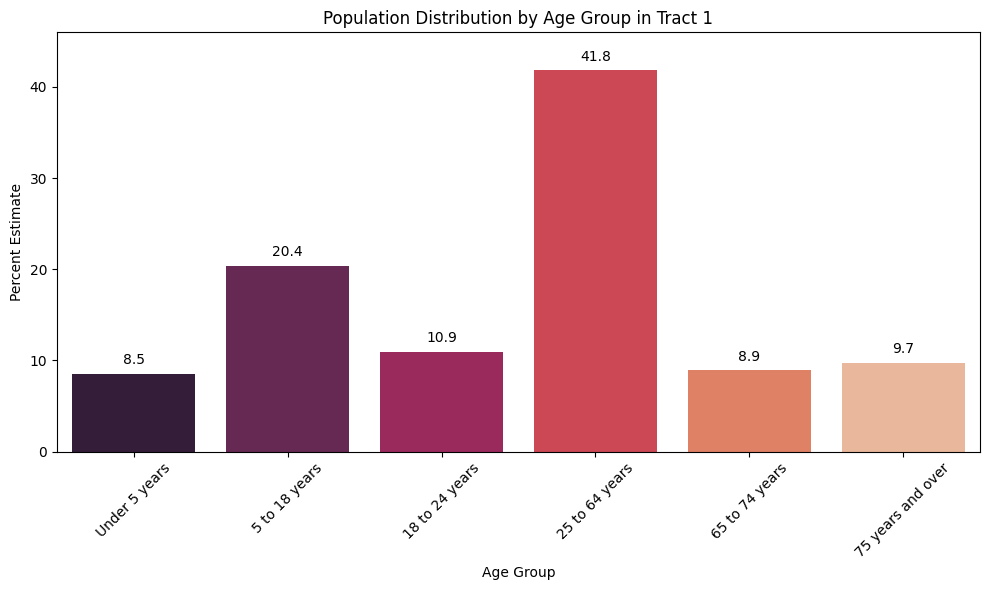

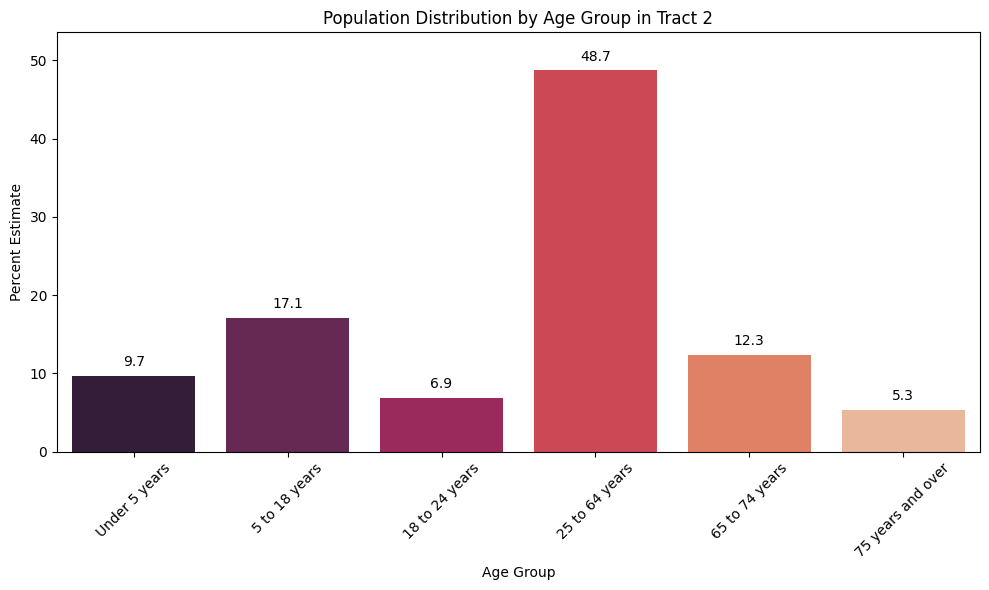

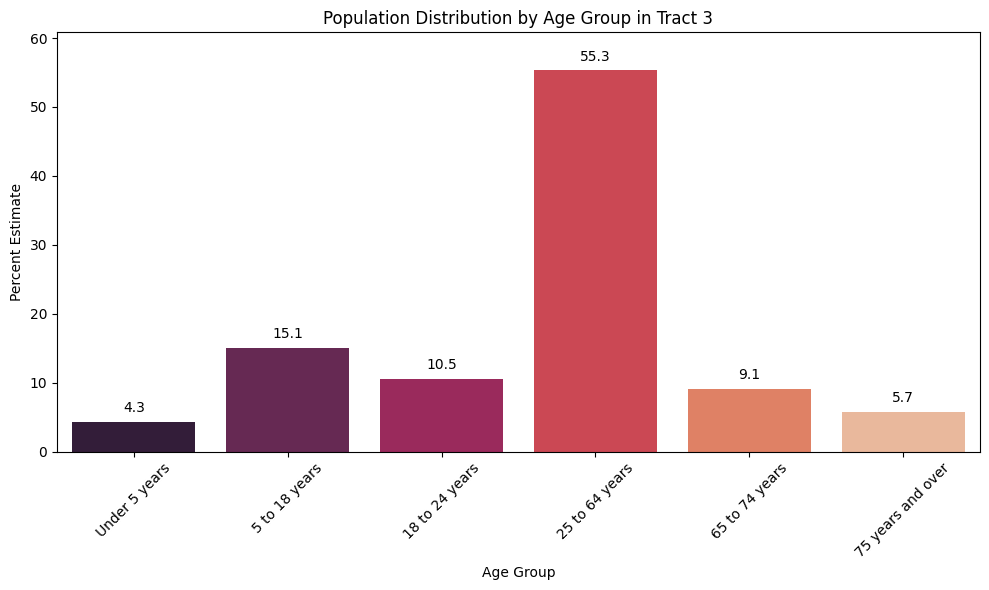

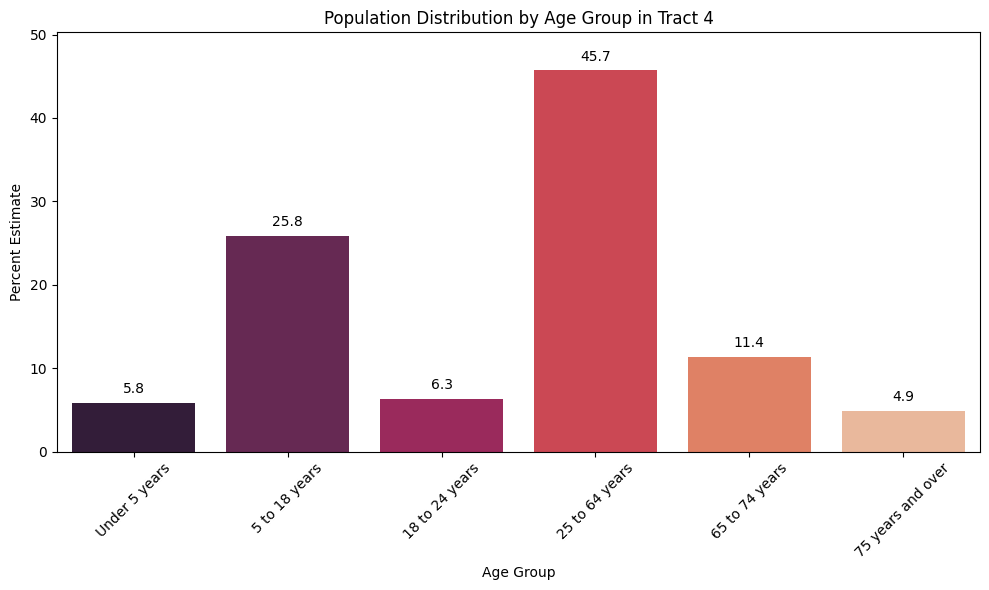

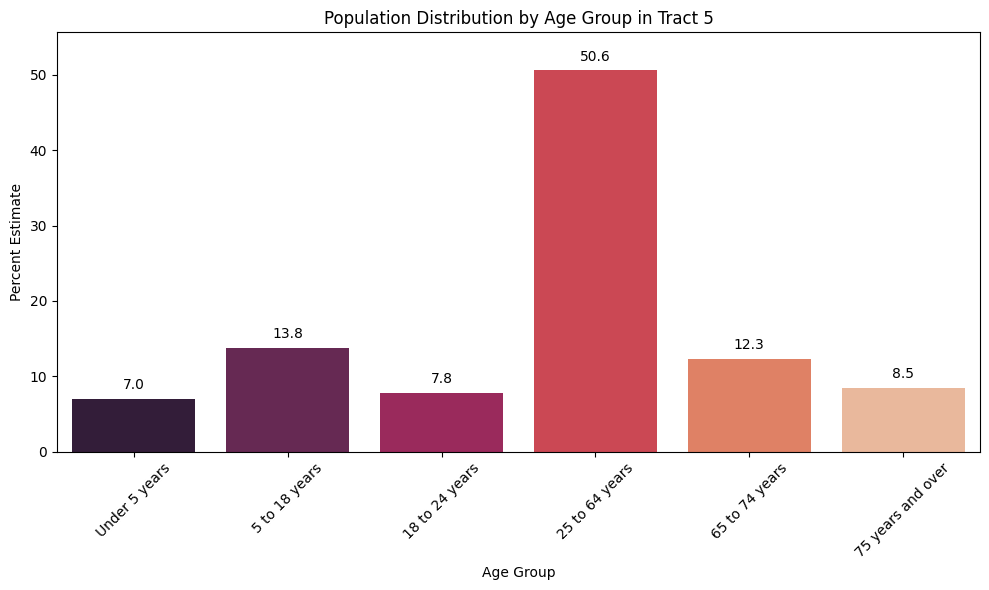

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# File path where CSV files are stored
directory_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\age_sex"
files = [os.path.join(directory_path, f) for f in os.listdir(directory_path) if f.endswith('.csv')]

# Process each file
for file_path in files:
    data = clean_csv_data(file_path)
    tract_number = file_path.split('_')[-1].split('.')[0]  # Extract tract number from filename

    # Update age groups based on the new column names
    age_groups = {
        'Under 5 years': ['Under 5 years'],
        '5 to 18 years': ['5 to 9 years', '10 to 14 years', '15 to 17 years'],
        '18 to 24 years': ['18 to 24 years'],
        '25 to 64 years': ['25 to 29 years', '30 to 34 years', '35 to 39 years', '40 to 44 years', '45 to 49 years', '50 to 54 years', '55 to 59 years', '60 to 64 years'],
        '65 to 74 years': ['65 to 69 years', '70 to 74 years'],
        '75 years and over': ['75 years and over']
    }

    # Aggregate data
    grouped_data = pd.Series(dtype=float)
    for group, labels in age_groups.items():
        column_name = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent!!Estimate'
        group_sum = data.loc[data['Label (Grouping)'].isin(labels), column_name].sum()
        grouped_data[group] = group_sum

    # Create a new figure for each plot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=grouped_data.index, y=grouped_data.values, hue=grouped_data.index, palette=sns.color_palette("rocket"), dodge=False, legend=False)
    plt.xlabel('Age Group')
    plt.ylabel('Percent Estimate')
    plt.title(f'Population Distribution by Age Group in Tract {tract_number}')
    plt.xticks(rotation=45)

    # Add annotations
    for bar in plt.gca().patches:
        plt.gca().annotate(format(bar.get_height(), '.1f'),
                           (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                           ha='center', va='bottom',
                           xytext=(0, 5),
                           textcoords='offset points')

    # Adjust the top margin to prevent clipping
    plt.gca().margins(y=0.1)  # 10% margin on the top
    plt.tight_layout()
    plt.show()


The series of graphs display the population distribution by age group across five different tracts, highlighting varying demographic profiles:

- **Tract 1** shows a significant portion of the population in the 25-64 years age group, accounting for 41.8% of the tract's demographic. This suggests a predominately working-age population, with relatively balanced proportions across other age groups.

- **Tract 2** has a larger segment of the population in the 25-64 years age group, even more prominent at 48.7%. Young adults (18-24 years) and the elderly (65-74 years) represent smaller but significant proportions, indicating a mixed demographic but with a strong working-age base.

- **Tract 3** demonstrates the most pronounced concentration in the 25-64 years age group, reaching 55.3%. This tract appears to have the highest percentage of working-age residents compared to other tracts, alongside smaller, younger, and older age groups.

- **Tract 4** features a significant representation in the 25-64 years age group at 45.7%, but also notable is the 18-24 years age group at 25.8%, suggesting a considerable presence of young adults, possibly influenced by educational institutions or entry-level workforce engagements.

- **Tract 5** mirrors the trend with 50.6% of its population in the 25-64 years age group. This tract, however, also shows a substantial proportion of individuals aged 5 to 17 years at 13.8%, indicating a higher presence of families with school-age children.

### Summary
Across all tracts, the 25-64 years age group consistently forms the majority, underlining a robust working-age population. However, variances in the proportions of younger and older age groups across tracts suggest diverse community structures, from younger, possibly student populations in Tract 4 to more family-oriented demographics in Tract 5. These insights are critical for urban planning, resource allocation, and community services development tailored to each tract's specific needs.


<a name="1b"></a>
### **Population Distribution in Henry County by Age Group**

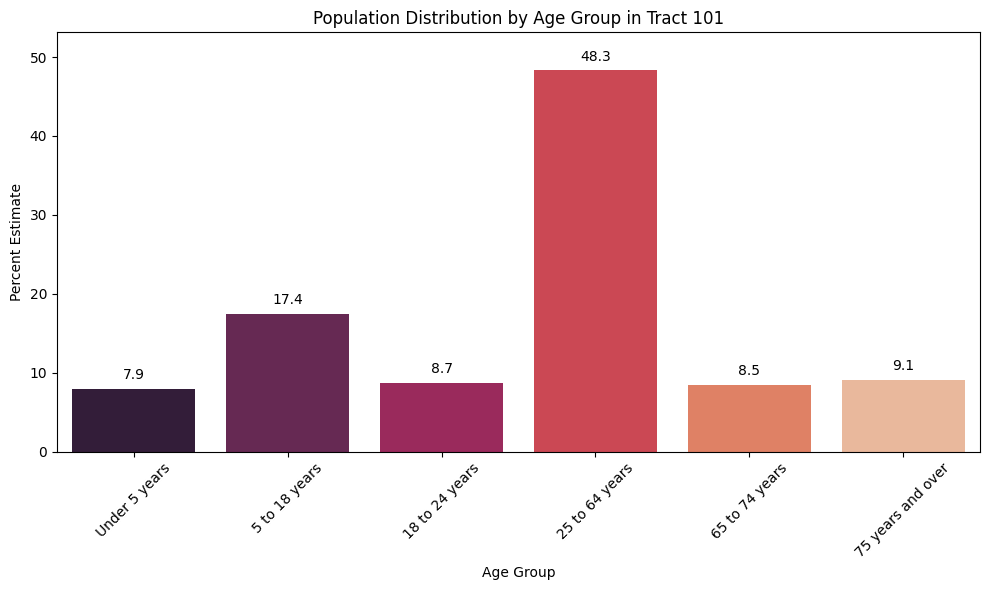

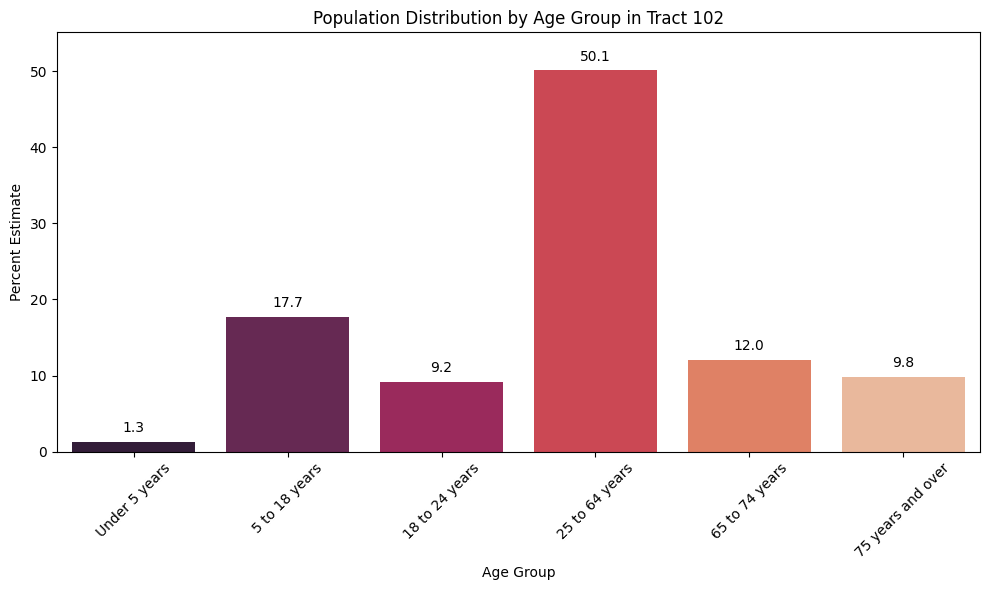

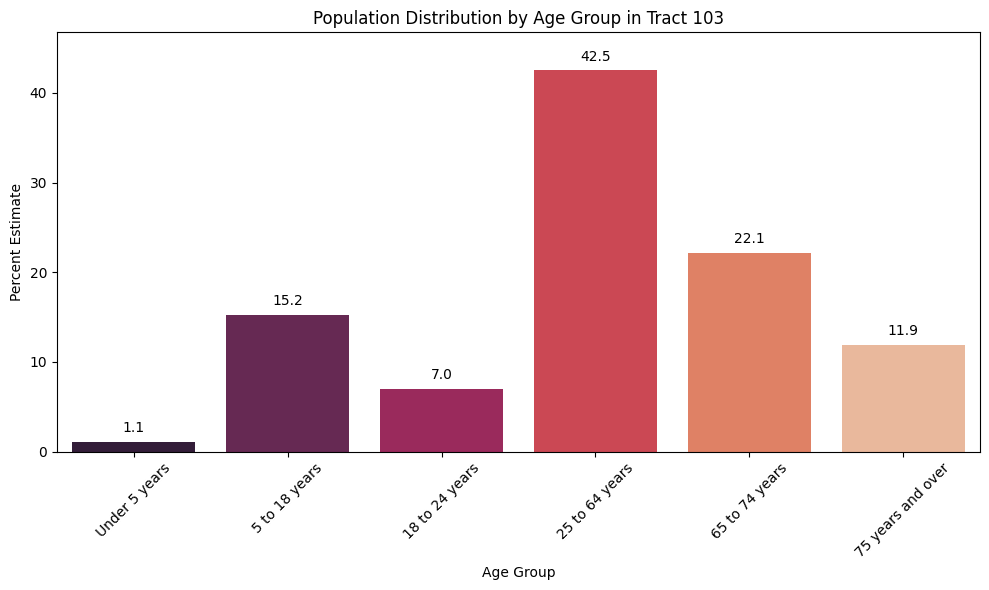

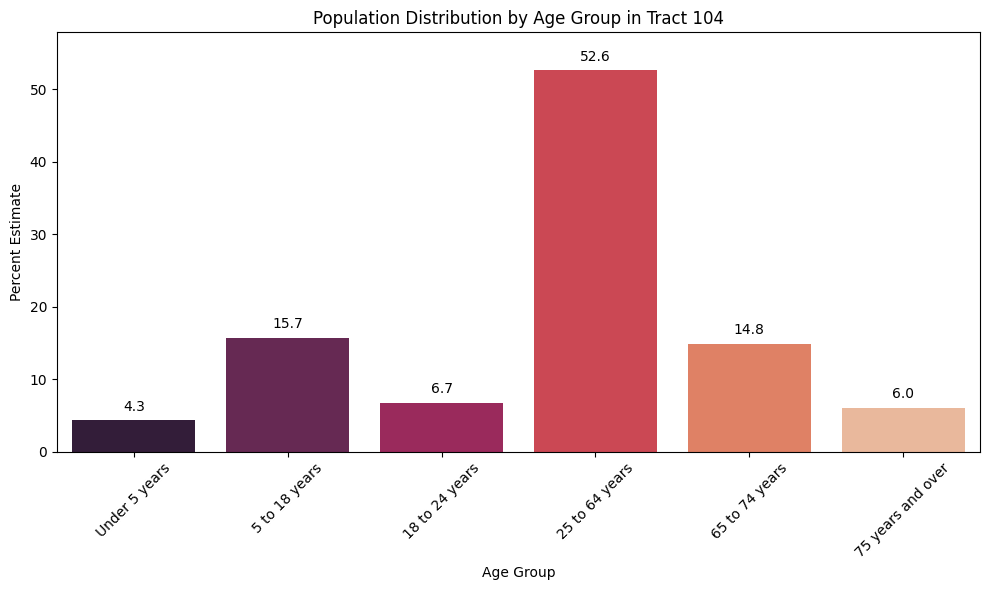

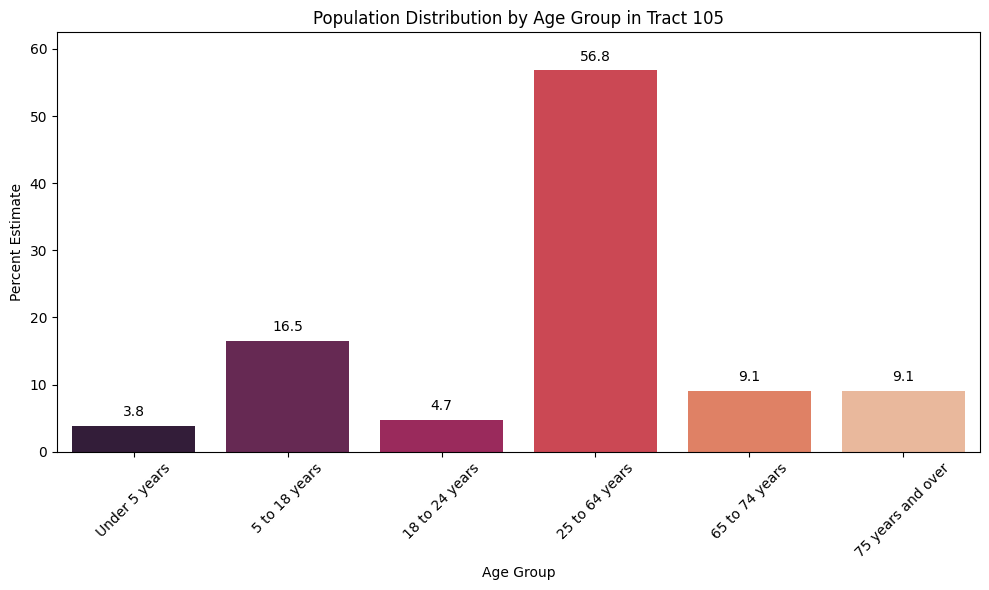

...

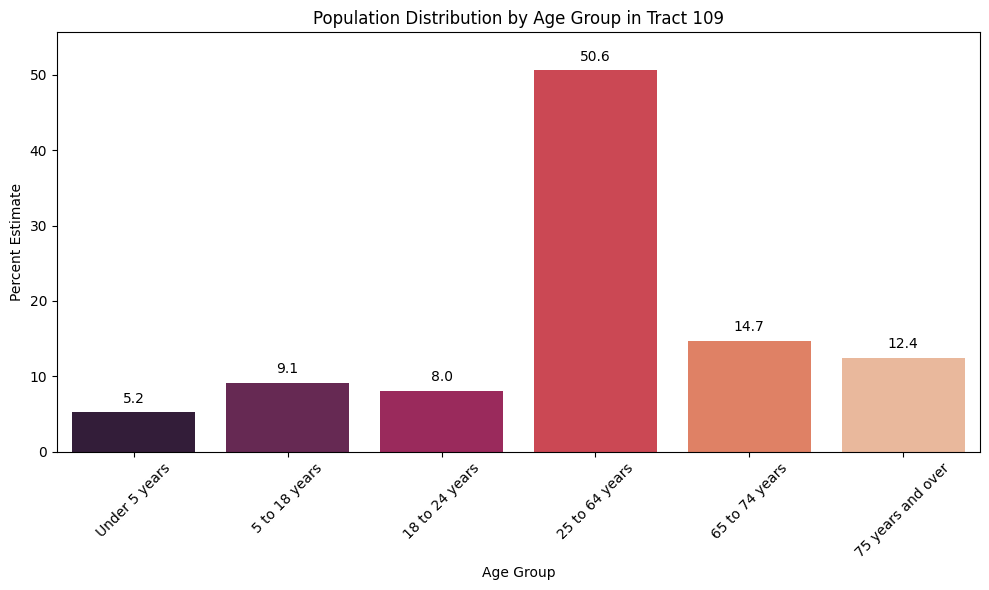

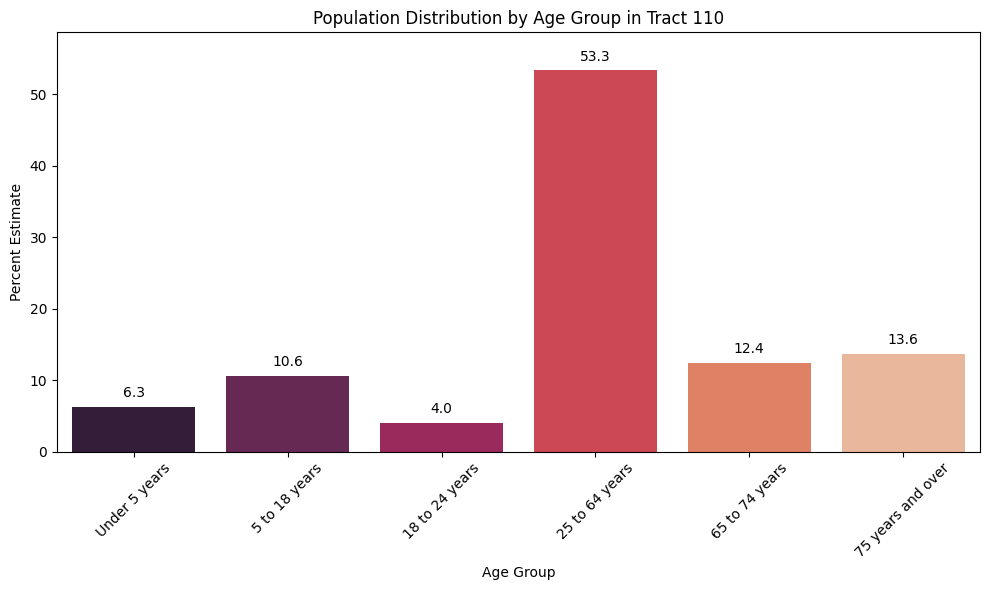

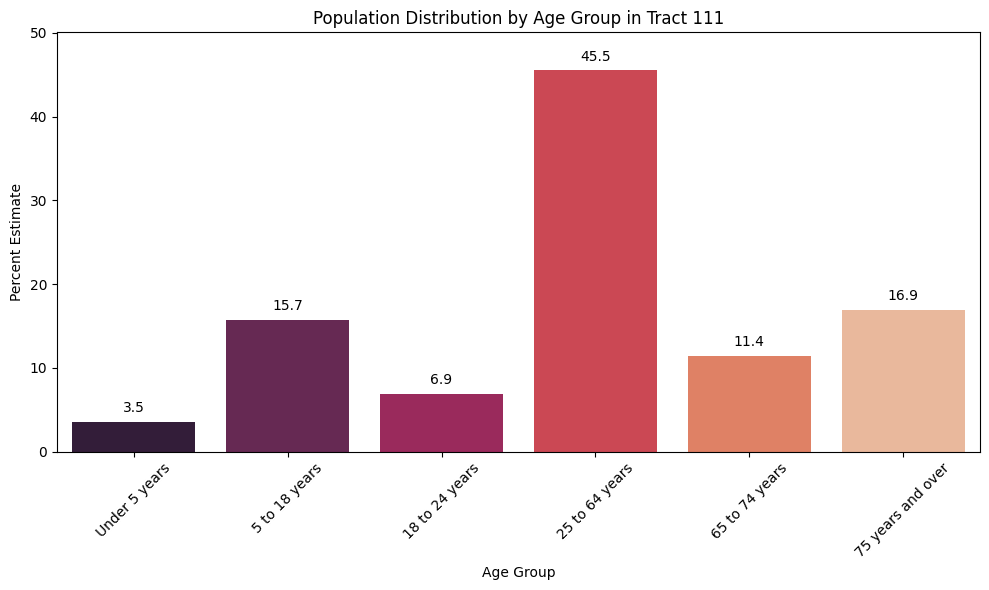

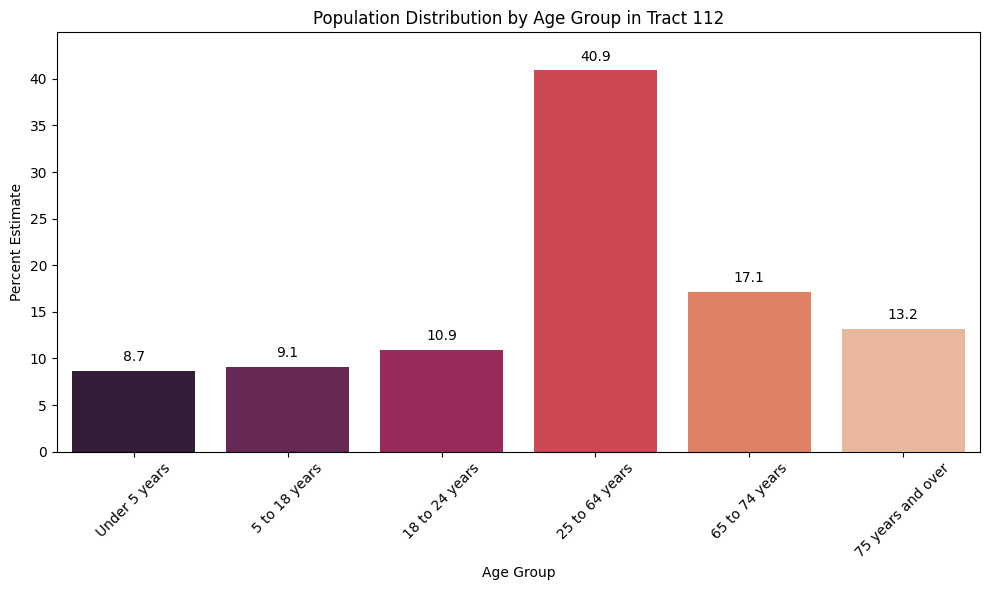

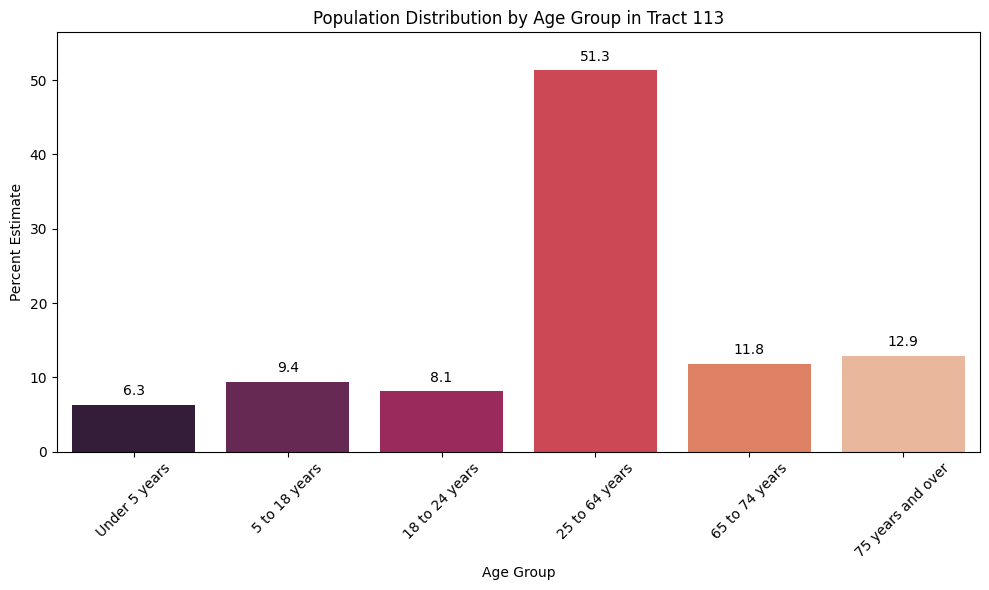

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# File path where CSV files are stored
directory_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry"
files = [os.path.join(directory_path, f) for f in os.listdir(directory_path) if f.endswith('.csv')]

# Process each file
for file_path in files:
    data = clean_csv_data(file_path)
    tract_number = file_path.split('_')[-1].split('.')[0]  # Extract tract number from filename

    # Update age groups based on the new column names
    age_groups = {
        'Under 5 years': ['Under 5 years'],
        '5 to 18 years': ['5 to 9 years', '10 to 14 years', '15 to 17 years'],
        '18 to 24 years': ['18 to 24 years'],
        '25 to 64 years': ['25 to 29 years', '30 to 34 years', '35 to 39 years', '40 to 44 years', '45 to 49 years', '50 to 54 years', '55 to 59 years', '60 to 64 years'],
        '65 to 74 years': ['65 to 69 years', '70 to 74 years'],
        '75 years and over': ['75 years and over']
    }

    # Aggregate data
    grouped_data = pd.Series(dtype=float)
    for group, labels in age_groups.items():
        column_name = f'Census Tract {tract_number}; Henry County; Virginia!!Percent!!Estimate'
        group_sum = data.loc[data['Label (Grouping)'].isin(labels), column_name].sum()
        grouped_data[group] = group_sum

    # Create a new figure for each plot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=grouped_data.index, y=grouped_data.values, palette=sns.color_palette("rocket"), hue=grouped_data.index, dodge=False, legend=False)
    plt.xlabel('Age Group')
    plt.ylabel('Percent Estimate')
    plt.title(f'Population Distribution by Age Group in Tract {tract_number}')
    plt.xticks(rotation=45)

    # Add annotations
    for bar in plt.gca().patches:
        plt.gca().annotate(format(bar.get_height(), '.1f'),
                           (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                           ha='center', va='bottom',
                           xytext=(0, 5),
                           textcoords='offset points')

    # Adjust the top margin to prevent clipping
    plt.gca().margins(y=0.1)  # 10% margin on the top
    plt.tight_layout()
    plt.show()


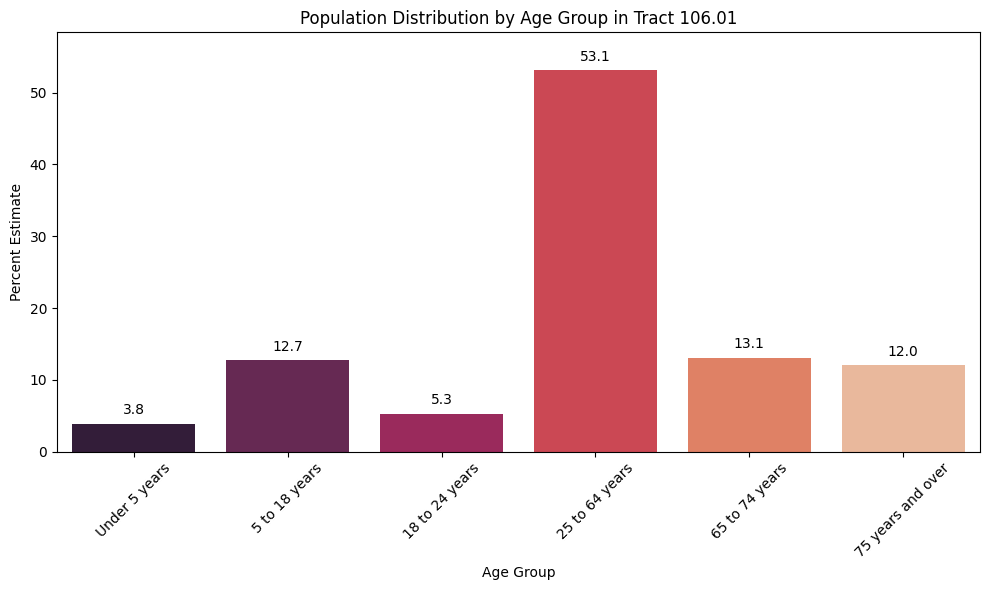

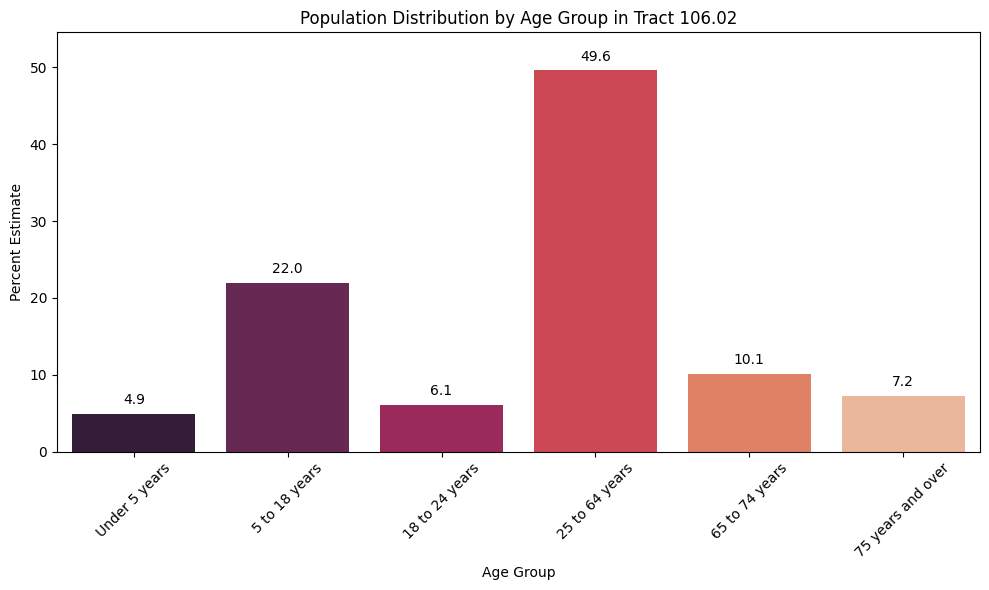

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# File paths for the CSV files
file_paths = [
    r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras\age_sex_106.01.csv",
    r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras\age_sex_106.02.csv"
]

# Process each file
for file_path in file_paths:
    data = clean_csv_data(file_path)
    tract_number = file_path.split('_')[-1].split('.')[0] + '.' + file_path.split('_')[-1].split('.')[1]  # Extract tract number from filename

    # Update age groups based on the new column names
    age_groups = {
        'Under 5 years': ['Under 5 years'],
        '5 to 18 years': ['5 to 9 years', '10 to 14 years', '15 to 17 years'],
        '18 to 24 years': ['18 to 24 years'],
        '25 to 64 years': ['25 to 29 years', '30 to 34 years', '35 to 39 years', '40 to 44 years', '45 to 49 years', '50 to 54 years', '55 to 59 years', '60 to 64 years'],
        '65 to 74 years': ['65 to 69 years', '70 to 74 years'],
        '75 years and over': ['75 years and over']
    }

    # Create the appropriate column name based on the tract number
    column_name = f'Census Tract {tract_number}; Henry County; Virginia!!Percent!!Estimate'

    # Aggregate data
    grouped_data = pd.Series(dtype=float)
    for group, labels in age_groups.items():
        group_sum = data.loc[data['Label (Grouping)'].isin(labels), column_name].sum()
        grouped_data[group] = group_sum

    # Create a new figure for each plot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=grouped_data.index, y=grouped_data.values, palette=sns.color_palette("rocket"), hue=grouped_data.index, dodge=False, legend=False)
    plt.xlabel('Age Group')
    plt.ylabel('Percent Estimate')
    plt.title(f'Population Distribution by Age Group in Tract {tract_number}')
    plt.xticks(rotation=45)

    # Add annotations
    for bar in plt.gca().patches:
        plt.gca().annotate(format(bar.get_height(), '.1f'),
                           (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                           ha='center', va='bottom',
                           xytext=(0, 5),
                           textcoords='offset points')

    # Adjust the top margin to prevent clipping
    plt.gca().margins(y=0.1)  # 10% margin on the top
    plt.tight_layout()
    plt.show()


The graphs show that in all tracts, the 25 to 64 years age group consistently has the highest population percentage, ranging from 40.9% to 56.8%, highlighting a predominant working-age population. The 5 to 18 years group is the second largest in most tracts. The under 5 years and 18 to 24 years groups generally have the smallest percentages. Notably, the 65 to 74 years and 75 years and over groups show significant variation, with higher percentages in certain tracts such as Tract 103, 108, and 111. This trend underscores smaller proportions of younger and older age groups across the tracts.

<a name="1c"></a>
### **Population Distribution in Martinsville City by Racial Group**

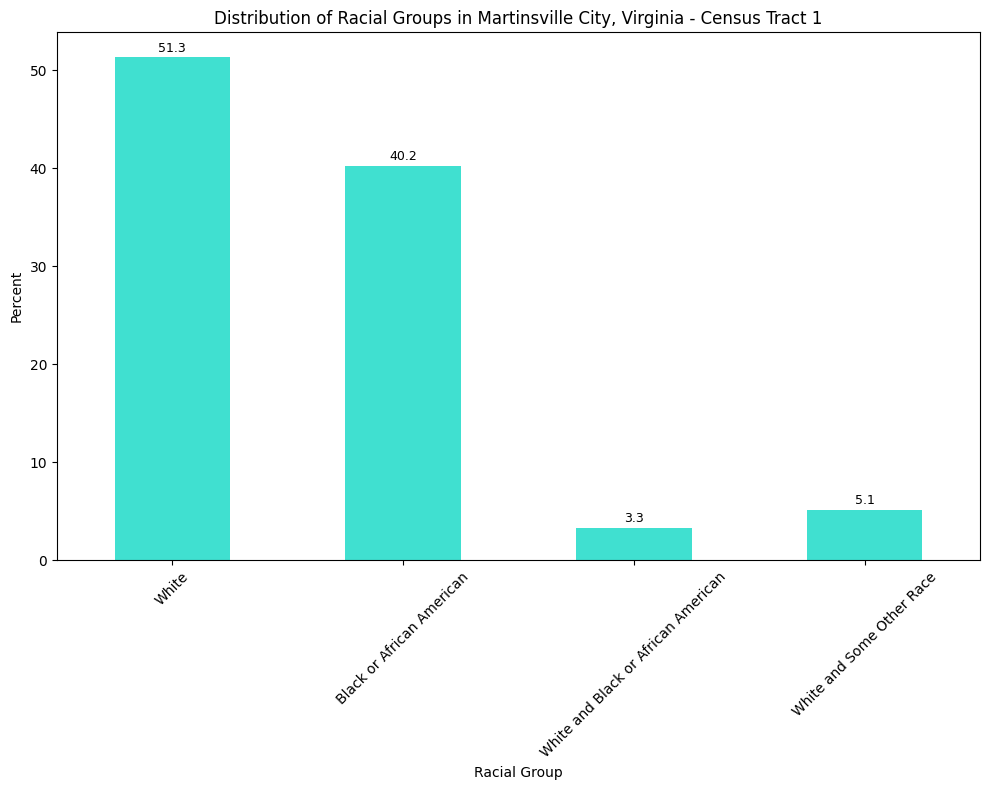

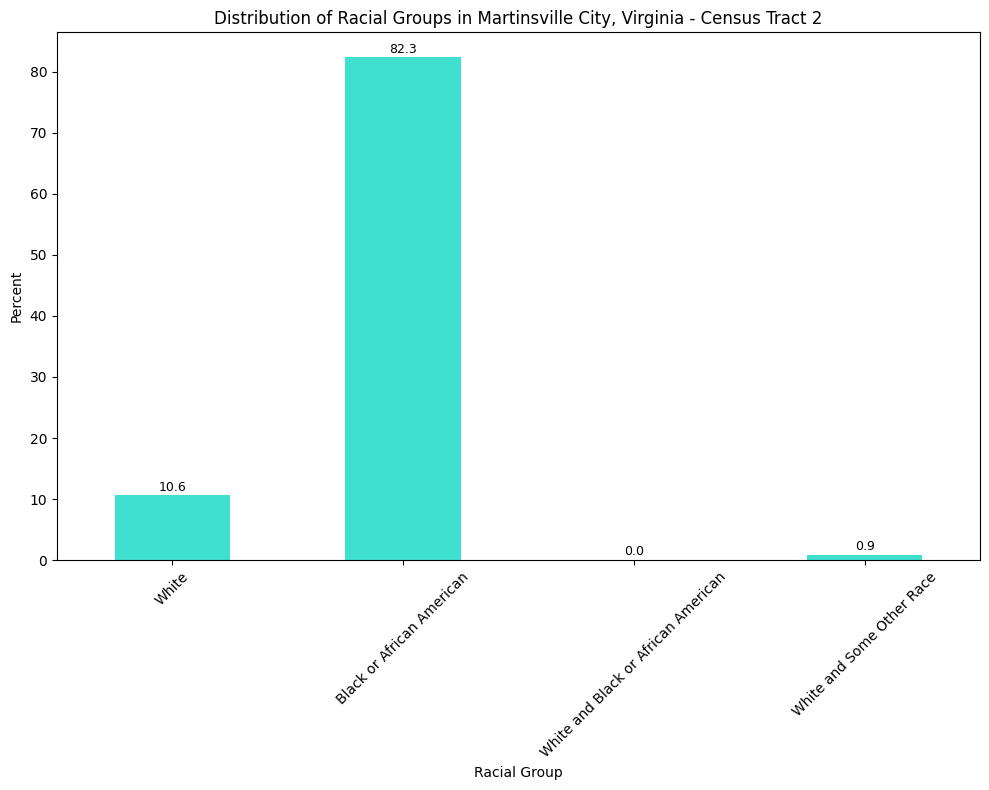

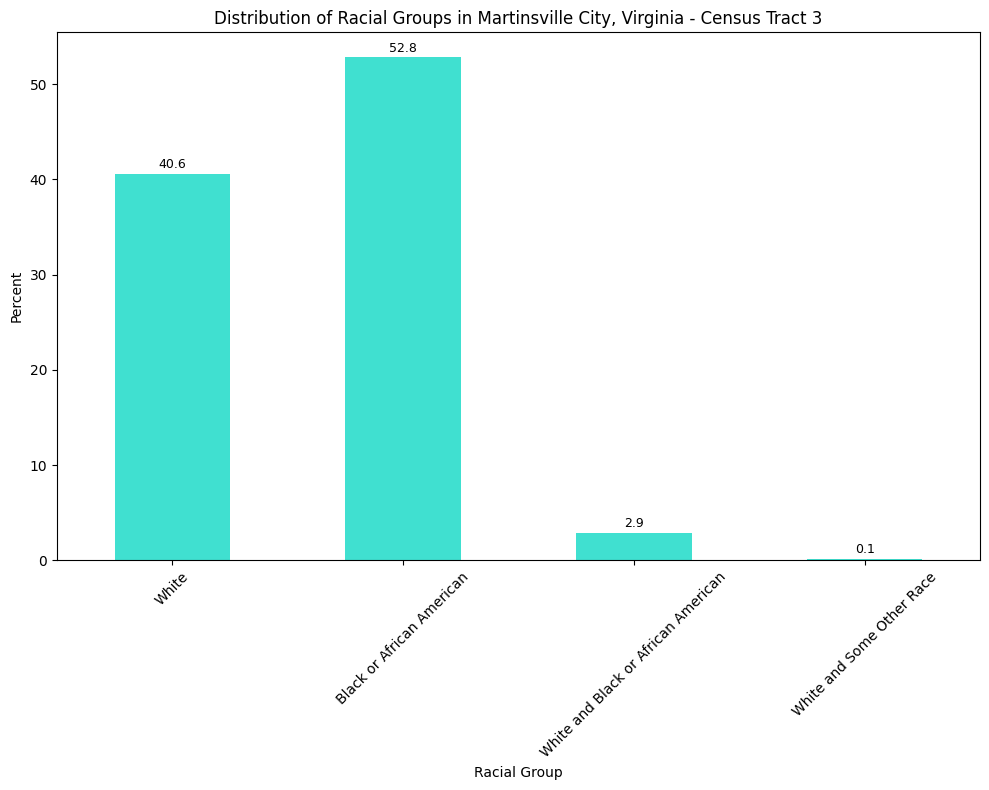

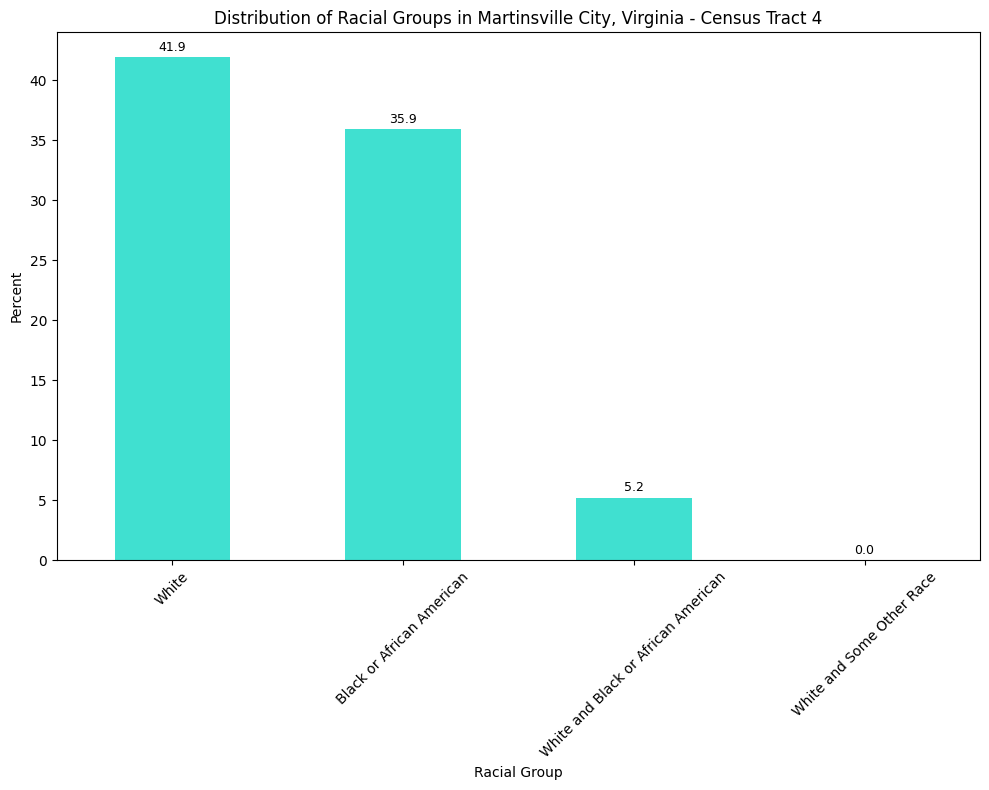

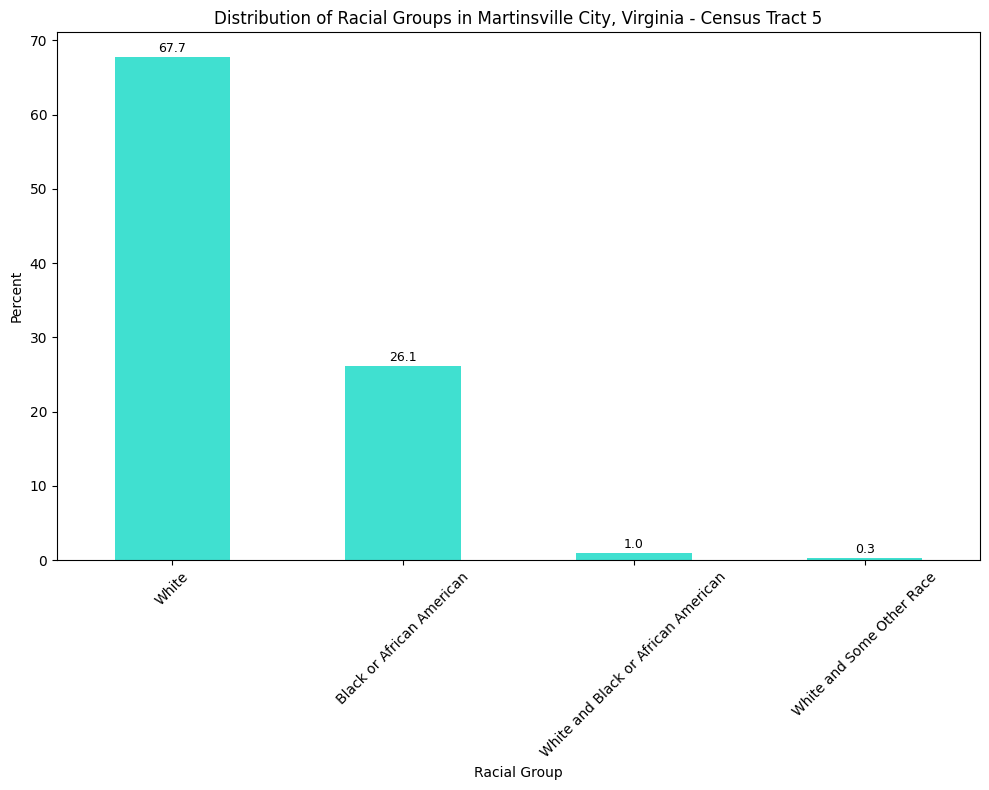

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\race'
file_names = [f'age_sex_race_{i}.csv' for i in range(1, 6)]

# Define the racial groups of interest
racial_groups = [
    'White',
    'Black or African American',
    'White and Black or African American',
    'White and Some Other Race'
]

for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name
    tract_number = file_name.split('_')[-1].split('.')[0]
    percent_column = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(10, 8))
    grouped_racial_data.plot(kind='bar', color='turquoise')
    plt.xlabel('Racial Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Racial Groups in Martinsville City, Virginia - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The bar charts depict the racial composition across five different census tracts in Martinsville City, illustrating diverse demographic distributions:

- **Tract 1** features a balanced distribution between White and Black or African American populations, with a notable percentage of mixed-race individuals.
- **Tract 2** is predominantly Black or African American, comprising over 80% of the population, with minimal representation from other racial groups.
- **Tract 3** shows a closer balance with slightly more Black or African American individuals than White, alongside a very small percentage of other racial mixes.
- **Tract 4** reveals a nearly even split between White and Black or African American populations, with a small percentage identifying as White and Black or African American.
- **Tract 5** is heavily skewed towards White individuals, making up nearly 70% of the population, followed by a significant Black or African American community.

These distributions provide insight into the varied racial demographics across different parts of Martinsville City, which can have implications for community services, local policies, and demographic studies.


<a name="1d"></a>
### **Population Distribution in Martinsville City by Racial Group (Hispanic/Latino)**

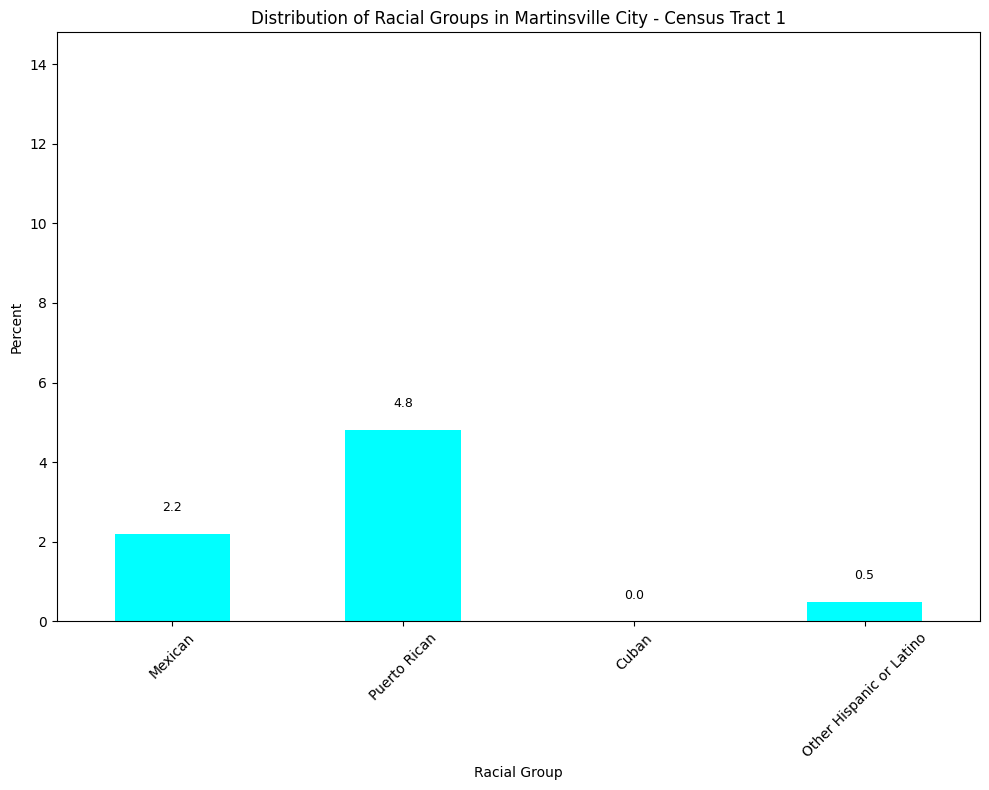

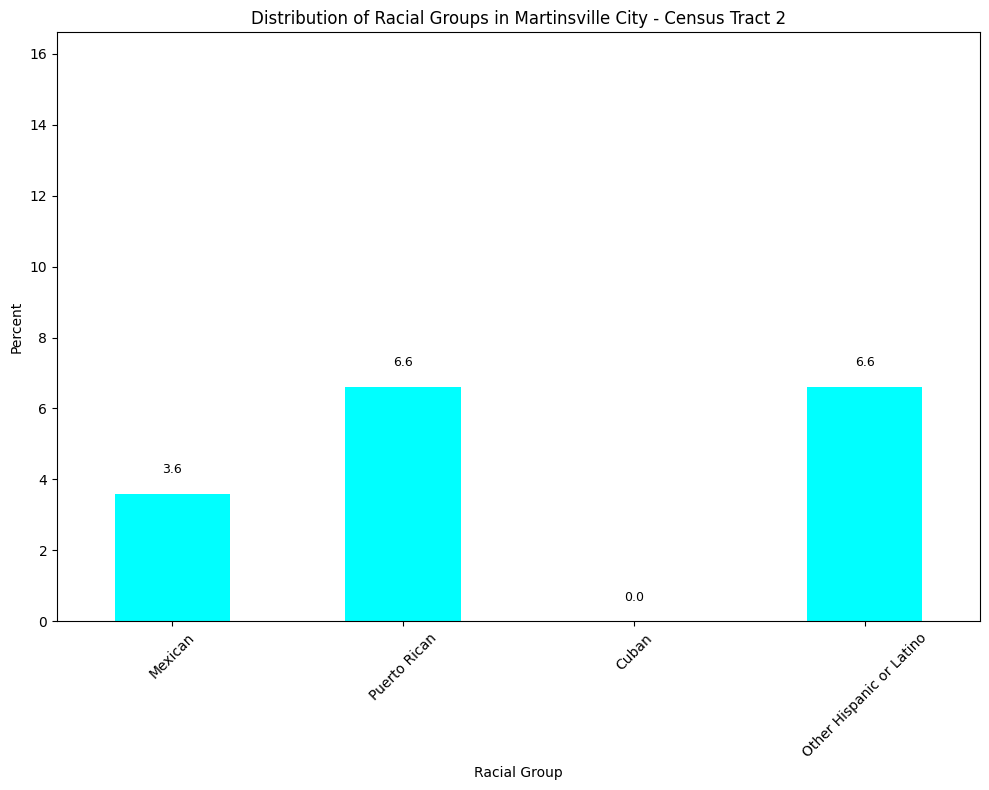

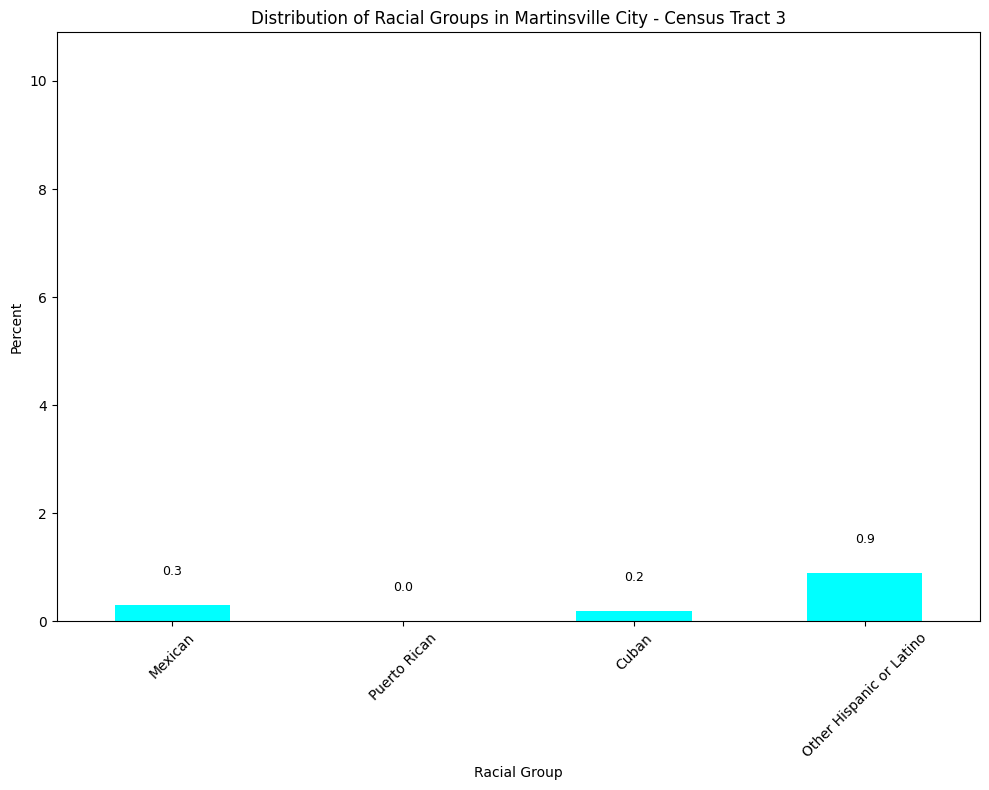

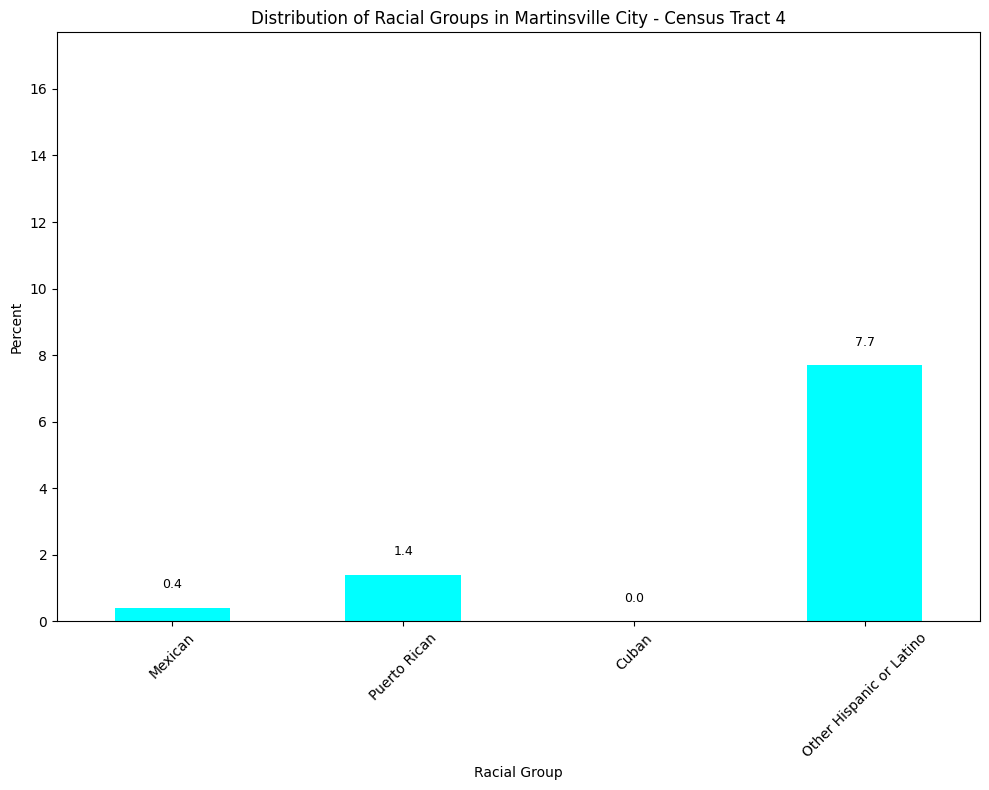

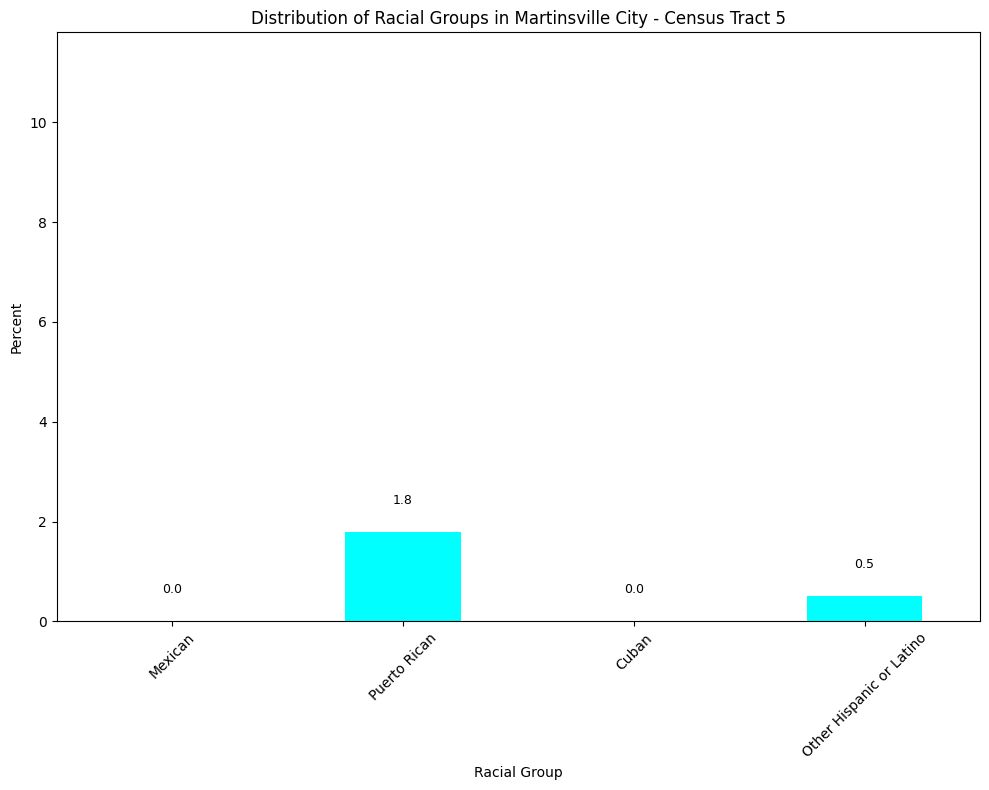

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\race'
file_names = [f'age_sex_race_{i}.csv' for i in range(1, 6)]

# Define the racial groups of interest
racial_groups = [
    'Mexican',
    'Puerto Rican',
    'Cuban',
    'Other Hispanic or Latino'
]

for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name
    tract_number = file_name.split('_')[-1].split('.')[0]
    percent_column = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(10, 8))
    grouped_racial_data.plot(kind='bar', color='cyan')
    plt.xlabel('Racial Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Racial Groups in Martinsville City - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    # Dynamically adjust the upper limit of the y-axis
    max_value = grouped_racial_data.max()
    plt.ylim(0, max_value + 10)  # Add 10% to the maximum value for better visual spacing

    # Adding numbers to the top of each bar for clarity
    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.5, f'{value:.1f}', ha='center', va='bottom', fontsize=9)  # Adjust vertical position slightly

    plt.tight_layout()
    plt.show()


Each tract shows varying percentages of Hispanic or Latino groups, with notable variations in the representation of Puerto Ricans and other Hispanic or Latino groups across tracts. Tract 2 and Tract 4 exhibit a higher presence of 'Other Hispanic or Latino' which may indicate a diverse but unspecified Hispanic population.

<a name="1e"></a>
### **Population Distribution in Henry County by Racial Group**

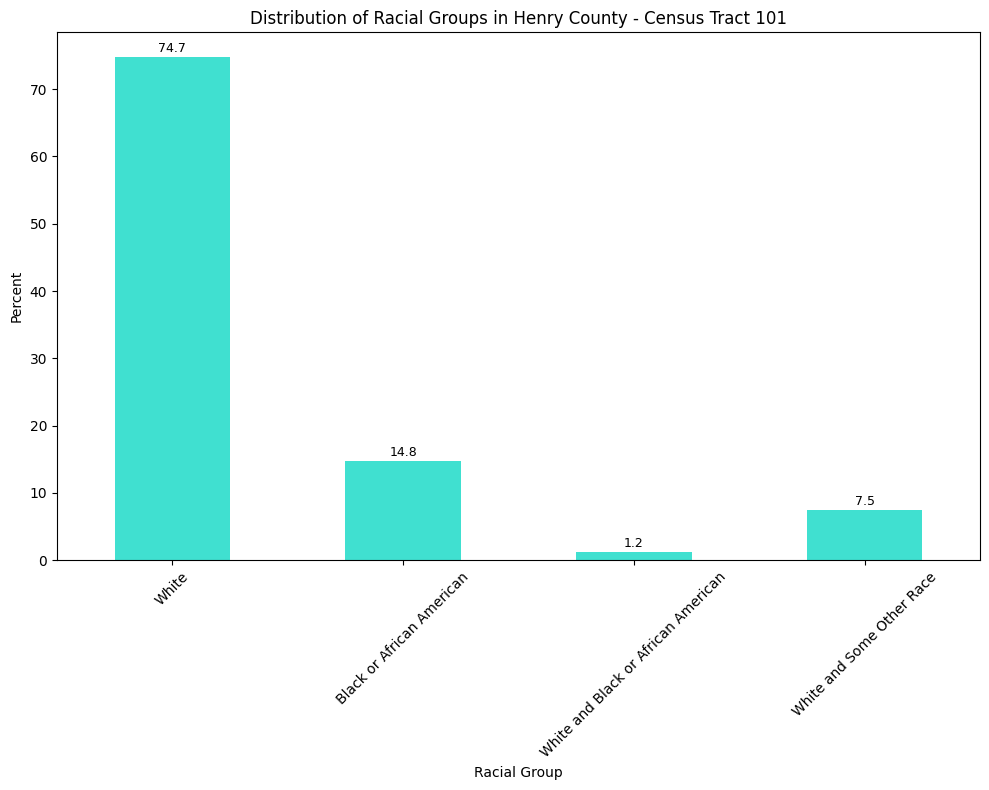

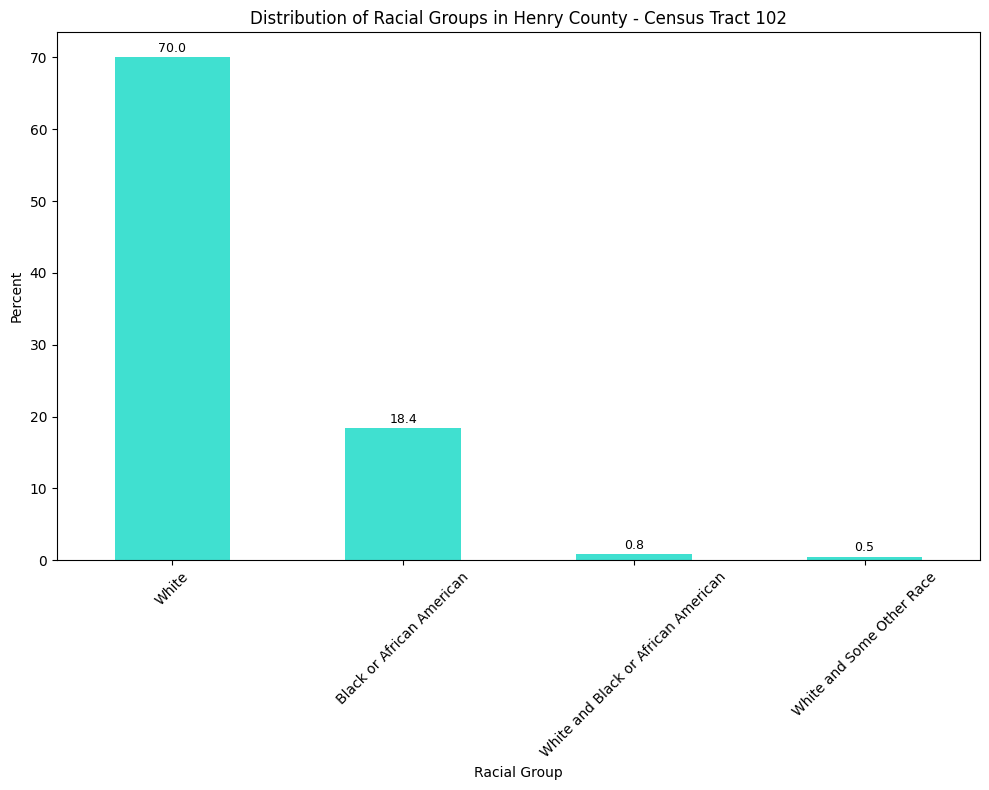

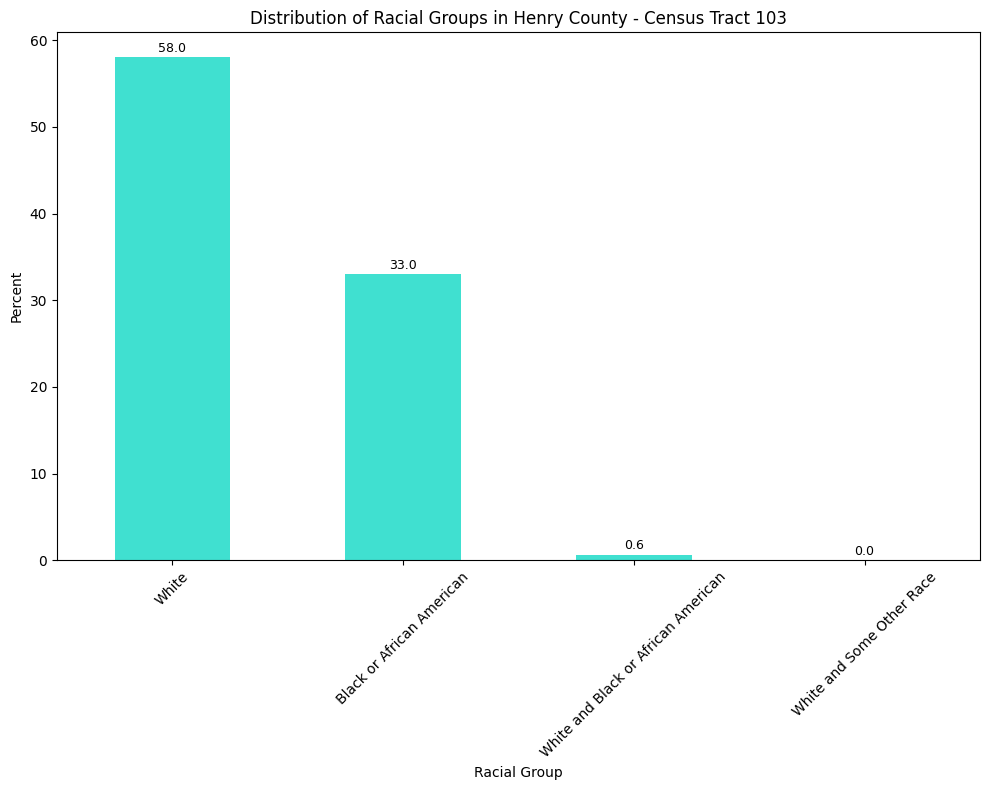

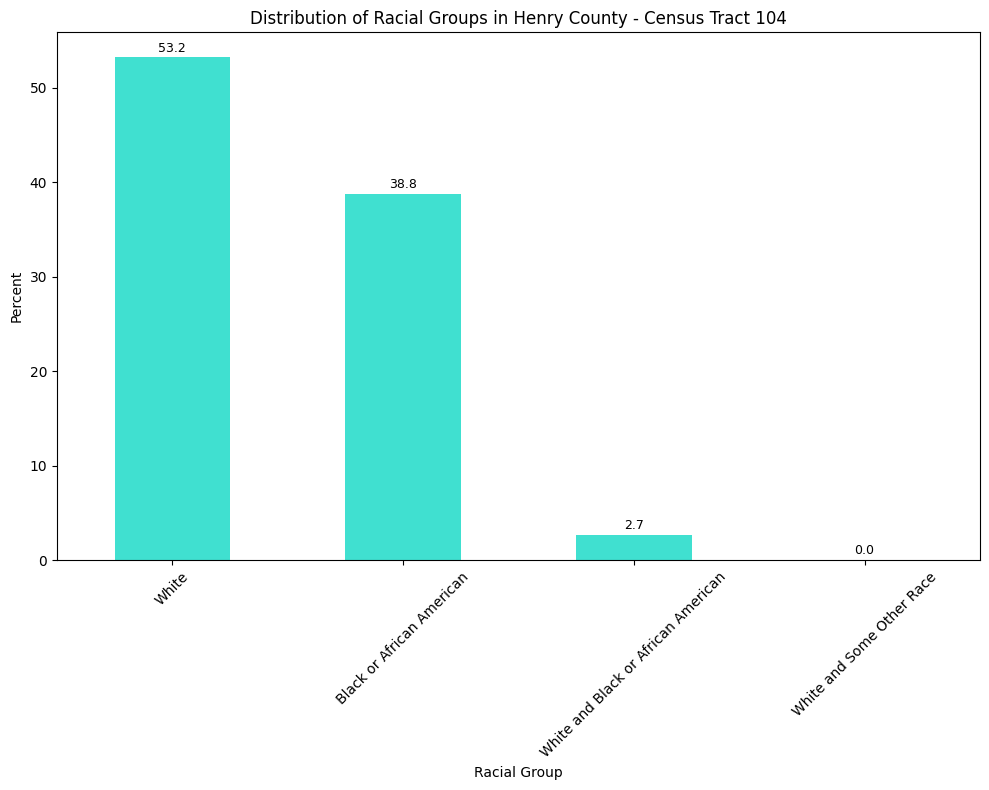

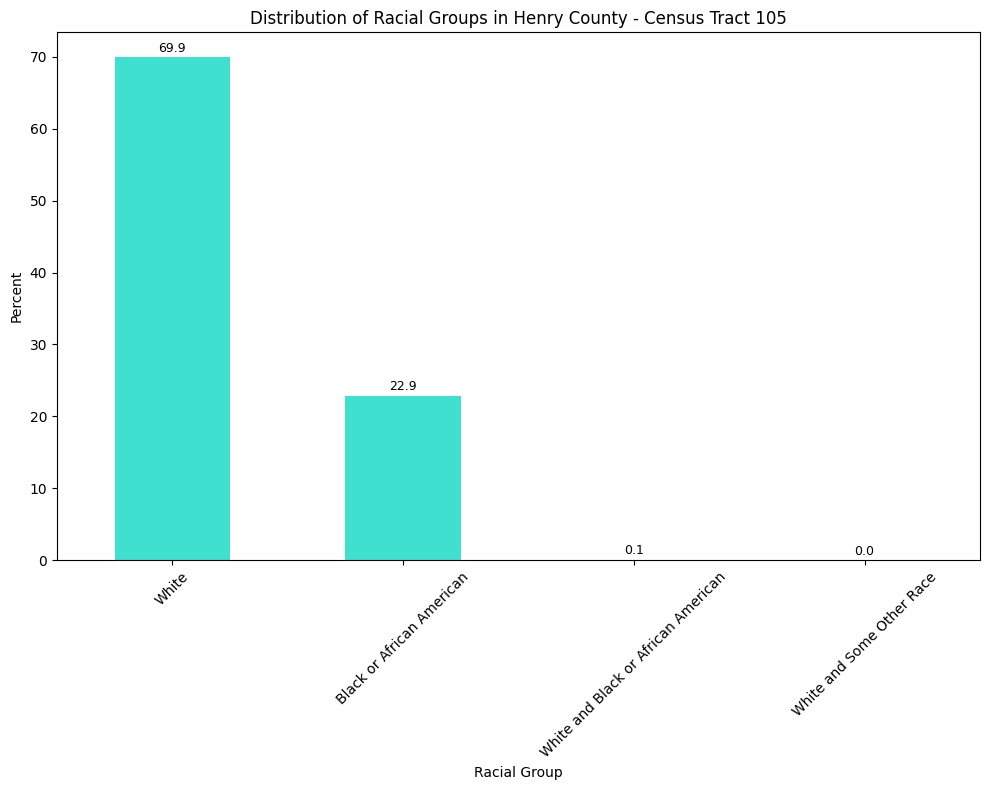

...

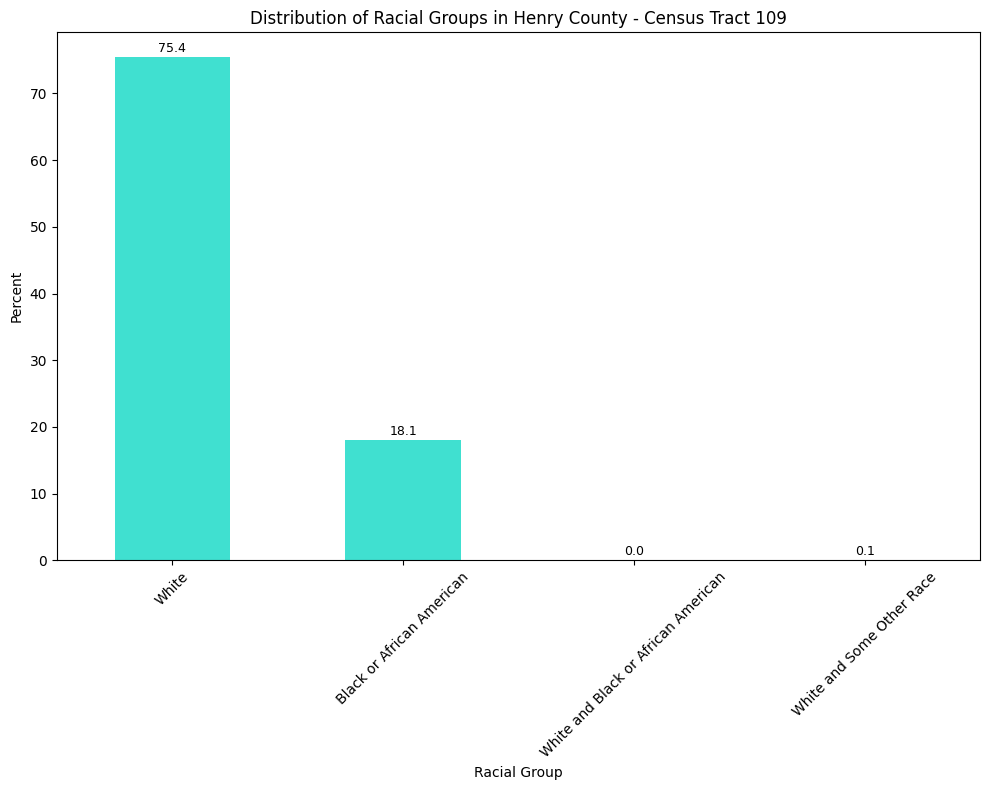

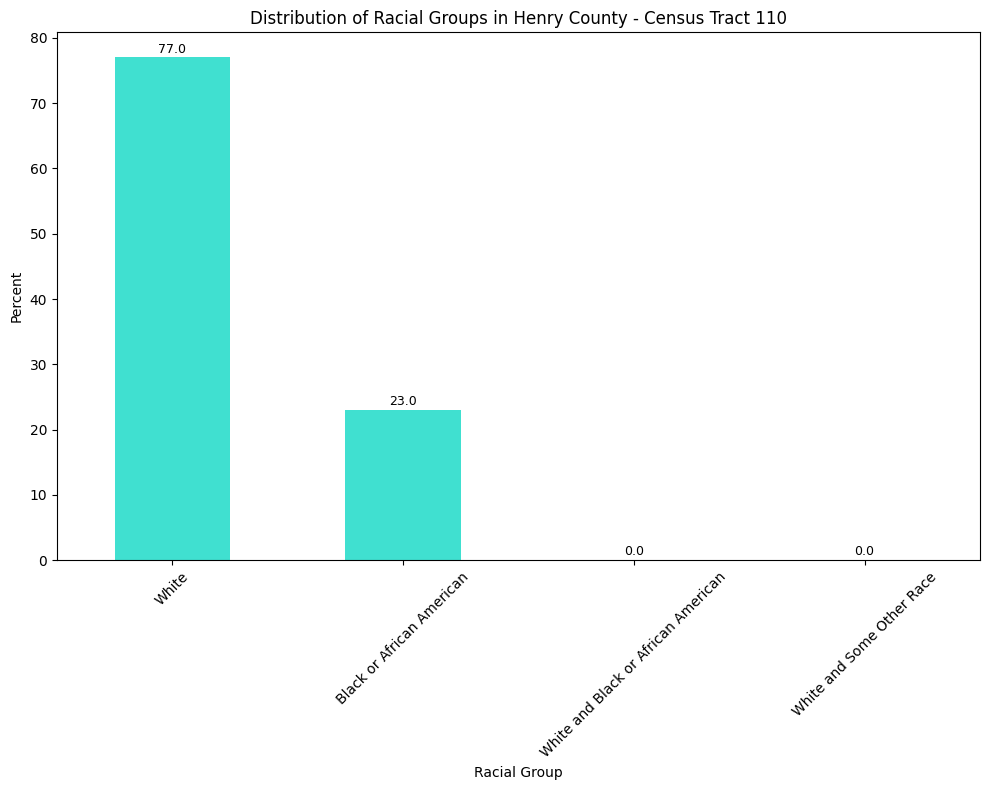

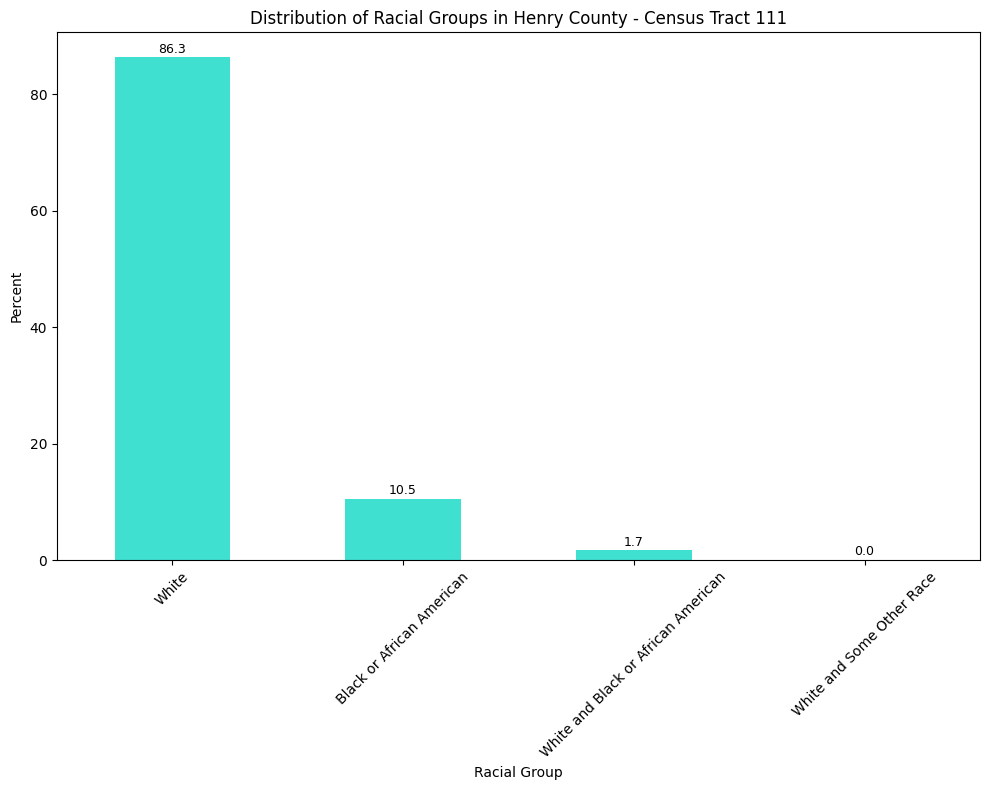

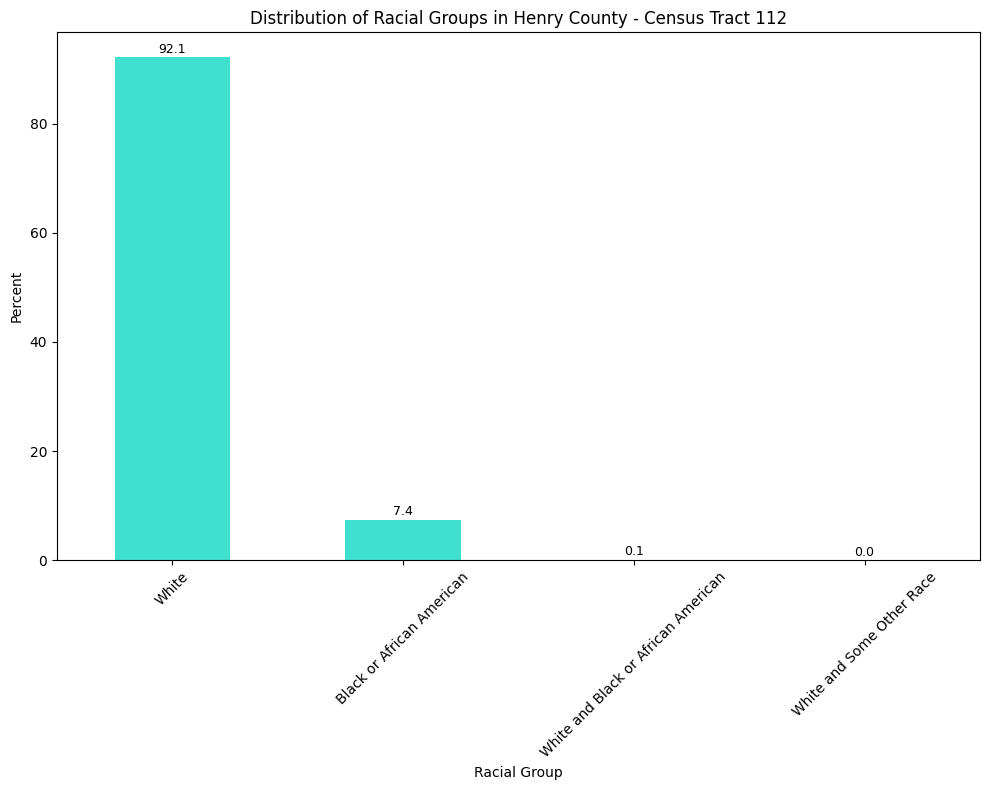

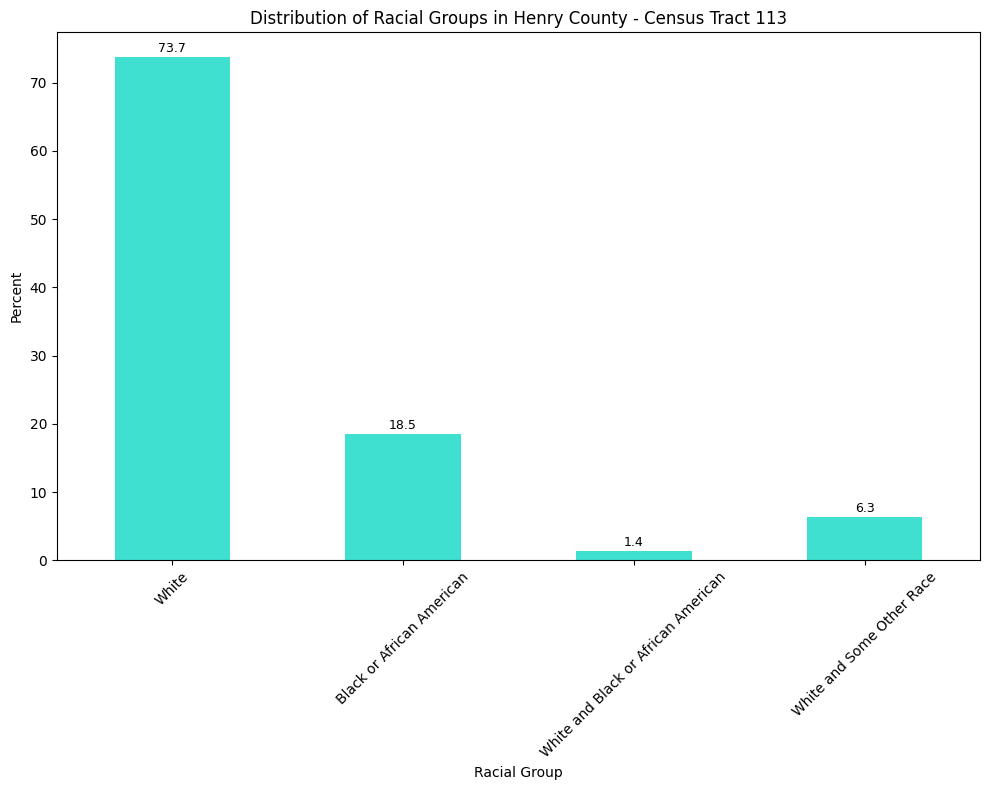

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\race'
file_names = [f'hc_race_{i}.csv' for i in range(101, 114) if i != 106]

# Define the racial groups of interest
racial_groups = [
    'White',
    'Black or African American',
    'White and Black or African American',
    'White and Some Other Race'
]

for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name
    tract_number = file_name.split('_')[-1].split('.')[0]
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(10, 8))
    grouped_racial_data.plot(kind='bar', color='turquoise')
    plt.xlabel('Racial Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Racial Groups in Henry County - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


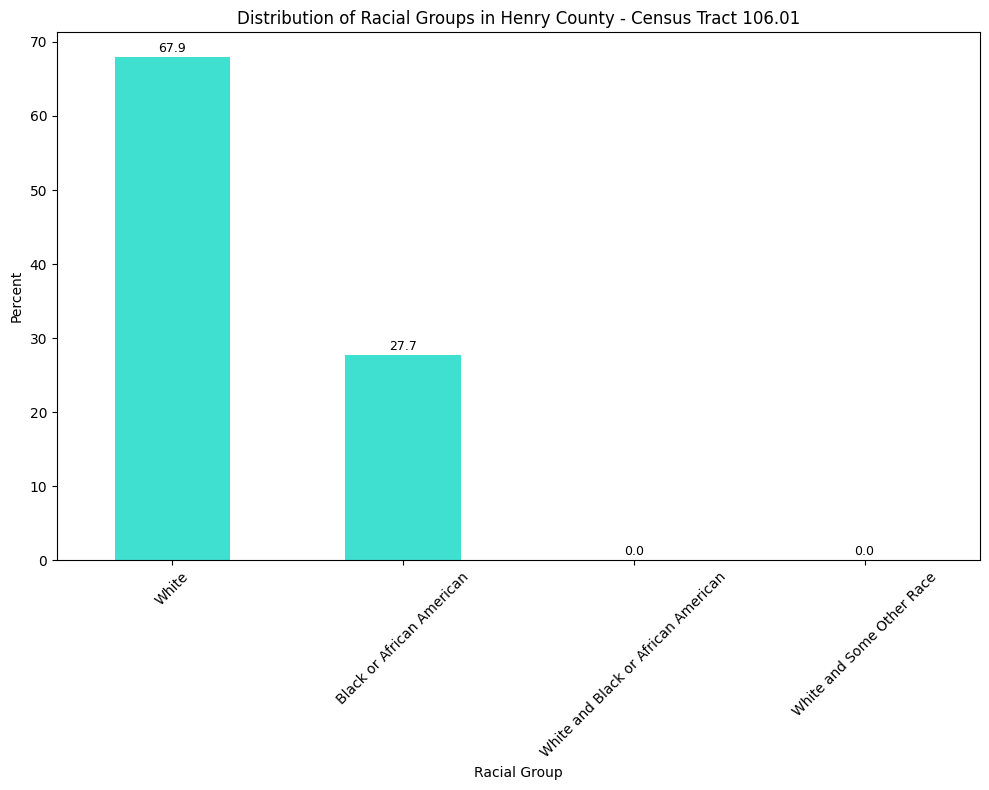

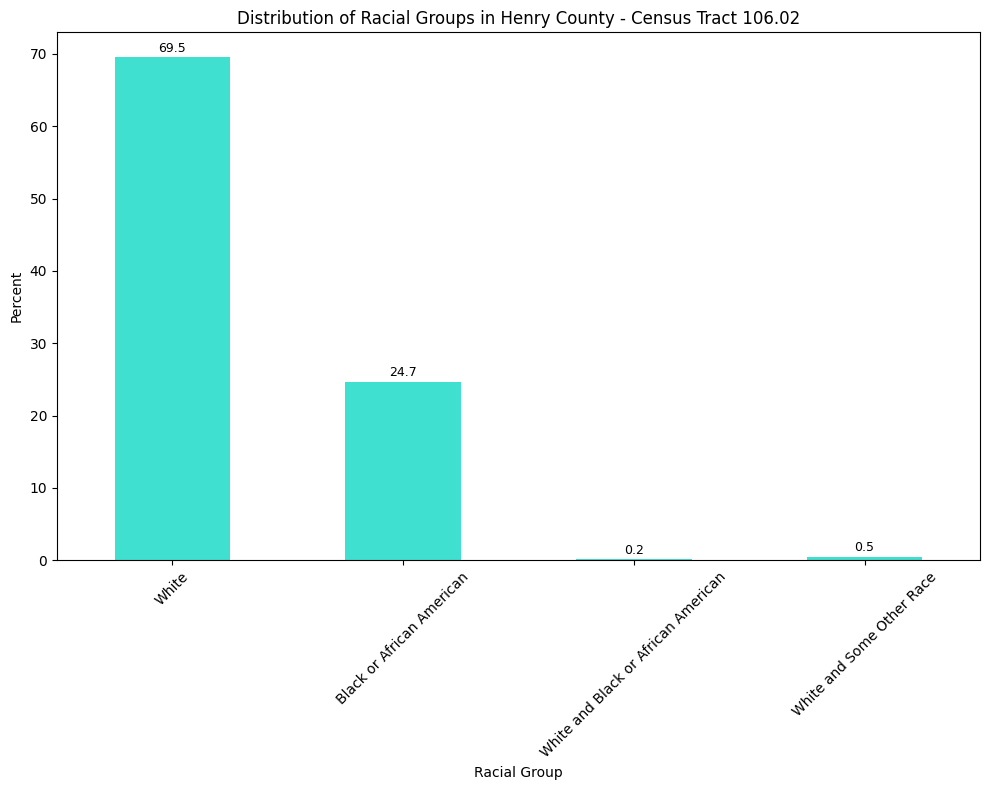

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = ['hc_race_106.01.csv', 'hc_race_106.02.csv']

# Define the racial groups of interest
racial_groups = [
    'White',
    'Black or African American',
    'White and Black or African American',
    'White and Some Other Race'
]

for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name
    tract_number = file_name.split('_')[-1].split('.')[0] + '.' + file_name.split('_')[-1].split('.')[1]
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(10, 8))
    grouped_racial_data.plot(kind='bar', color='turquoise')
    plt.xlabel('Racial Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Racial Groups in Henry County - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The graphs show the distribution of racial groups in Henry County across various census tracts. In all tracts, the White population is the largest, ranging from 53.2% to 92.1%, with notable variations where it exceeds 70% in Tracts 109, 110, 111, 112, and 113. The Black or African American population is the second largest, with percentages ranging from 7.4% to 40.0%. Smaller racial groups, including "White and Black or African American" and "White and Some Other Race," have minimal representation, generally below 7.5%. Notable variations include Tracts 103, 104, and 108, where the Black or African American population is significantly higher, at 33.0% and 40.0%. This indicates a predominantly White population with substantial African American communities in specific tracts.

<a name="1f"></a>
### **Population Distribution in Henry County by Racial Group (Hispanic/Latino)**

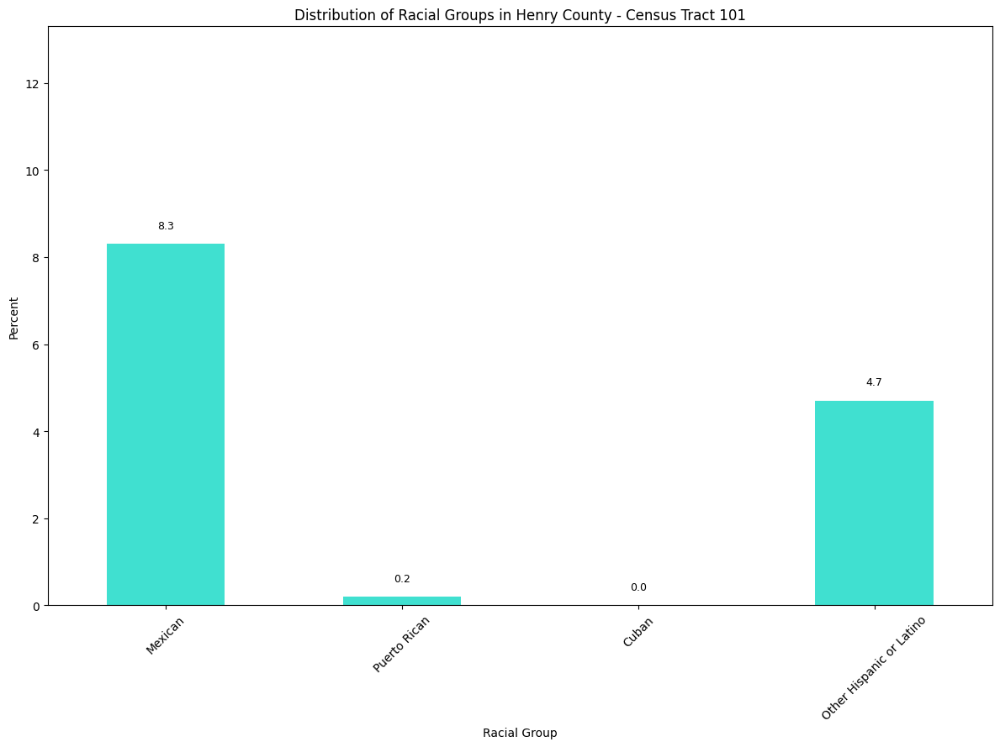

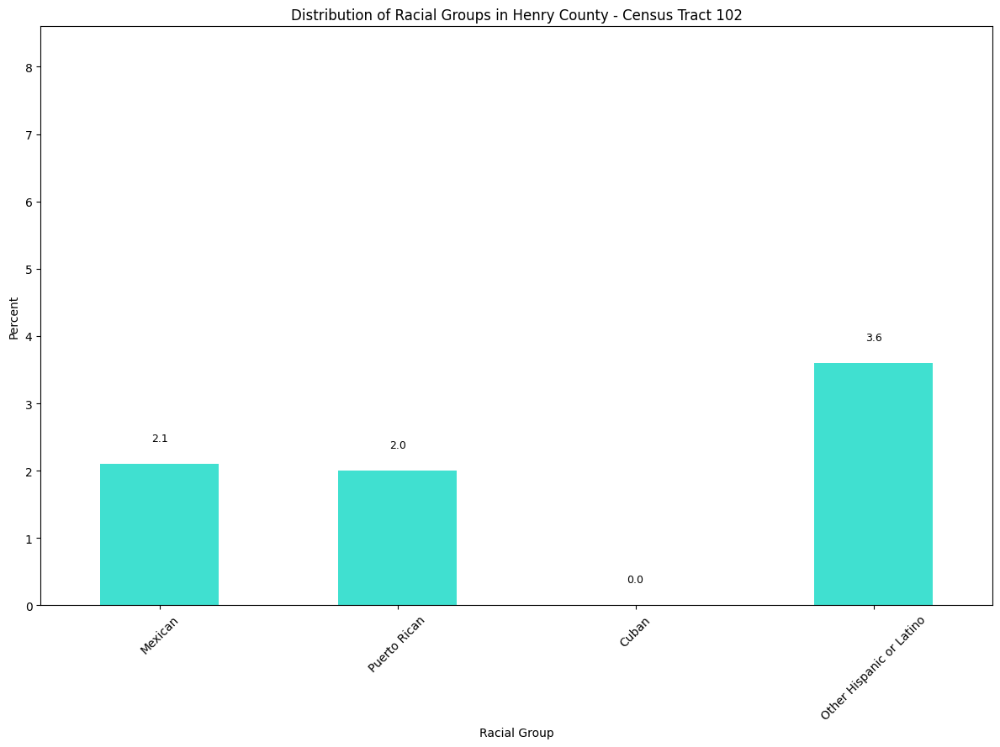

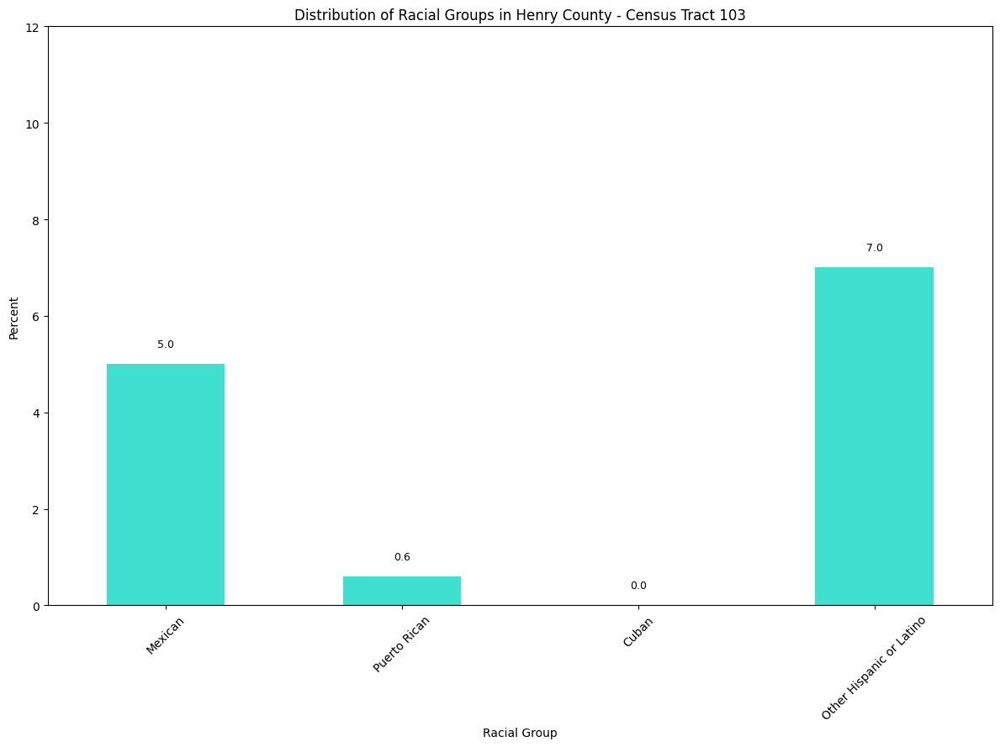

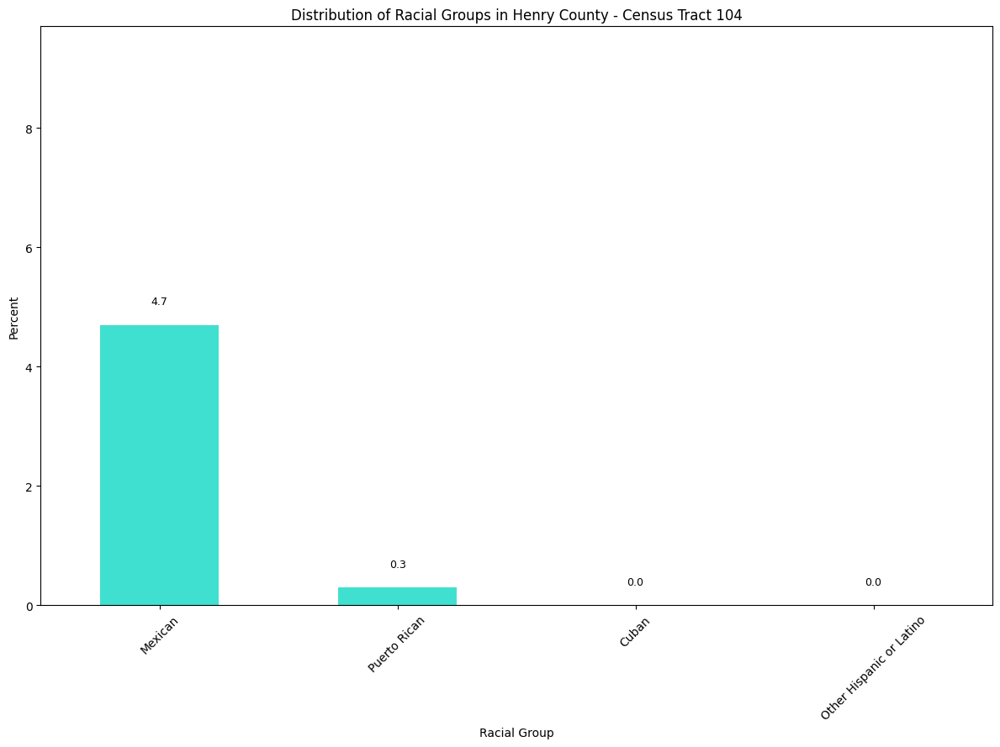

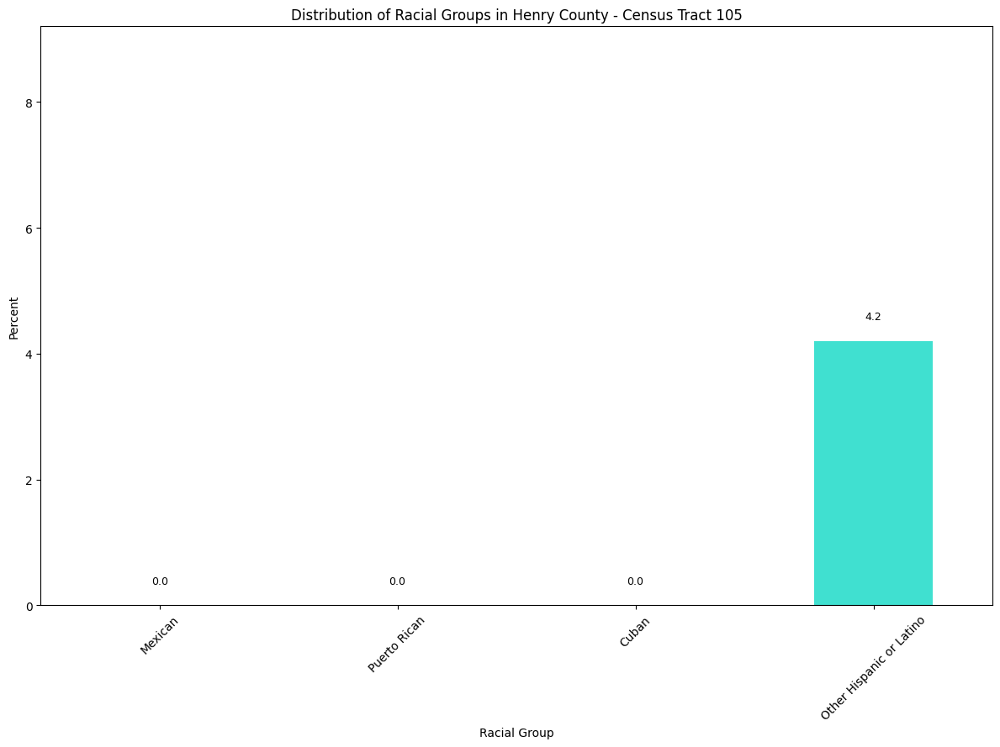

...

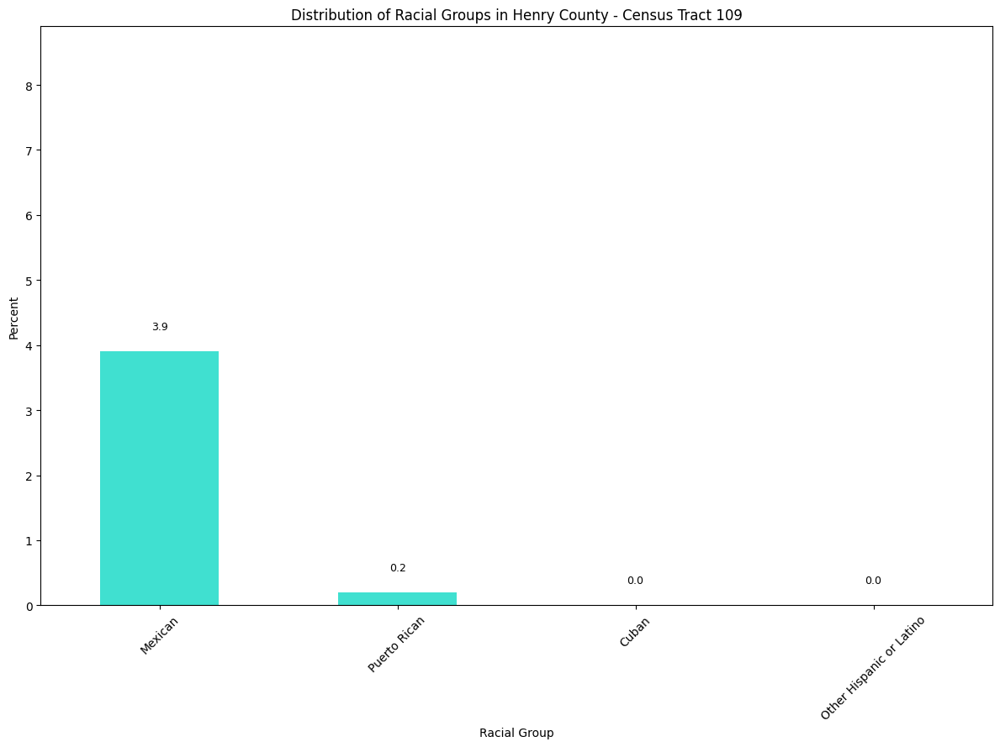

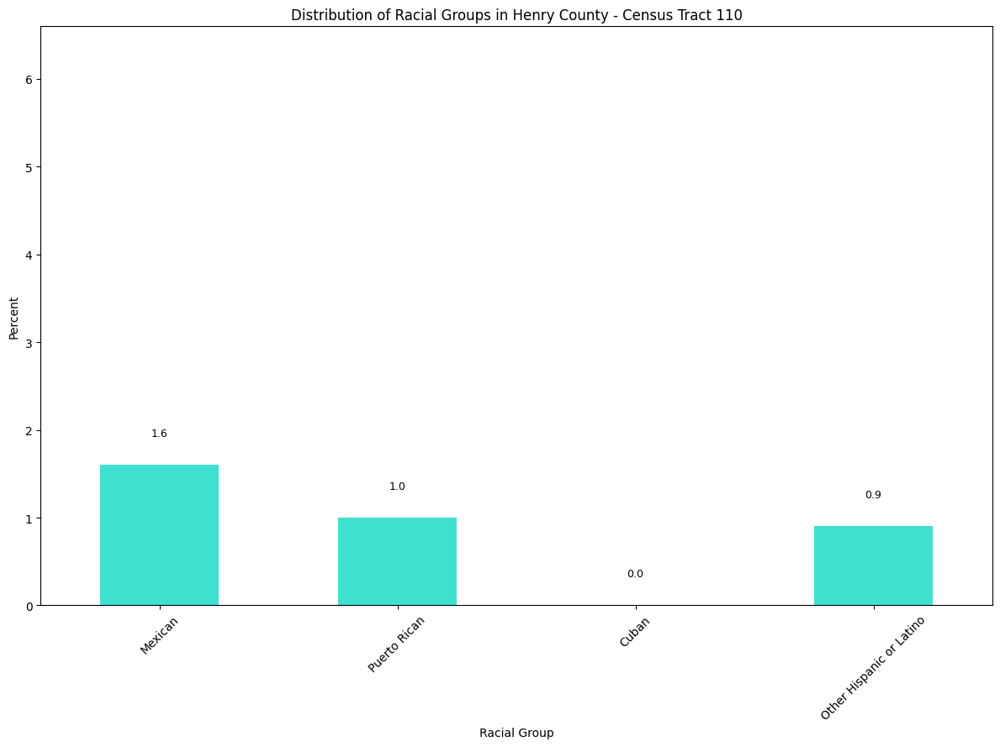

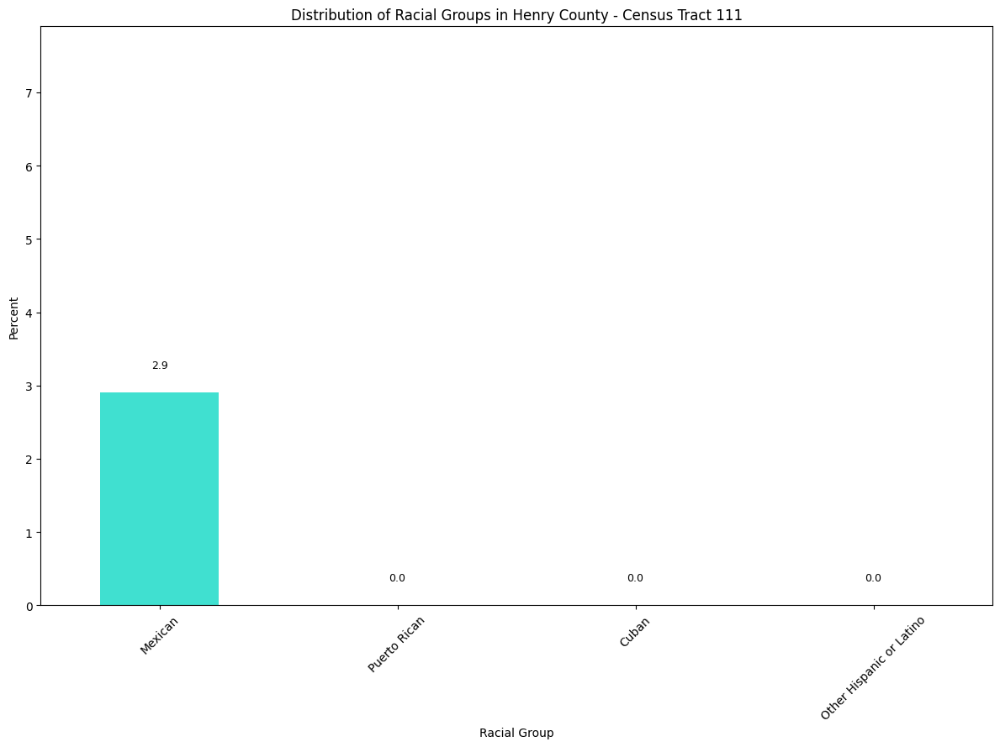

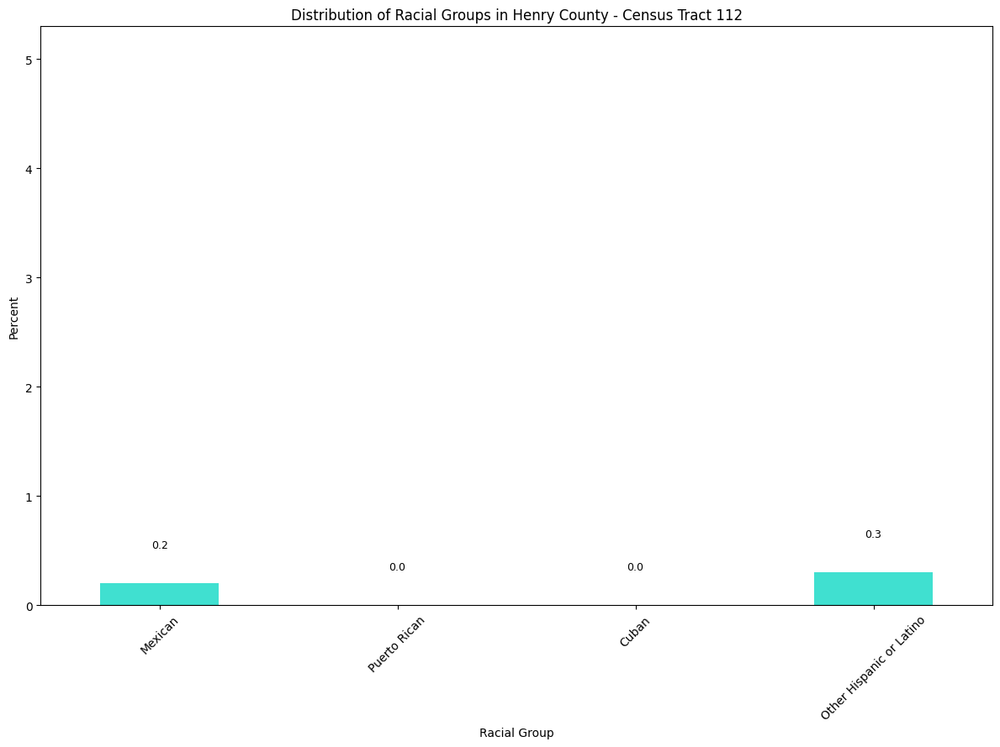

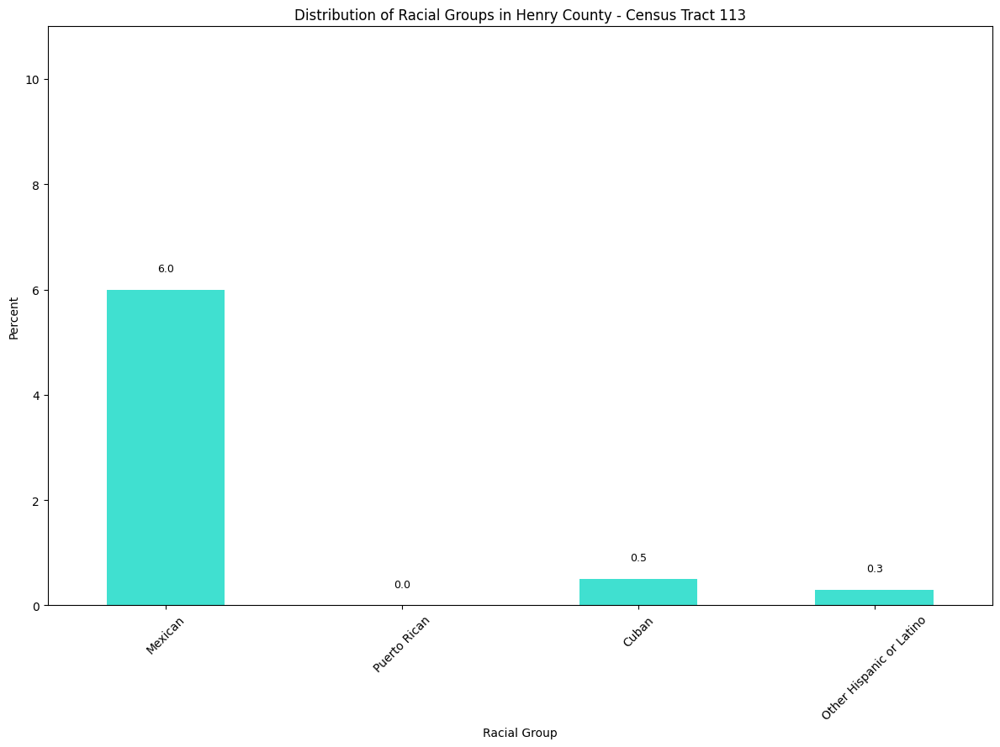

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\race'
file_names = [f'hc_race_{i}.csv' for i in range(101, 114) if i != 106]

# Define the racial groups of interest
racial_groups = [
    'Mexican',
    'Puerto Rican',
    'Cuban',
    'Other Hispanic or Latino'
]

for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name
    tract_number = file_name.split('_')[-1].split('.')[0]
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(12, 9))  # Increased figure size
    ax = grouped_racial_data.plot(kind='bar', color='turquoise')
    plt.xlabel('Racial Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Racial Groups in Henry County - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    # Set y-axis limit dynamically
    max_value = grouped_racial_data.max()
    plt.ylim(0, max_value + 5)  # Add some space above the highest bar

    # Adding numbers to the top of each bar for clarity
    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


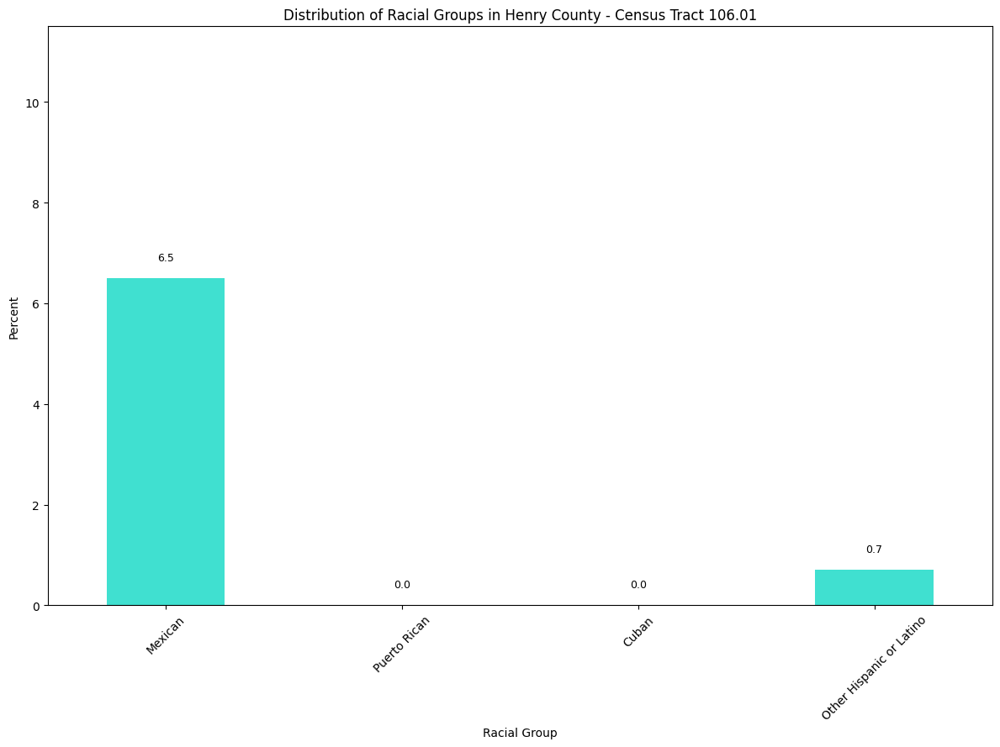

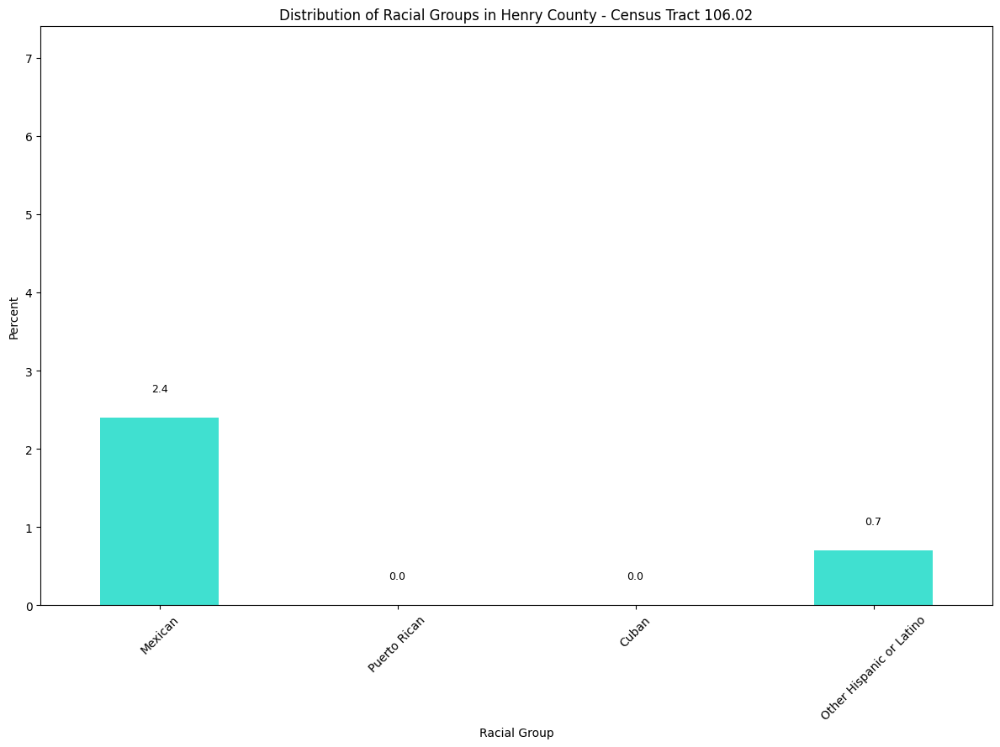

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = ['hc_race_106.01.csv', 'hc_race_106.02.csv']

# Define the racial groups of interest
racial_groups = [
    'Mexican',
    'Puerto Rican',
    'Cuban',
    'Other Hispanic or Latino'
]

for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name
    tract_number = file_name.split('_')[-1].split('.')[0] + '.' + file_name.split('_')[-1].split('.')[1]
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(12, 9))  # Increased figure size
    ax = grouped_racial_data.plot(kind='bar', color='turquoise')
    plt.xlabel('Racial Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Racial Groups in Henry County - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    # Set y-axis limit dynamically
    max_value = grouped_racial_data.max()
    plt.ylim(0, max_value + 5)  # Add some space above the highest bar

    # Adding numbers to the top of each bar for clarity
    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The graphs show the distribution of Hispanic or Latino racial groups in Henry County across various census tracts. In Tract 101, the Mexican population is the largest Hispanic group at 8.3%, followed by Other Hispanic or Latino at 4.7%. Tract 102 has smaller percentages, with the Mexican population at 2.1% and Other Hispanic or Latino at 3.6%. Tract 103 also shows a notable presence of Mexican (5.0%) and Other Hispanic or Latino (7.0%) populations. Tract 104 has a 4.7% Mexican population, while Tract 105 is unique in having only Other Hispanic or Latino at 4.2%. In Tract 107, the Mexican population is 6.3%, with very minimal representation from Puerto Rican and Cuban groups. Tract 108 has a very small Mexican population at 1.4%, with no other Hispanic or Latino groups represented. Overall, the Mexican population is the largest Hispanic group in most tracts, followed by Other Hispanic or Latino, with minimal representation from Puerto Rican and Cuban groups. This indicates a diverse Hispanic or Latino presence in the county, predominantly of Mexican origin.

#### **2. Poverty analysis in Martinsville City and Henry County**


<a name="2a"></a>
### **Poverty Rates in Martinsville City by Age Group**

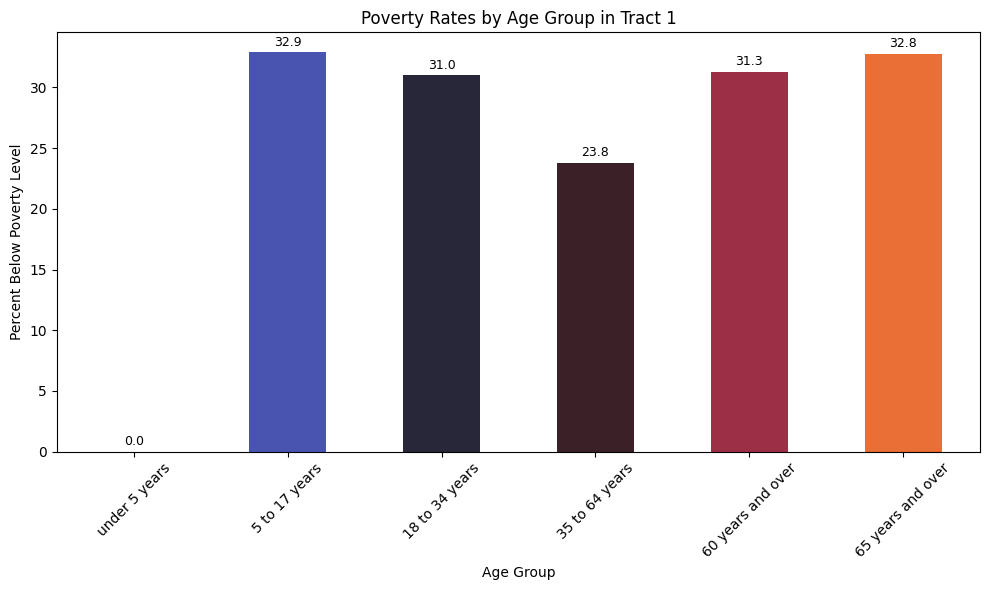

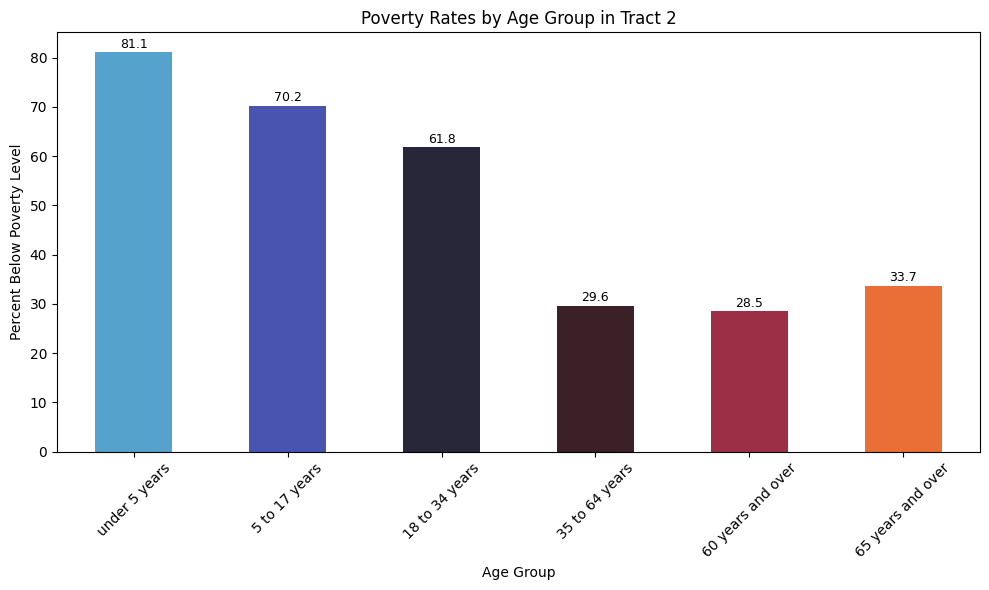

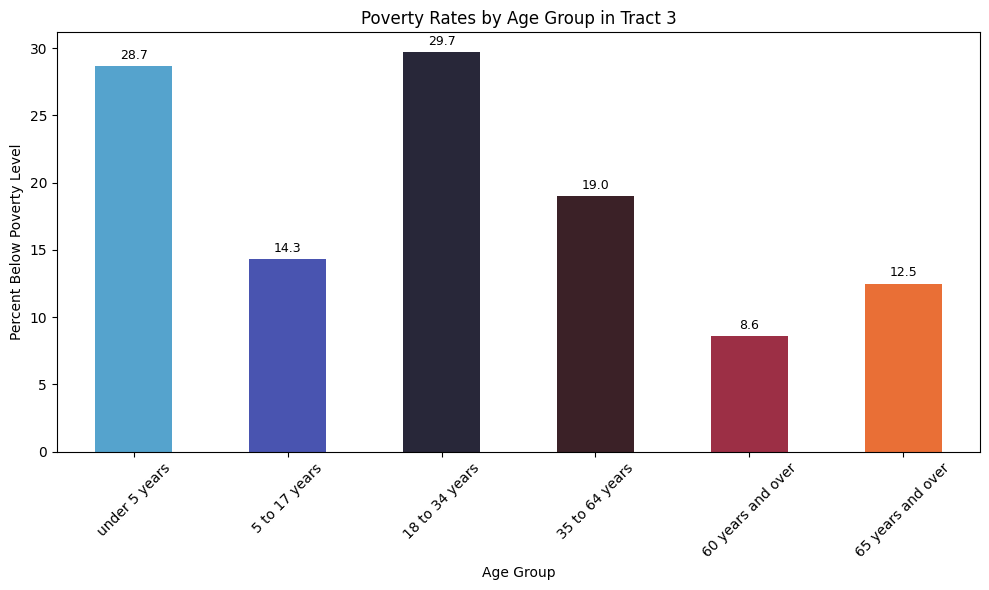

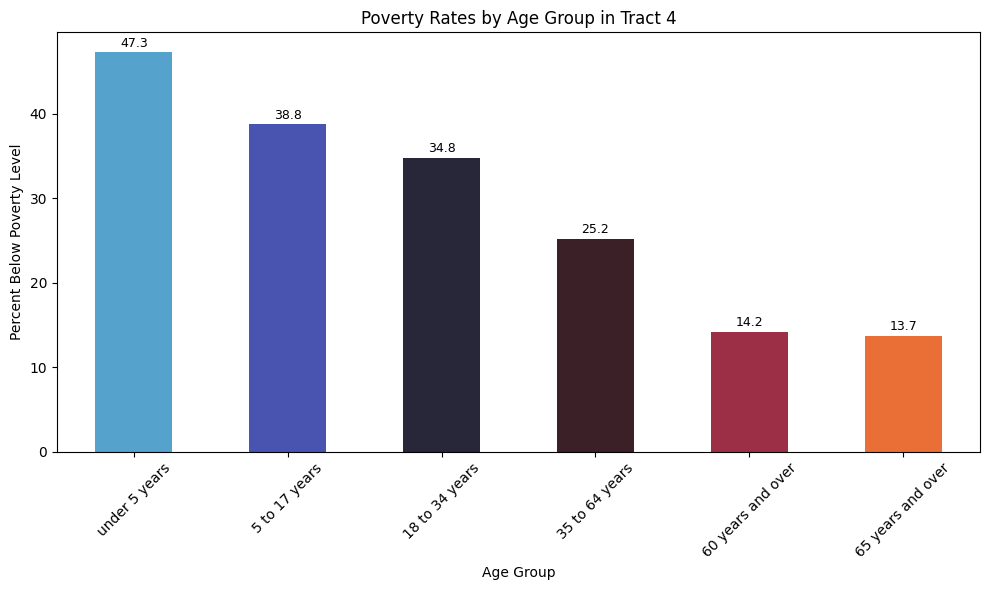

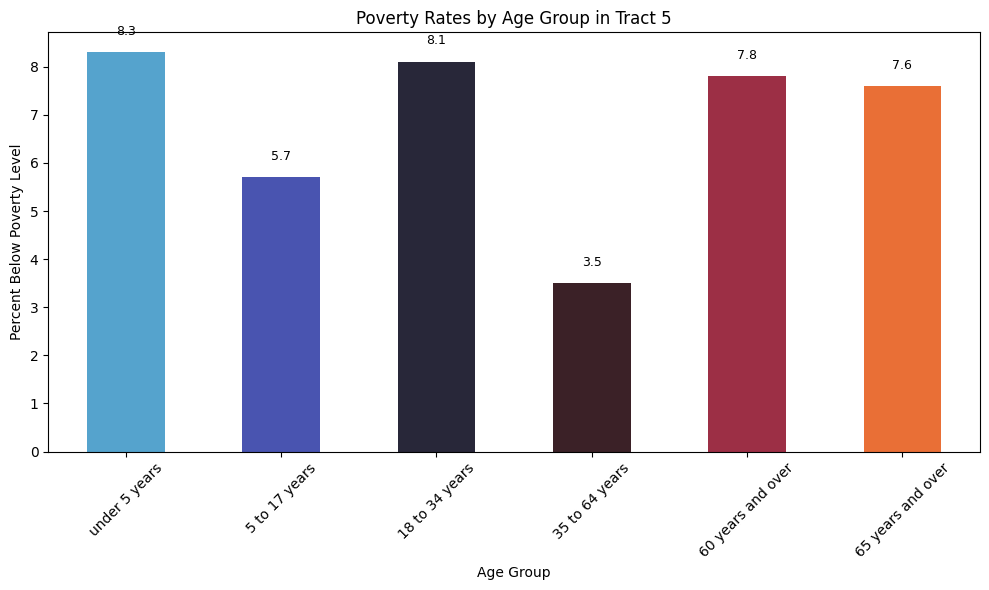

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\poverty'
file_names = [f'poverty_{i}.csv' for i in range(1, 6)]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Define age groups of interest
    age_groups = [
        'under 5 years',
        '5 to 17 years',
        '18 to 34 years',
        '35 to 64 years',
        '60 years and over',
        '65 years and over'
    ]

    # Filter and prepare data for visualization
    filtered_data = data[data['Label (Grouping)'].isin(age_groups)]
    grouped_data = filtered_data.set_index('Label (Grouping)')[poverty_column]

    # Plotting
    plt.figure(figsize=(10, 6))
    bars = grouped_data.plot(kind='bar', color=sns.color_palette("icefire", len(grouped_data)))
    plt.xlabel('Age Group')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Age Group in Tract {tract_number}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()

### Poverty Overview by Age in Martinsville City

#### **Tract 1**
- **Children (5 to 17 years)** and **Elderly (65+ years)** face the highest poverty rates, both over 32%, highlighting significant economic challenges.

#### **Tract 2**
- Extreme poverty across all age groups, with **children under 5** facing the highest at 81.1%. Rates are consistently high for younger groups but decrease for older adults, suggesting diminishing poverty with age.

#### **Tract 3**
- Moderate poverty levels with **children under 5** at 28.7% and a notable decrease to 8.6% in adults over 60, indicating lesser economic hardship for the elderly.

#### **Tract 4**
- High poverty in young children (47.3%) and a gradual decline in older age groups, with the elderly experiencing significantly lower rates (13.7%).

#### **Tract 5**
- A mixed pattern, with **young adults (18 to 34 years)** facing the highest rate at 8.1%, while other age groups show lower, yet consistent, economic challenges.

This data reflects varied economic struggles across different age groups in Martinsville, with particularly high rates of poverty among the youngest and some elderly populations.


<a name="2b"></a>
### **Poverty Rates in Henry County by Age Group**

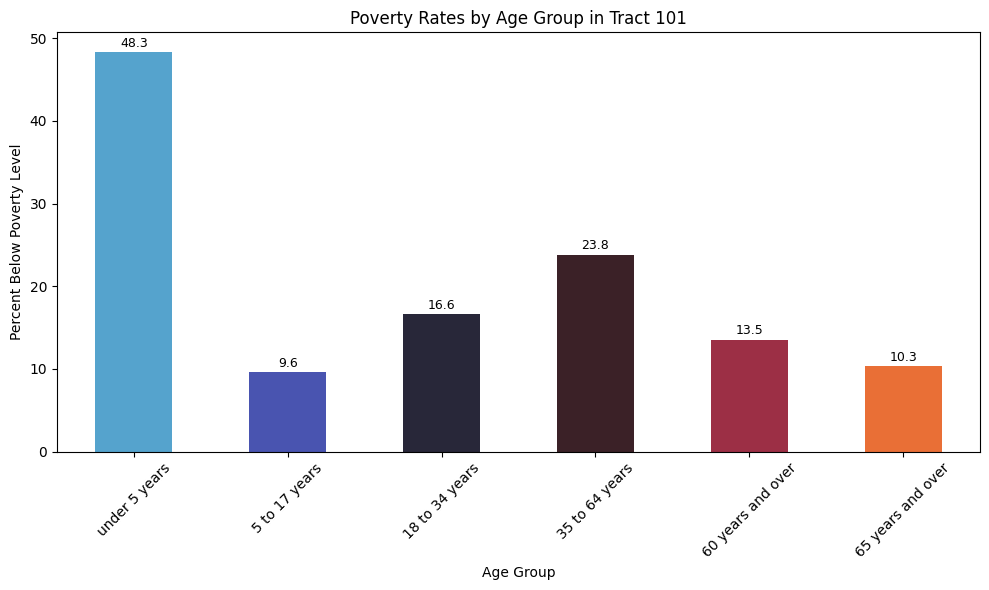

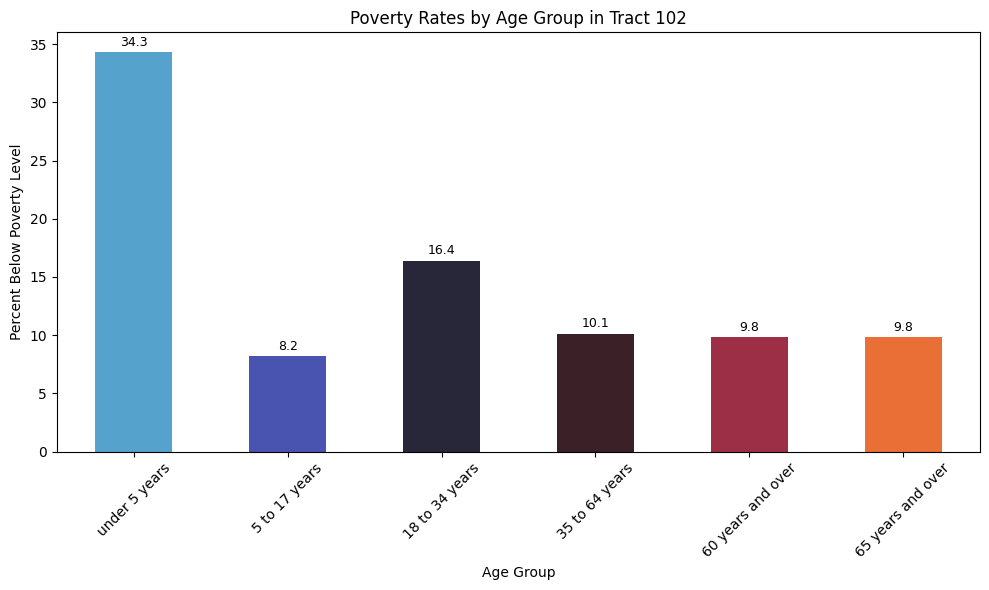

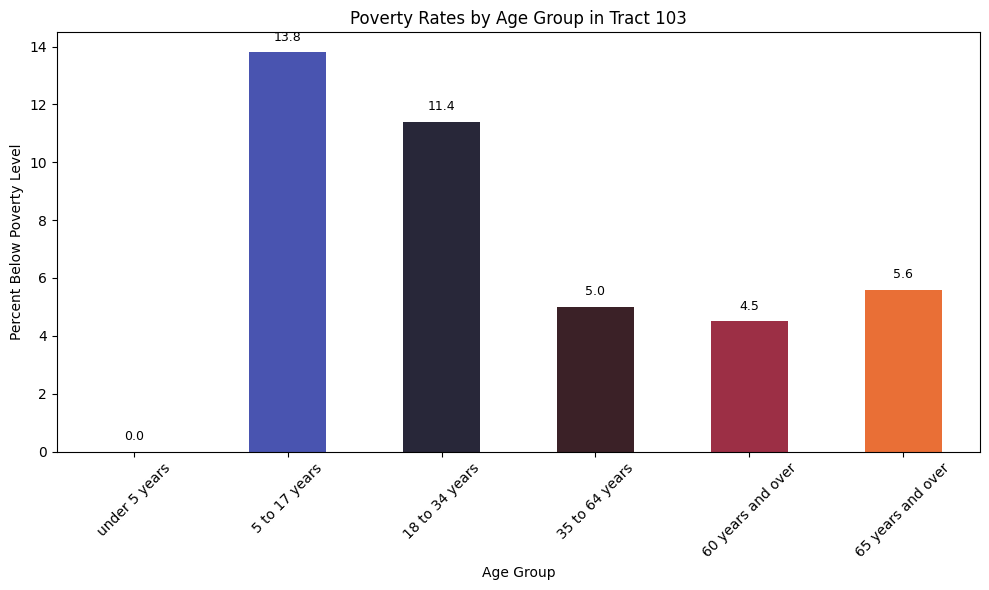

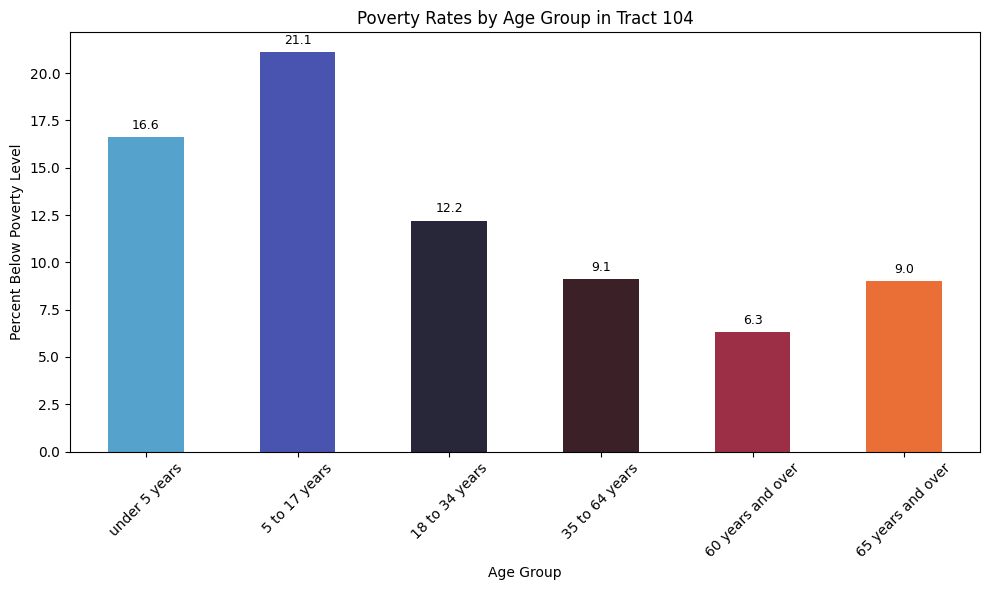

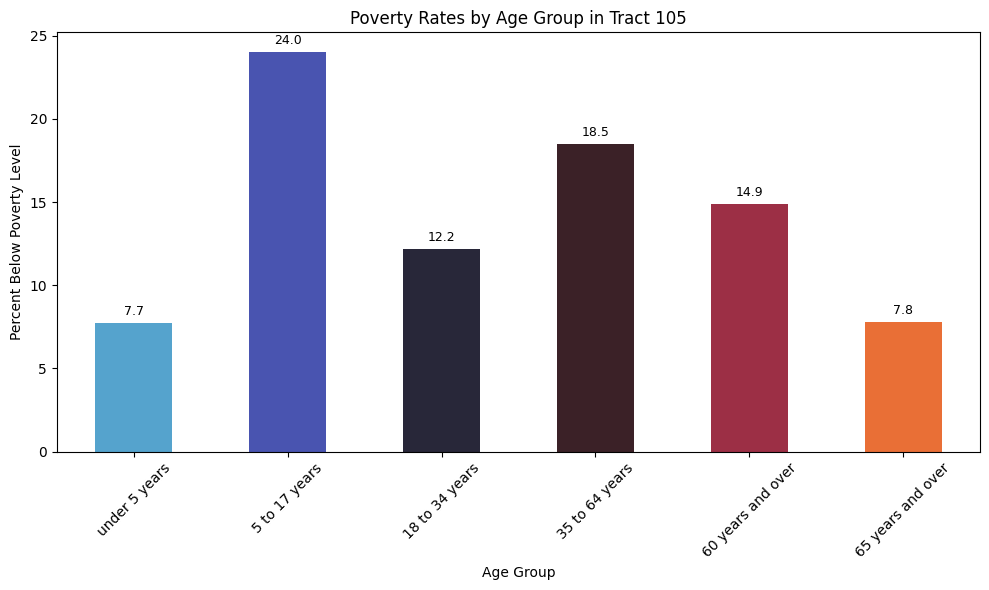

...

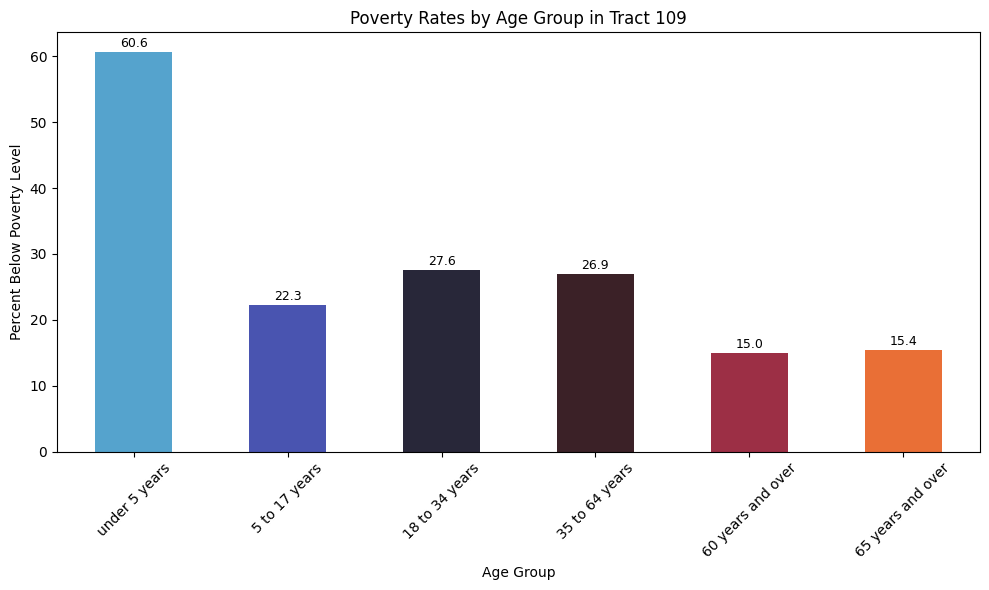

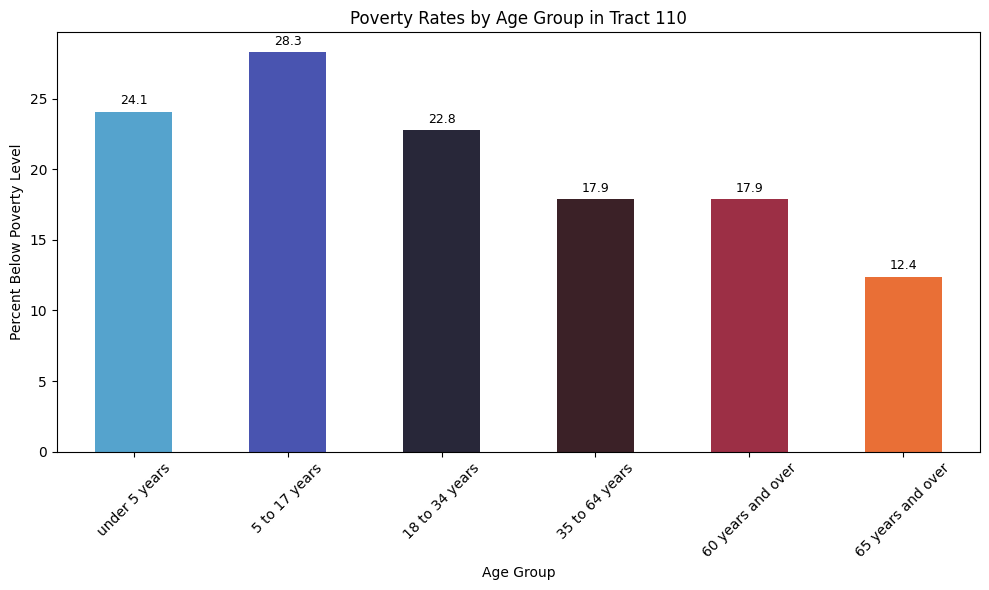

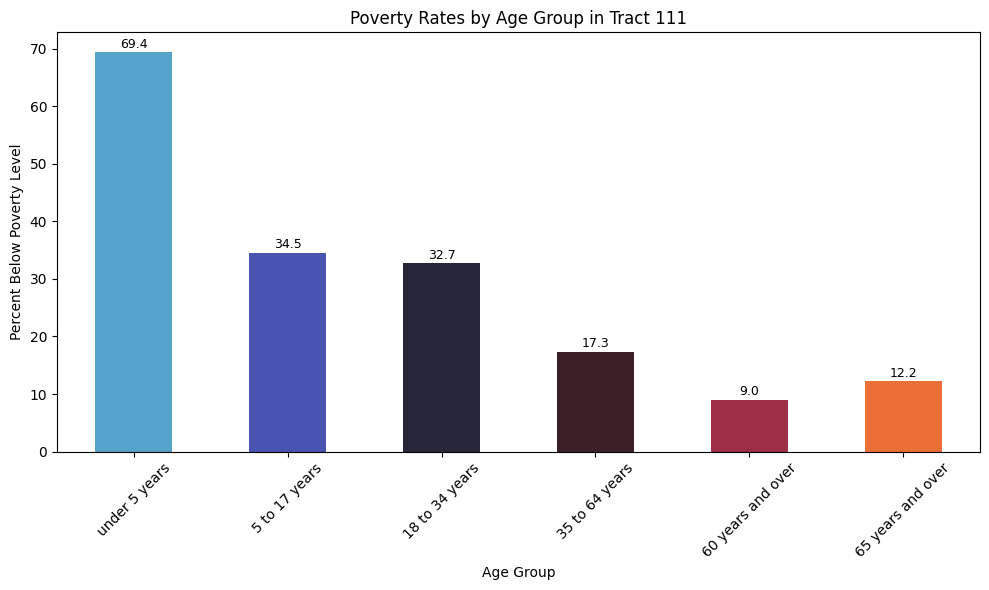

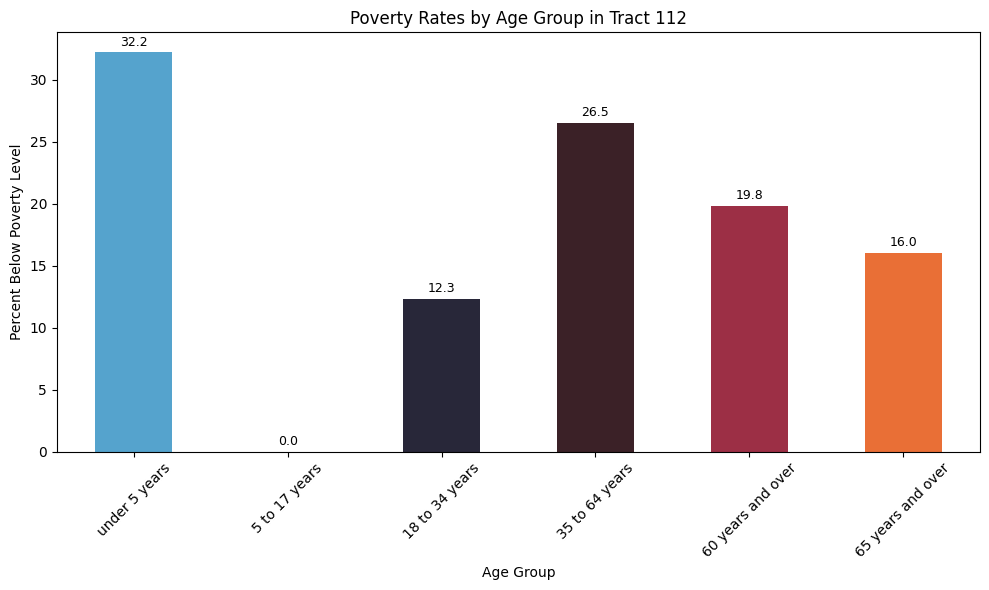

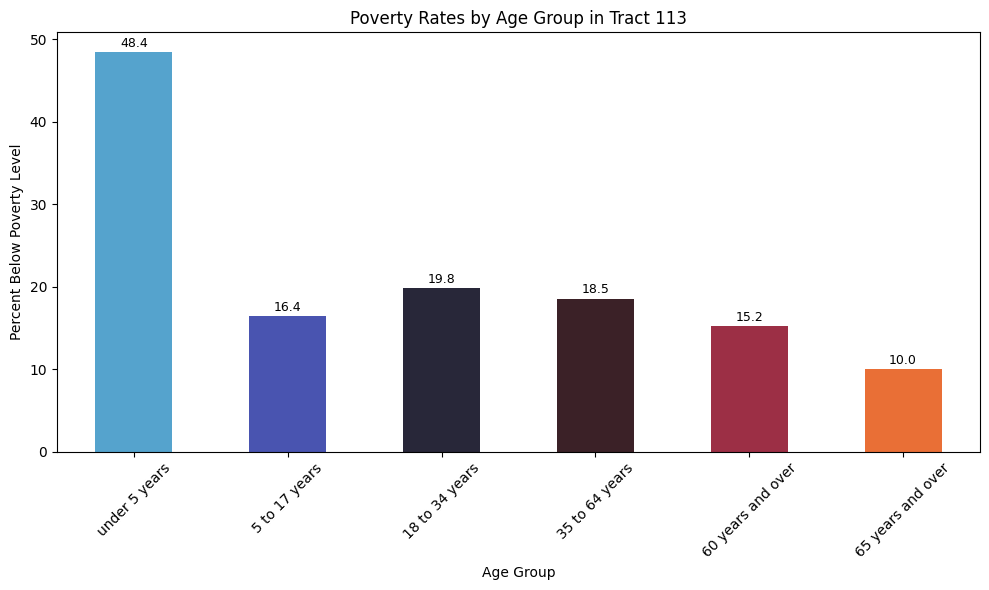

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\poverty'
file_names = [f'poverty_{i}.csv' for i in range(101, 114) if i != 106]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Define age groups of interest
    age_groups = [
        'under 5 years',
        '5 to 17 years',
        '18 to 34 years',
        '35 to 64 years',
        '60 years and over',
        '65 years and over'
    ]

    # Filter and prepare data for visualization
    filtered_data = data[data['Label (Grouping)'].isin(age_groups)]
    grouped_data = filtered_data.set_index('Label (Grouping)')[poverty_column]

    # Plotting
    plt.figure(figsize=(10, 6))
    bars = grouped_data.plot(kind='bar', color=sns.color_palette("icefire", len(grouped_data)))
    plt.xlabel('Age Group')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Age Group in Tract {tract_number}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


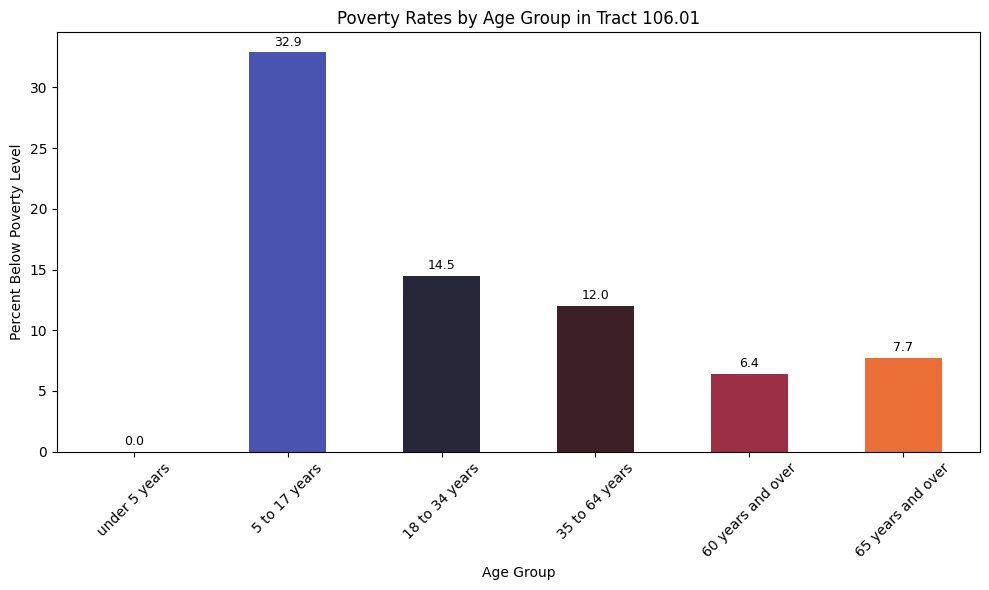

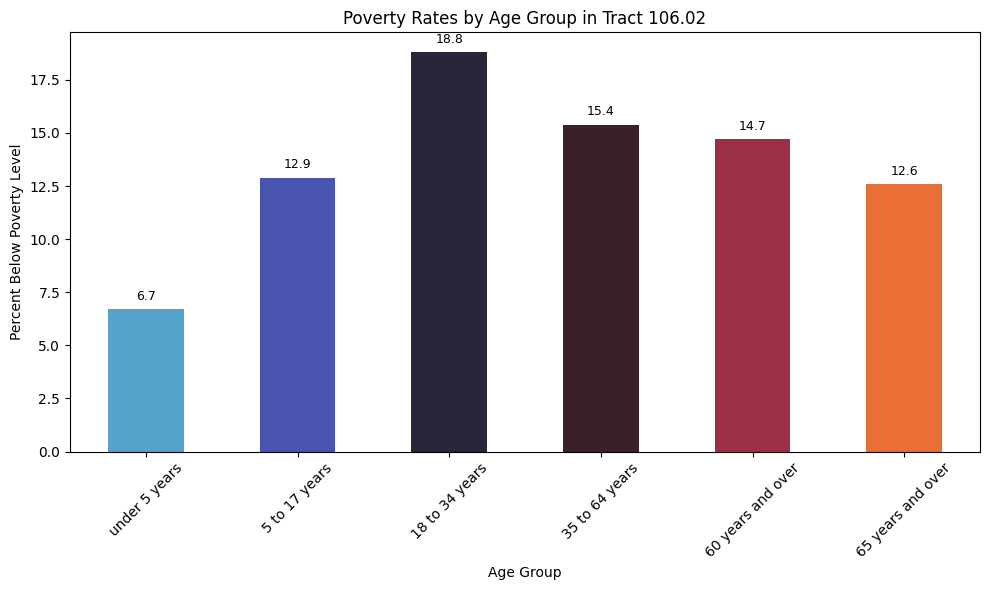

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = ['poverty_106.01.csv', 'poverty_106.02.csv']
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0] + '.' + file_path.split('_')[-1].split('.')[1]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Define age groups of interest
    age_groups = [
        'under 5 years',
        '5 to 17 years',
        '18 to 34 years',
        '35 to 64 years',
        '60 years and over',
        '65 years and over'
    ]

    # Filter and prepare data for visualization
    filtered_data = data[data['Label (Grouping)'].isin(age_groups)]
    grouped_data = filtered_data.set_index('Label (Grouping)')[poverty_column]

    # Plotting
    plt.figure(figsize=(10, 6))
    bars = grouped_data.plot(kind='bar', color=sns.color_palette("icefire", len(grouped_data)))
    plt.xlabel('Age Group')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Age Group in Tract {tract_number}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The graphs illustrate the poverty rates by age group across various census tracts in Henry County. Across the board, younger age groups, particularly children under 5 years and those aged 5 to 17, consistently exhibit the highest poverty rates. In Tract 101, children under 5 years have the highest poverty rate at 48.3%, followed by adults aged 35 to 64 years at 23.8%. Similarly, Tract 102 shows the highest poverty rate for children under 5 years at 34.3%, followed by young adults aged 18 to 34 years at 16.4%. Tract 103 highlights a significant poverty rate among the 5 to 17 years age group at 13.8%, with the 18 to 34 years group following at 11.4%. In Tract 104, the highest poverty rate is among children aged 5 to 17 years at 21.1%, and in Tract 105, the same age group shows a poverty rate of 24.0%. Tract 107 also displays a high poverty rate for children aged 5 to 17 years at 21.9%. Tract 108 reveals extreme poverty rates for the 5 to 17 years age group at 71.2% and children under 5 years at 46.4%. Tract 109 shows a significant poverty rate for children under 5 years at 60.6%, while Tract 110 highlights a high rate of 28.3% for the 5 to 17 years group. Tract 111 has very high poverty rates for children under 5 years at 69.4% and the 5 to 17 years group at 34.5%. Tract 112 shows a poverty rate of 32.2% for children under 5 years, while Tract 113 highlights a poverty rate of 48.4% for the same age group. Tract 106.01 has the highest poverty rate in the 5 to 17 years group at 32.9%, and Tract 106.02 shows the highest poverty rate in the 18 to 34 years group at 18.8%. Overall, the data indicates that younger age groups, particularly children under 5 and those aged 5 to 17, consistently experience higher poverty rates across these tracts.

<a name="2c"></a>
### **Poverty Rates by Racial and Ethnic Group in Martinsville City**

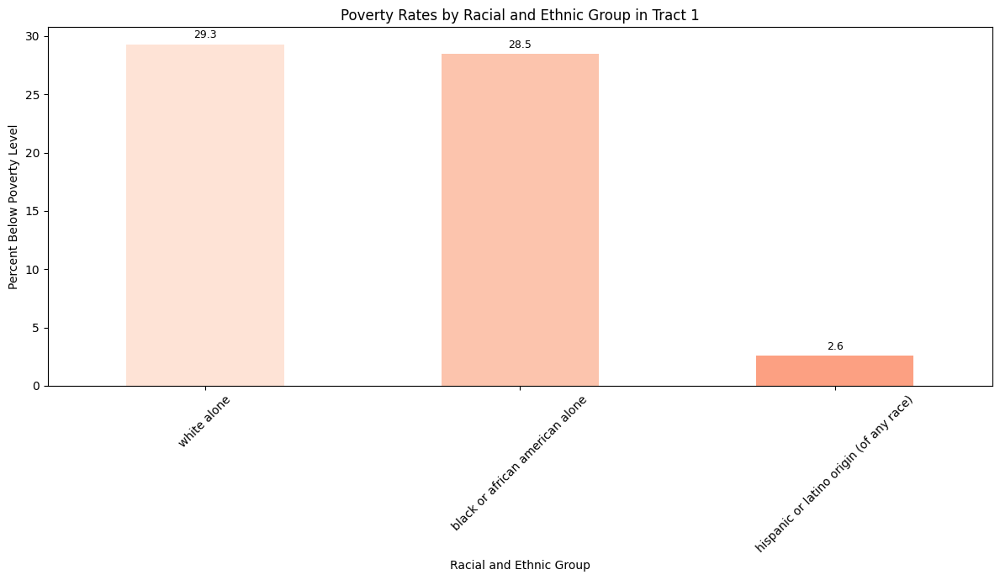

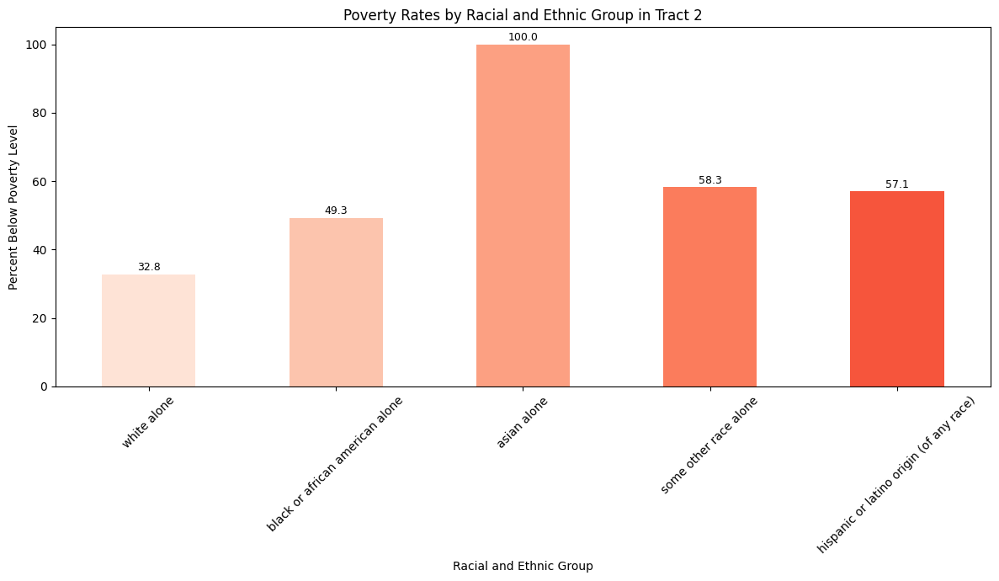

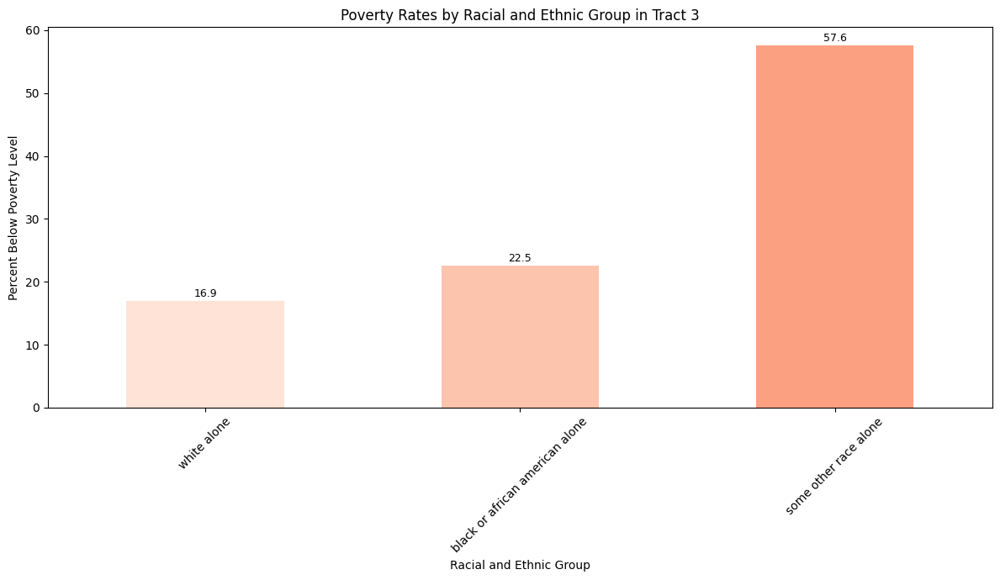

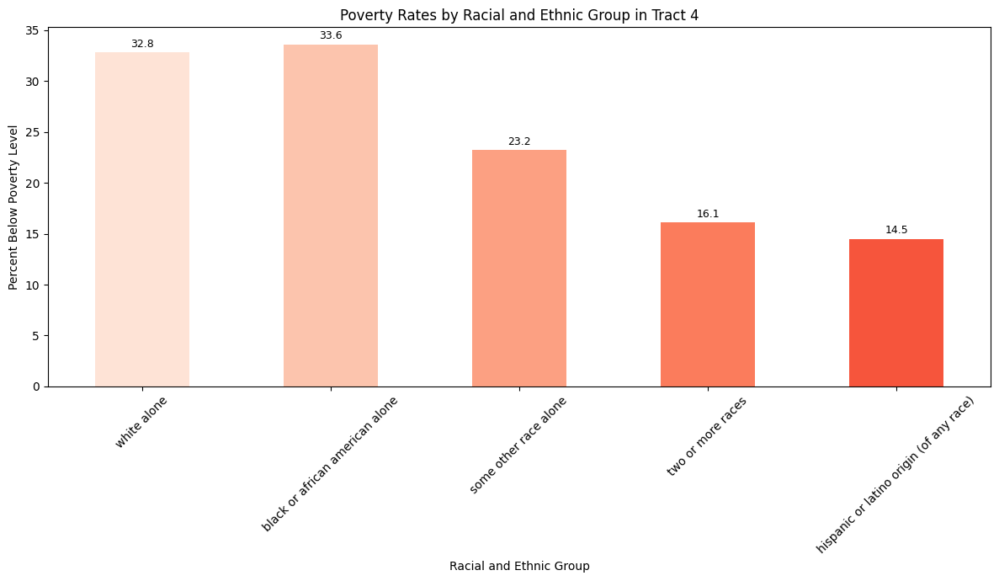

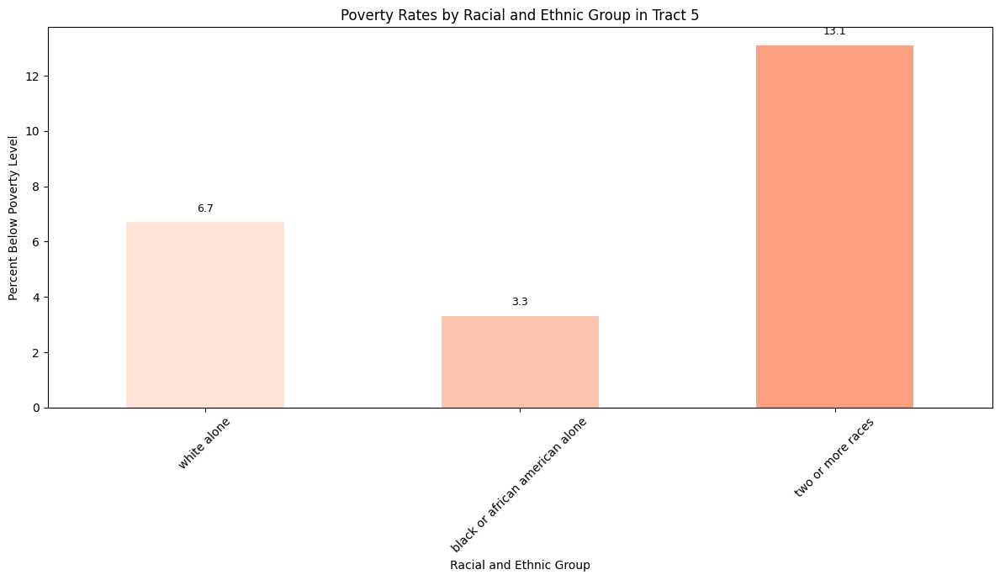

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\poverty'
file_names = [f'poverty_{i}.csv' for i in range(1, 6)]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define racial and ethnic groups of interest
racial_groups = [
    'white alone',
    'black or african american alone',
    'american indian and alaska native alone',
    'asian alone',
    'native hawaiian and other pacific islander alone',
    'some other race alone',
    'two or more races',
    'hispanic or latino origin (of any race)',
]

# Create a color palette
palette = sns.color_palette("Reds", n_colors=len(racial_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Filter data for racial and ethnic groups
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups)]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[poverty_column]

    # Remove zero values
    grouped_racial_data = grouped_racial_data[grouped_racial_data > 0]

    # Plotting racial and ethnic groups
    plt.figure(figsize=(12, 7))  # Adjusting figure size for better visibility
    bars = grouped_racial_data.plot(kind='bar', color=palette)
    plt.xlabel('Racial and Ethnic Group')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Racial and Ethnic Group in Tract {tract_number}')
    plt.xticks(rotation=45)  # Rotate labels for better readability

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)  # Adding '%' to the label

    plt.tight_layout()
    plt.show()


In Martinsville City, an examination of poverty rates across different racial and ethnic groups reveals varied levels of economic hardship across five census tracts. In **Tract 1**, poverty impacts Whites and Blacks similarly, with rates hovering around 29%, whereas Hispanics or Latinos face significantly lower rates at 2.6%. **Tract 2** shows more pronounced disparities, where Asians experience a 100% poverty rate, indicating a severe economic challenge, followed by substantial rates among 'Some Other Race Alone' (58.3%) and Hispanics (57.1%). Whites and Blacks in this tract also experience high poverty rates, 32.8% and 49.3% respectively. Moving to **Tract 3**, the 'Some Other Race Alone' group faces the highest poverty rate at 57.6%, with more moderate rates observed among Whites and Blacks. In **Tract 4**, Blacks face slightly higher poverty rates than Whites, 33.6% compared to 32.8%, and a notable portion of individuals identifying as 'Some Other Race Alone' also live below the poverty line at 23.2%. Lastly, **Tract 5** shows the lowest poverty rates among Whites and Blacks at 6.7% and 3.3% respectively, with a notable 13.1% of those identifying as 'Two or More Races' living in poverty. These findings highlight the significant variation in poverty levels across different racial and ethnic groups within the city, underscoring the complex interplay of race, ethnicity, and economic deprivation.


<a name="2d"></a>
### **Poverty Rates by Racial and Ethnic Group in Henry County**

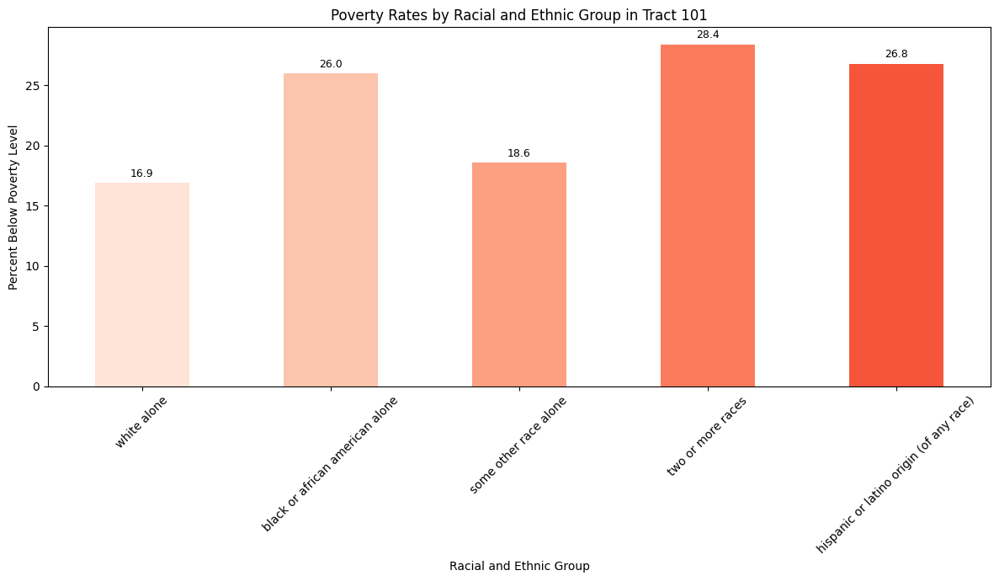

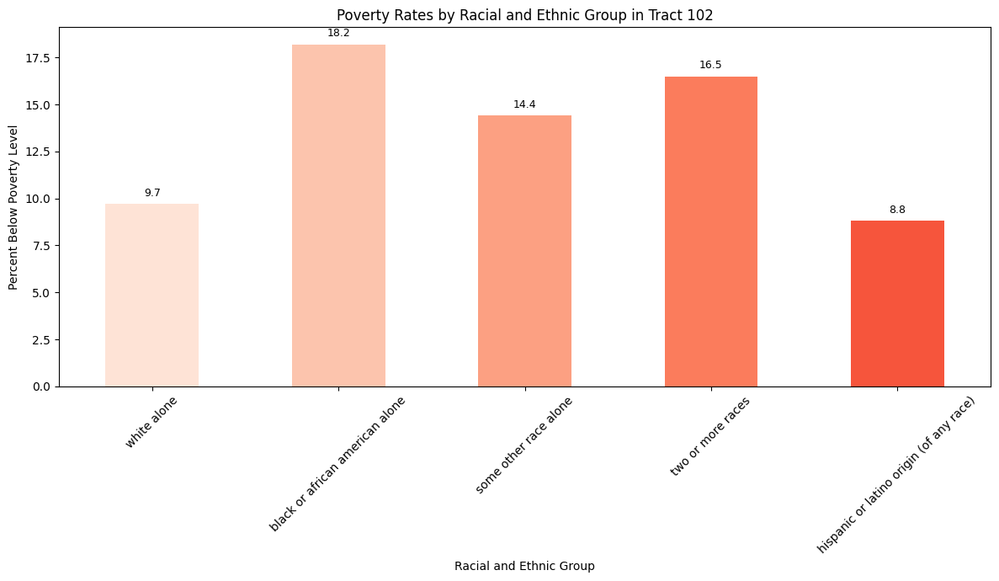

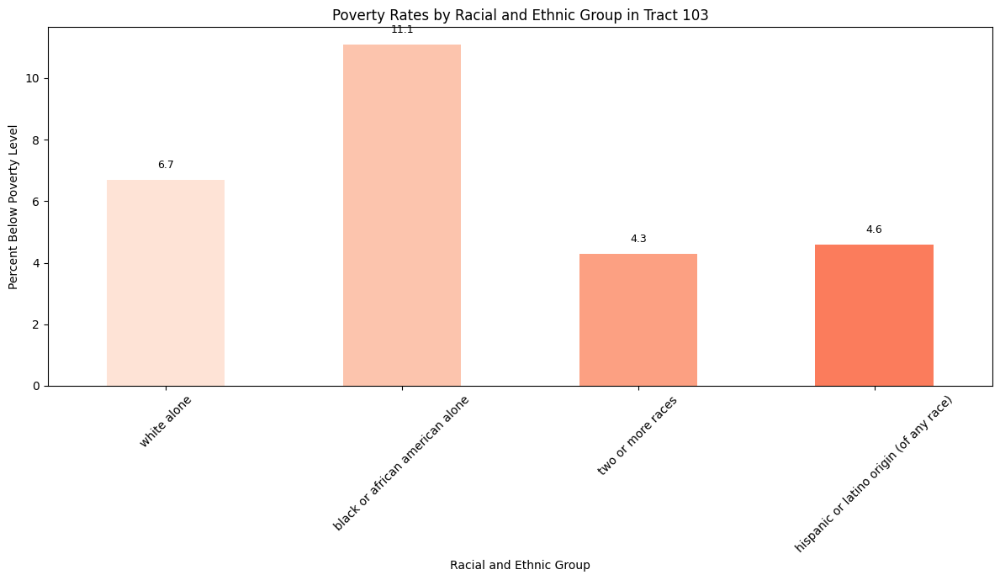

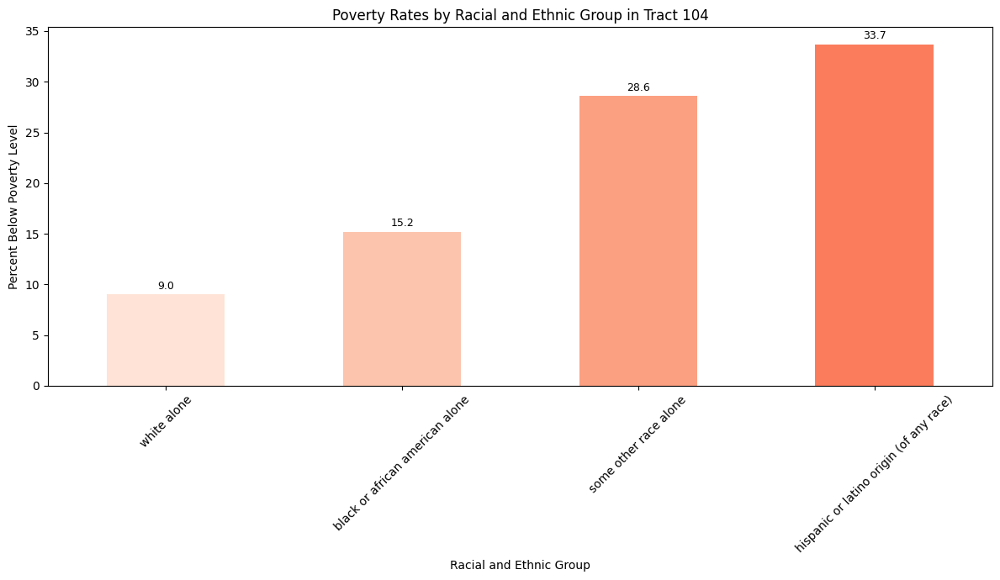

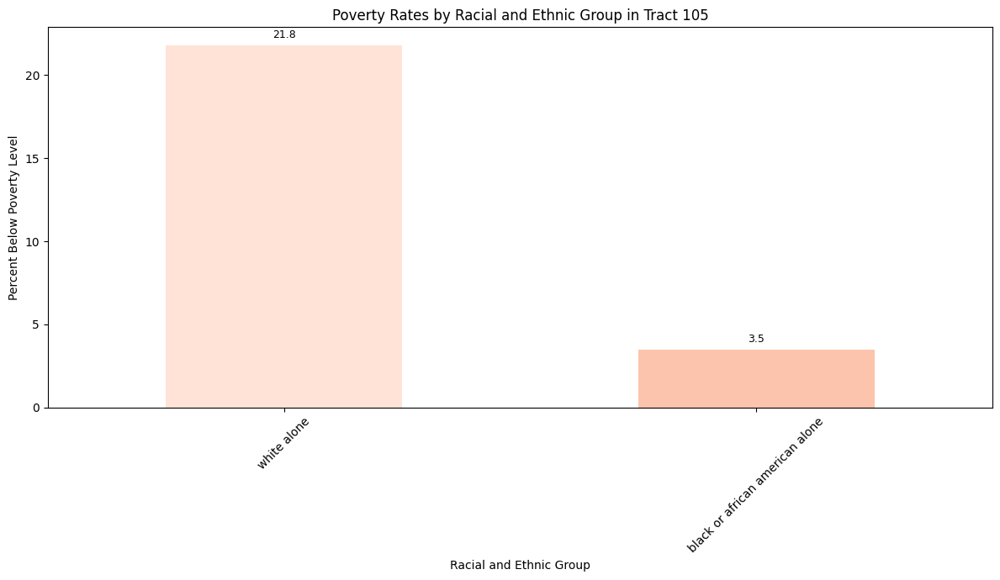

...

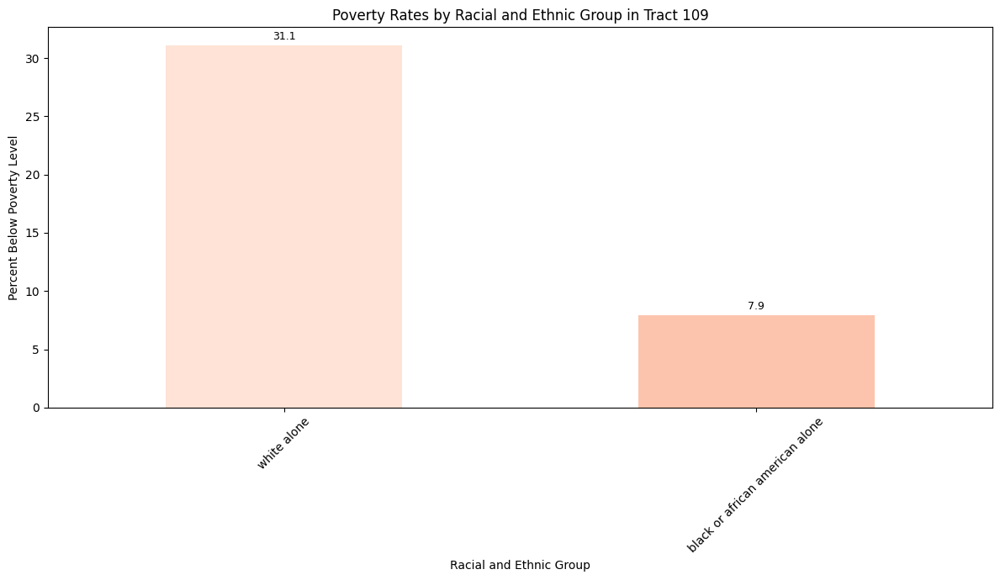

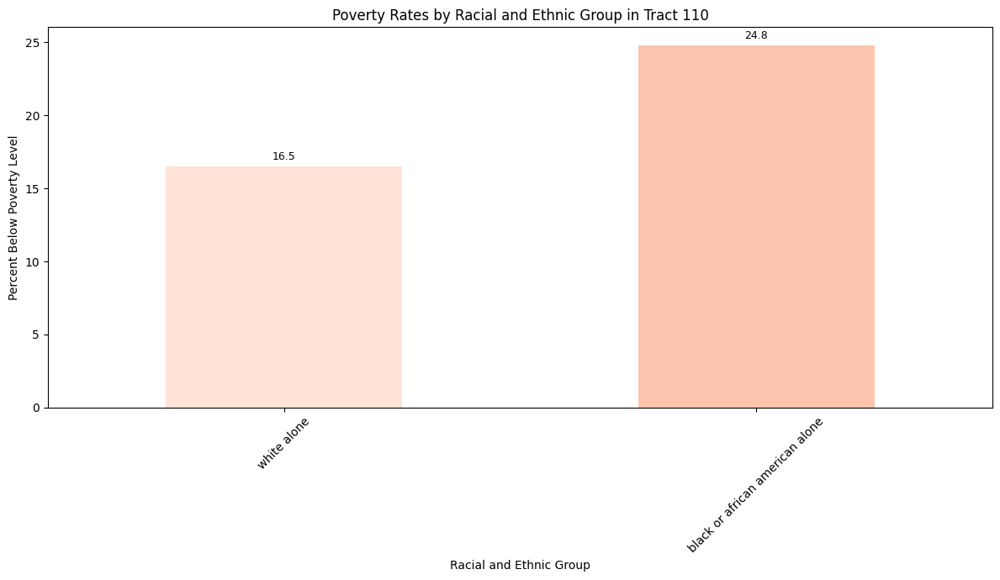

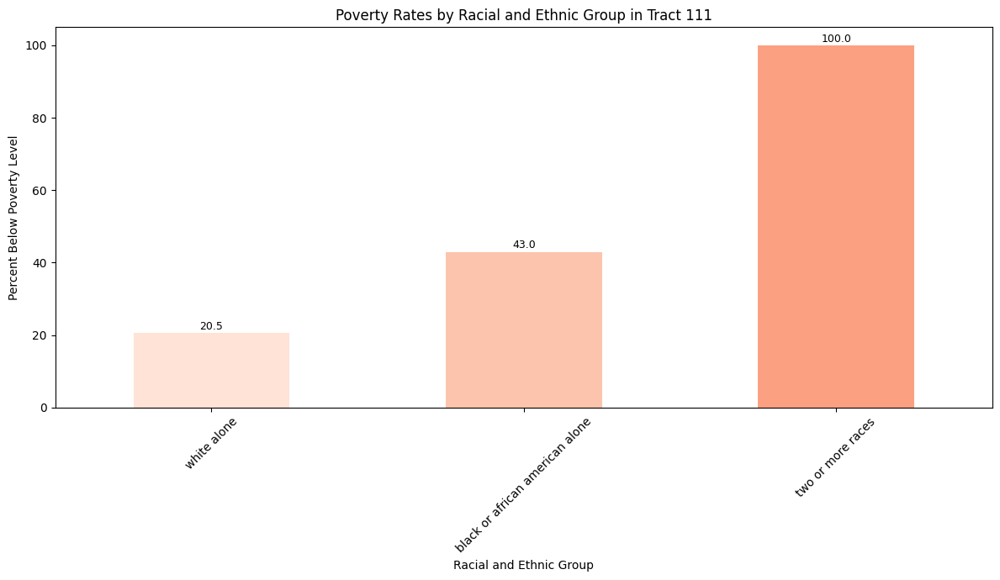

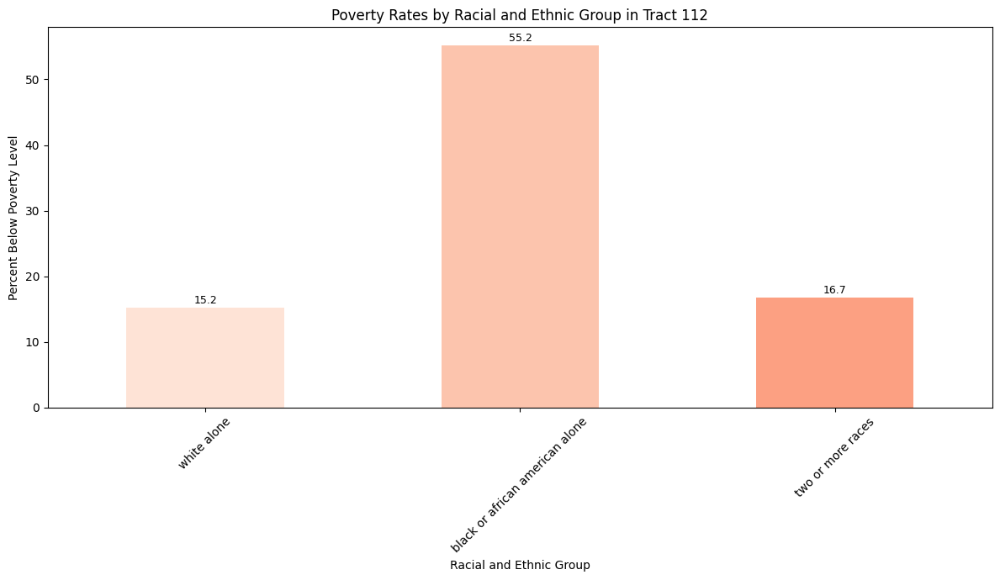

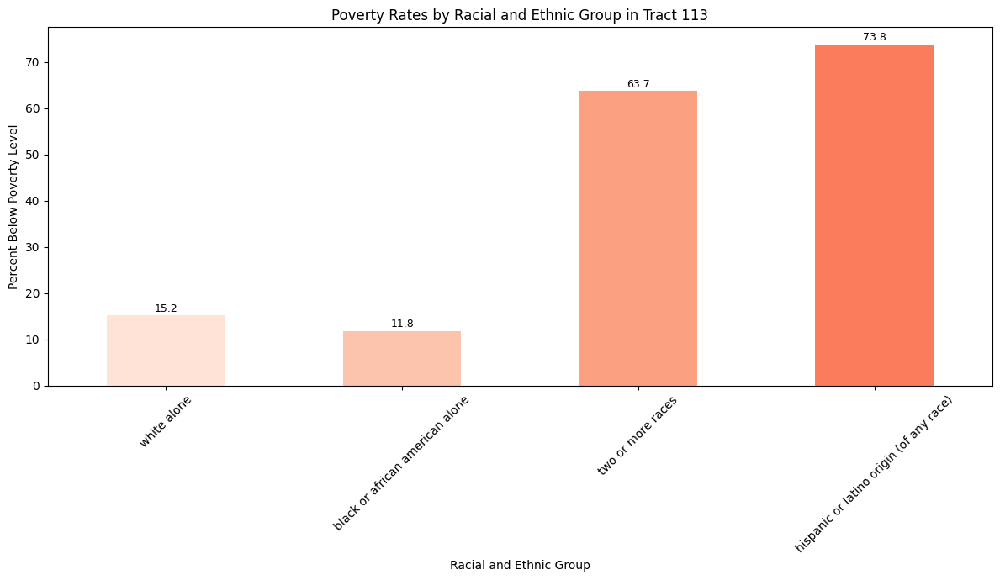

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\poverty'
file_names = [f'poverty_{i}.csv' for i in range(101, 114) if i != 106]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define racial and ethnic groups of interest
racial_groups = [
    'white alone',
    'black or african american alone',
    'american indian and alaska native alone',
    'asian alone',
    'native hawaiian and other pacific islander alone',
    'some other race alone',
    'two or more races',
    'hispanic or latino origin (of any race)',
]

# Create a color palette
palette = sns.color_palette("Reds", n_colors=len(racial_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Filter data for racial and ethnic groups
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups)]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[poverty_column]

    # Remove zero values
    grouped_racial_data = grouped_racial_data[grouped_racial_data > 0]

    # Plotting racial and ethnic groups
    plt.figure(figsize=(12, 7))  # Adjusting figure size for better visibility
    bars = grouped_racial_data.plot(kind='bar', color=palette)
    plt.xlabel('Racial and Ethnic Group')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Racial and Ethnic Group in Tract {tract_number}')
    plt.xticks(rotation=45)  # Rotate labels for better readability

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)  # Adding '%' to the label

    plt.tight_layout()
    plt.show()


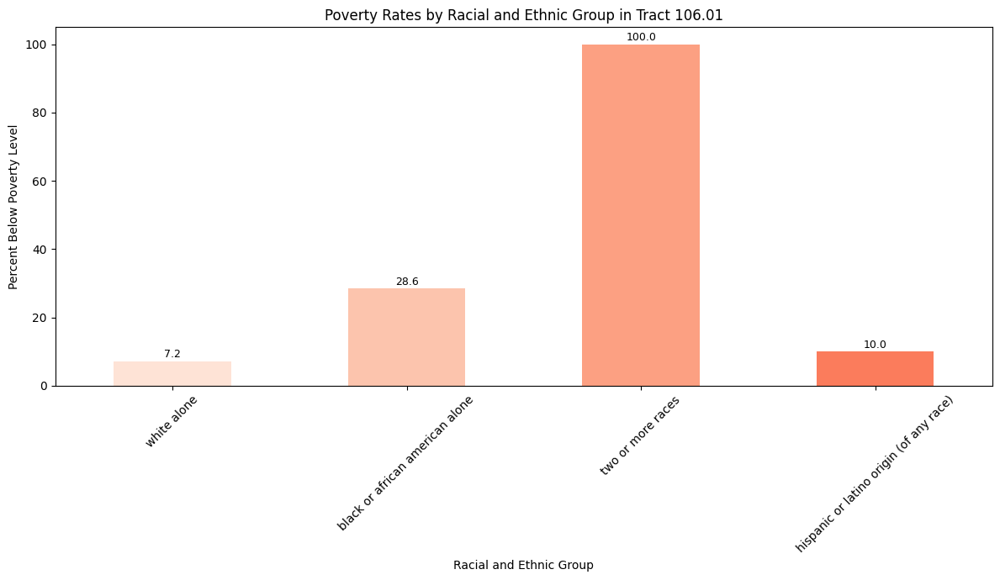

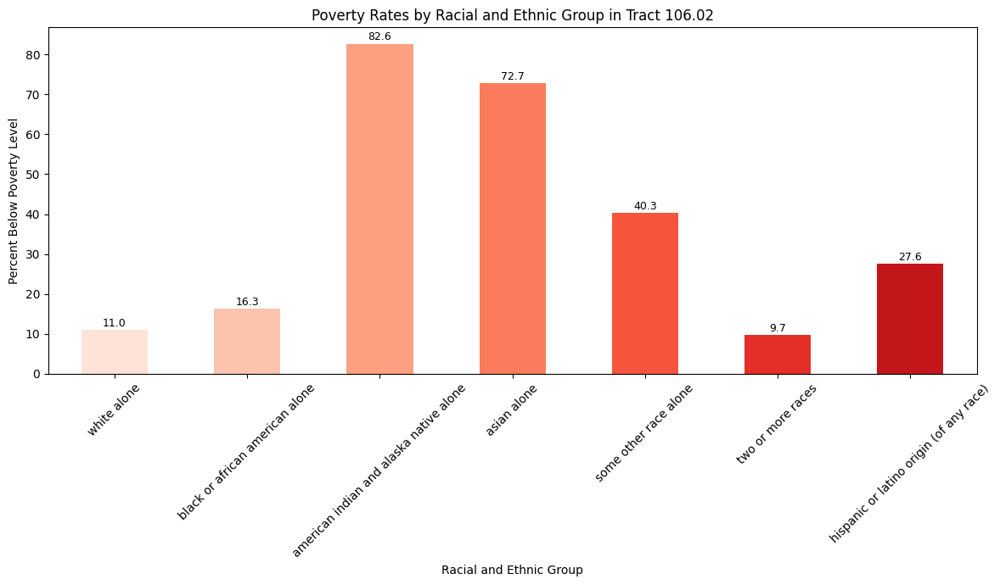

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = ['poverty_106.01.csv', 'poverty_106.02.csv']
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define racial and ethnic groups of interest
racial_groups = [
    'white alone',
    'black or african american alone',
    'american indian and alaska native alone',
    'asian alone',
    'native hawaiian and other pacific islander alone',
    'some other race alone',
    'two or more races',
    'hispanic or latino origin (of any race)',
]

# Create a color palette
palette = sns.color_palette("Reds", n_colors=len(racial_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0] + '.' + file_path.split('_')[-1].split('.')[1]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Filter data for racial and ethnic groups
    filtered_racial_data = data[data['Label (Grouping)'].isin(racial_groups)]
    grouped_racial_data = filtered_racial_data.set_index('Label (Grouping)')[poverty_column]

    # Remove zero values
    grouped_racial_data = grouped_racial_data[grouped_racial_data > 0]

    # Plotting racial and ethnic groups
    plt.figure(figsize=(12, 7))  # Adjusting figure size for better visibility
    bars = grouped_racial_data.plot(kind='bar', color=palette)
    plt.xlabel('Racial and Ethnic Group')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Racial and Ethnic Group in Tract {tract_number}')
    plt.xticks(rotation=45)  # Rotate labels for better readability

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_racial_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)  # Adding '%' to the label

    plt.tight_layout()
    plt.show()


The graphs illustrate the poverty rates by racial and ethnic groups across various census tracts in Henry County. In Tract 101, the highest poverty rates are among those identifying with two or more races (28.4%), Hispanic or Latino origin (26.8%), and Black or African American alone (26.0%). Tract 102 also shows a significant poverty rate for Black or African American alone (18.2%), followed by two or more races (16.5%) and some other race alone (14.4%). Tract 103 has the highest poverty rate among Black or African American alone (11.1%), with Hispanic or Latino origin following at 4.6%. Tract 104 reveals that Hispanic or Latino origin (33.7%) and some other race alone (28.6%) experience the highest poverty rates, with Black or African American alone at 15.2%. In Tract 105, White alone has a poverty rate of 21.8%, while Black or African American alone is at 3.5%. Tract 107 shows the highest poverty rate for White alone (19.2%), followed by Black or African American alone (7.0%). In Tract 108, significant poverty rates are seen for White alone (26.1%) and Black or African American alone (23.9%).

Tract 109 has a notable poverty rate for White alone (31.1%), while Tract 110 indicates high rates for Black or African American alone (24.8%). Tract 111 presents extremely high rates for two or more races (100.0%) and Black or African American alone (43.0%). Tract 112 shows the highest poverty rate for Black or African American alone (55.2%), and Tract 113 highlights high rates for Hispanic or Latino origin (73.8%) and two or more races (63.7%). Tract 106.01 shows 100.0% poverty for two or more races, and Tract 106.02 shows significant rates for American Indian and Alaska Native alone (82.6%) and Asian alone (72.7%). Overall, the data indicates that individuals of Hispanic or Latino origin, Black or African American, and those of two or more races consistently experience the highest poverty rates across most tracts in Henry County.

<a name="2e"></a>
### **Poverty Rates by Education Level in Martinsville City**

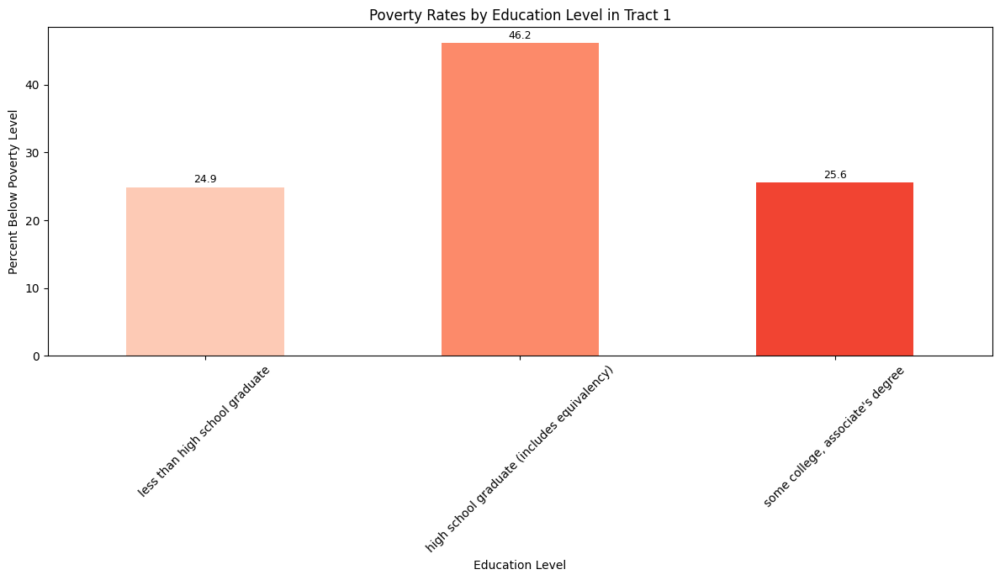

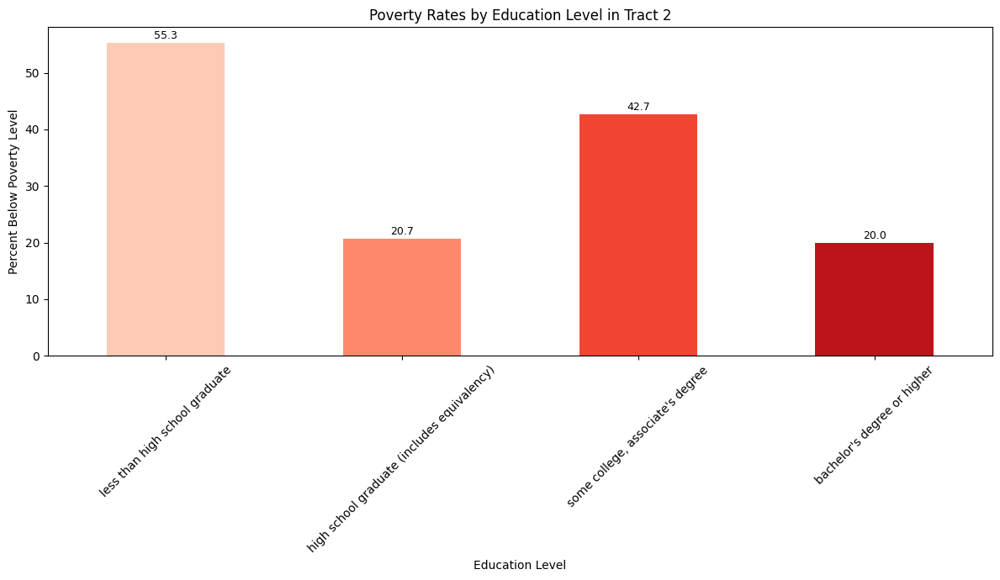

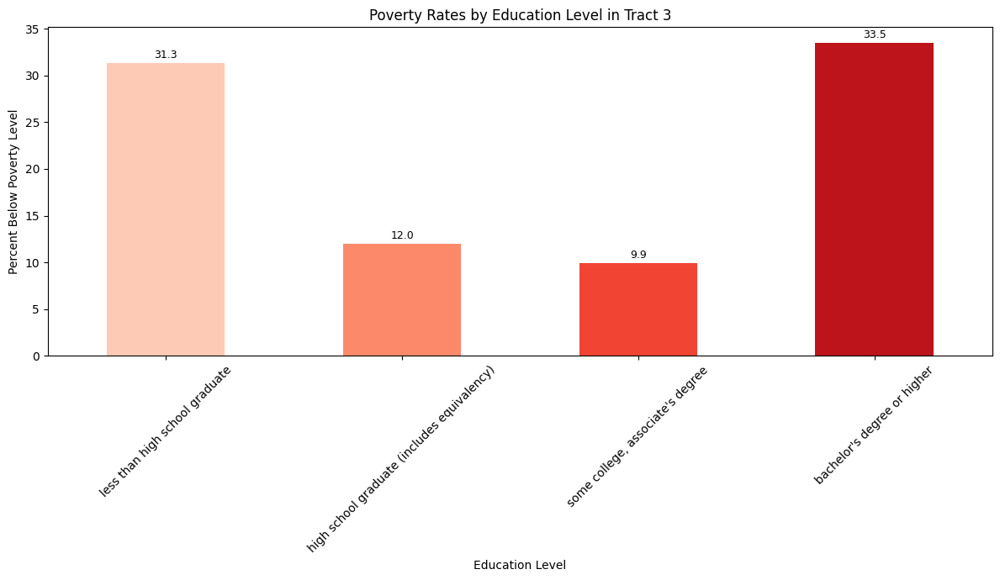

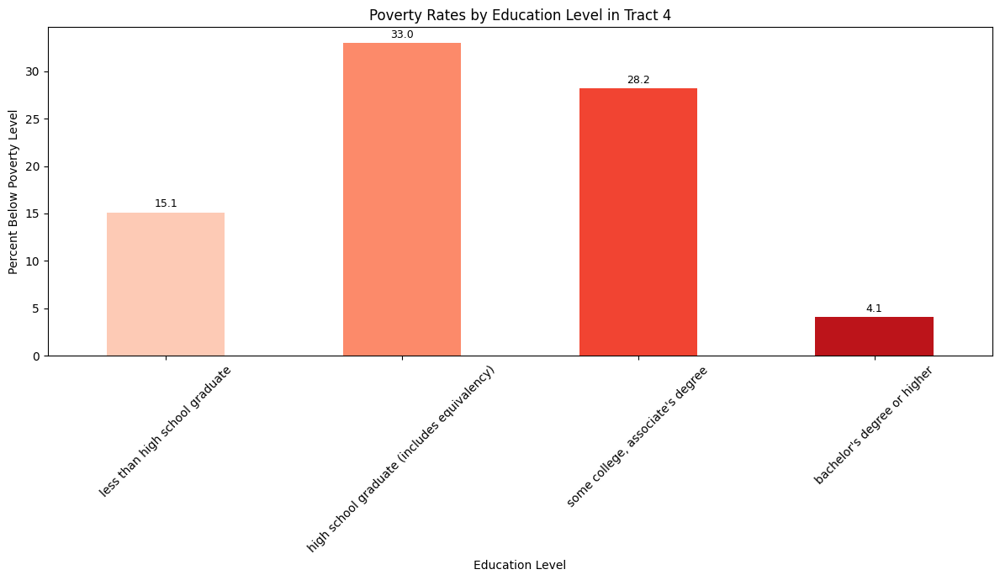

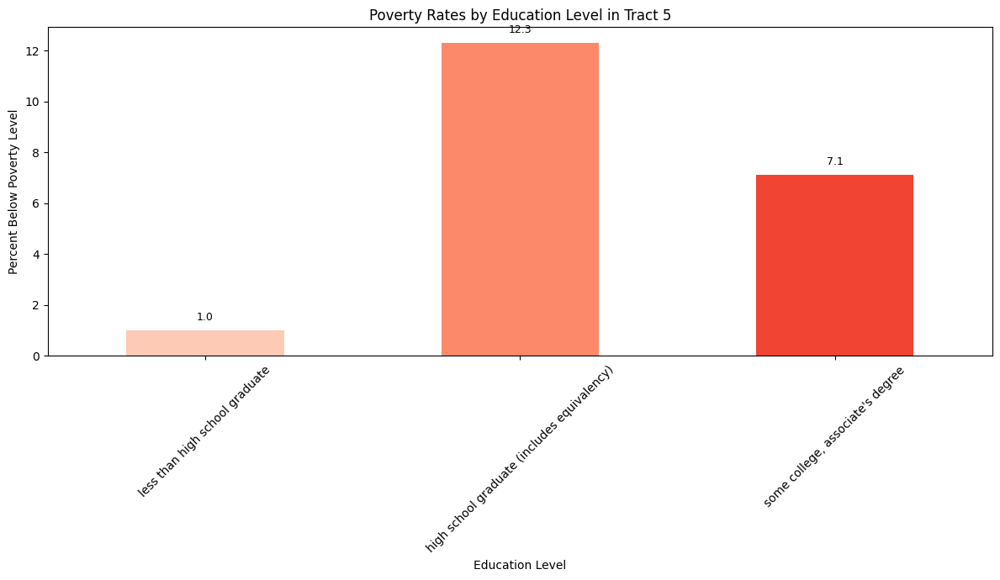

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\poverty'
file_names = [f'poverty_{i}.csv' for i in range(1, 6)]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define educational groups of interest
education_groups = [
    'less than high school graduate',
    'high school graduate (includes equivalency)',
    'some college, associate\'s degree',
    'bachelor\'s degree or higher'
]

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=len(education_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Filter data for educational groups
    filtered_education_data = data[data['Label (Grouping)'].isin(education_groups)]
    grouped_education_data = filtered_education_data.set_index('Label (Grouping)')[poverty_column]

    # Remove zero values
    grouped_education_data = grouped_education_data[grouped_education_data > 0]

    # Plotting educational groups
    plt.figure(figsize=(12, 7))  # Adjusting figure size for better visibility
    bars = grouped_education_data.plot(kind='bar', color=palette)
    plt.xlabel('Education Level')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Education Level in Tract {tract_number}')
    plt.xticks(rotation=45)  # Rotate labels for better readability

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_education_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)  # Adding '%' to the label

    plt.tight_layout()
    plt.show()


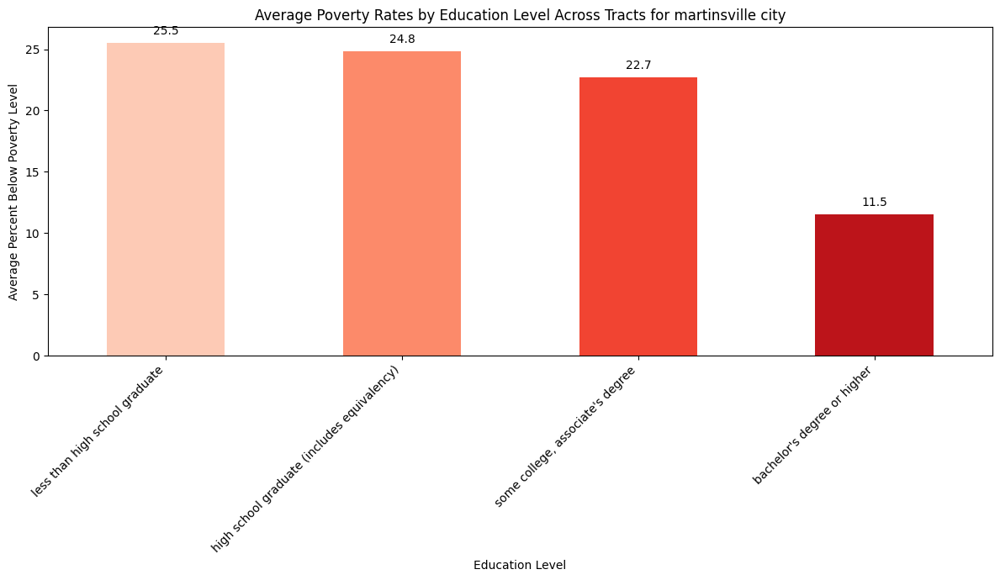

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\poverty'
file_names = [f'poverty_{i}.csv' for i in range(1, 6)]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define educational groups of interest
education_groups = [
    'less than high school graduate',
    'high school graduate (includes equivalency)',
    'some college, associate\'s degree',
    'bachelor\'s degree or higher'
]

# Initialize DataFrame to collect all education group data
education_data = pd.DataFrame(columns=education_groups)

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=len(education_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract the full tract number including the decimal from the filename
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Construct the column name for the poverty rate
    poverty_column = f'Census Tract {tract_number}; Martinsville city; Virginia!!Percent below poverty level!!Estimate'

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter data for educational groups and accumulate
    filtered_education_data = data[data['Label (Grouping)'].isin(education_groups)]
    for group in education_groups:
        group_data = filtered_education_data[filtered_education_data['Label (Grouping)'] == group]
        if group_data.empty:
            continue
        group_value = group_data[poverty_column].mean()
        education_data.at[group, tract_number] = group_value

# Compute averages across all tracts for each education group
education_data = education_data.apply(pd.to_numeric, errors='coerce')  # Convert all to float
average_poverty_by_group = education_data.mean(axis=1)

# Plotting the results
plt.figure(figsize=(12, 7))
bars = average_poverty_by_group.plot(kind='bar', color=palette)  # Save the plot to add annotations
plt.xlabel('Education Level')
plt.ylabel('Average Percent Below Poverty Level')
plt.title('Average Poverty Rates by Education Level Across Tracts for martinsville city')
plt.xticks(rotation=45, ha='right')

# Adding numbers to the top of each bar
for i, value in enumerate(average_poverty_by_group):
    plt.text(i, value + 0.5, f'{value:.1f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



### Educational Attainment and Poverty Rates in Martinsville City

In Martinsville City, poverty rates exhibit a clear correlation with educational attainment across various census tracts, showcasing a general trend where higher education levels tend to correspond with lower poverty rates. In Tract 1, those with less than a high school diploma face a poverty rate of 24.9%, which sharply increases to 46.2% for high school graduates. However, individuals with some college or an associate's degree see a reduction in poverty to 25.6%. Tract 2 presents a stark contrast where 55.3% of those without a high school diploma live in poverty, yet this rate drops significantly to 20.7% among high school graduates and further declines to 20.0% for those with a bachelor’s degree or higher. Tract 3 reveals a peculiar pattern where the highest poverty rate is 33.5% for those with a bachelor's degree, suggesting unique local economic or demographic factors at play. Tract 4 and Tract 5 also display varying poverty levels across educational groups, with Tract 4 showing a high poverty rate of 33.0% among high school graduates, and Tract 5 observing the highest poverty of 12.3% in the same demographic. These observations underline the complex interplay between education and economic stability, highlighting the critical role of educational advancement in combating poverty in Martinsville City.


<a name="2f"></a>
### **Poverty Rates by Education Level in Henry County**

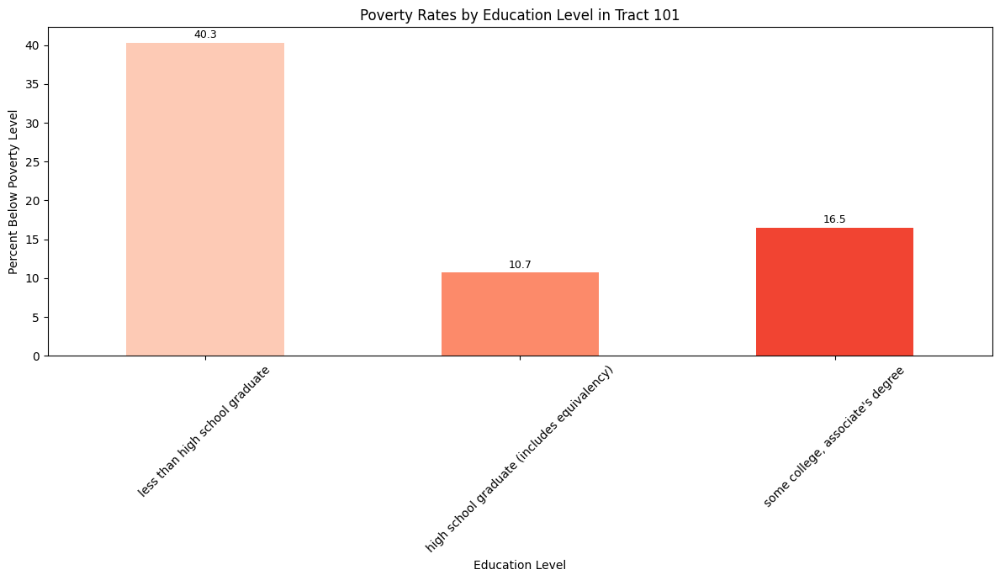

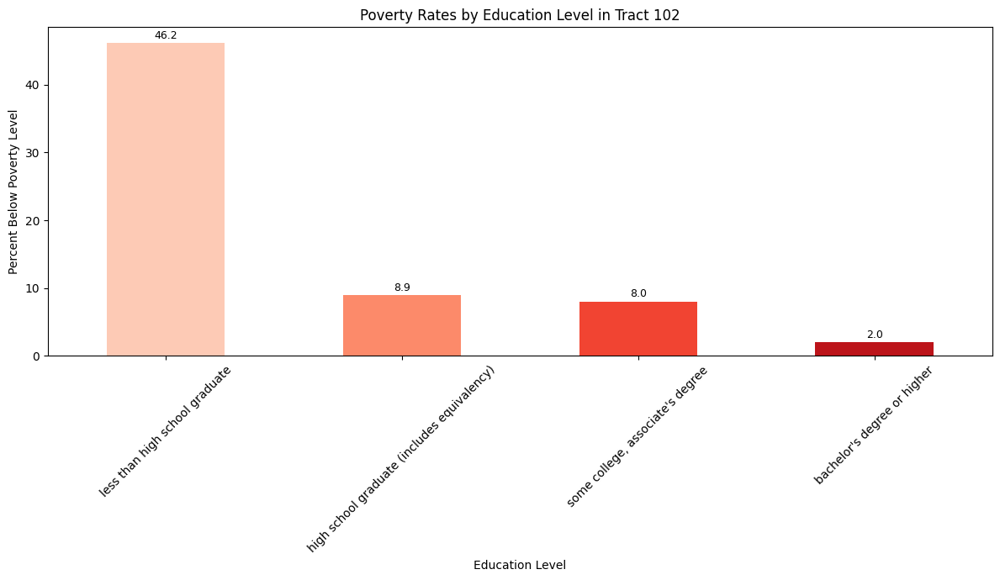

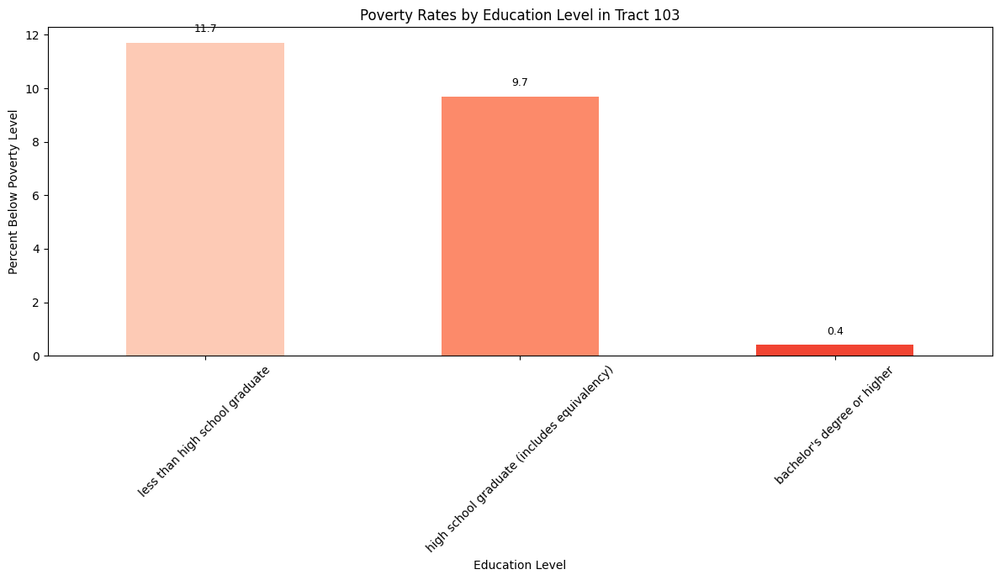

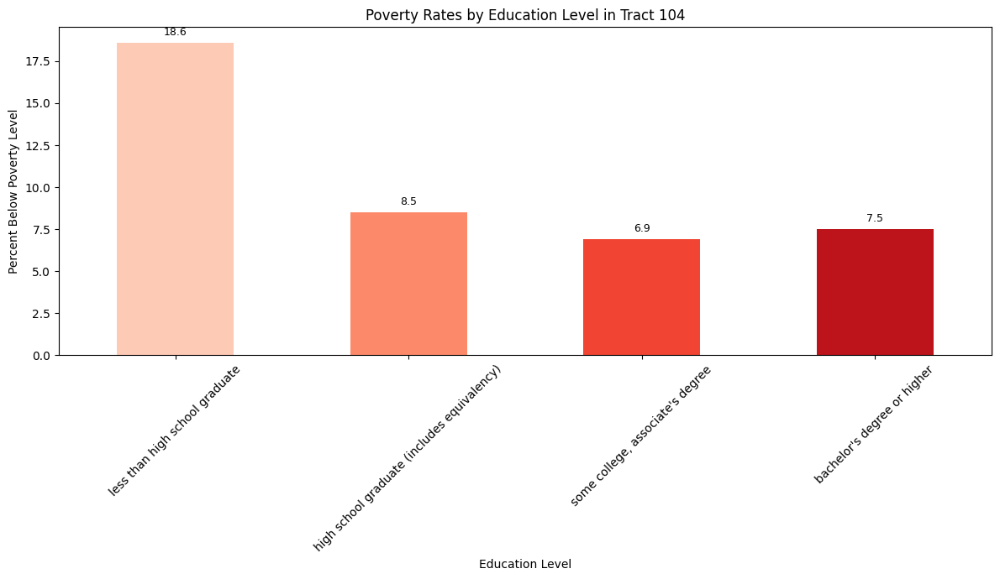

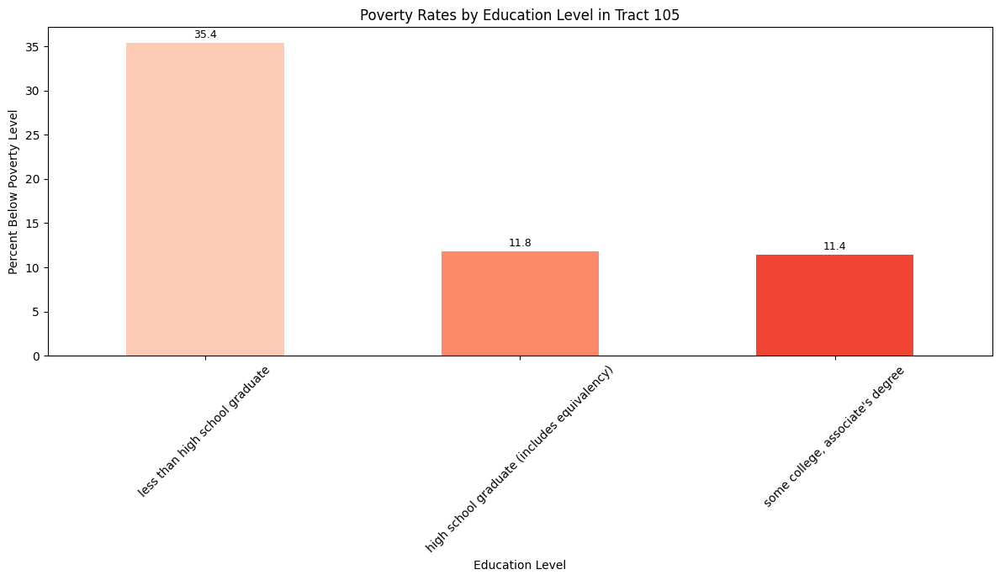

...

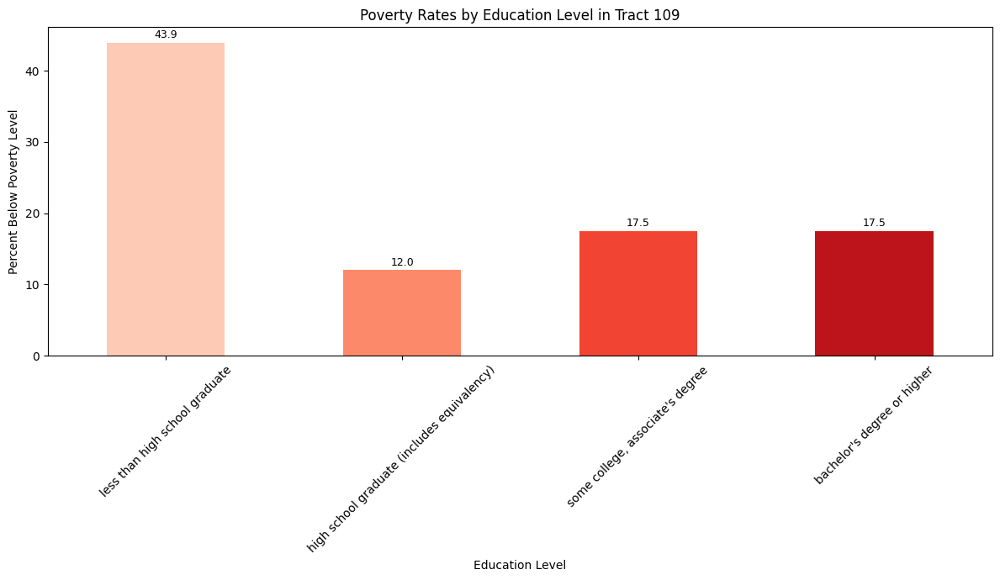

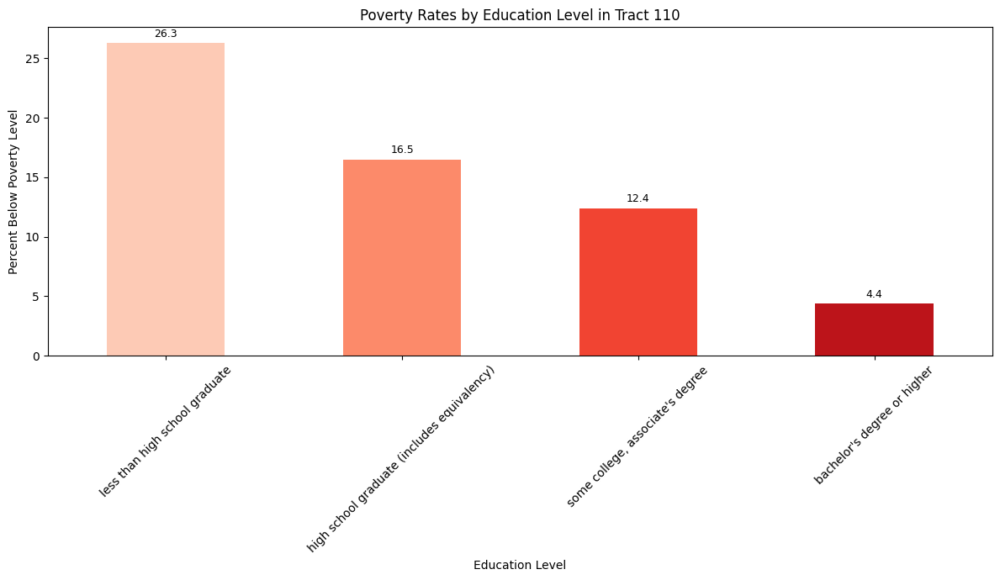

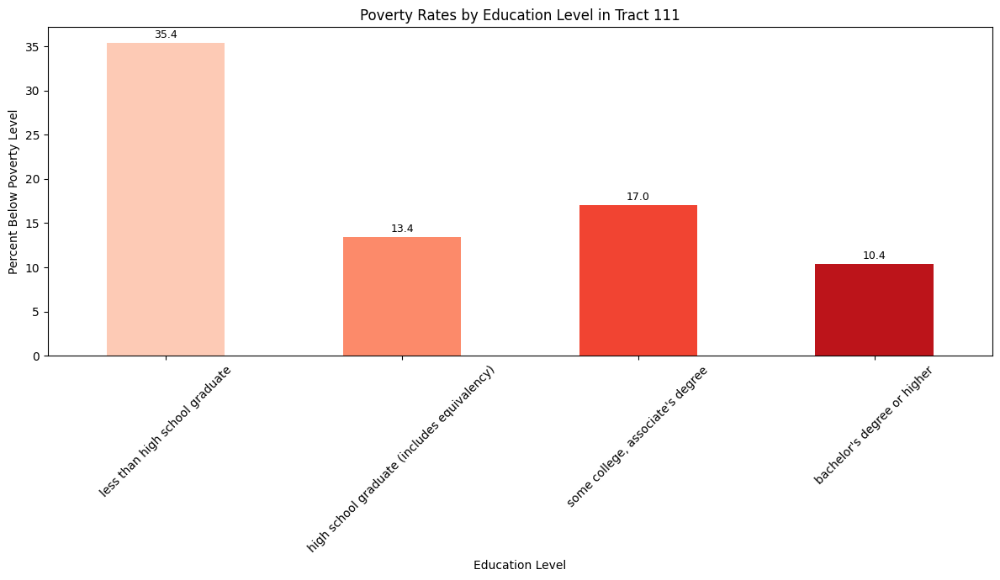

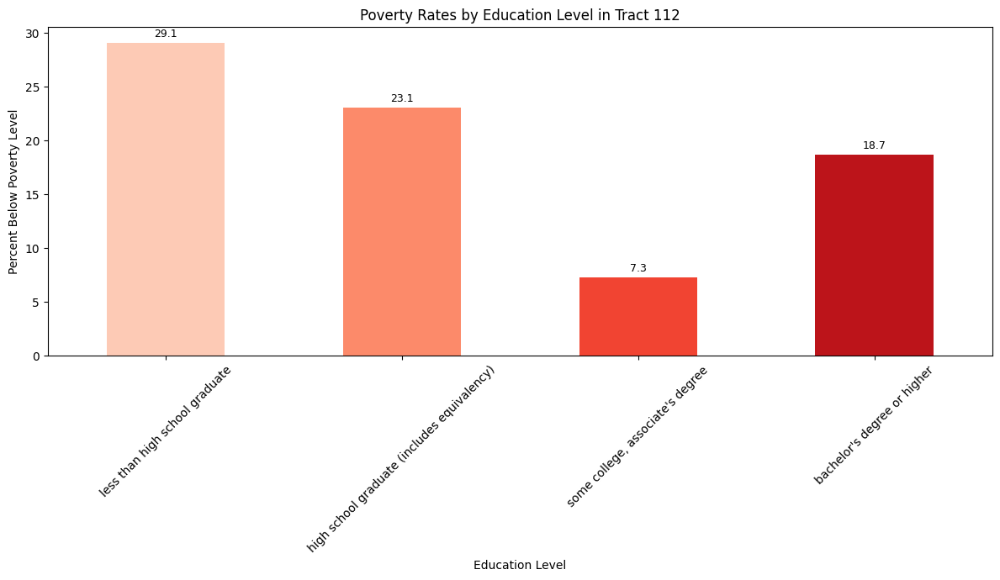

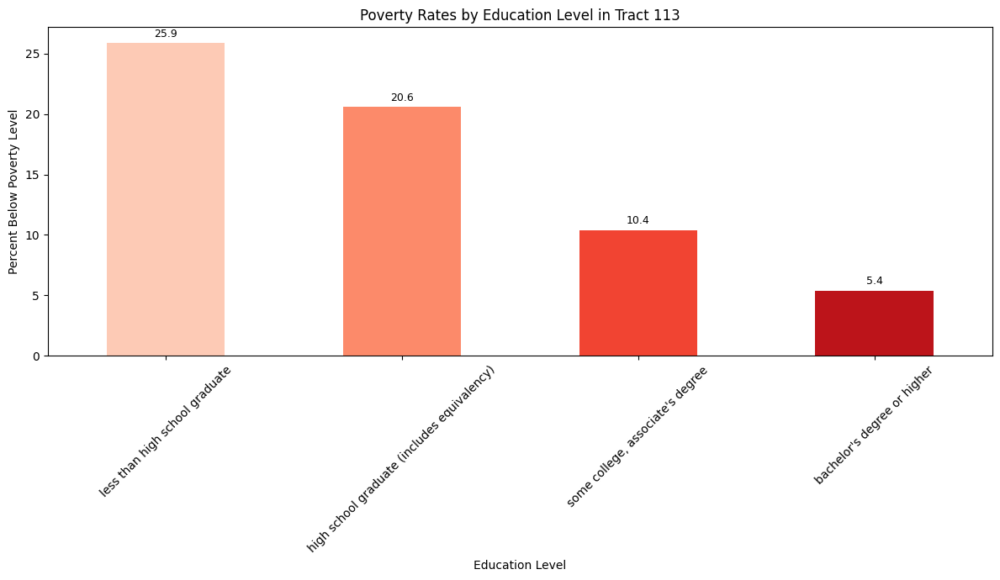

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\poverty'
file_names = [f'poverty_{i}.csv' for i in range(101, 114) if i != 106]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define educational groups of interest
education_groups = [
    'less than high school graduate',
    'high school graduate (includes equivalency)',
    'some college, associate\'s degree',
    'bachelor\'s degree or higher'
]

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=len(education_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Filter data for educational groups
    filtered_education_data = data[data['Label (Grouping)'].isin(education_groups)]
    grouped_education_data = filtered_education_data.set_index('Label (Grouping)')[poverty_column]

    # Remove zero values
    grouped_education_data = grouped_education_data[grouped_education_data > 0]

    # Plotting educational groups
    plt.figure(figsize=(12, 7))  # Adjusting figure size for better visibility
    bars = grouped_education_data.plot(kind='bar', color=palette)
    plt.xlabel('Education Level')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Education Level in Tract {tract_number}')
    plt.xticks(rotation=45)  # Rotate labels for better readability

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_education_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)  # Adding '%' to the label

    plt.tight_layout()
    plt.show()


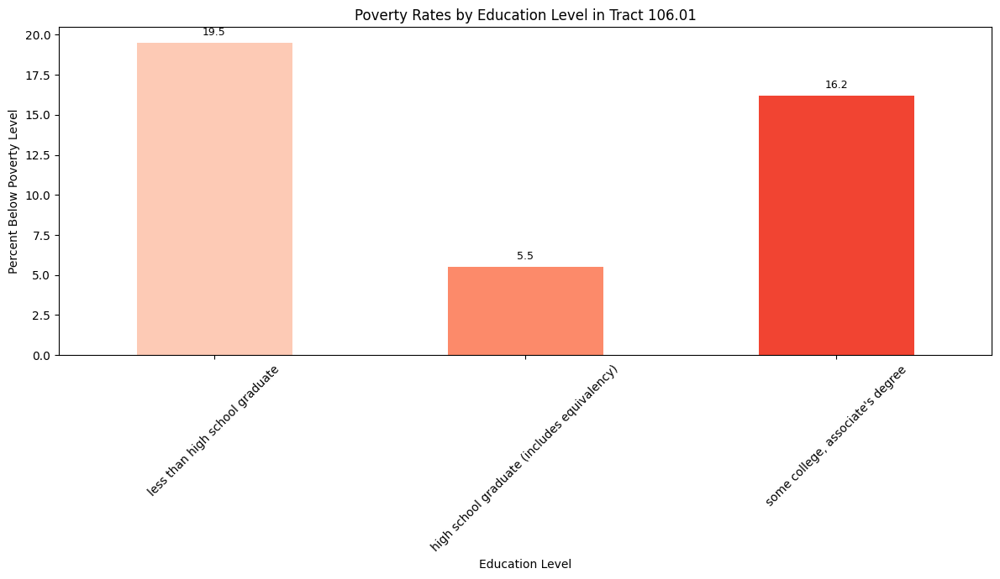

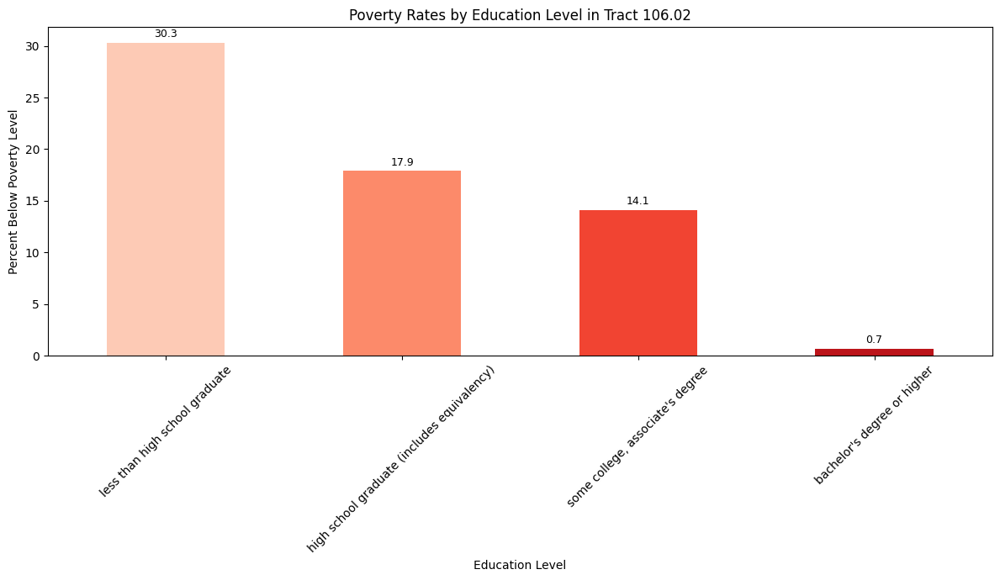

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = ['poverty_106.01.csv', 'poverty_106.02.csv']
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Define educational groups of interest
education_groups = [
    'less than high school graduate',
    'high school graduate (includes equivalency)',
    'some college, associate\'s degree',
    'bachelor\'s degree or higher'
]

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=len(education_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0] + '.' + file_path.split('_')[-1].split('.')[1]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Use to_numeric for safe conversion
    )

    # Filter data for educational groups
    filtered_education_data = data[data['Label (Grouping)'].isin(education_groups)]
    grouped_education_data = filtered_education_data.set_index('Label (Grouping)')[poverty_column]

    # Remove zero values
    grouped_education_data = grouped_education_data[grouped_education_data > 0]

    # Plotting educational groups
    plt.figure(figsize=(12, 7))  # Adjusting figure size for better visibility
    bars = grouped_education_data.plot(kind='bar', color=palette)
    plt.xlabel('Education Level')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Education Level in Tract {tract_number}')
    plt.xticks(rotation=45)  # Rotate labels for better readability

    # Adding numbers to the top of each bar with adjusted positioning
    for i, value in enumerate(grouped_education_data):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


Across the analyzed tracts, a general trend of decreasing poverty rates with higher education levels is observed, though with notable variations. Those without a high school diploma consistently face the highest poverty rates, ranging from 19.5% to 46.2%. While higher education typically correlates with lower poverty rates, some tracts show anomalies, such as higher rates for bachelor's degree holders compared to those with some college (Tract 112), or increased rates for associate's degree holders (Tract 108). The impact of education on poverty reduction varies significantly between tracts, with some showing steady decreases (Tract 113) and others displaying more complex patterns (Tract 106.01). Overall, while education generally improves economic outcomes, local factors appear to play a significant role in determining the strength and consistency of this relationship.

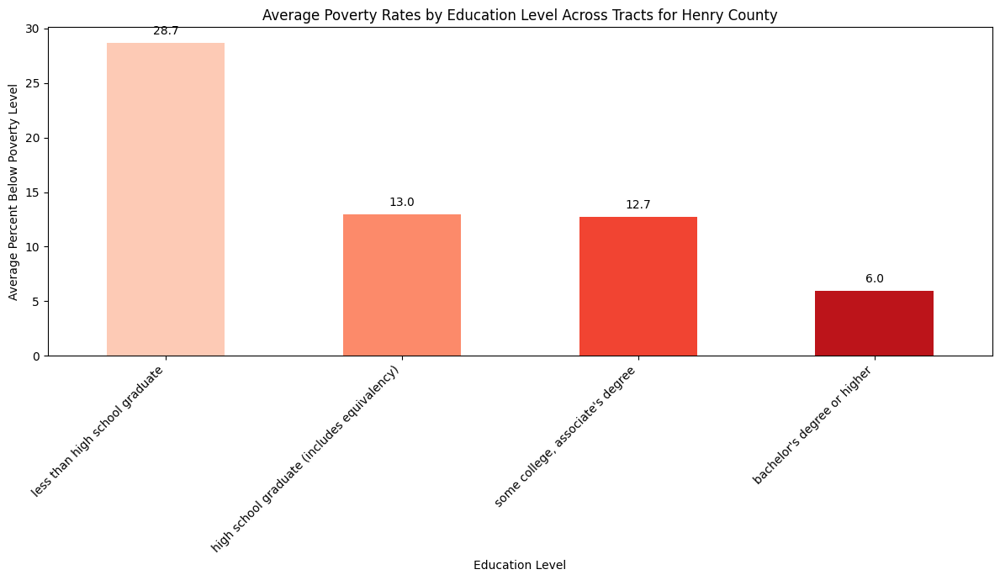

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\poverty'
directory_path_extras = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = [f'poverty_{i}.csv' for i in range(101, 114) if i != 106]  # For main directory
file_names += ['poverty_106.01.csv', 'poverty_106.02.csv']  # For extras directory
files = [os.path.join(directory_path, file_name) for file_name in file_names[:-2]]
files += [os.path.join(directory_path_extras, file_name) for file_name in file_names[-2:]]

# Define educational groups of interest
education_groups = [
    'less than high school graduate',
    'high school graduate (includes equivalency)',
    'some college, associate\'s degree',
    'bachelor\'s degree or higher'
]

# Initialize DataFrame to collect all education group data
education_data = pd.DataFrame(columns=education_groups)

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=len(education_groups))

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip().str.lower()

    # Extract the full tract number including the decimal from the filename
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Construct the column name for the poverty rate
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter data for educational groups and accumulate
    filtered_education_data = data[data['Label (Grouping)'].isin(education_groups)]
    for group in education_groups:
        group_data = filtered_education_data[filtered_education_data['Label (Grouping)'] == group]
        if group_data.empty:
            continue
        group_value = group_data[poverty_column].mean()
        education_data.at[group, tract_number] = group_value

# Compute averages across all tracts for each education group
education_data = education_data.apply(pd.to_numeric, errors='coerce')  # Convert all to float
average_poverty_by_group = education_data.mean(axis=1)

# Plotting the results
plt.figure(figsize=(12, 7))
bars = average_poverty_by_group.plot(kind='bar', color=palette)  # Save the plot to add annotations
plt.xlabel('Education Level')
plt.ylabel('Average Percent Below Poverty Level')
plt.title('Average Poverty Rates by Education Level Across Tracts for Henry County')
plt.xticks(rotation=45, ha='right')

# Adding numbers to the top of each bar
for i, value in enumerate(average_poverty_by_group):
    plt.text(i, value + 0.5, f'{value:.1f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



<a name="2g"></a>
### **Poverty Rates by Employment Status in Martinsville City**

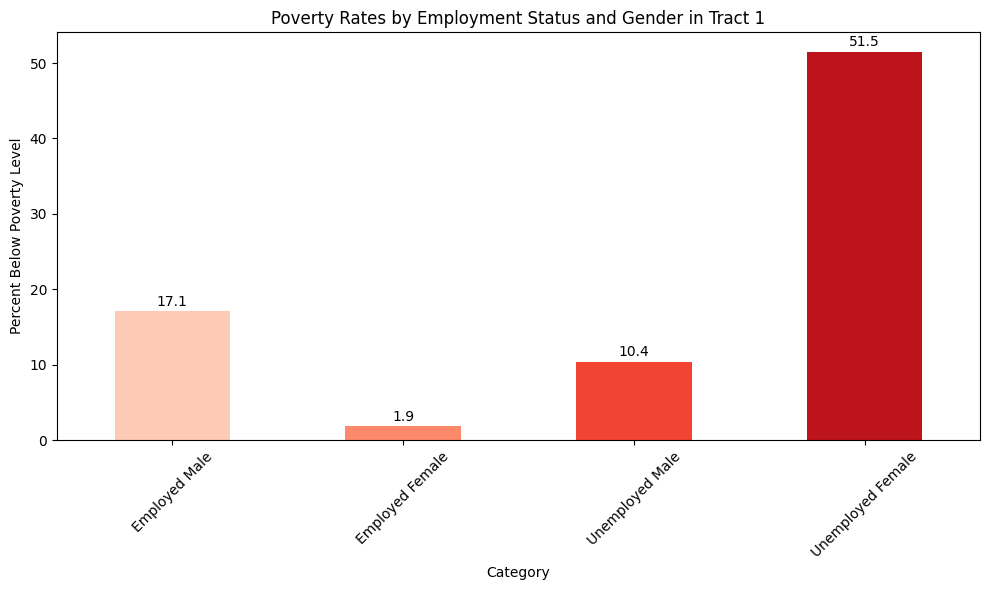

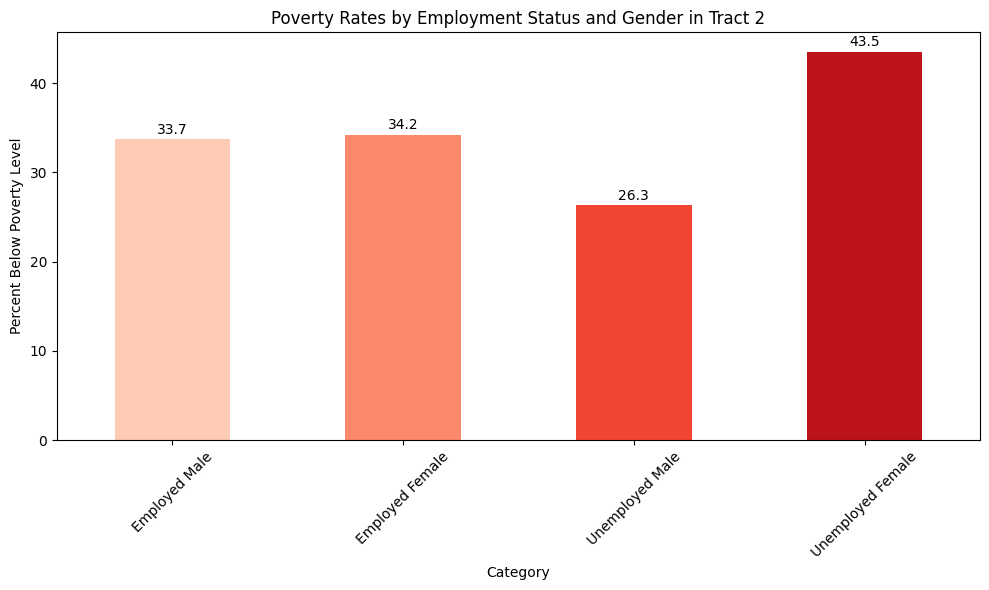

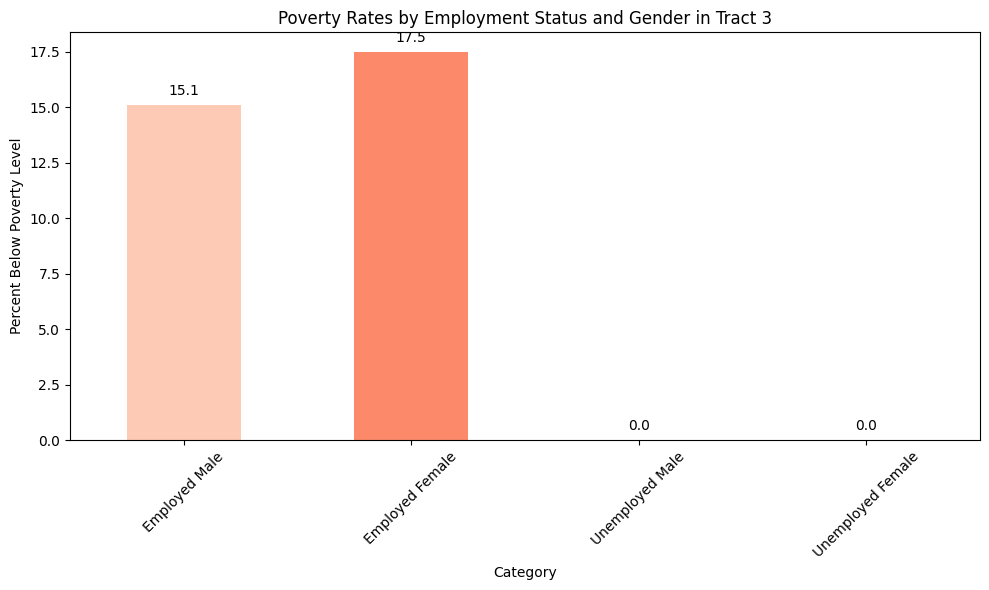

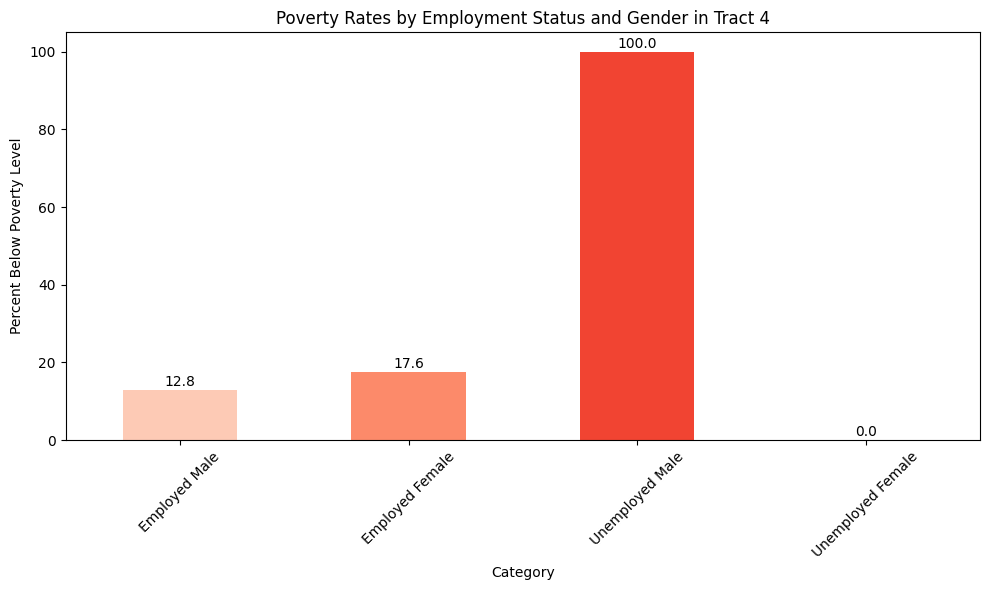

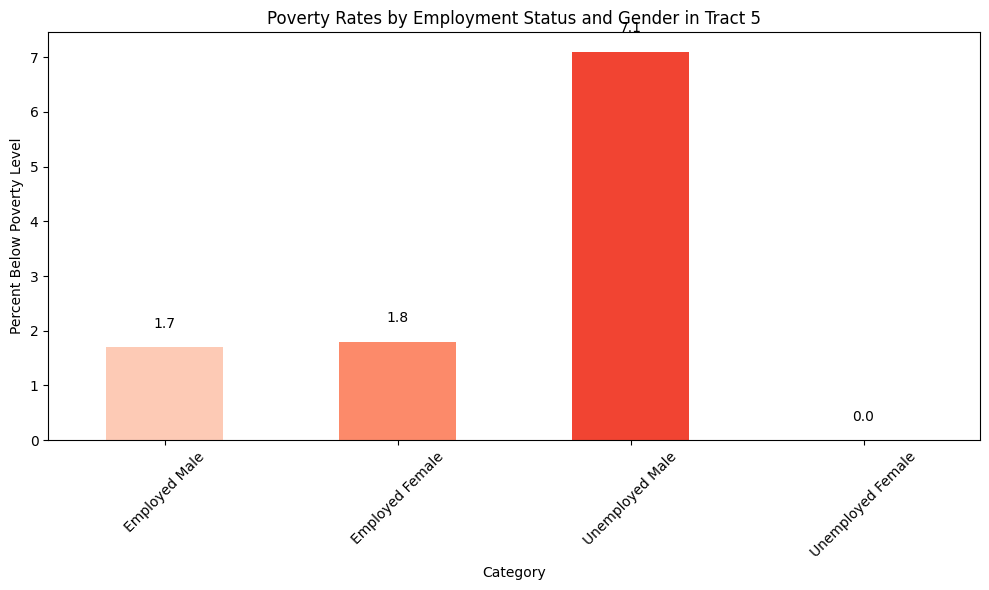

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\poverty'
file_names = [f'poverty_{i}.csv' for i in range(1, 6)]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=4)

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {file_path.split("_")[-1].split(".")[0]}; Martinsville city; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Convert to numeric, coerce errors
    )

    # Find indices for 'Employed' and 'Unemployed'
    employed_index = data[data['Label (Grouping)'].str.contains('Employed', case=False, na=False)].index[0]
    unemployed_index = data[data['Label (Grouping)'].str.contains('Unemployed', case=False, na=False)].index[0]

    # Get rows for 'Male' and 'Female' under both categories
    employed_male = data.iloc[employed_index + 1]
    employed_female = data.iloc[employed_index + 2]
    unemployed_male = data.iloc[unemployed_index + 1]
    unemployed_female = data.iloc[unemployed_index + 2]

    # Prepare data for plotting
    plot_data = pd.DataFrame({
        'Category': ['Employed Male', 'Employed Female', 'Unemployed Male', 'Unemployed Female'],
        'Percent': [
            employed_male[poverty_column],
            employed_female[poverty_column],
            unemployed_male[poverty_column],
            unemployed_female[poverty_column]
        ]
    })

    # Plotting
    plt.figure(figsize=(10, 6))
    bars = plot_data.set_index('Category')['Percent'].plot(kind='bar', color=palette)
    plt.xlabel('Category')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Employment Status and Gender in Tract {file_path.split("_")[-1].split(".")[0]}')
    plt.xticks(rotation=45)

    # Adding value labels on top of each bar
    for i, value in enumerate(plot_data['Percent']):
        plt.text(i, value + 0.3, f'{value:.1f}', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()


### Impact of Employment Status and Gender on Poverty in Martinsville City

The analysis of poverty rates by employment status and gender in Martinsville City reveals significant disparities across five census tracts. In Tract 1, employed males experience a poverty rate of 17.1%, which contrasts sharply with the 51.5% rate among unemployed females, highlighting a profound impact of employment status combined with gender on poverty levels. Tract 2 shows nearly equal poverty rates for employed males and females at around 34%, but unemployment increases these rates, especially for females at 43.5%. Tract 3 presents a more balanced view among employed individuals, with both genders showing lower poverty rates at around 15%, while no data for unemployed groups suggest full employment or unreported statuses in the tract. Tract 4 exhibits the most striking figure, where 100% of unemployed males are below the poverty level, demonstrating the severe consequences of job loss. In contrast, Tract 5 has the lowest poverty rates for employed individuals, around 1.7% for males and 1.8% for females, yet unemployed males face a significant increase to 7%, with no data for unemployed females. These findings underscore the critical link between employment, gender, and economic stability, with unemployment consistently correlating with higher poverty rates, particularly affecting females more than males across different tracts.


<a name="2h"></a>
### **Poverty Rates by Employment Status in Henry County**

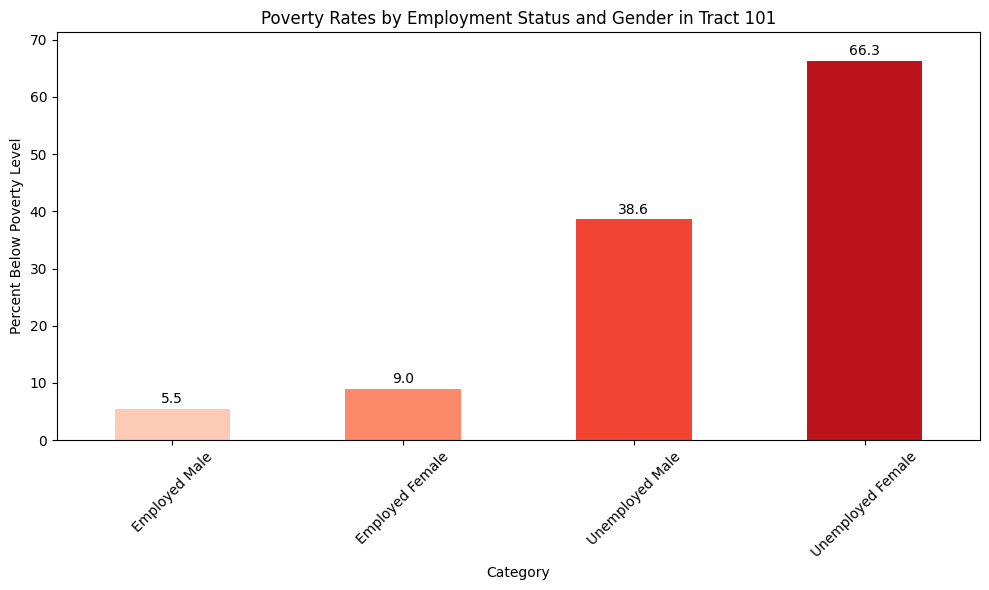

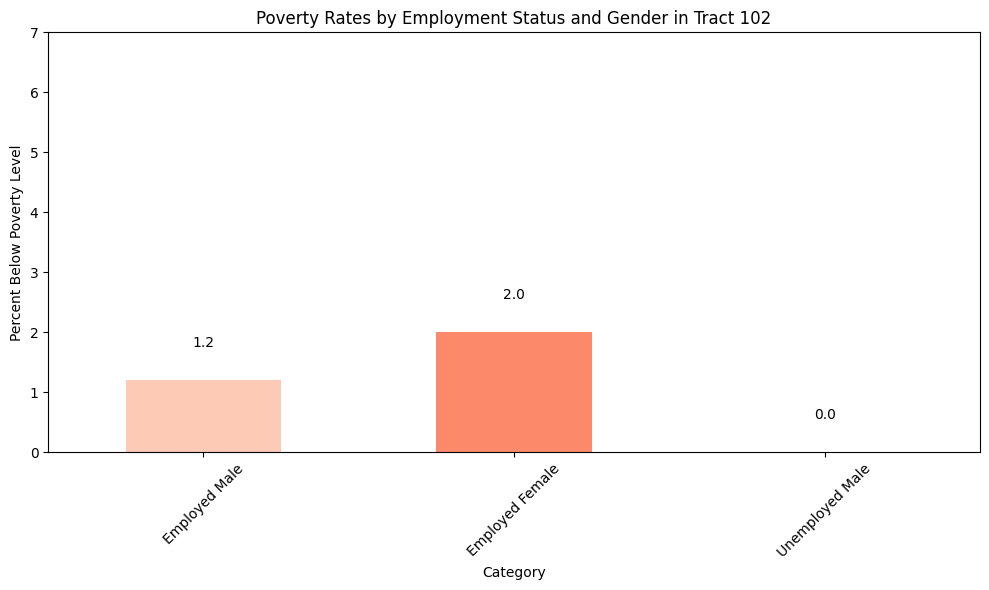

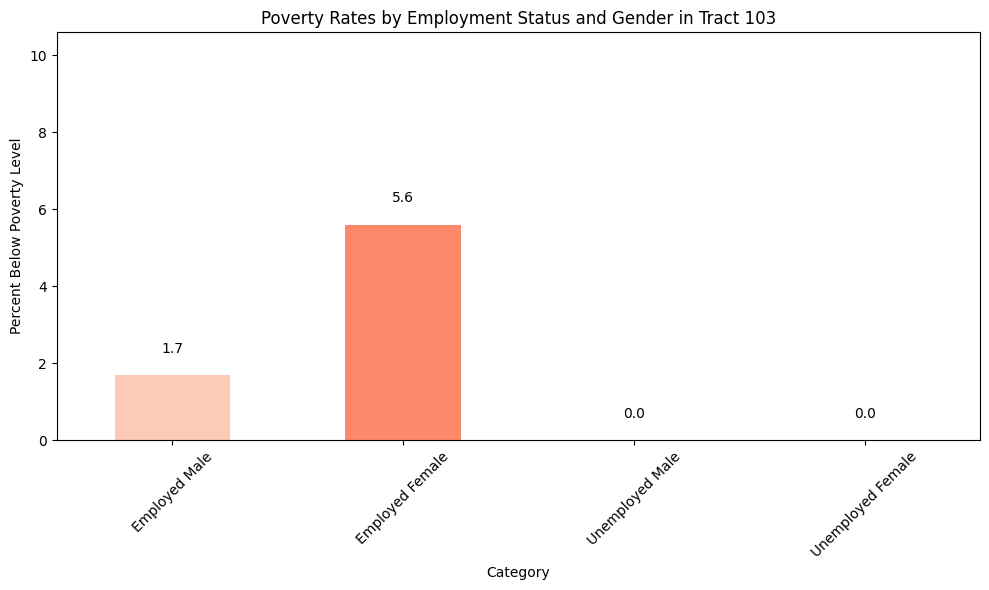

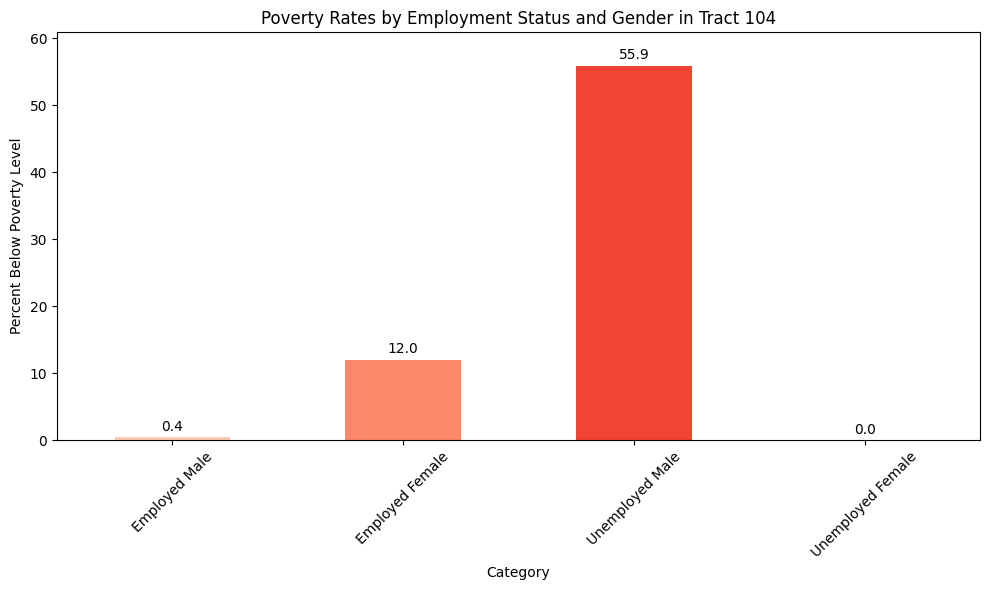

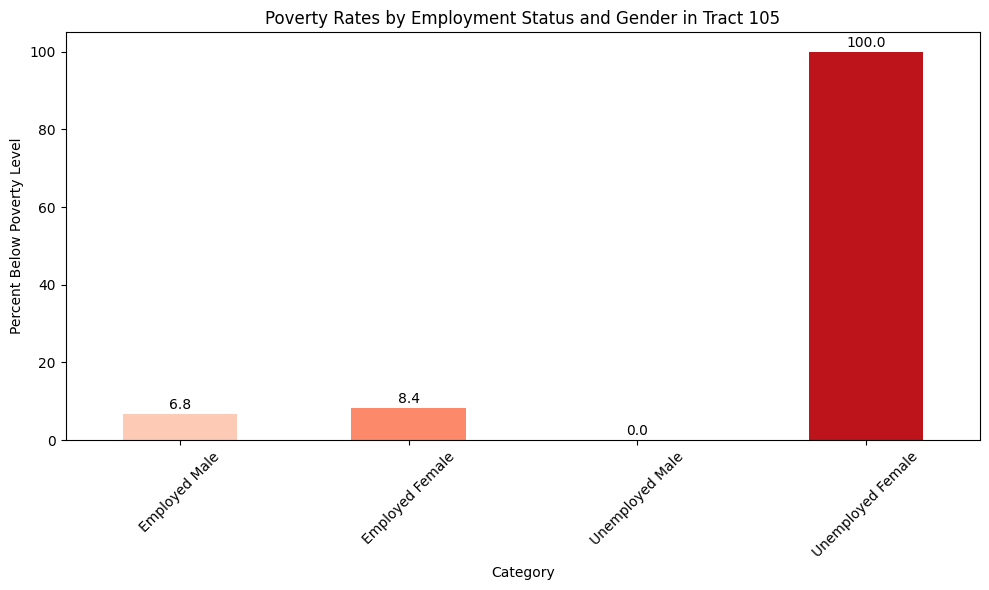

...

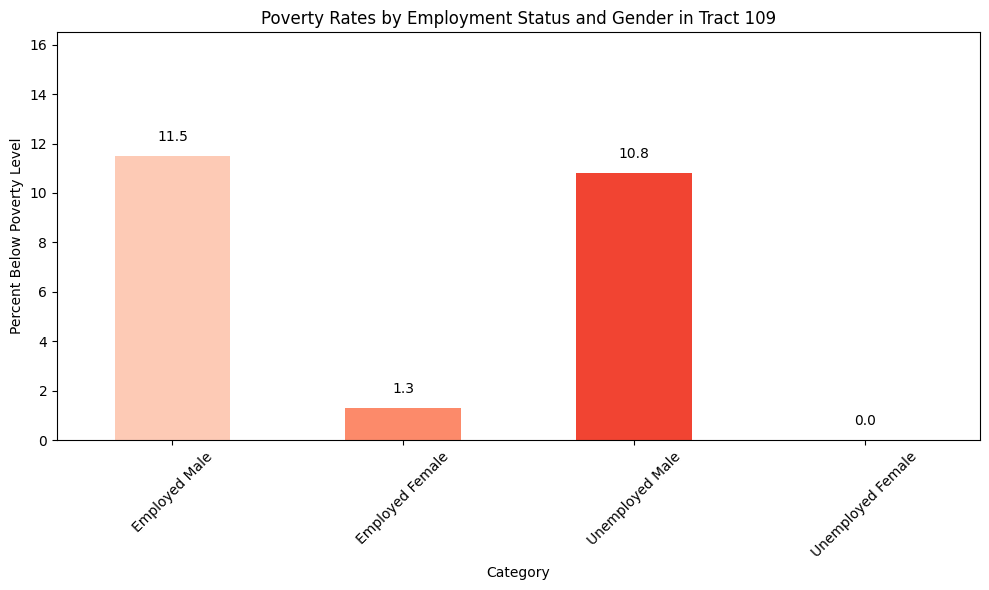

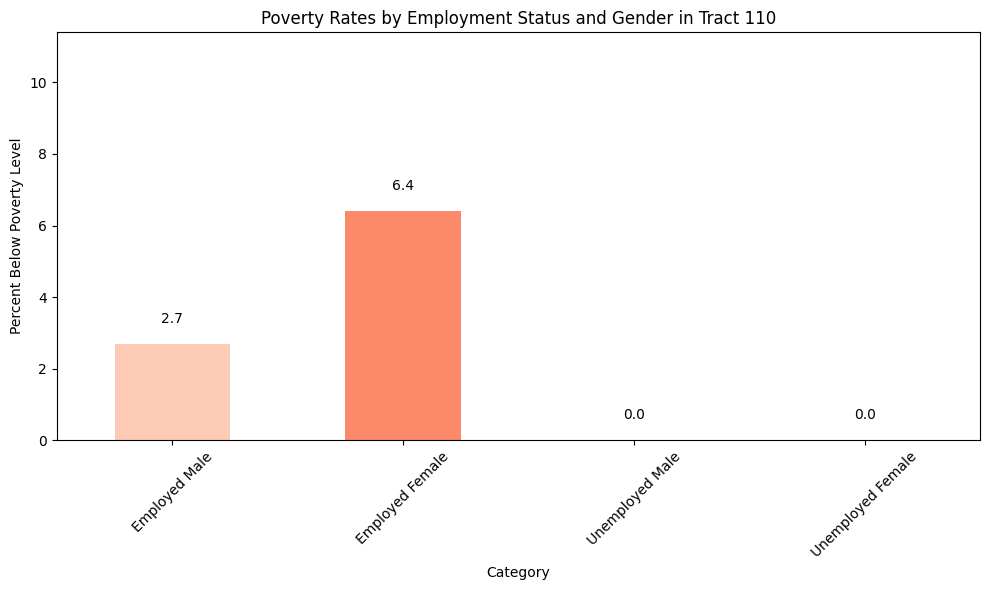

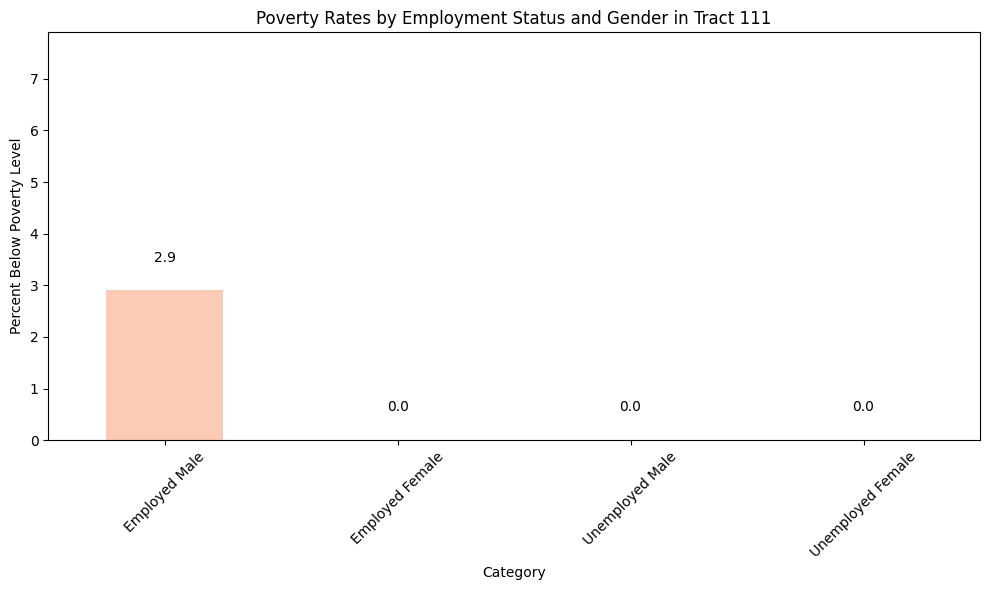

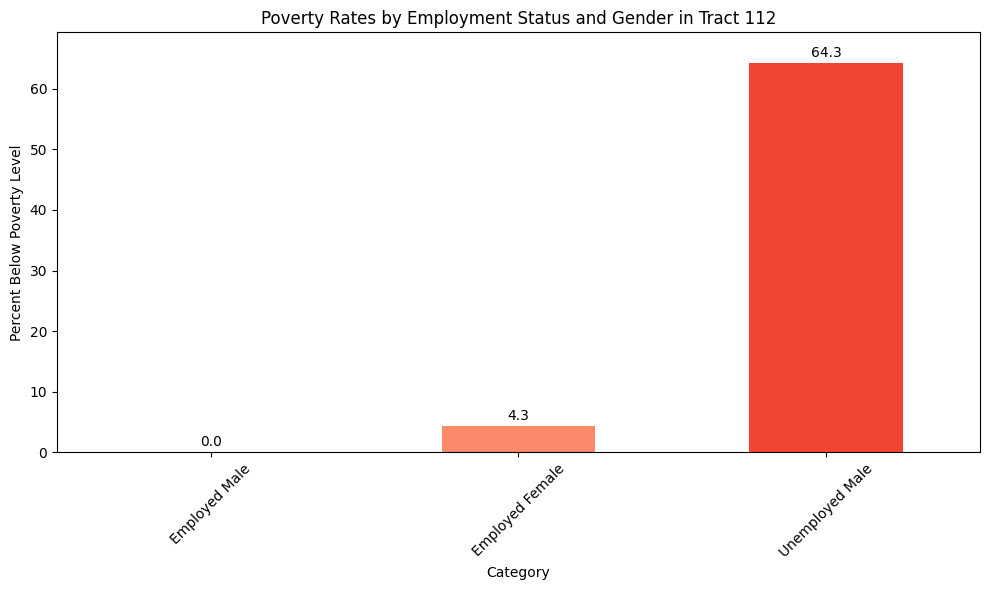

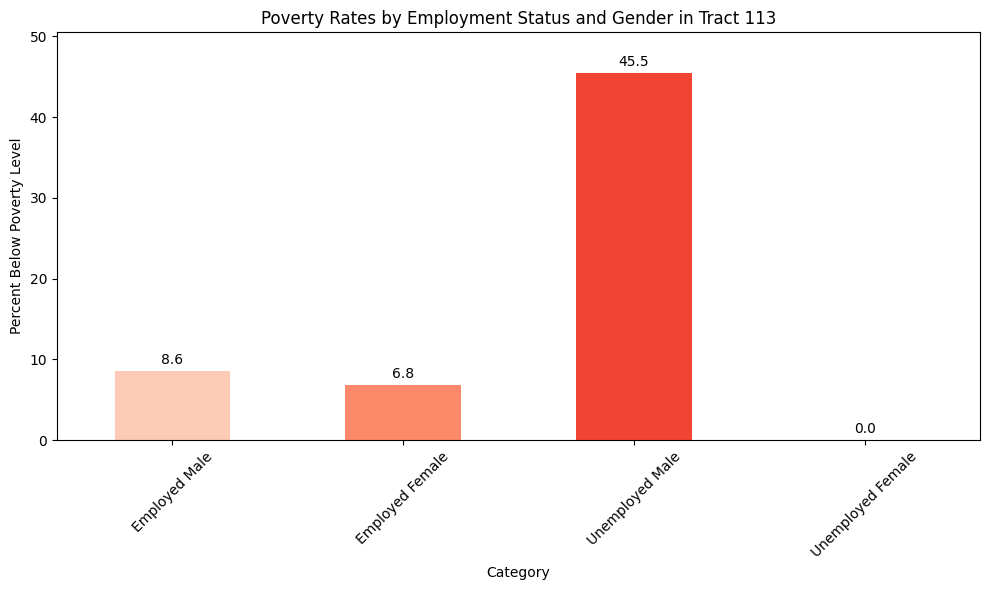

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\poverty'
file_names = [f'poverty_{i}.csv' for i in range(101, 114) if i != 106]
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=4)

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {file_path.split("_")[-1].split(".")[0]}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Convert to numeric, coerce errors
    )

    # Ensure there are no NaN values in the crucial data
    if data[poverty_column].isna().all():
        continue  # Skip this file if all entries are NaN

    # Find indices for 'Employed' and 'Unemployed'
    employed_index = data[data['Label (Grouping)'].str.contains('Employed', case=False, na=False)].index
    unemployed_index = data[data['Label (Grouping)'].str.contains('Unemployed', case=False, na=False)].index

    if employed_index.empty or unemployed_index.empty:
        continue  # Skip if no employed or unemployed data is found

    employed_index = employed_index[0]
    unemployed_index = unemployed_index[0]

    # Get rows for 'Male' and 'Female' under both categories
    employed_male = data.iloc[employed_index + 1][poverty_column]
    employed_female = data.iloc[employed_index + 2][poverty_column]
    unemployed_male = data.iloc[unemployed_index + 1][poverty_column]
    unemployed_female = data.iloc[unemployed_index + 2][poverty_column]

    # Prepare data for plotting
    plot_data = pd.DataFrame({
        'Category': ['Employed Male', 'Employed Female', 'Unemployed Male', 'Unemployed Female'],
        'Percent': [
            employed_male,
            employed_female,
            unemployed_male,
            unemployed_female
        ]
    })

    # Drop any rows with NaN values
    plot_data.dropna(inplace=True)

    # Plotting
    plt.figure(figsize=(10, 6))
    bars = plot_data.set_index('Category')['Percent'].plot(kind='bar', color=palette)
    plt.xlabel('Category')
    plt.ylabel('Percent Below Poverty Level')
    plt.title(f'Poverty Rates by Employment Status and Gender in Tract {file_path.split("_")[-1].split(".")[0]}')
    plt.xticks(rotation=45)

    # Dynamically adjust the y-axis limit
    plt.ylim(0, plot_data['Percent'].max() + 5)  # Add some space above the top of the highest bar

    # Adding value labels on top of each bar
    for i, value in enumerate(plot_data['Percent']):
        plt.text(i, value + 0.5, f'{value:.1f}', ha='center', va='bottom')  # Increased vertical offset

    plt.tight_layout()
    plt.show()


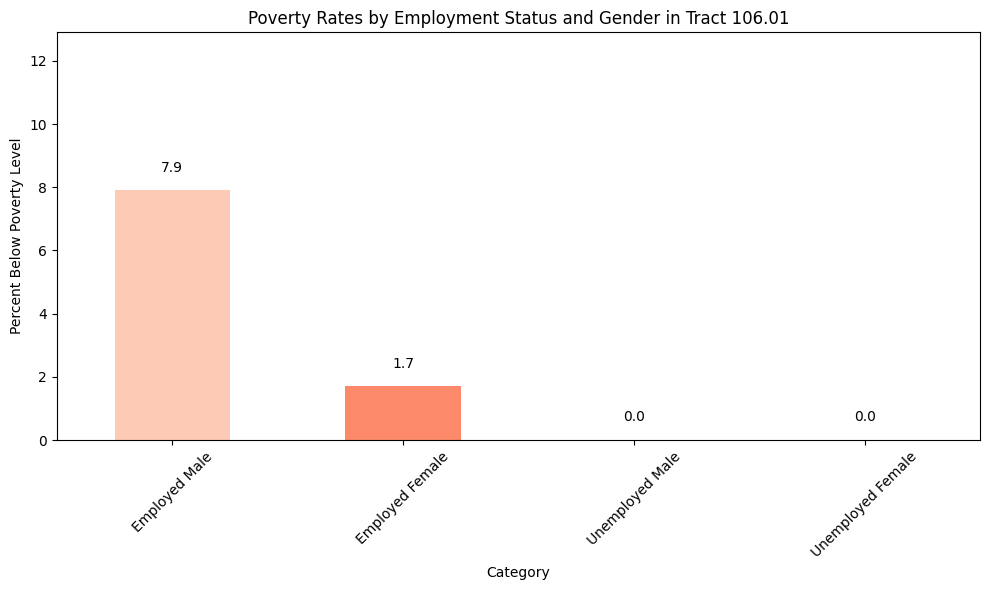

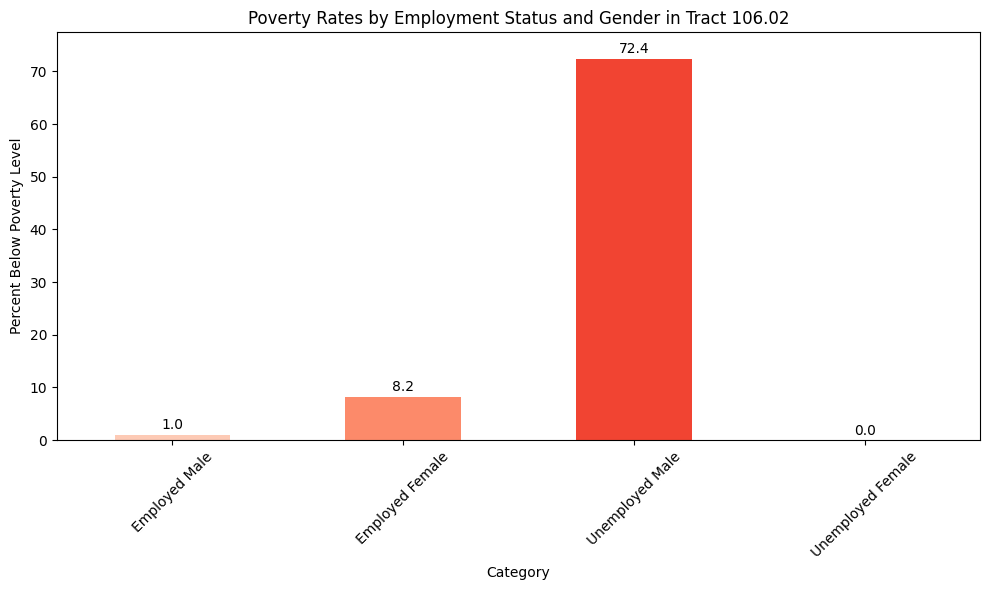

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'
file_names = ['poverty_106.01.csv', 'poverty_106.02.csv']
files = [os.path.join(directory_path, file_name) for file_name in file_names]

# Create a color palette with shades of red (lighter to darker)
palette = sns.color_palette("Reds", n_colors=4)

# Process each file
for file_path in files:
    # Load the data
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Extract tract number from file name
    tract_number = file_path.split('_')[-1].split('.')[0] + '.' + file_path.split('_')[-1].split('.')[1]

    # Remove percentage signs, replace non-numeric '-' with NaN, and safely convert to float
    poverty_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent below poverty level!!Estimate'
    data[poverty_column] = (
        data[poverty_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')  # Convert to numeric, coerce errors
    )

    # Find indices for 'Employed' and 'Unemployed'
    employed_index = data[data['Label (Grouping)'].str.contains('Employed', case=False, na=False)].index
    unemployed_index = data[data['Label (Grouping)'].str.contains('Unemployed', case=False, na=False)].index

    # Check if indices exist and proceed only if both are found
    if not employed_index.empty and not unemployed_index.empty:
        employed_index = employed_index[0]
        unemployed_index = unemployed_index[0]

        # Get rows for 'Male' and 'Female' under both categories
        employed_male = data.iloc[employed_index + 1]
        employed_female = data.iloc[employed_index + 2]
        unemployed_male = data.iloc[unemployed_index + 1]
        unemployed_female = data.iloc[unemployed_index + 2]

        # Prepare data for plotting
        plot_data = pd.DataFrame({
            'Category': ['Employed Male', 'Employed Female', 'Unemployed Male', 'Unemployed Female'],
            'Percent': [
                employed_male[poverty_column],
                employed_female[poverty_column],
                unemployed_male[poverty_column],
                unemployed_female[poverty_column]
            ]
        })

        # Clean data to ensure no NaN values
        plot_data = plot_data.dropna()

        # Plotting
        plt.figure(figsize=(10, 6))
        bars = plot_data.set_index('Category')['Percent'].plot(kind='bar', color=palette)
        plt.xlabel('Category')
        plt.ylabel('Percent Below Poverty Level')
        plt.title(f'Poverty Rates by Employment Status and Gender in Tract {tract_number}')
        plt.xticks(rotation=45)

        # Adjust y-axis limit to add some space above the bars
        max_percent = plot_data['Percent'].max()
        plt.ylim(0, max_percent + 5)

        # Adding value labels on top of each bar
        for i, value in enumerate(plot_data['Percent']):
            plt.text(i, value + 0.5, f'{value:.1f}', ha='center', va='bottom')

        plt.tight_layout()
        plt.show()


The visual data across various tracts highlights a significant disparity in poverty rates based on employment status and gender. Unemployed females consistently exhibit the highest poverty rates, with notable examples being 66.3% in Tract 101. Employed individuals generally have much lower poverty rates, often below 10%. Additional data for tracts 109 through 113 and 106.01 through 106.02 further illustrate these disparities, with unemployed males also showing high poverty rates, such as 72.4% in tract 106.02. The findings underscore the critical role of employment in reducing poverty and emphasize the need for targeted support for unemployed individuals, especially females.

#### **3. Economy, Income, Health and Education based analysis in Martinsville and Henry County**

<a name="3a"></a>
### **Distribution of Occupational Groups in Martinsville City**

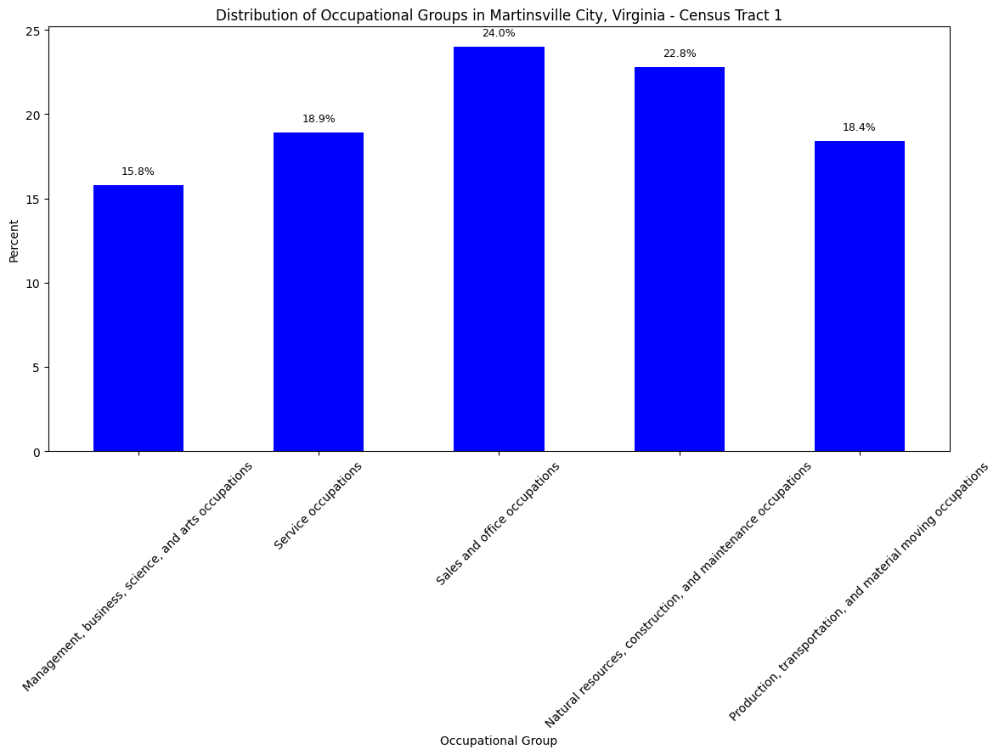

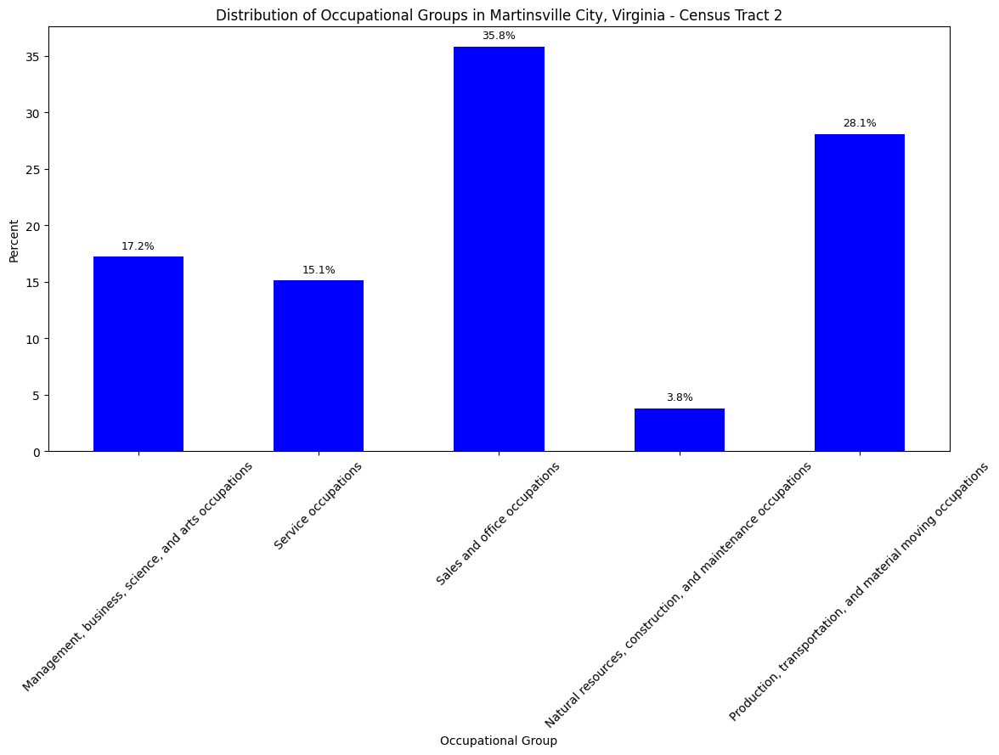

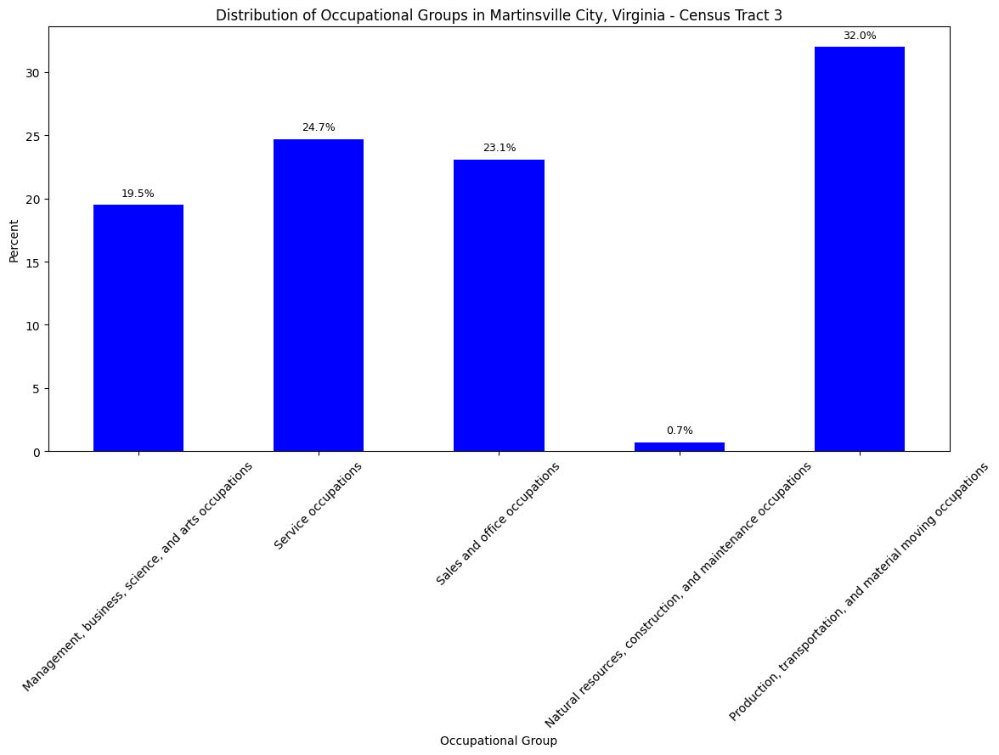

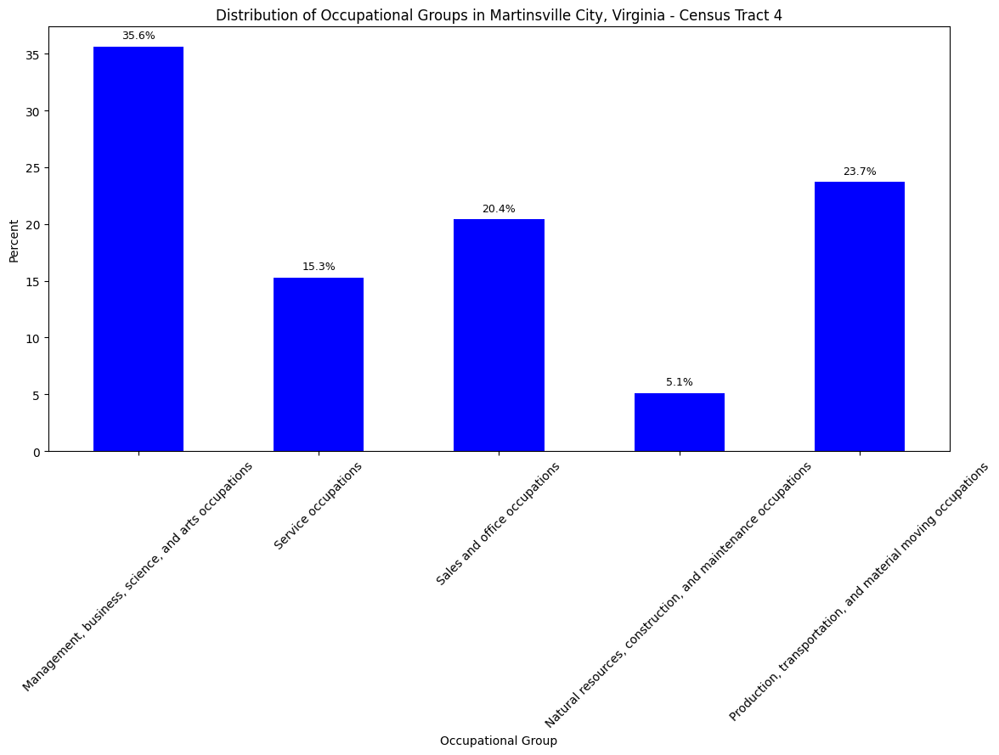

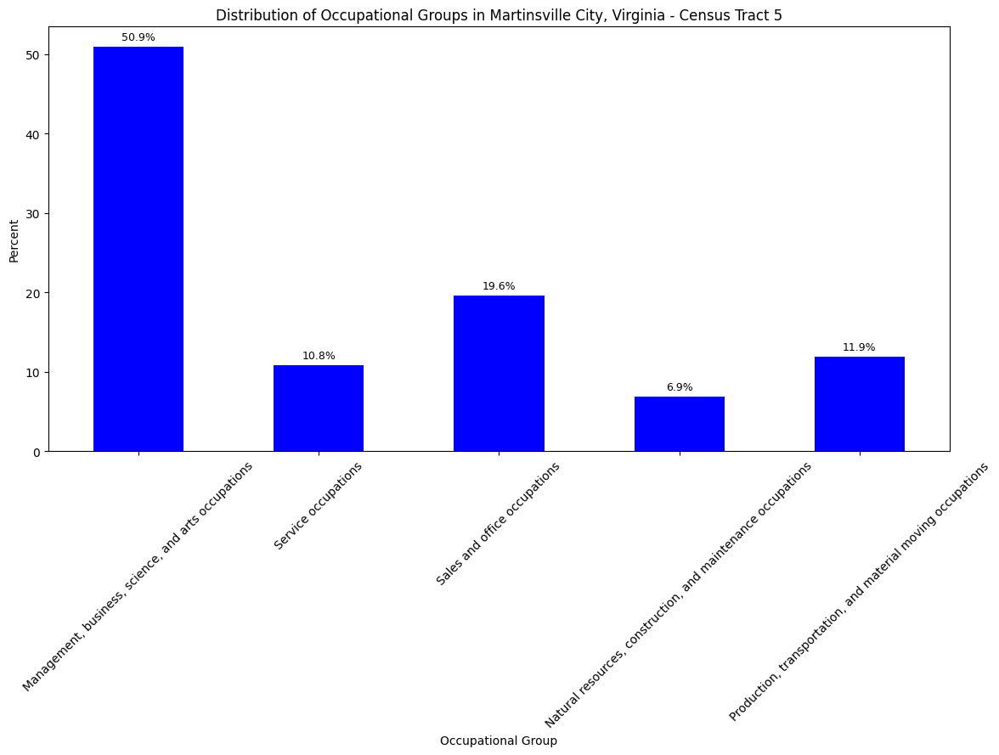

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'

# Define the occupational groups of interest
occupational_groups = [
    'Management, business, science, and arts occupations',
    'Service occupations',
    'Sales and office occupations',
    'Natural resources, construction, and maintenance occupations',
    'Production, transportation, and material moving occupations'
]

# Loop through the files
for i in range(1, 6):
    file_path = os.path.join(directory_path, f'economy_{i}.csv')
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for occupational groups
    filtered_occupational_data = data[data['Label (Grouping)'].isin(occupational_groups)]
    grouped_occupational_data = filtered_occupational_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(12, 9))
    grouped_occupational_data.plot(kind='bar', color='blue')
    plt.xlabel('Occupational Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Occupational Groups in Martinsville City, Virginia - Census Tract {i}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar
    for i, value in enumerate(grouped_occupational_data):
        plt.text(i, value + 0.5, f'{value:.1f}%', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The distribution of occupational groups in Martinsville City, Virginia, varies significantly across different census tracts. In Census Tract 5, the dominant occupational group is Management, Business, Science, and Arts, making up 50.9% of the workforce. Tract 4 shows a more balanced distribution with significant representations in Management (35.6%) and Production occupations (23.7%). Census Tract 3 has the highest percentage in Production occupations at 32%. In Tract 2, Natural resources, construction, and maintenance occupations lead with 28.1%. Finally, Tract 1 shows a high percentage in Sales and office occupations (22.8%) and Production occupations (18.4%). This variety highlights distinct economic characteristics and labor demands within different parts of the city.


<a name="3b"></a>
### **Distribution of Top 5 Industry Sectors in Martinsville City**

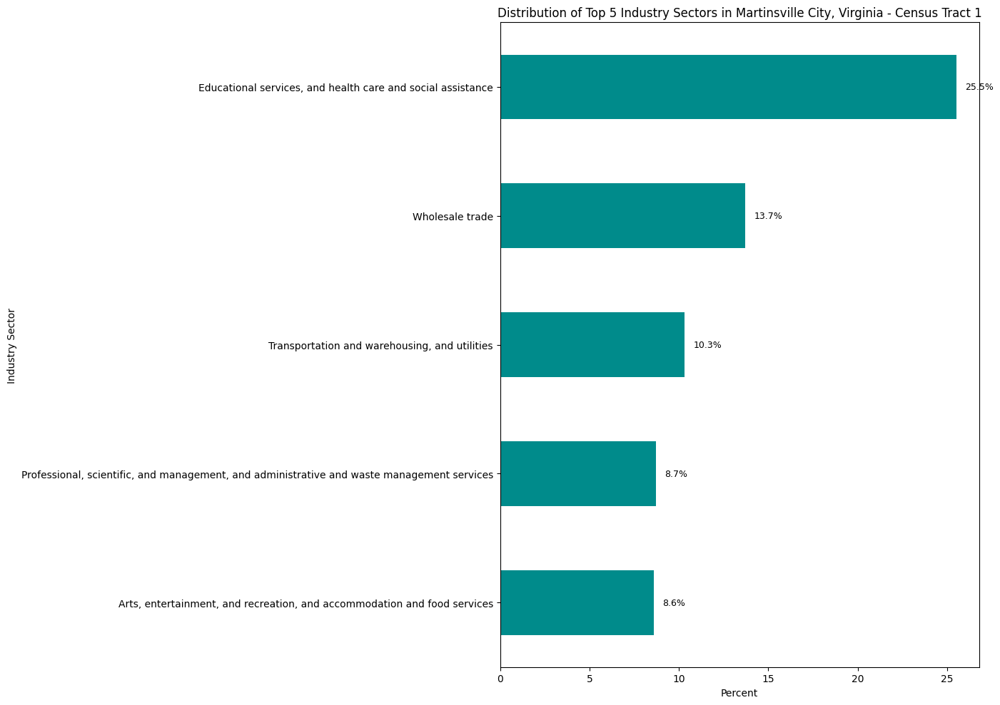

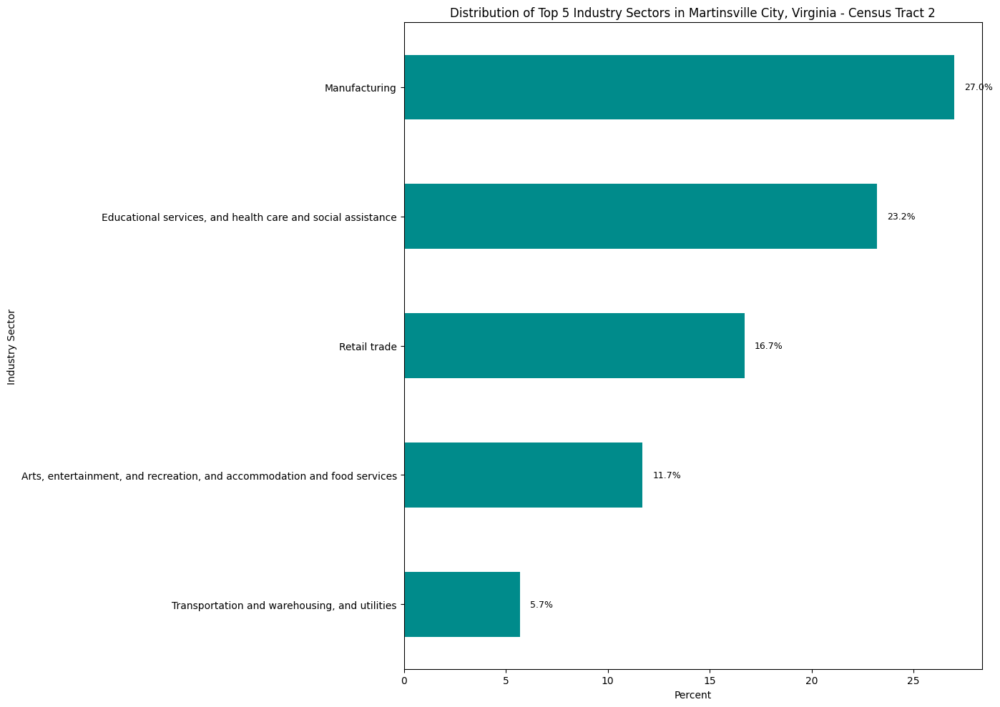

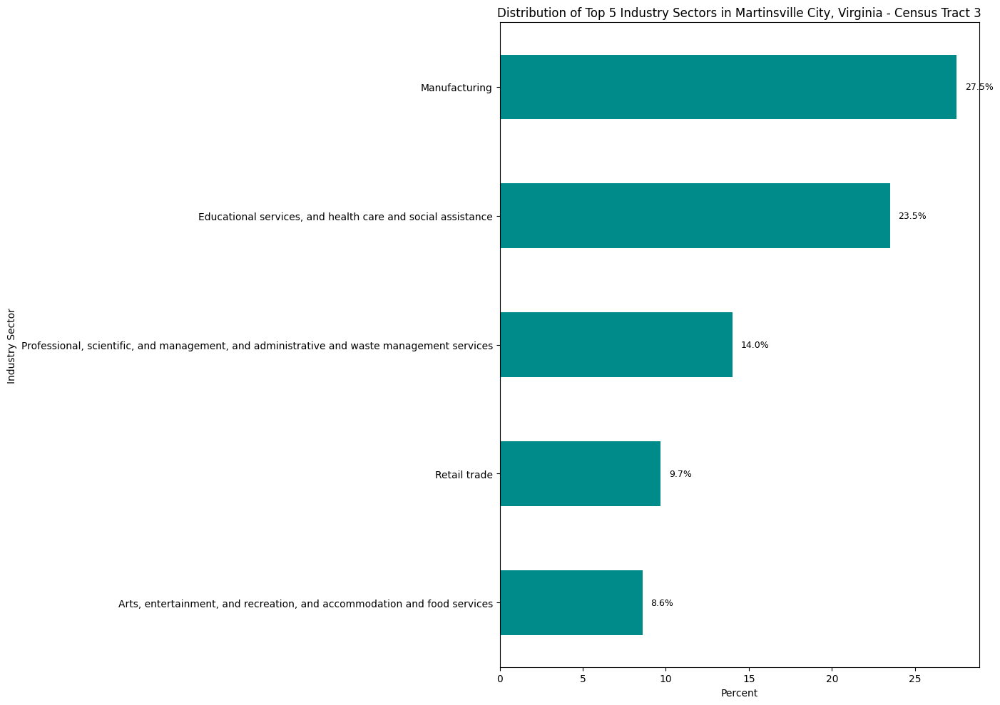

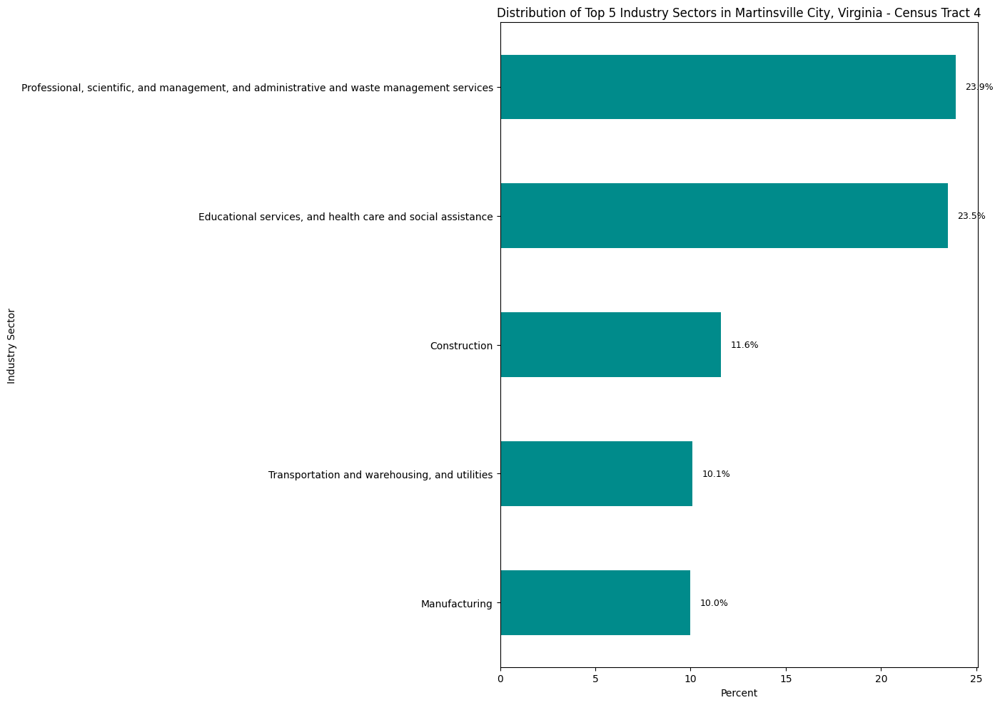

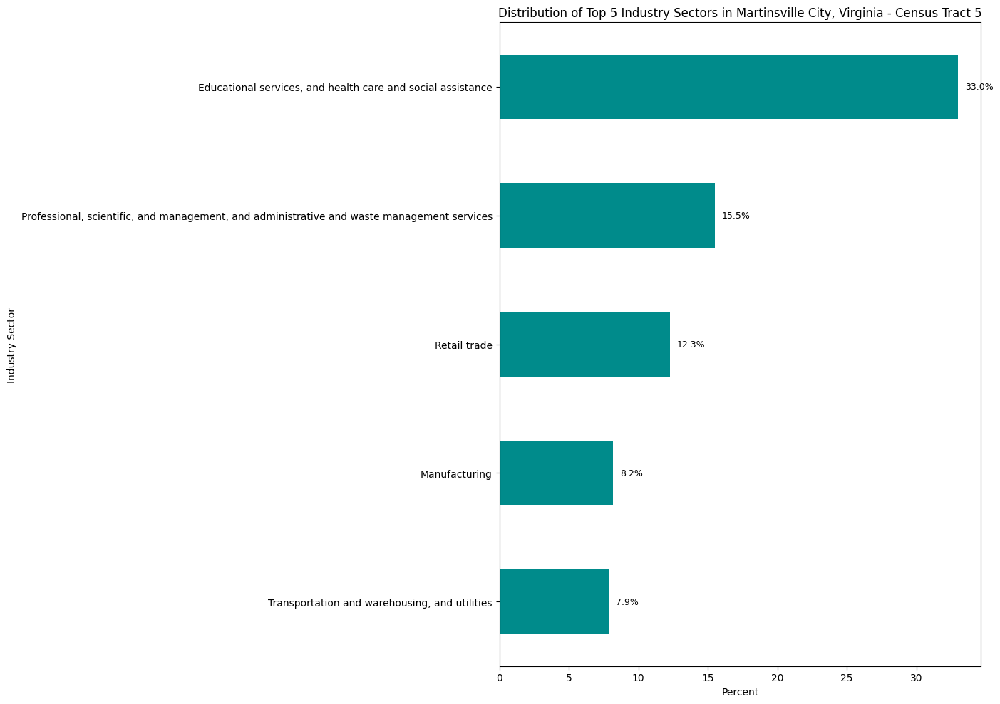

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'

# Define industry groups of interest
industry_groups = [
    'Agriculture, forestry, fishing and hunting, and mining',
    'Construction',
    'Manufacturing',
    'Wholesale trade',
    'Retail trade',
    'Transportation and warehousing, and utilities',
    'Information',
    'Finance and insurance, and real estate and rental and leasing',
    'Professional, scientific, and management, and administrative and waste management services',
    'Educational services, and health care and social assistance',
    'Arts, entertainment, and recreation, and accommodation and food services',
    'Other services, except public administration',
    'Public administration'
]

# Loop through the files
for i in range(1, 6):
    file_path = os.path.join(directory_path, f'economy_{i}.csv')
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for industry groups
    filtered_industry_data = data[data['Label (Grouping)'].isin(industry_groups)]
    grouped_industry_data = filtered_industry_data.set_index('Label (Grouping)')[percent_column]

    # Select the top 3 and bottom 3 industries based on their percent value
    top_bottom_industry_data = grouped_industry_data.nlargest(5)

    # Plotting
    plt.figure(figsize=(14, 10))
    ax = top_bottom_industry_data.sort_values().plot(kind='barh', color='darkcyan')
    ax.set_xlabel('Percent')
    ax.set_ylabel('Industry Sector')
    ax.set_title(f'Distribution of Top 5 Industry Sectors in Martinsville City, Virginia - Census Tract {i}')

    # Adding numbers to the right of each bar for clarity
    for index, value in enumerate(top_bottom_industry_data.sort_values()):
        ax.text(value + 0.5, index, f'{value:.1f}%', va='center', fontsize=9)

    plt.tight_layout()
    plt.show()


Industry Sectors: Educational services, along with health care and social assistance, dominate the industry sectors across several tracts, highlighting their critical role in the local economy. Other significant sectors include professional and administrative services, retail trade, and manufacturing, which show varying levels of presence across different tracts.

<a name="3c"></a>
### **Employment Categories in Martinsville City**

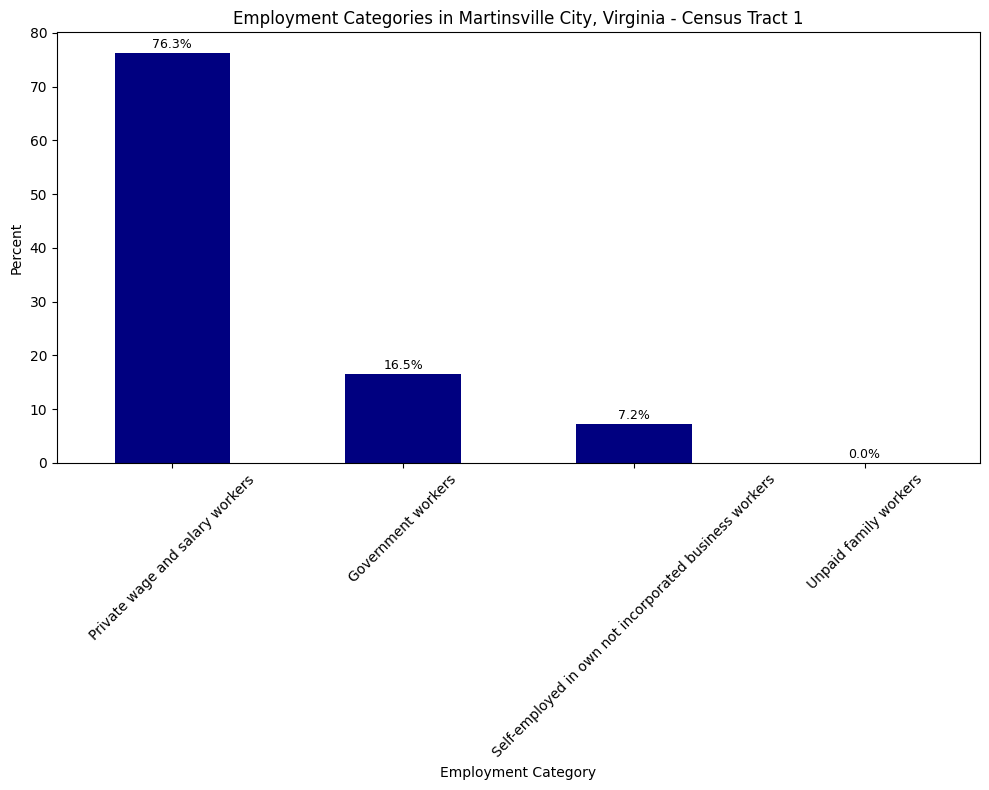

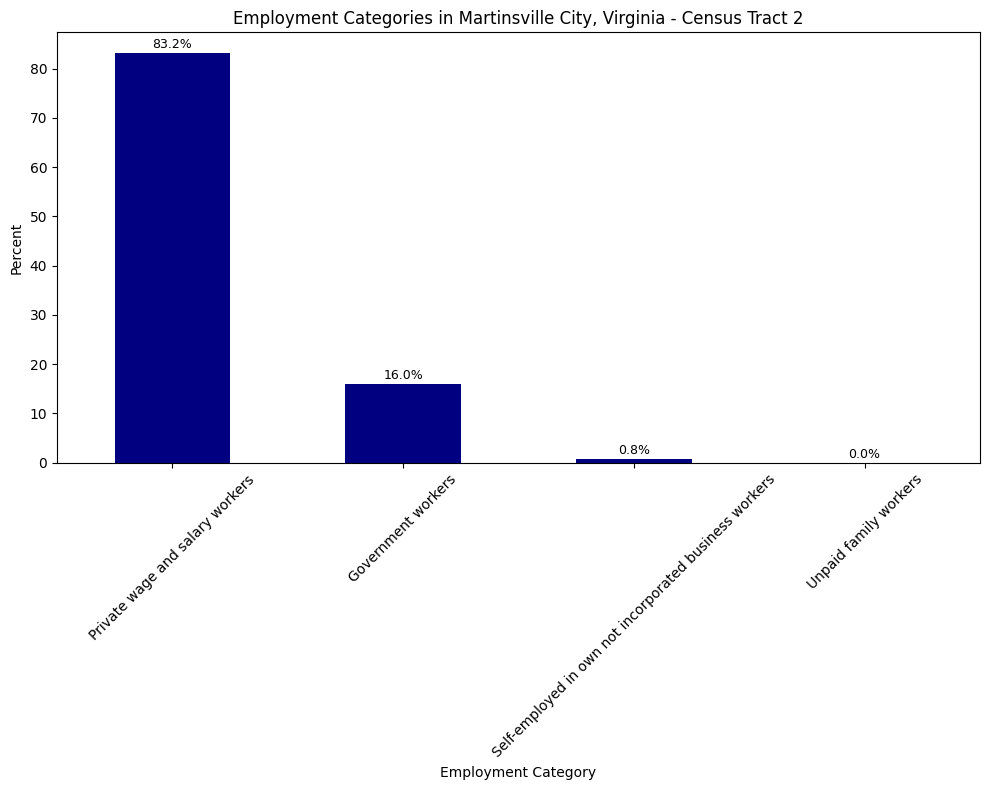

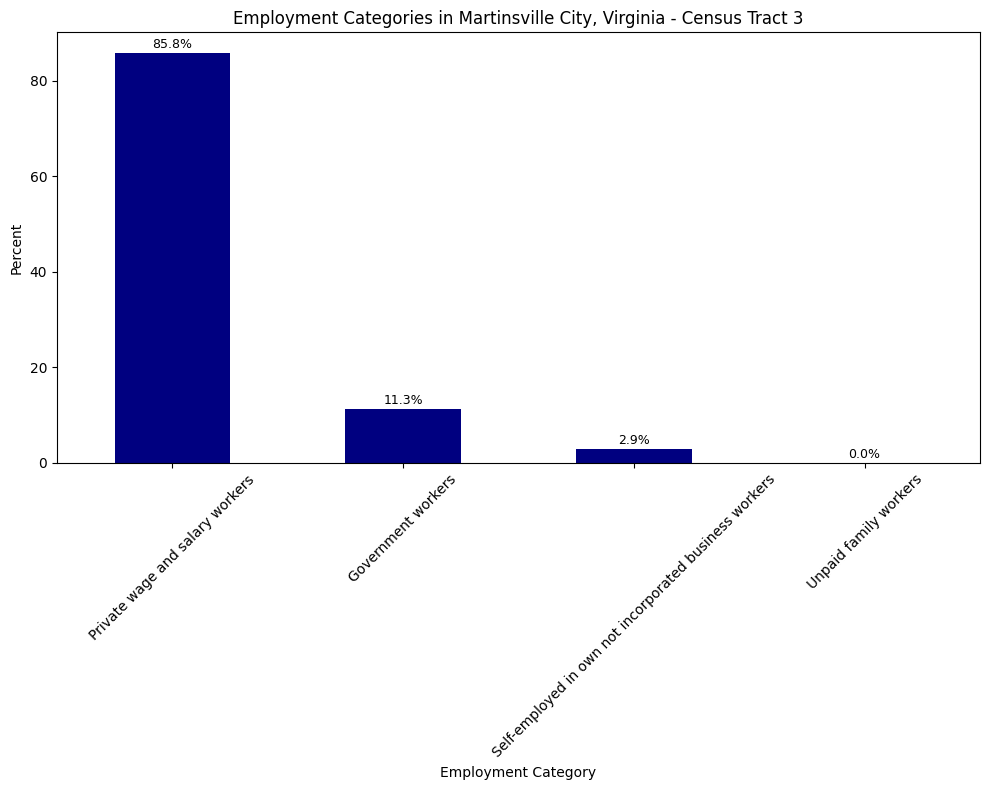

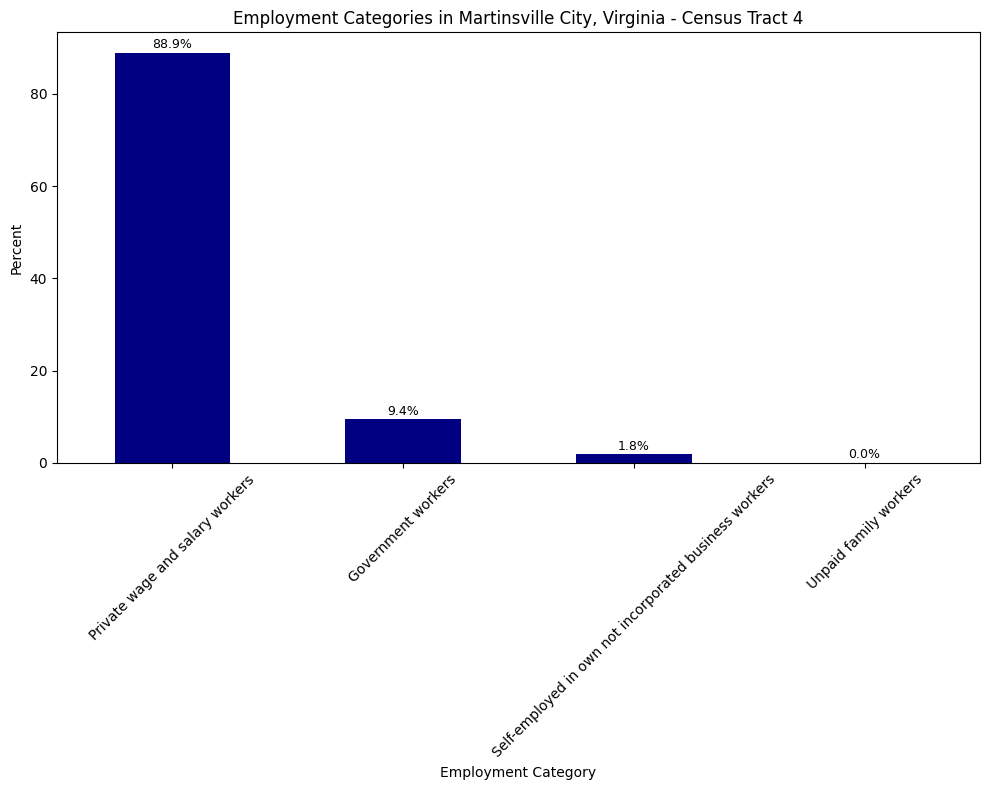

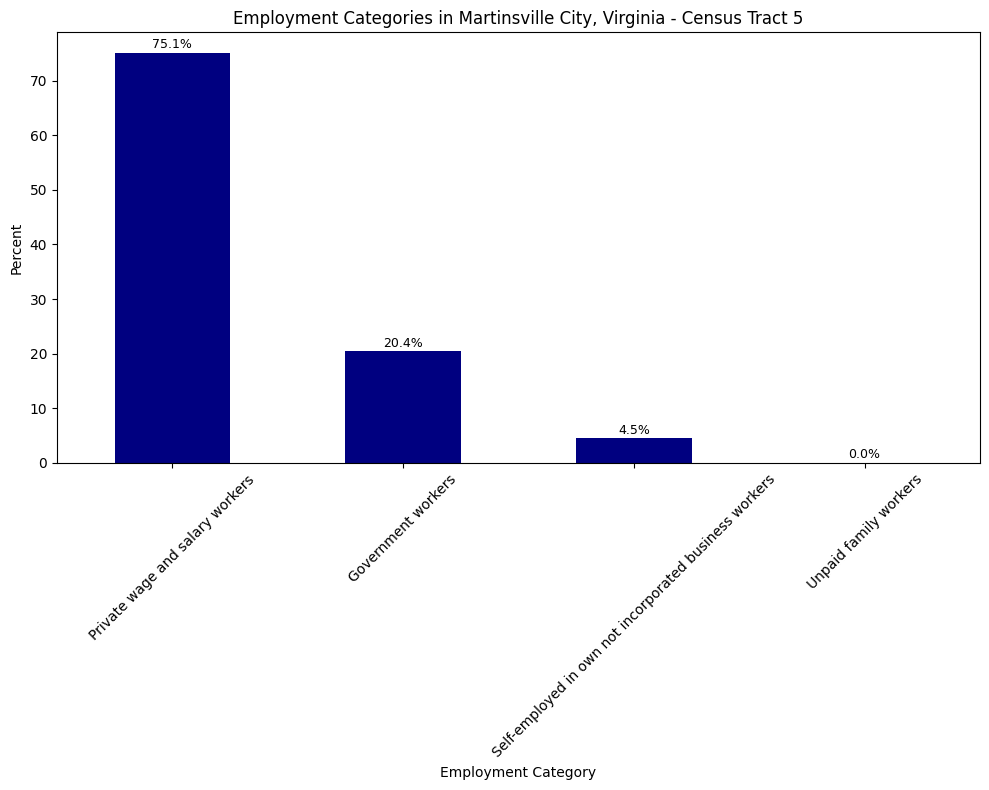

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'

# Define employment categories of interest
employment_categories = [
    'Private wage and salary workers',
    'Government workers',
    'Self-employed in own not incorporated business workers',
    'Unpaid family workers'
]

# Loop through the files
for i in range(1, 6):
    file_path = os.path.join(directory_path, f'economy_{i}.csv')
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for employment categories
    filtered_employment_data = data[data['Label (Grouping)'].isin(employment_categories)]
    grouped_employment_data = filtered_employment_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(10, 8))
    grouped_employment_data.plot(kind='bar', color='navy')
    plt.xlabel('Employment Category')
    plt.ylabel('Percent')
    plt.title(f'Employment Categories in Martinsville City, Virginia - Census Tract {i}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar for clarity
    for j, value in enumerate(grouped_employment_data):
        plt.text(j, value + 0.3, f'{value:.1f}%', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The charts display the distribution of employment categories across five census tracts in Martinsville City, Virginia, reflecting varying economic activities in different parts of the city:

Census Tract 1: Dominated by private wage and salary workers (76.3%), with notable participation in government jobs (16.5%) and self-employment (7.2%). Unpaid family workers and self-employed in non-incorporated businesses are absent.

Census Tract 2: Similarly high percentage of private wage and salary workers (83.2%) followed by government workers (16.0%). Self-employment in non-incorporated businesses is very low (0.8%).

Census Tract 3: Also primarily composed of private wage and salary workers (85.8%), with a slightly higher percentage of government workers (11.3%) compared to other tracts and a small percentage of self-employed individuals (2.9%).

Census Tract 4: Features the highest proportion of private wage and salary workers among the tracts at 88.9%, lower government employment (9.4%), and minimal self-employed in own non-incorporated business workers (1.8%).

Census Tract 5: Shows the highest diversity in employment with 75.1% private wage and salary workers, 20.4% government workers, and 4.5% self-employed in own non-incorporated business workers.

These distributions indicate a strong reliance on private sector jobs across all tracts, with variations in government and self-employment suggesting different economic bases or policy impacts in each area.

<a name="3d"></a>
### **Distribution of Top 5 Income Brackets in Martinsville**

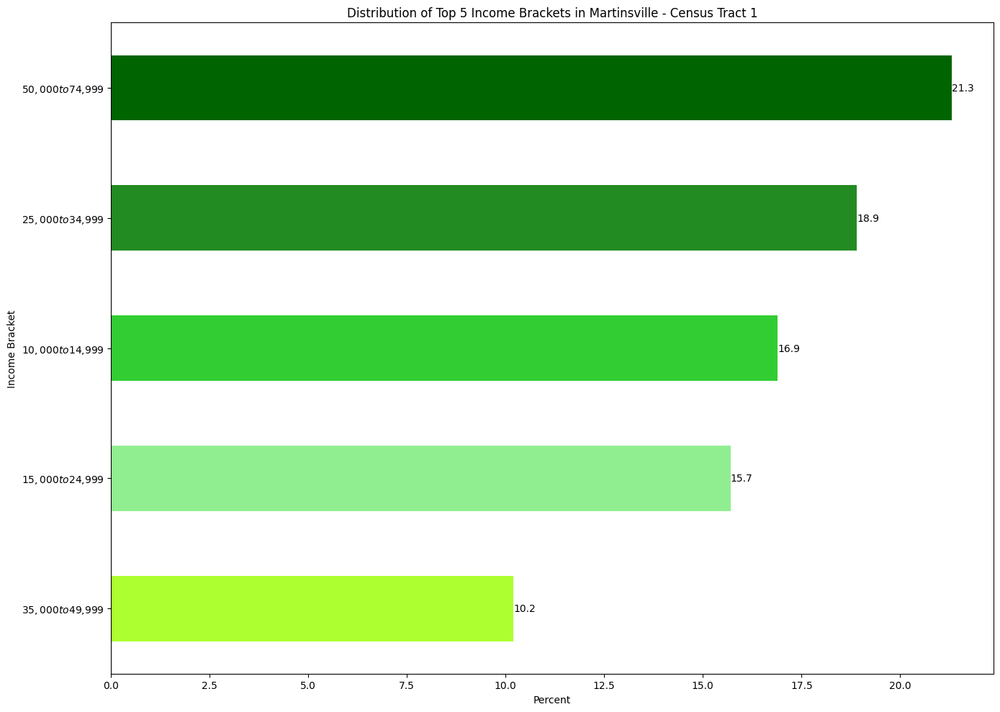

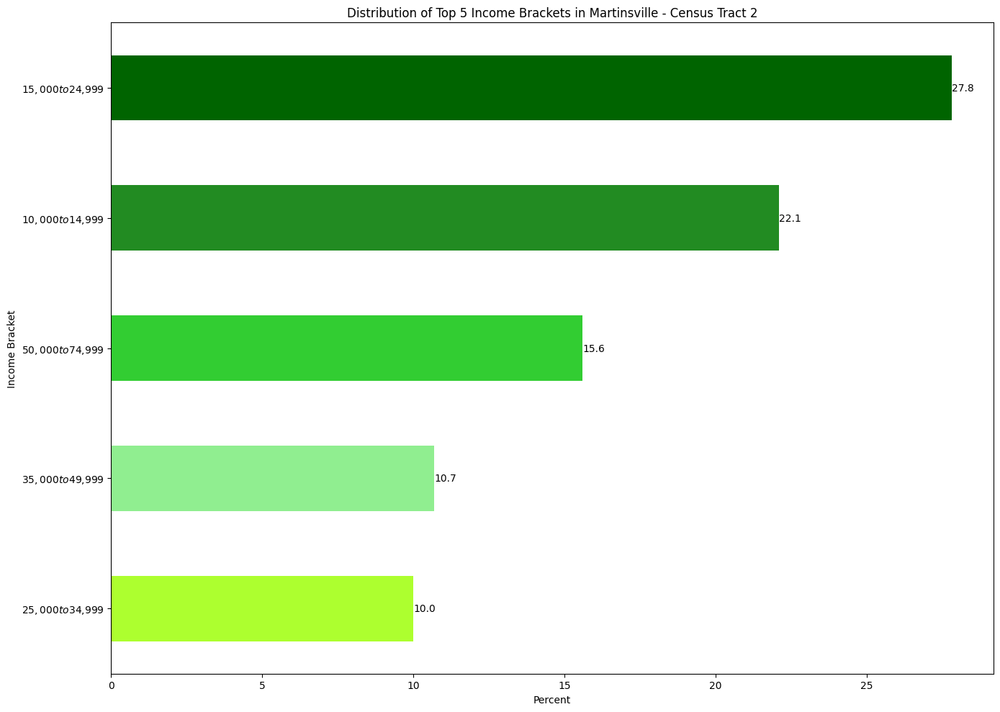

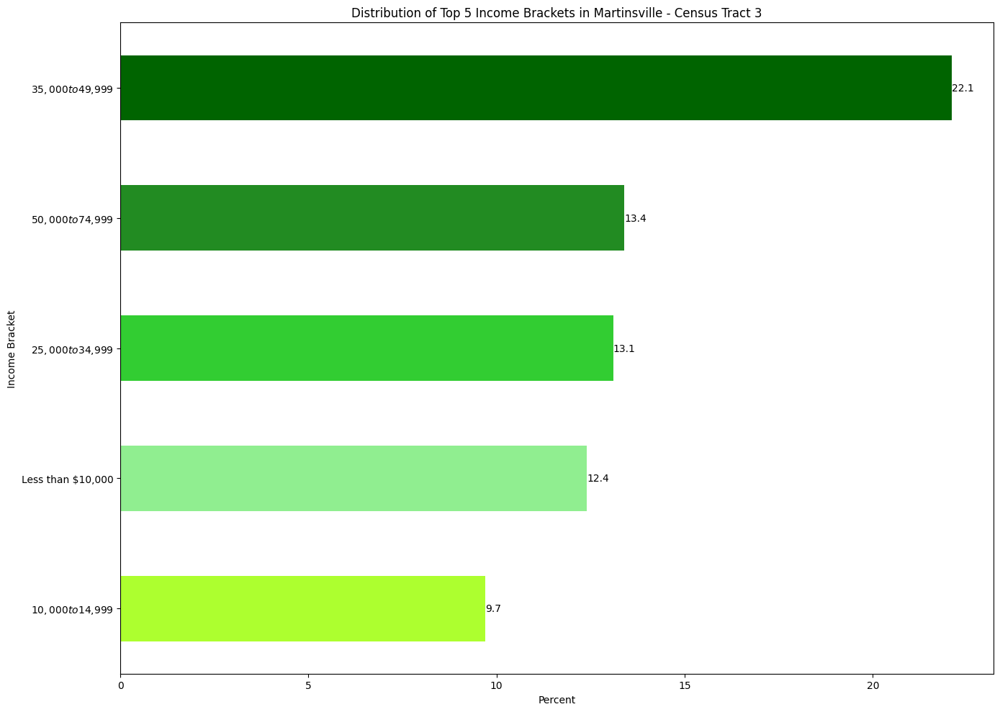

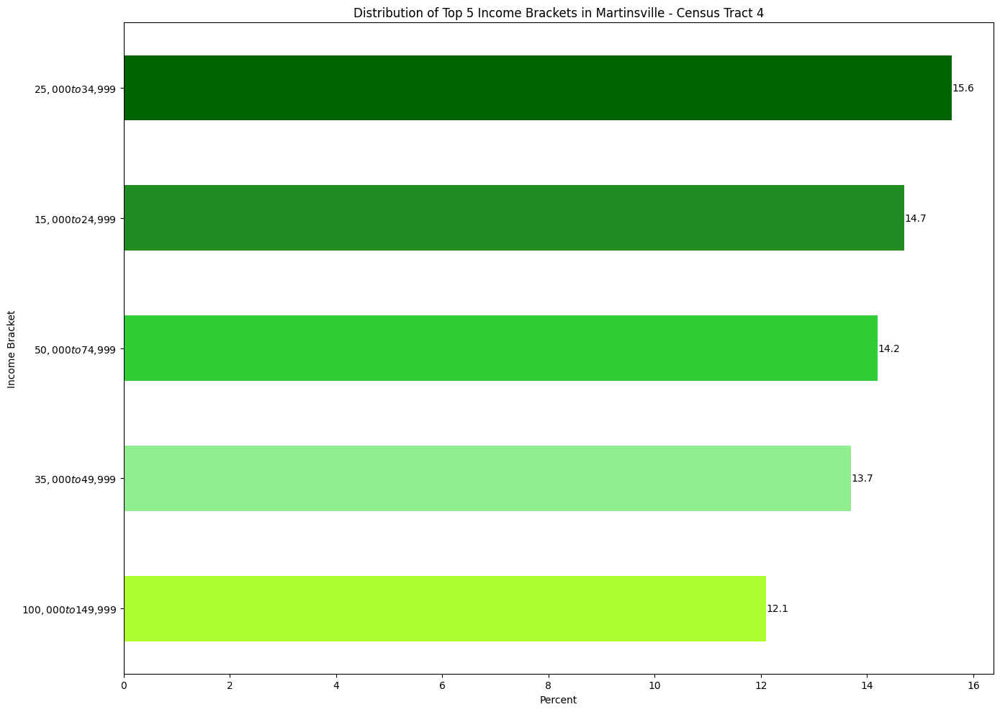

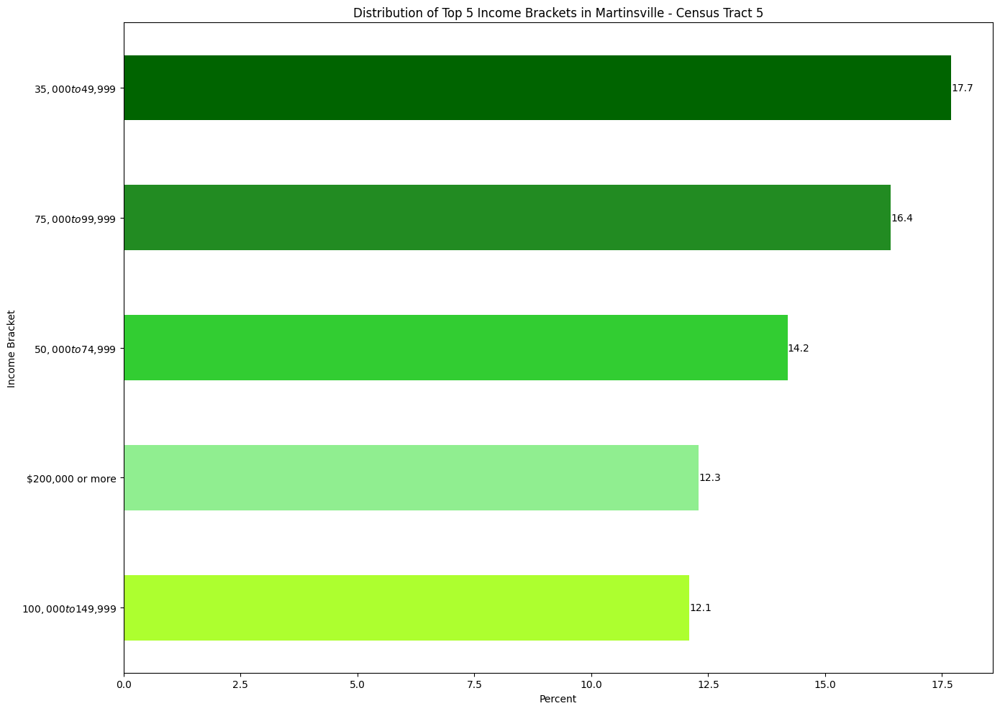

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'

# Define income brackets of interest
income_brackets = [
    'Less than $10,000',
    '$10,000 to $14,999',
    '$15,000 to $24,999',
    '$25,000 to $34,999',
    '$35,000 to $49,999',
    '$50,000 to $74,999',
    '$75,000 to $99,999',
    '$100,000 to $149,999',
    '$150,000 to $199,999',
    '$200,000 or more'
]

# Gradient of green colors for the top 5
colors = ['#ADFF2F', '#90EE90', '#32CD32', '#228B22', '#006400']
 # Dark green to lighter green

# Loop through the files
for i in range(1, 6):
    file_path = os.path.join(directory_path, f'economy_{i}.csv')
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for income brackets
    filtered_income_data = data[data['Label (Grouping)'].isin(income_brackets) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_income_data = filtered_income_data.set_index('Label (Grouping)')[percent_column]

    # Select the top 5 income brackets based on their percent value
    top_income_data = grouped_income_data.nlargest(5)

    # Plotting
    plt.figure(figsize=(14, 10))
    ax = top_income_data.sort_values().plot(kind='barh', color=colors)
    plt.xlabel('Percent')
    plt.ylabel('Income Bracket')
    plt.title(f'Distribution of Top 5 Income Brackets in Martinsville - Census Tract {i}')

    # Adding numbers above each bar for clarity
    for p in ax.patches:
        ax.text(p.get_width(), p.get_y() + p.get_height()/2, f'{p.get_width():.1f}', ha='left', va='center')

    plt.tight_layout()
    plt.show()

The bar charts display the distribution of the top 5 income brackets across different census tracts in Martinsville, highlighting the diversity in economic conditions within the city. Each tract presents a unique economic profile:

Census Tract 5: Dominated by incomes in the range of $35,000 to $49,999, suggesting a middle-income community with the highest bracket, $200,000 or more, representing a smaller portion.

Census Tract 4: Shows a larger presence in the lower income brackets ($25,000 to $34,999 and $15,000 to $24,999) with a substantial portion in the $50,000 to $74,999 bracket, reflecting a mixed economic status.

Census Tract 3: Characterized by a significant percentage of households in the $35,000 to $49,999 bracket and the highest bracket ($50,000 to $74,999), indicating a relatively higher economic status.

Census Tract 2: Features a higher concentration in the $10,000 to $14,999 range, with a considerable segment earning $50,000 to $74,999, showing economic diversity.

Census Tract 1: Has a significant proportion of households in the lowest income category (less than $10,000) and the highest ($50,000 to $74,999), suggesting polarized economic conditions.

These distributions suggest varied economic landscapes across Martinsville, with implications for social services, economic policies, and community development initiatives targeting specific needs in each tract.

<a name="3e"></a>
### **Distribution of Occupational Groups in Henry County**

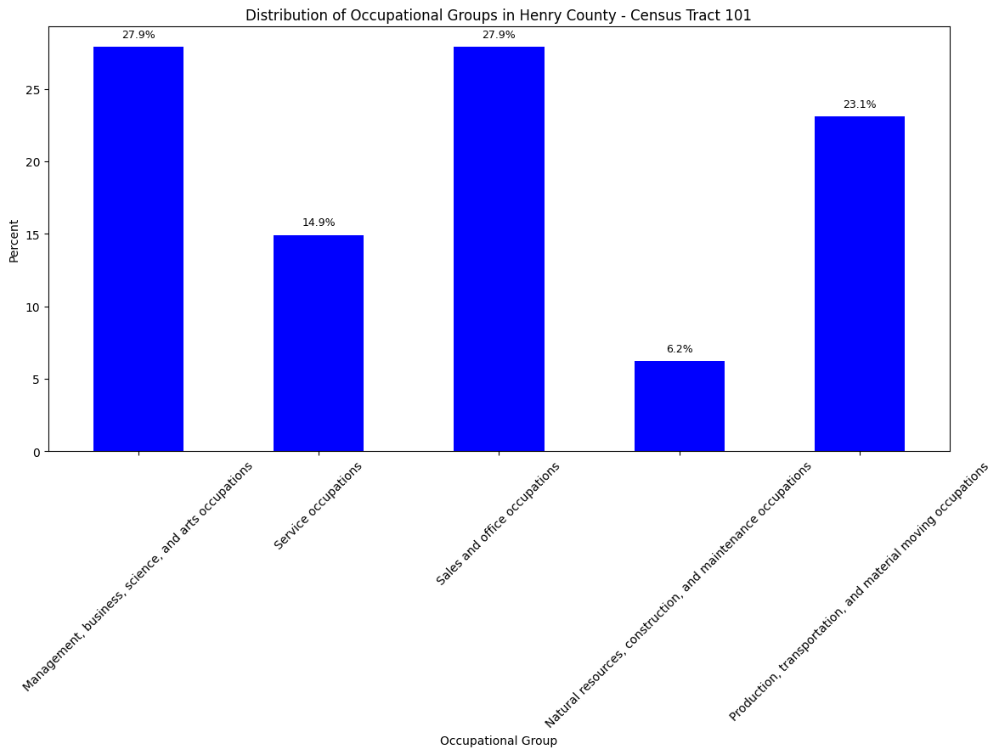

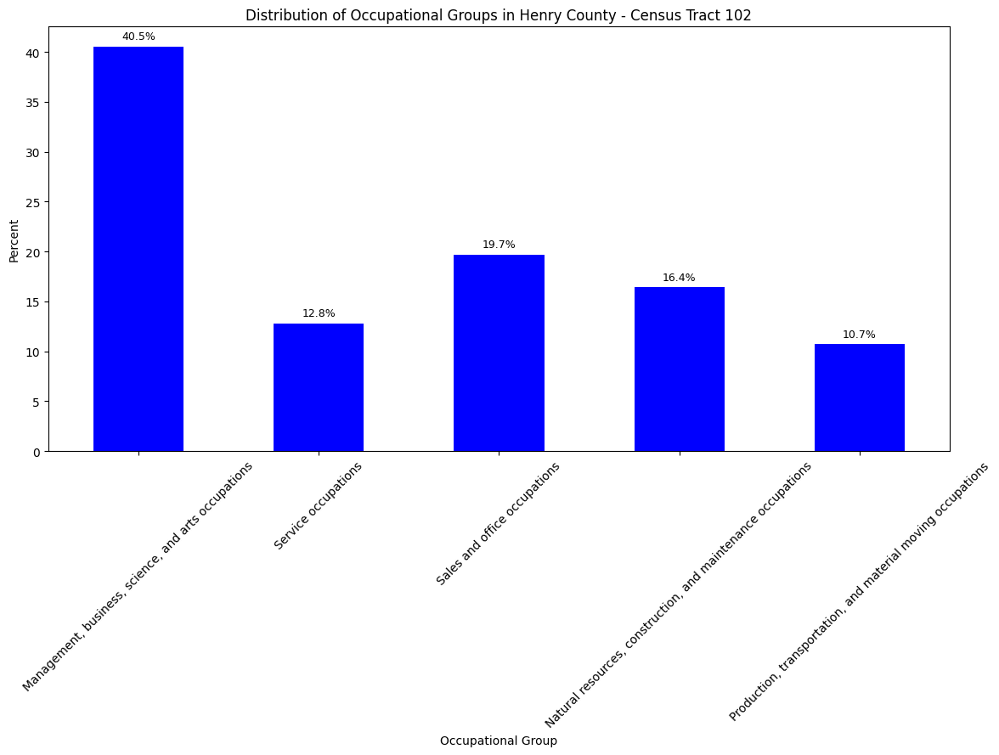

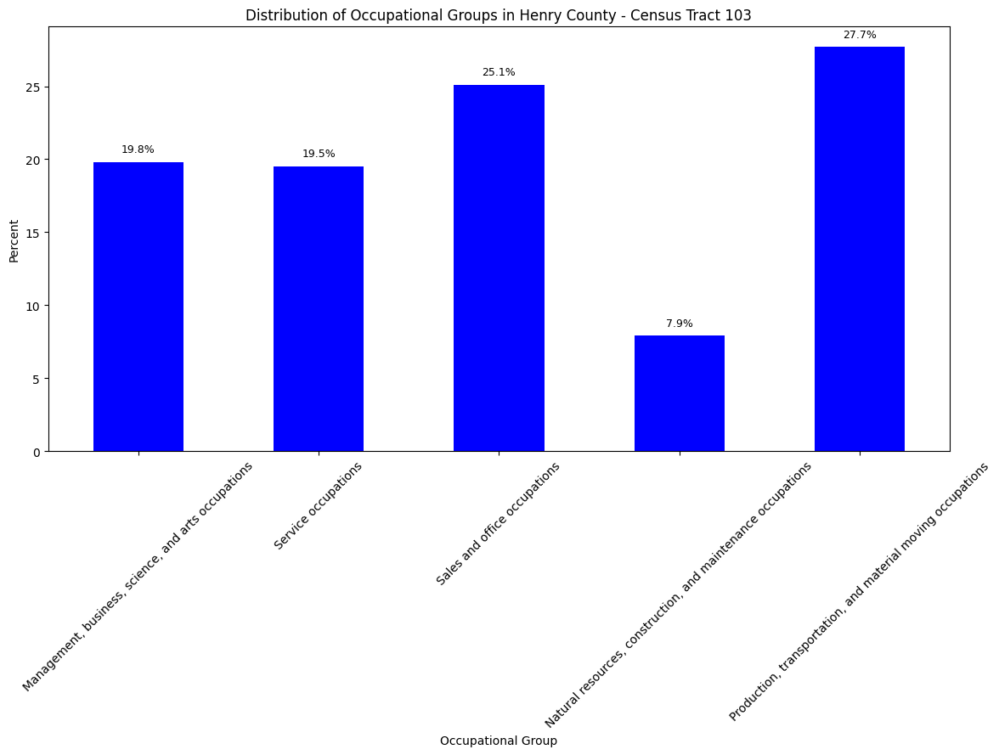

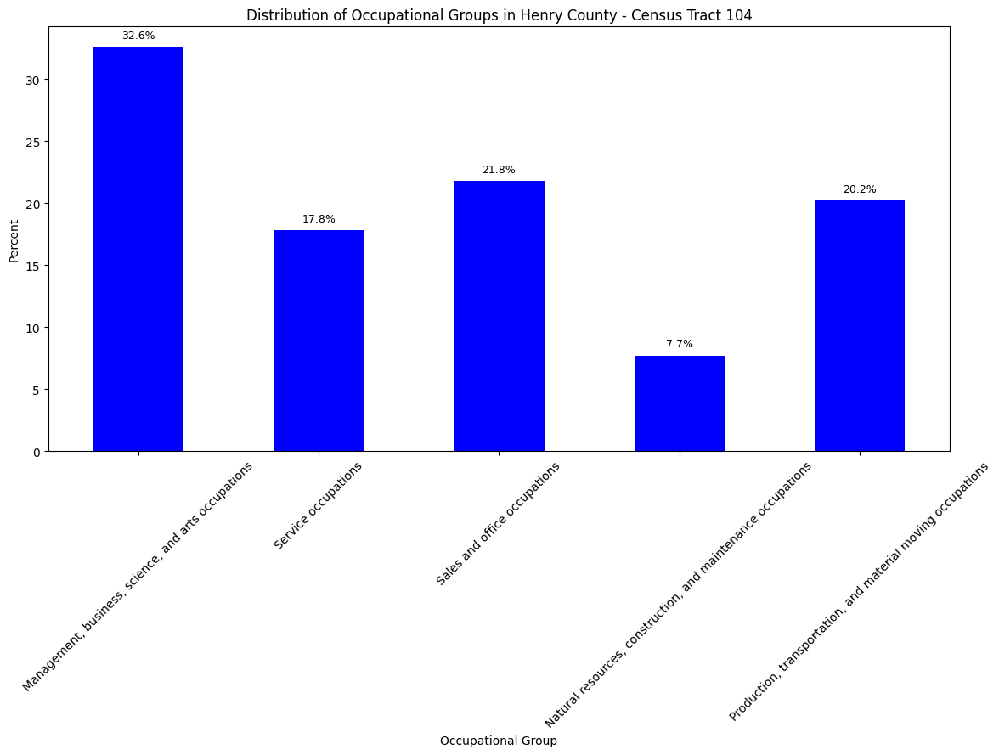

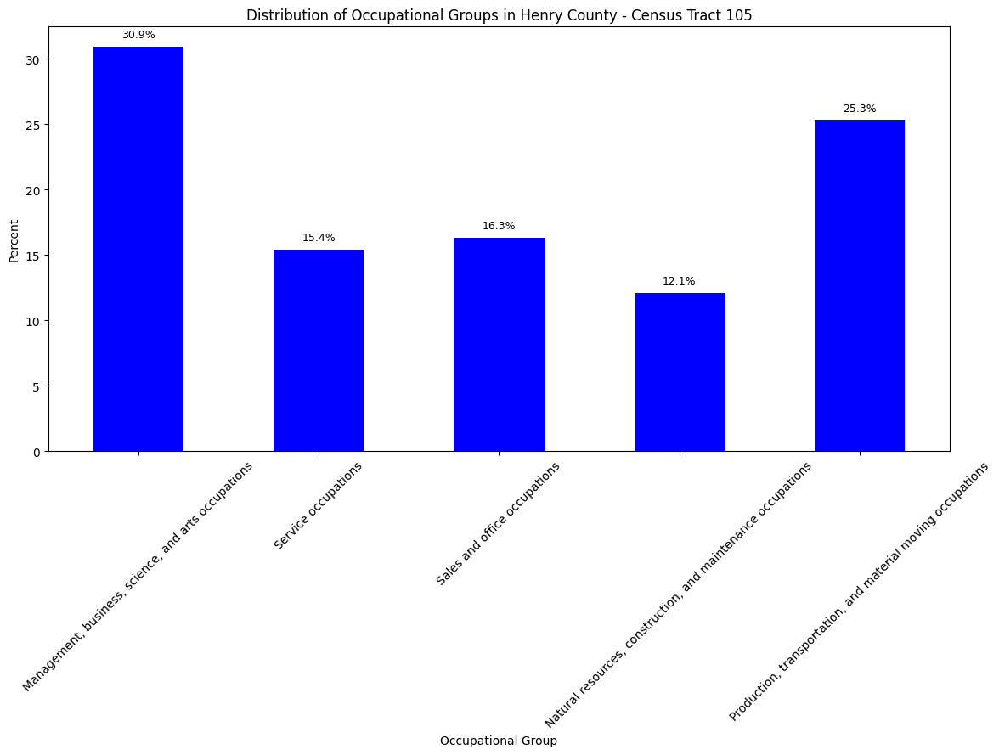

...

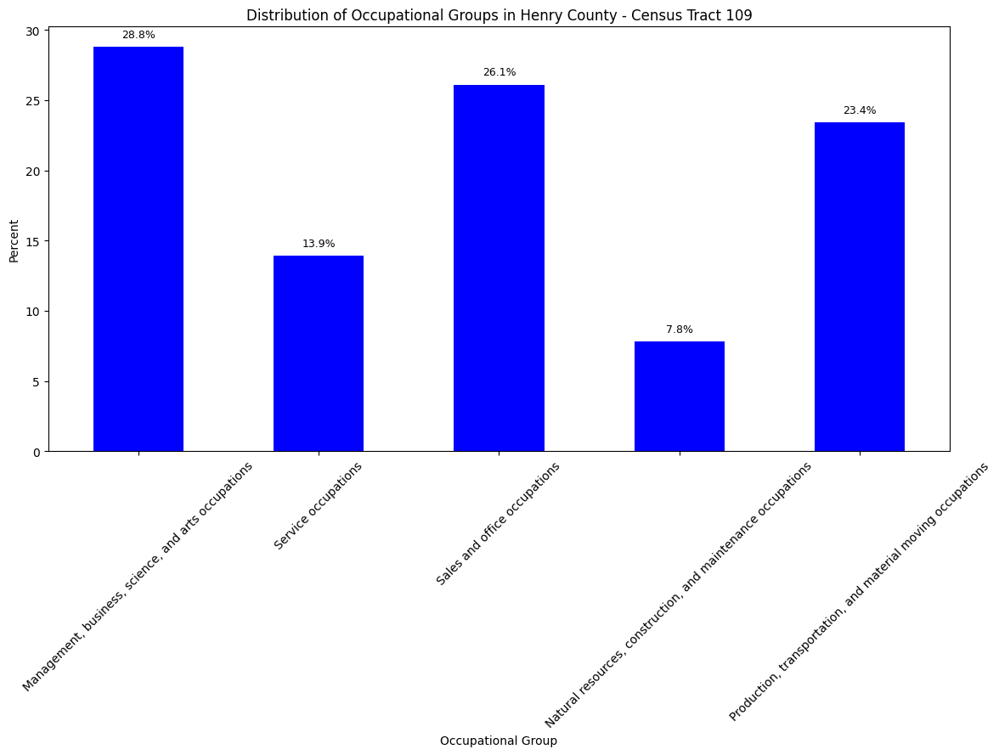

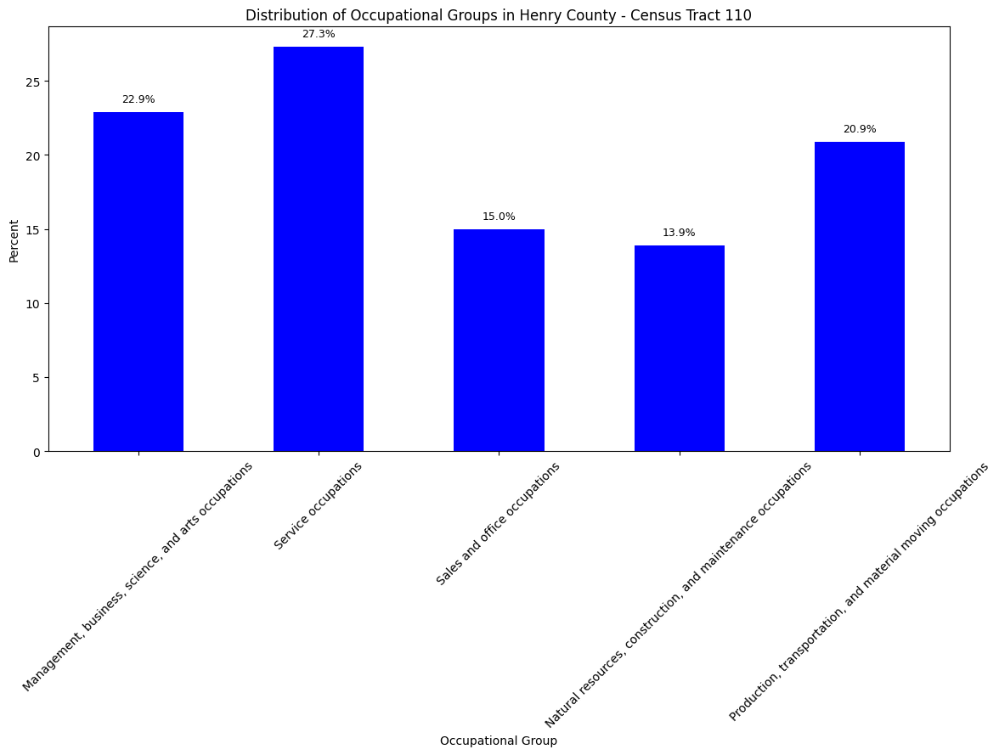

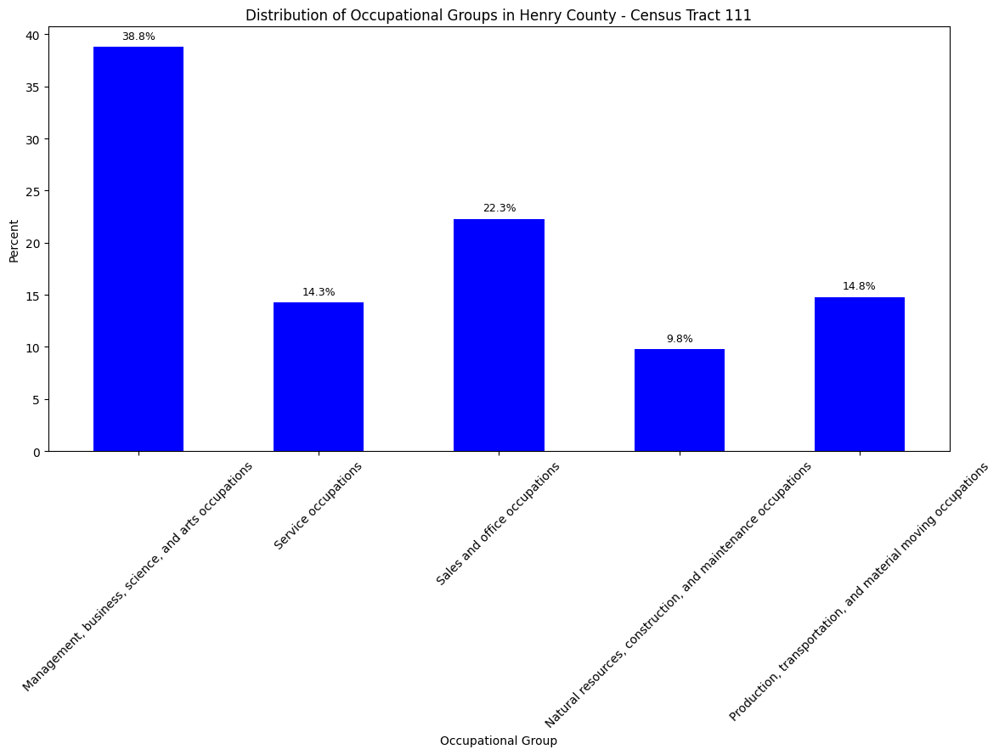

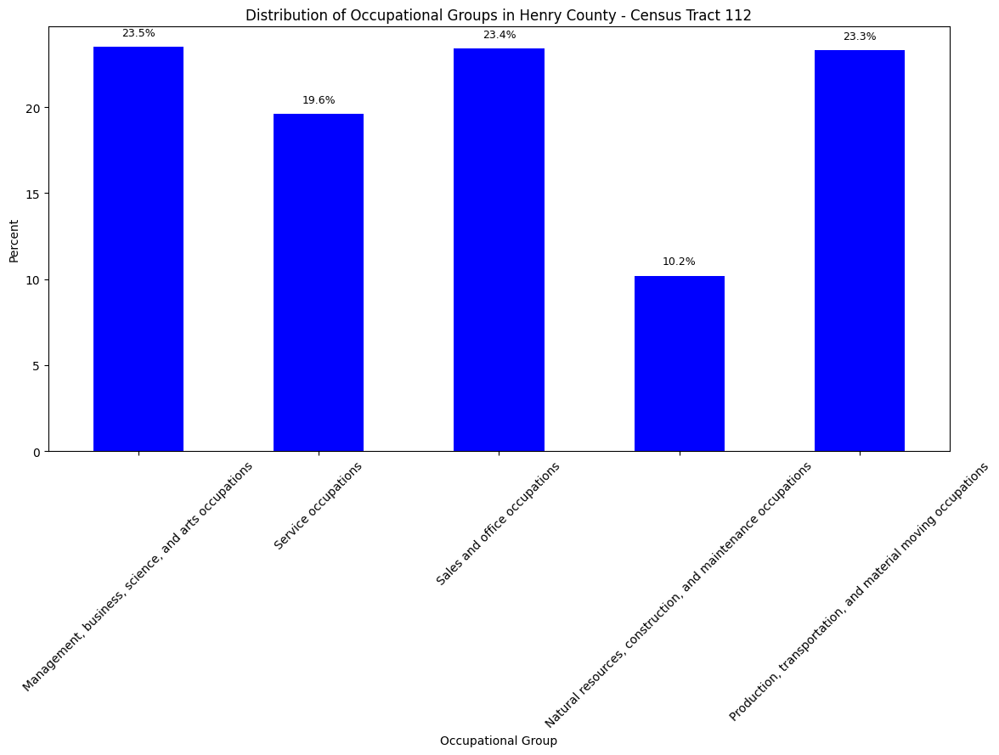

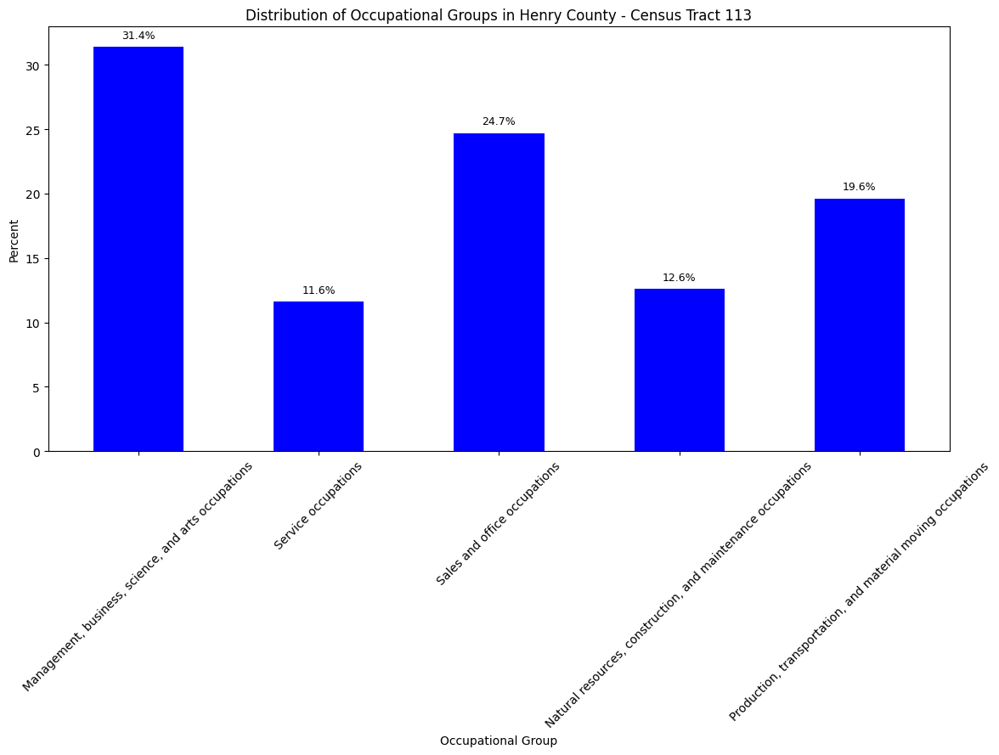

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'

# Define the occupational groups of interest
occupational_groups = [
    'Management, business, science, and arts occupations',
    'Service occupations',
    'Sales and office occupations',
    'Natural resources, construction, and maintenance occupations',
    'Production, transportation, and material moving occupations'
]

# Generate file names dynamically, excluding 'hc_ec_106'
file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]

# Loop through the files
for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Construct the column name based on file name, extracting tract number from the file name
    tract_number = file_name.split('_')[2].split('.')[0]  # 'hc_ec_101.csv' -> '101'
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for occupational groups
    filtered_occupational_data = data[data['Label (Grouping)'].isin(occupational_groups)]
    grouped_occupational_data = filtered_occupational_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(12, 9))
    grouped_occupational_data.plot(kind='bar', color='blue')
    plt.xlabel('Occupational Group')
    plt.ylabel('Percent')
    plt.title(f'Distribution of Occupational Groups in Henry County - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar
    for i, value in enumerate(grouped_occupational_data):
        plt.text(i, value + 0.5, f'{value:.1f}%', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The visual data presents the distribution of occupational groups across various census tracts in Henry County, highlighting the diversity in economic activities. Key findings include a consistent prominence of management, business, science, and arts occupations, which frequently appear as dominant groups across multiple tracts. For instance, in Tract 101 and Tract 102, these occupations account for 27.9% and 40.5% respectively. Sales and office occupations also hold significant shares, particularly in Tract 103 (25.1%) and Tract 104 (21.8%). Production, transportation, and material moving occupations are notably prevalent in Tracts 101 (23.1%), 105 (25.3%), and 109 (23.4%). Service occupations, while generally less dominant, show substantial percentages in Tracts 102 (12.8%) and 108 (26.4%). Tract-specific variations reveal a balanced occupational distribution in some areas, such as Tract 112, where management, production, and sales occupations are almost equally represented. Overall, the data underscores a varied occupational landscape in Henry County, with a noticeable emphasis on management and production-related occupations across most tracts, reflecting the county's economic diversity.

<a name="3f"></a>
### **Top 5 Industry Sectors in Henry County**

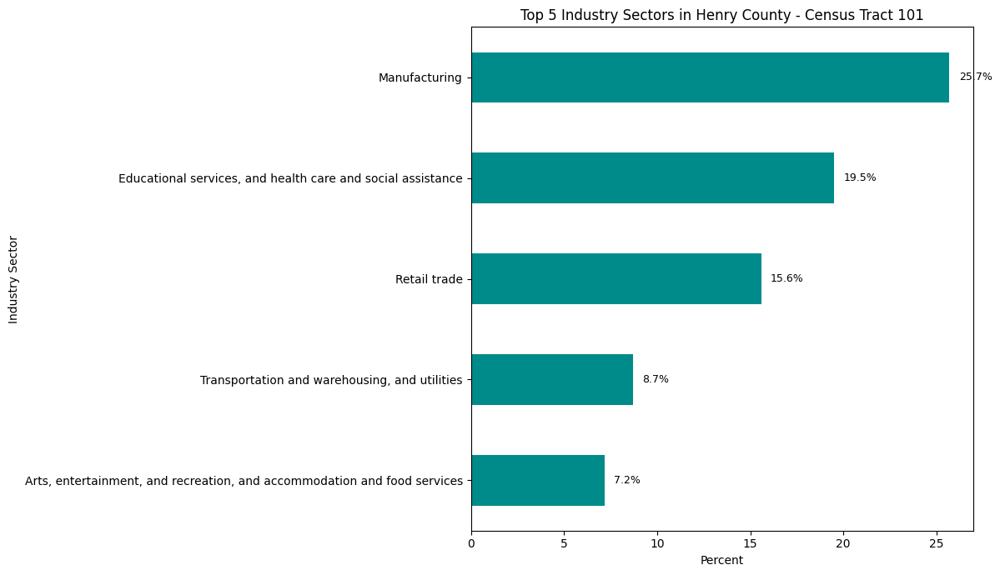

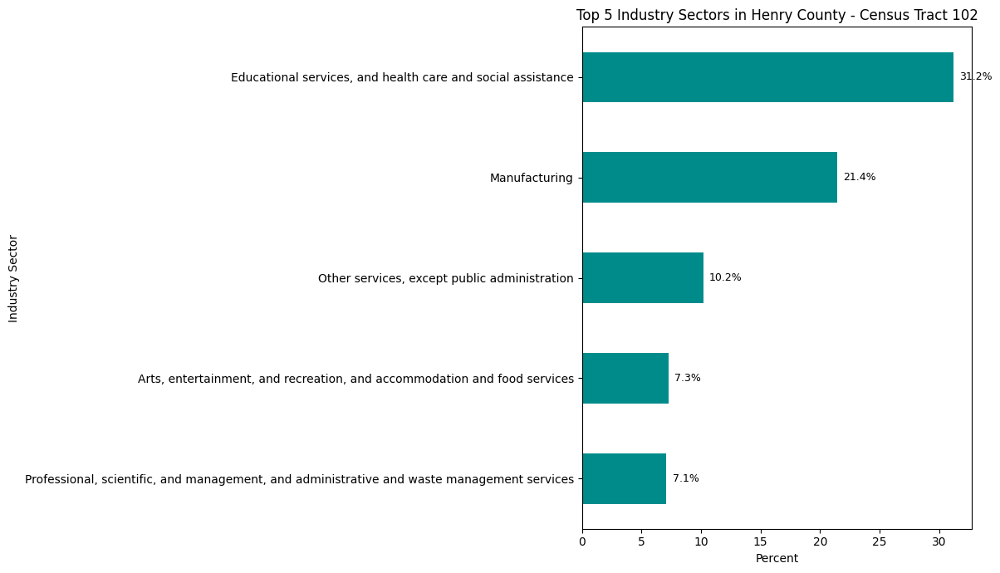

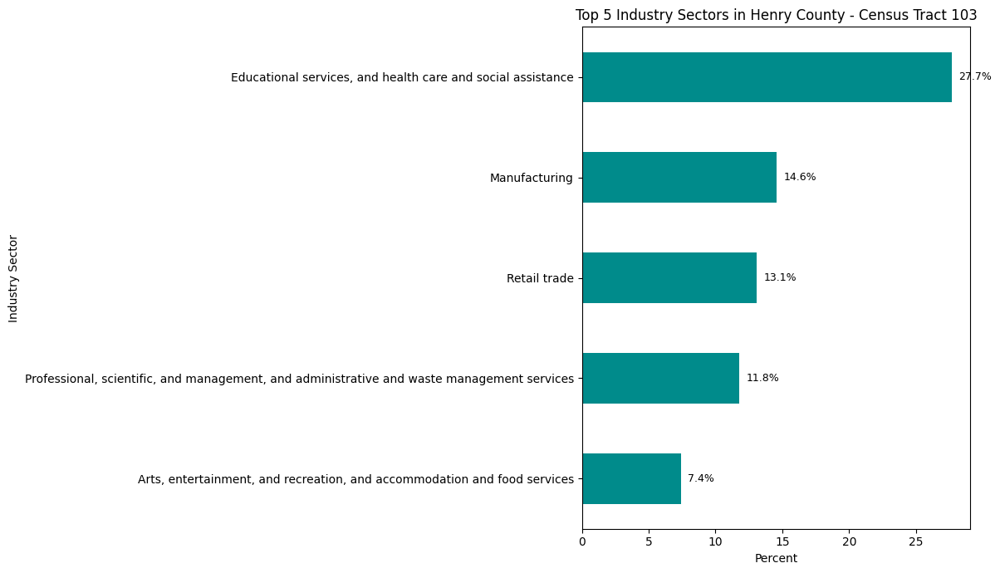

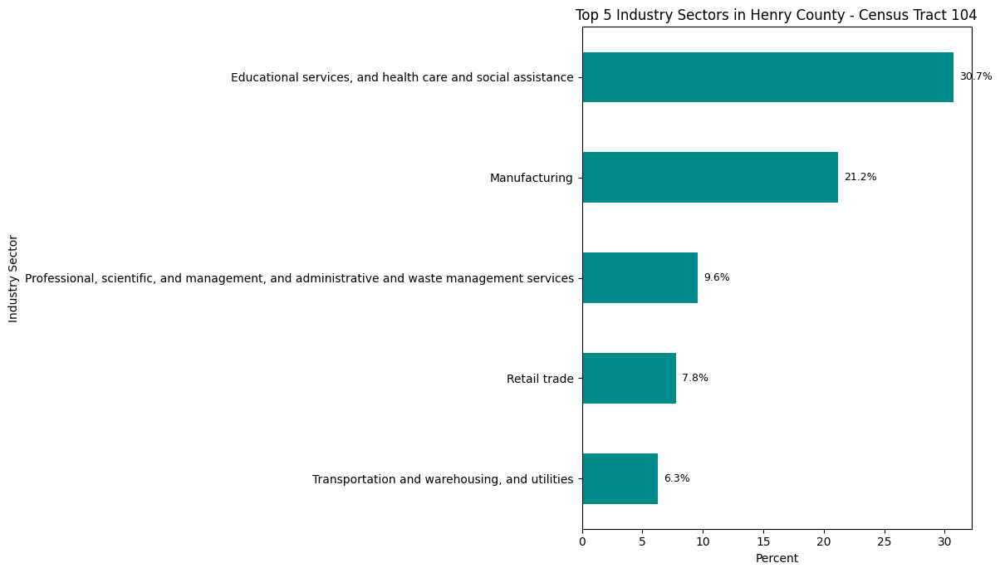

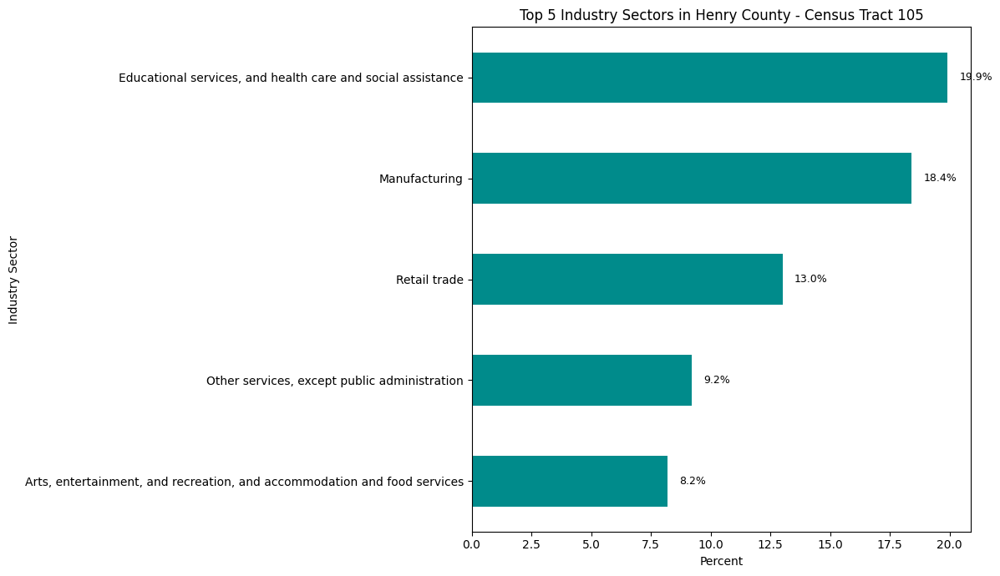

...

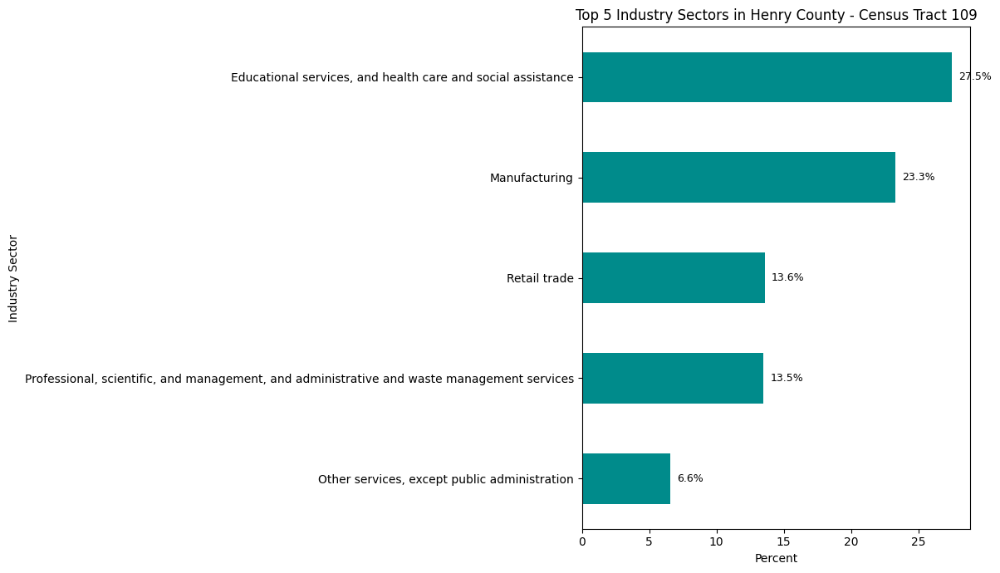

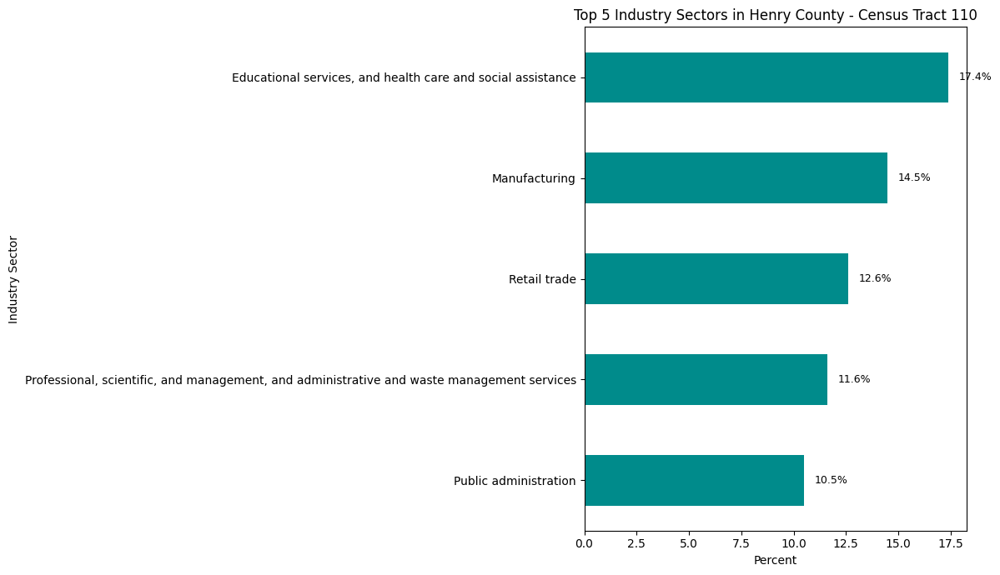

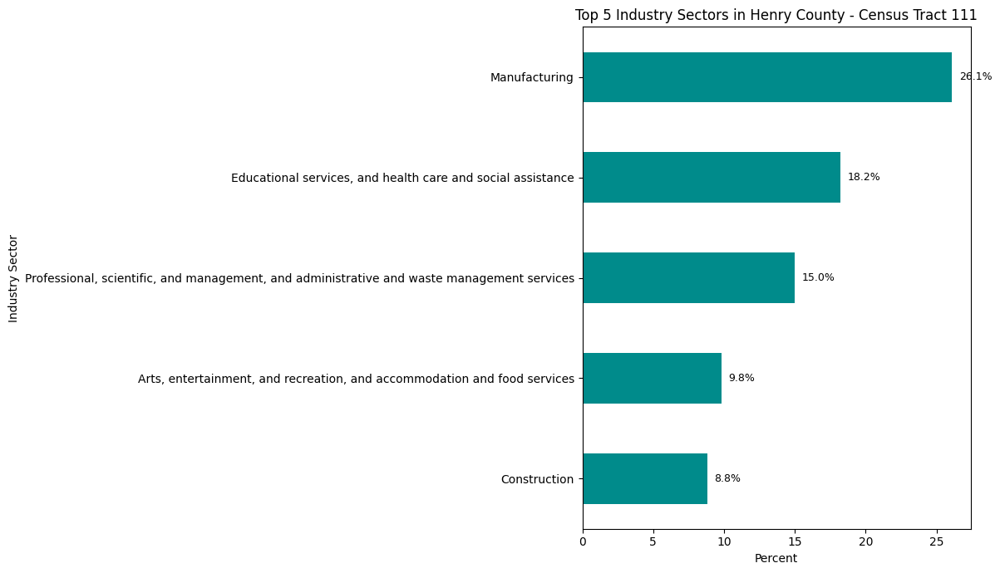

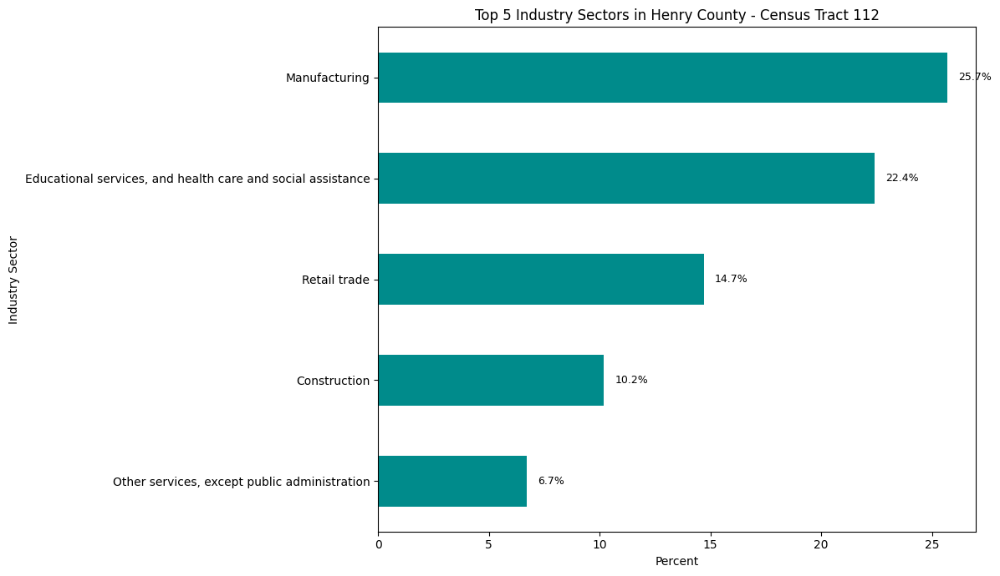

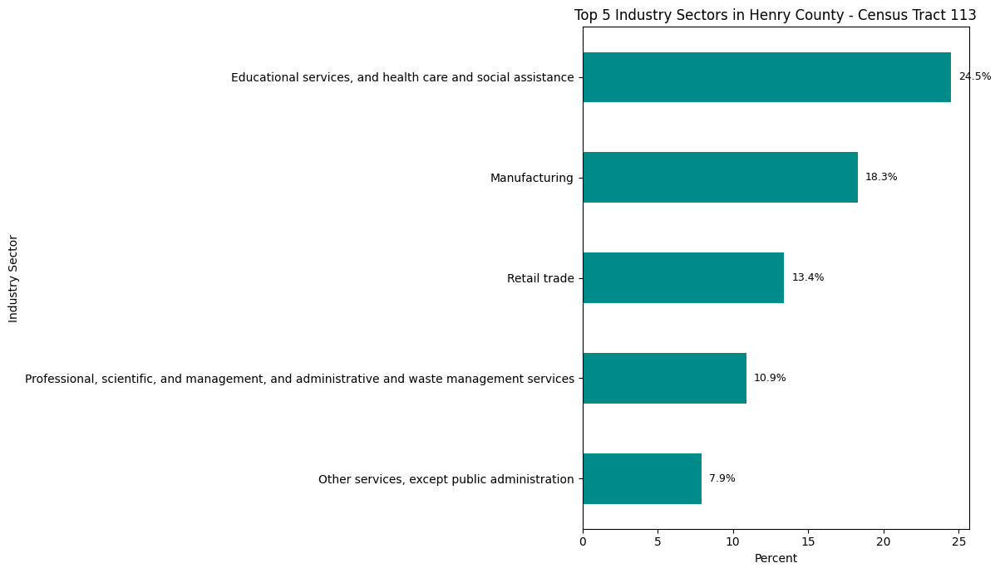

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'

# Define industry groups of interest
industry_groups = [
    'Agriculture, forestry, fishing and hunting, and mining',
    'Construction',
    'Manufacturing',
    'Wholesale trade',
    'Retail trade',
    'Transportation and warehousing, and utilities',
    'Information',
    'Finance and insurance, and real estate and rental and leasing',
    'Professional, scientific, and management, and administrative and waste management services',
    'Educational services, and health care and social assistance',
    'Arts, entertainment, and recreation, and accommodation and food services',
    'Other services, except public administration',
    'Public administration'
]

file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]
# Loop through the files
for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Extract tract number from file name
    tract_number = file_name.split('_')[-1].split('.')[0]  # Extracts '101', '102', etc. from the filename

    # Construct the column name based on file number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for industry groups
    filtered_industry_data = data[data['Label (Grouping)'].isin(industry_groups)]
    grouped_industry_data = filtered_industry_data.set_index('Label (Grouping)')[percent_column]

    # Select the top 5 industries based on their percent value
    top_industry_data = grouped_industry_data.nlargest(5)

    # Plotting
    plt.figure(figsize=(12, 7))
    ax = top_industry_data.sort_values().plot(kind='barh', color='darkcyan')
    ax.set_xlabel('Percent')
    ax.set_ylabel('Industry Sector')
    ax.set_title(f'Top 5 Industry Sectors in Henry County - Census Tract {tract_number}')

    # Adding numbers to the right of each bar for clarity
    for index, value in enumerate(top_industry_data.sort_values()):
        ax.text(value + 0.5, index, f'{value:.1f}%', va='center', fontsize=9)

    plt.tight_layout()
    plt.show()



The visual data highlights the top five industry sectors across various census tracts in Henry County. Educational services, health care, and social assistance frequently emerge as dominant sectors, reflecting their significant role in the local economy. For example, this sector leads in Tract 102 at 31.2%, Tract 103 at 27.7%, and Tract 108 at 34.9%. Manufacturing also plays a crucial role, being the leading sector in Tract 101 at 25.7% and Tract 111 at 26.1%. Other notable sectors include retail trade, professional, scientific, and management services, and arts, entertainment, and recreation. Retail trade is significant in Tract 101 at 15.6% and Tract 112 at 14.7%. Professional, scientific, and management services are particularly notable in Tracts 107 and 108, accounting for 16.2% and 23.4%, respectively. Overall, the data underscores the importance of educational services, healthcare, and manufacturing in Henry County's economy, with each sector contributing notably across different tracts.

<a name="3g"></a>
### **Employment Categories in Henry County**

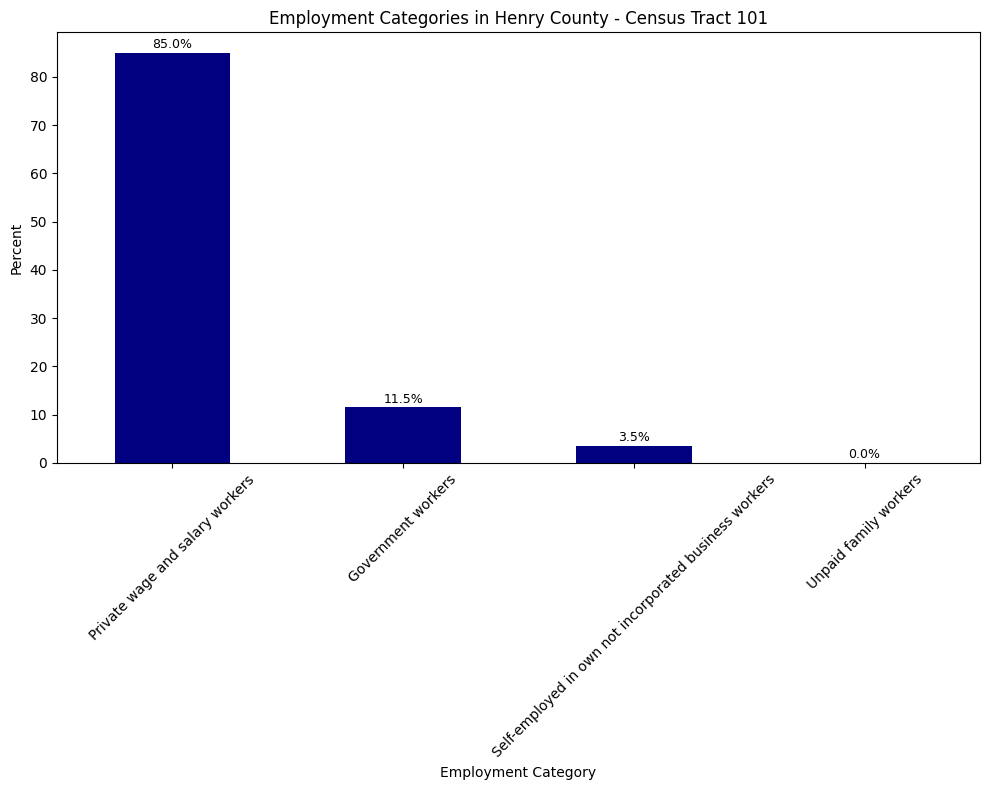

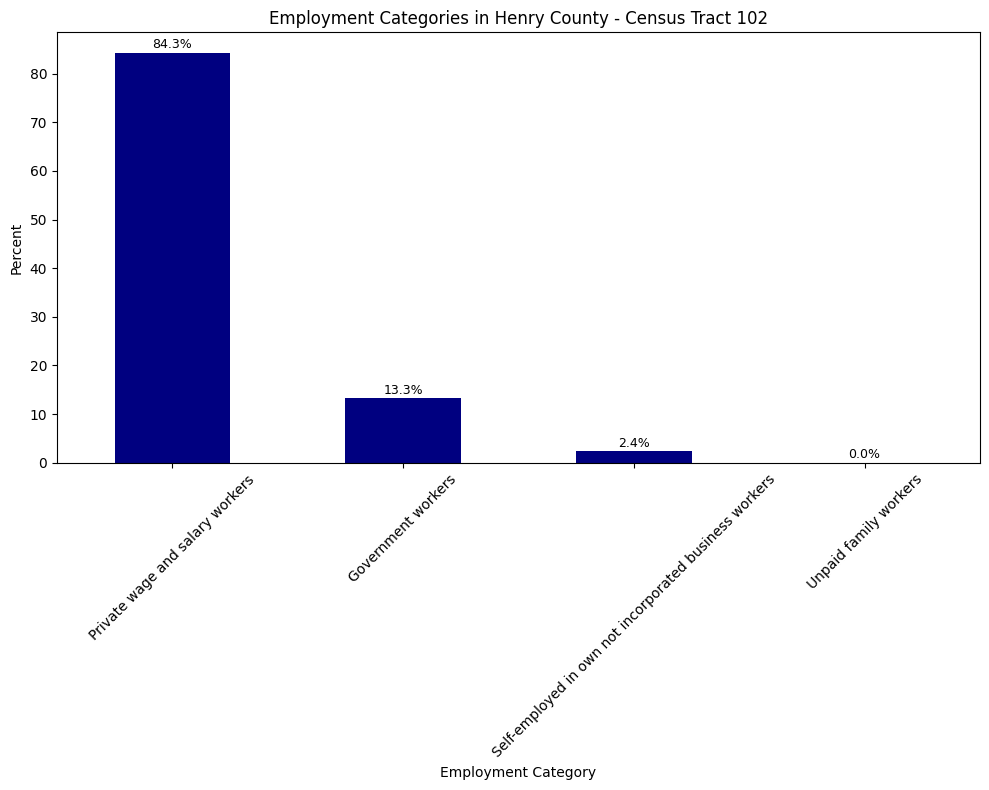

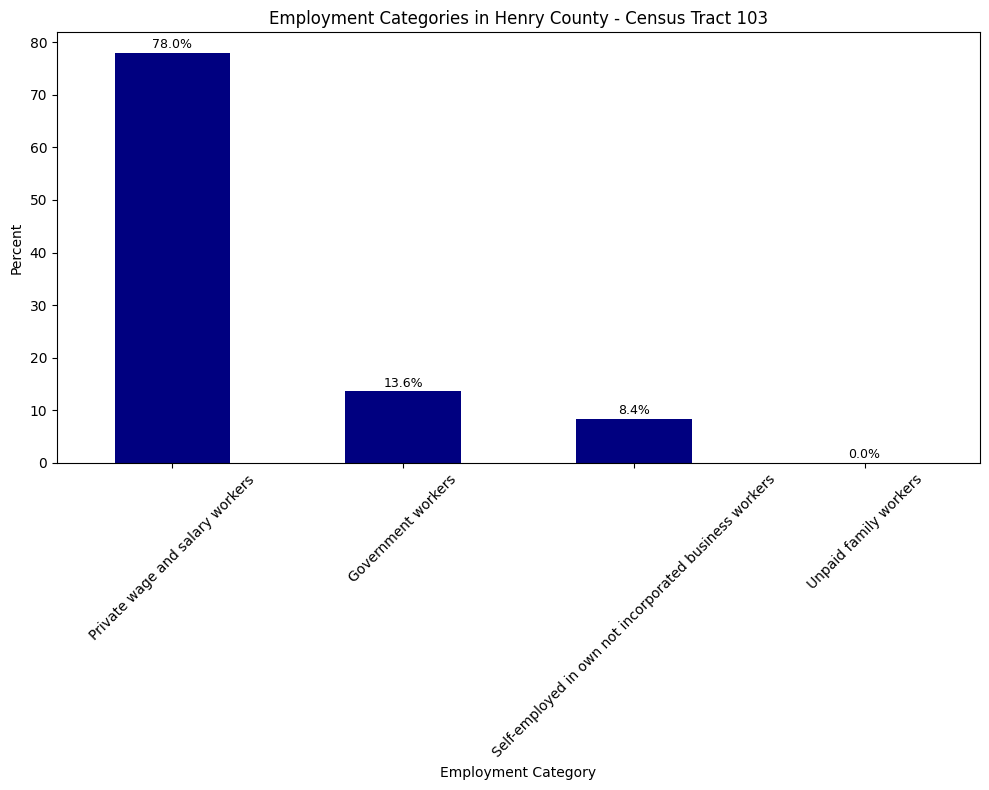

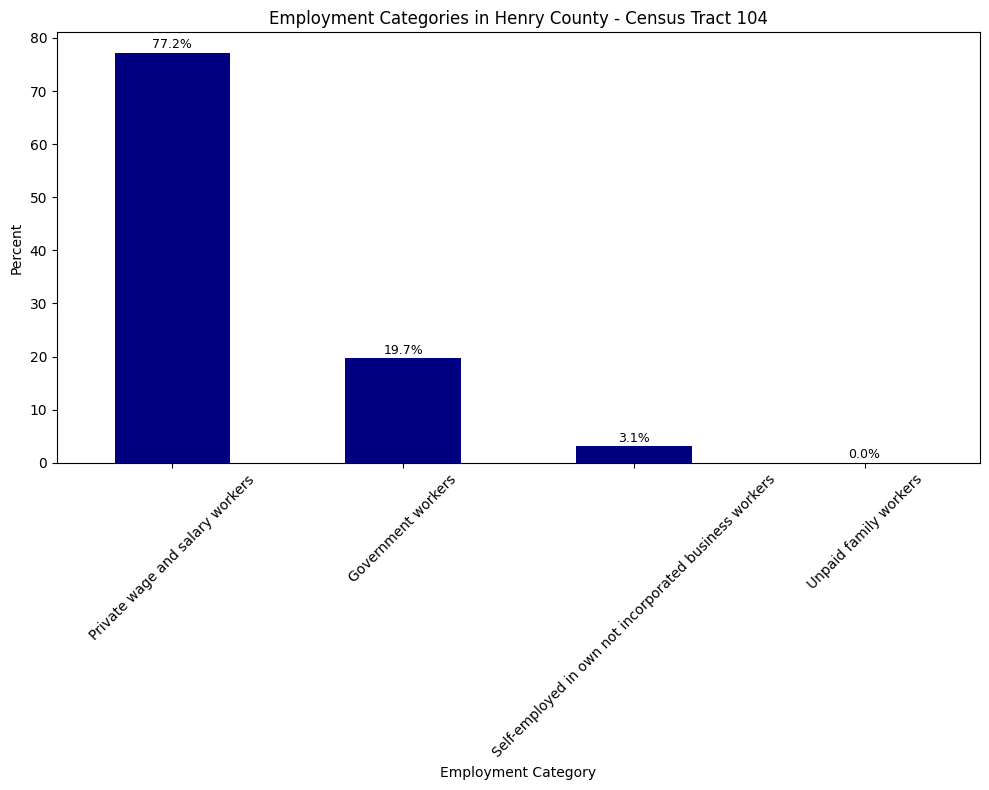

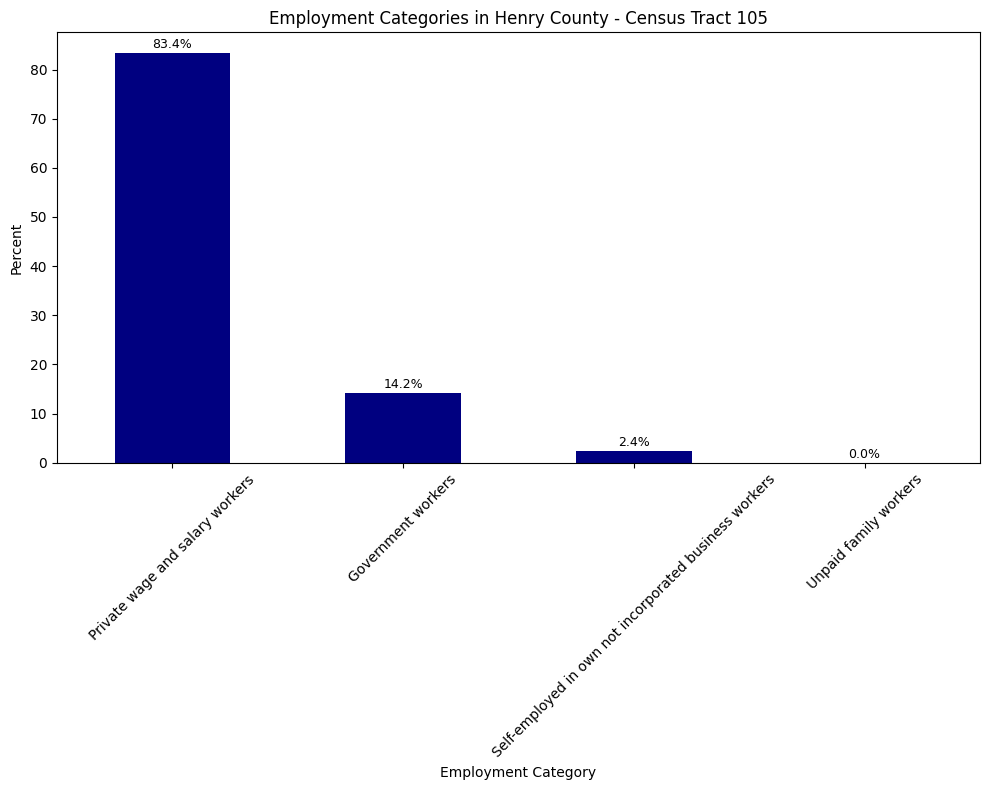

...

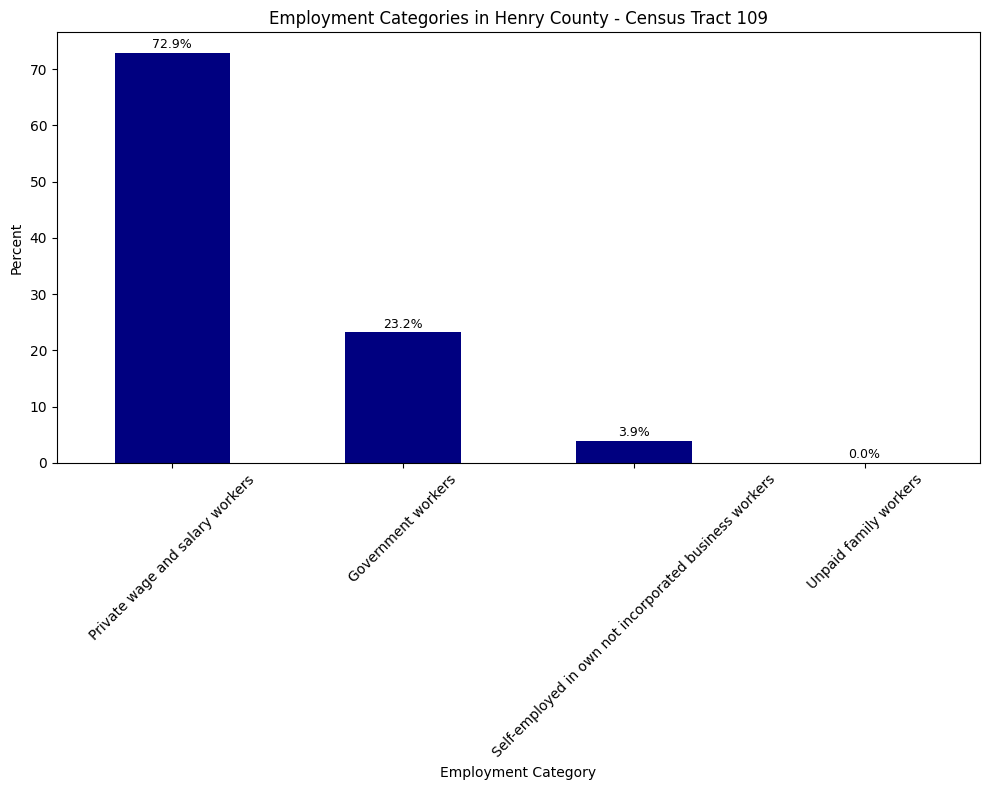

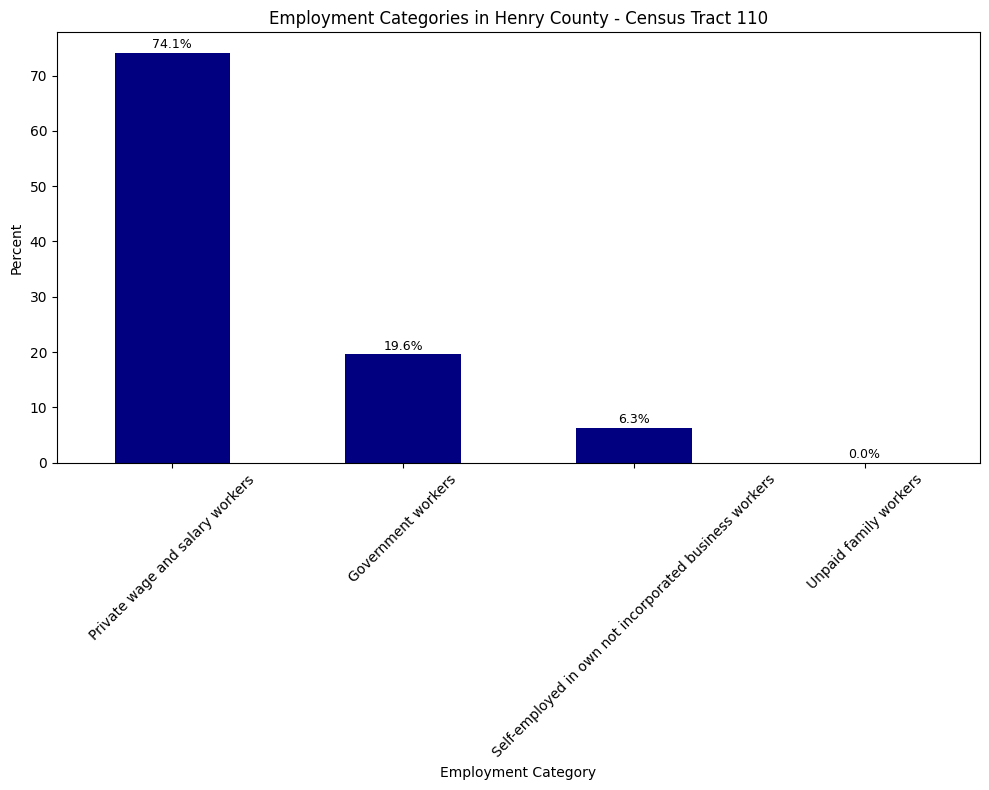

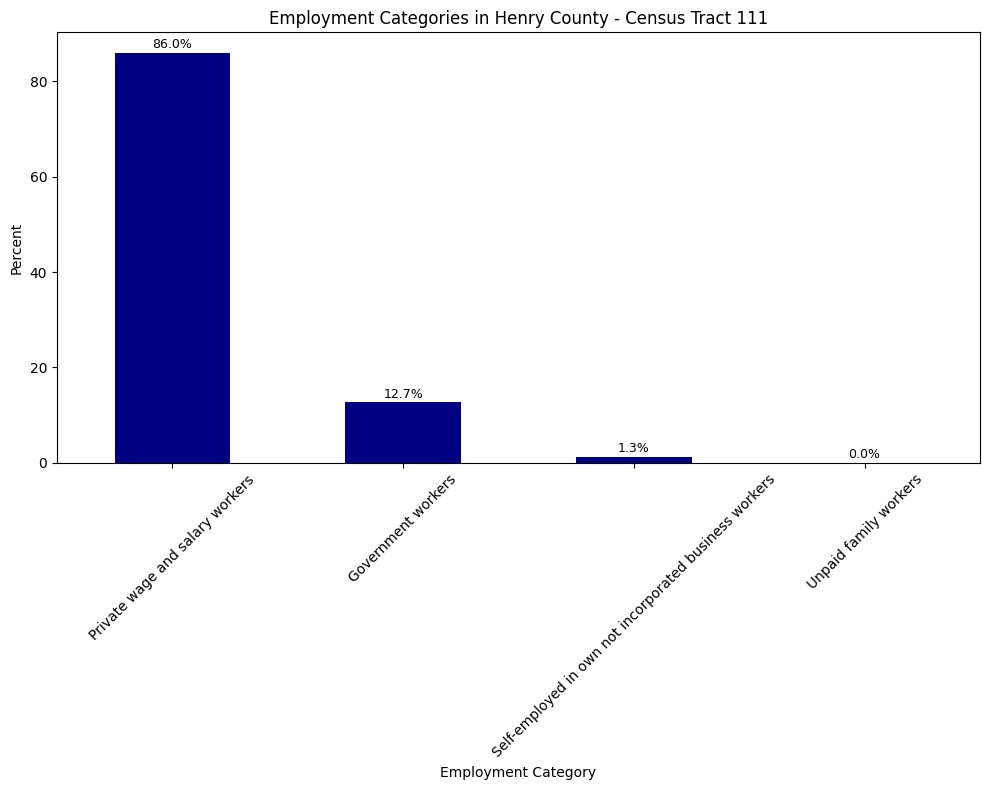

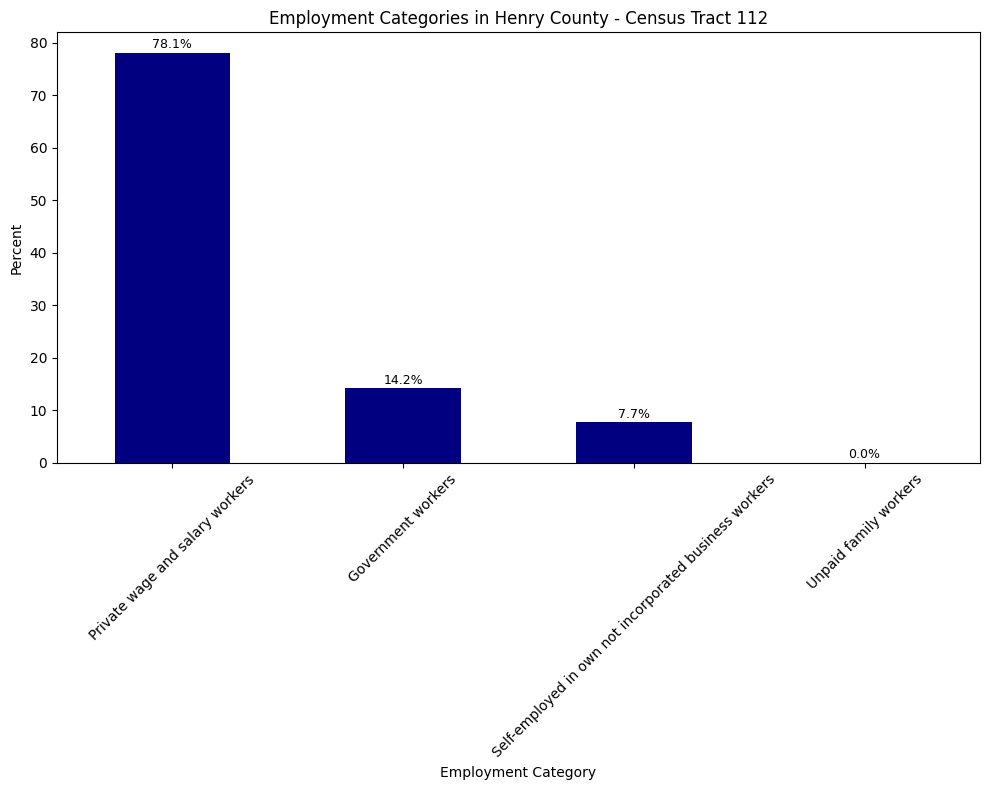

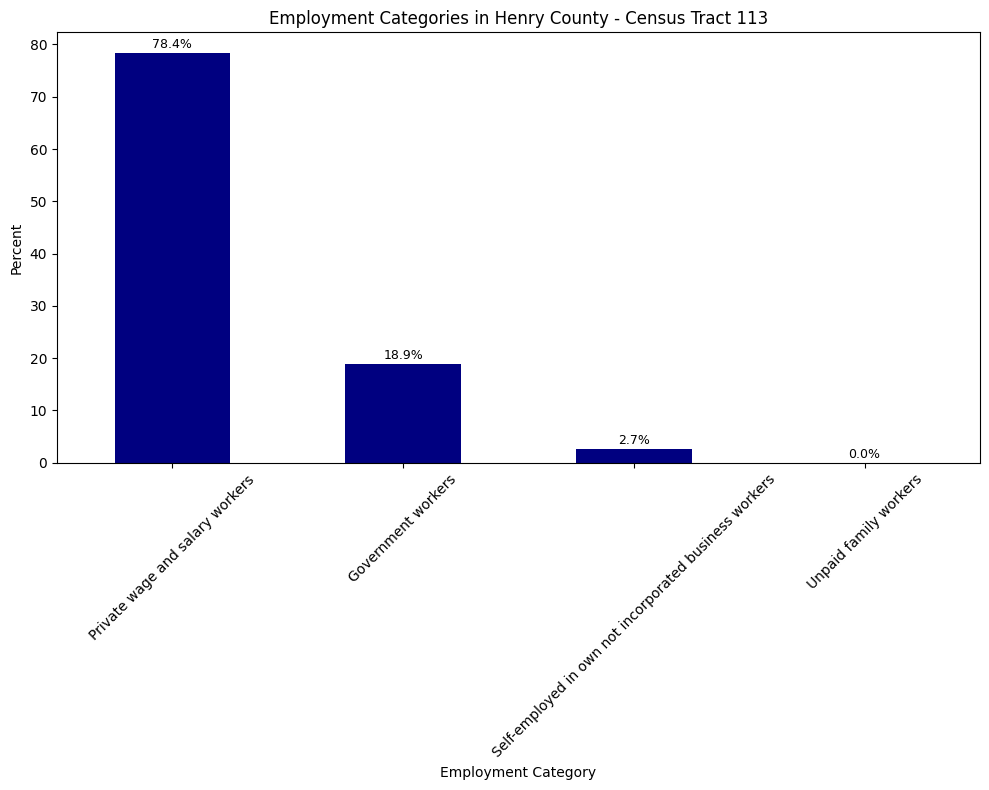

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'

# Define employment categories of interest
employment_categories = [
    'Private wage and salary workers',
    'Government workers',
    'Self-employed in own not incorporated business workers',
    'Unpaid family workers'
]

# Generate file names dynamically, excluding 'hc_ec_106'
file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]

# Loop through the files
for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Extract tract number from file name
    tract_number = file_name.split('_')[-1].split('.')[0]  # 'hc_ec_101.csv' -> '101'

    # Construct the column name based on tract number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for employment categories
    filtered_employment_data = data[data['Label (Grouping)'].isin(employment_categories)]
    grouped_employment_data = filtered_employment_data.set_index('Label (Grouping)')[percent_column]

    # Plotting
    plt.figure(figsize=(10, 8))
    grouped_employment_data.plot(kind='bar', color='navy')
    plt.xlabel('Employment Category')
    plt.ylabel('Percent')
    plt.title(f'Employment Categories in Henry County - Census Tract {tract_number}')
    plt.xticks(rotation=45)

    # Adding numbers to the top of each bar for clarity
    for j, value in enumerate(grouped_employment_data):
        plt.text(j, value + 0.3, f'{value:.1f}%', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


The visual data highlights the employment categories in Henry County across various census tracts, consistently showing that private wage and salary workers are the predominant category. Tract 101 leads with 85.0%, followed by government workers at 11.5%. Tract 102 mirrors this with 84.3% private workers and 13.3% government workers. In Tract 103, private workers account for 78.0% and government workers for 13.6%, with a notable 8.4% self-employed. Tract 104 has 77.2% private workers and 19.7% government workers, while Tract 105 shows 83.4% private workers and 14.2% government workers. Tract 107 has the highest percentage of private workers at 86.2%, with 7.8% government workers. Tract 108 includes 76.8% private workers and 11.5% each for government and self-employed workers. Tract 109 features 72.9% private workers and the highest percentage of government workers at 23.2%. Tract 110 shows 74.1% private workers and 19.6% government workers. Tract 111 highlights 86.0% private workers and 12.7% government workers. Tract 112 includes 78.1% private workers and 14.2% government workers. Finally, Tract 113 shows 78.4% private workers and 18.9% government workers. Overall, private wage and salary workers consistently form the largest employment category across all tracts, followed by government workers, with minimal representation of self-employed individuals, reflecting a significant reliance on private sector employment in the county.

<a name="3h"></a>
### **Distribution of Top 5 Income Brackets in Henry County**

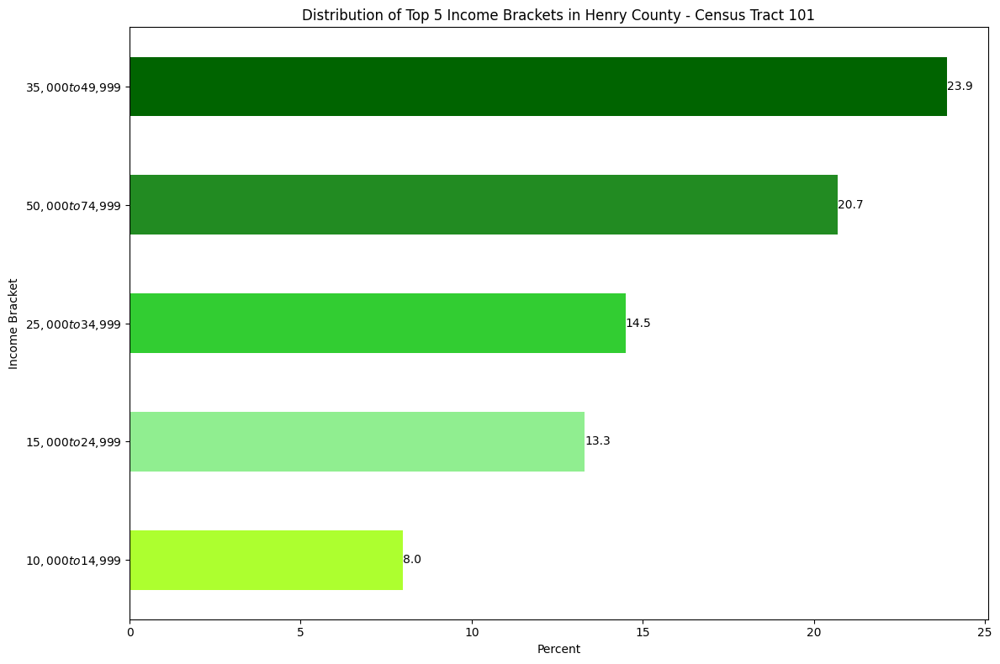

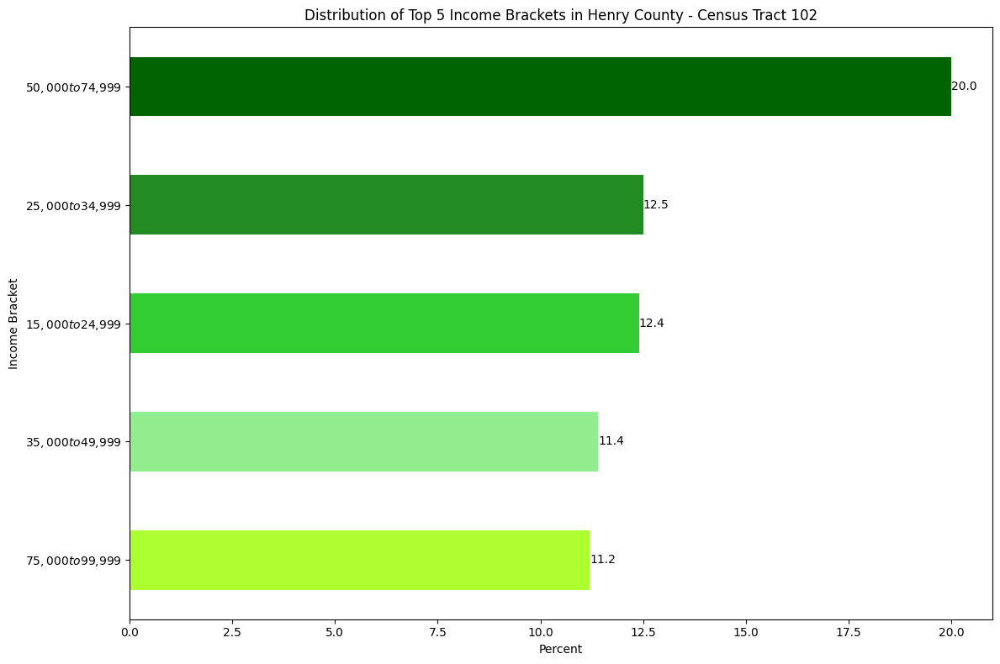

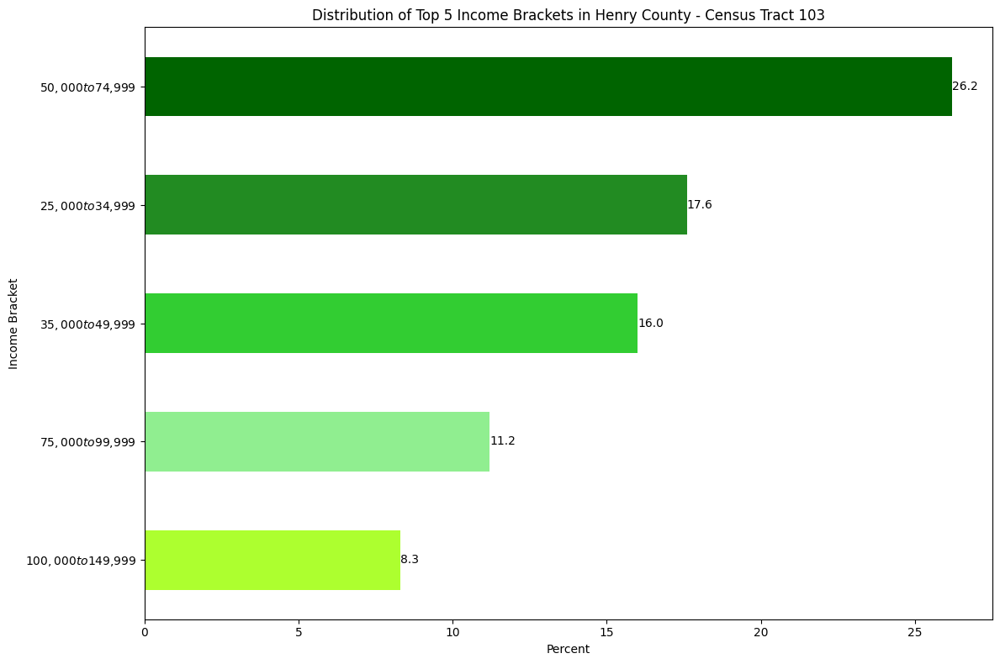

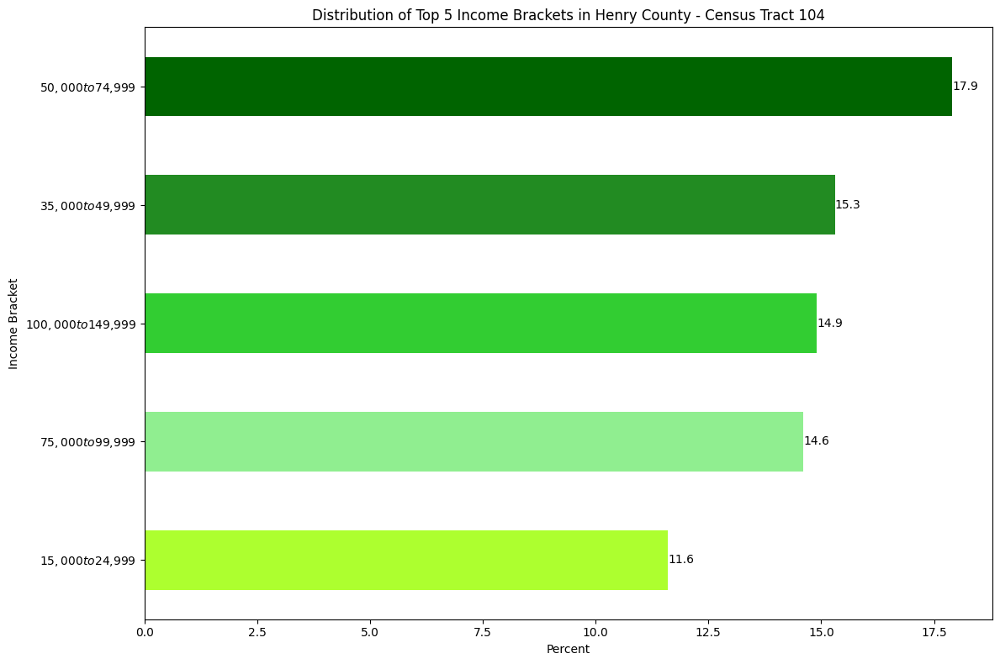

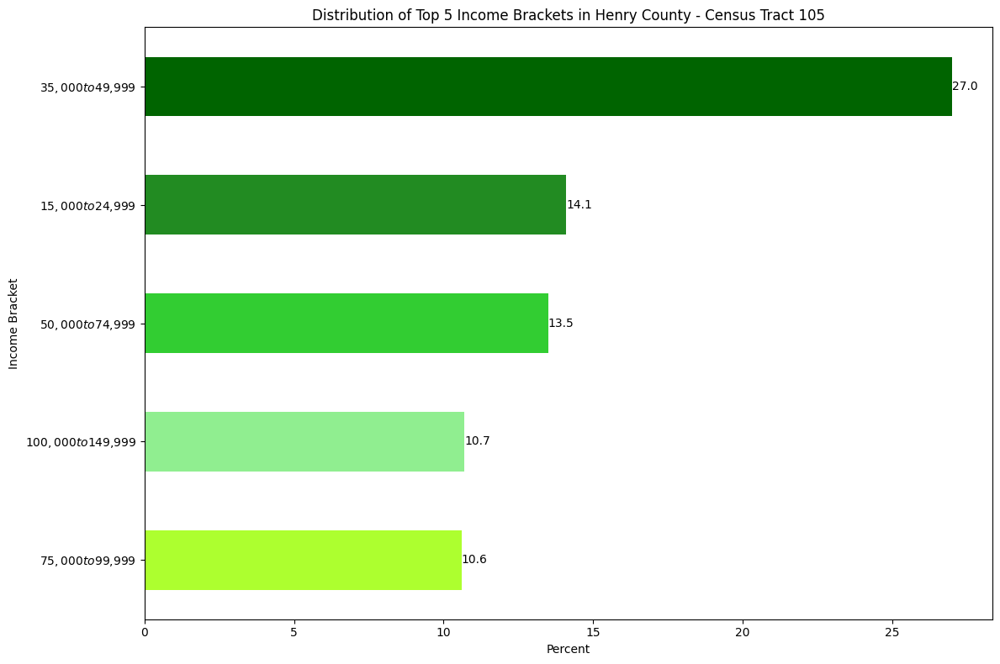

...

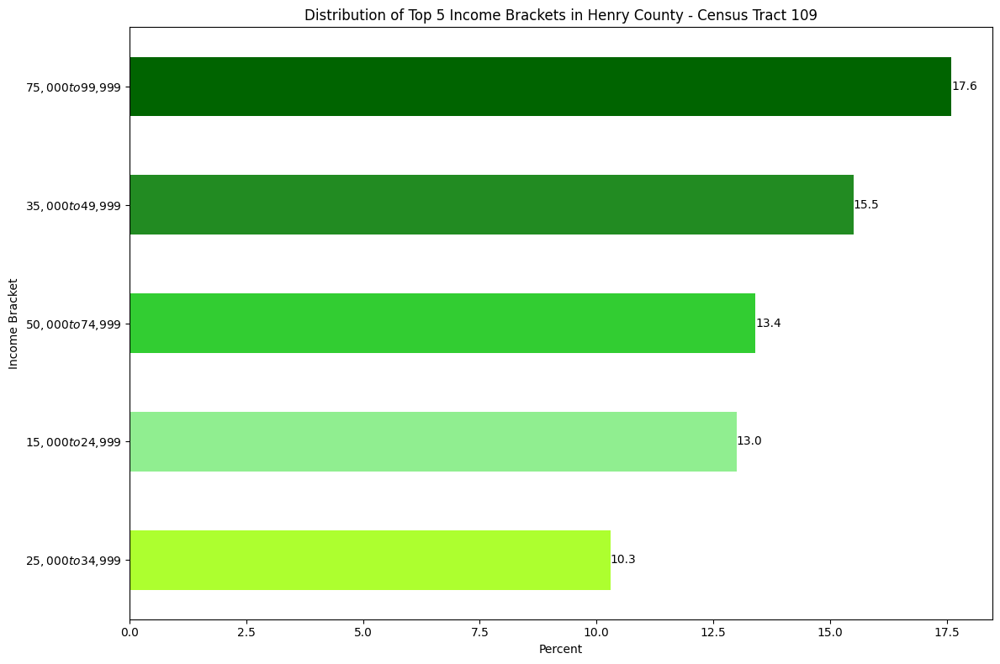

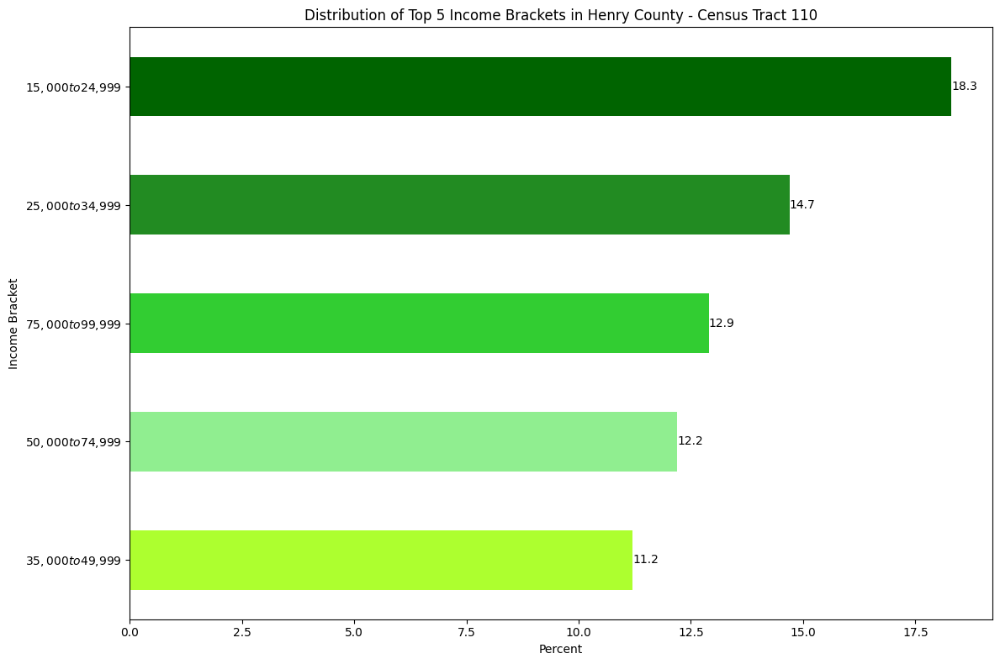

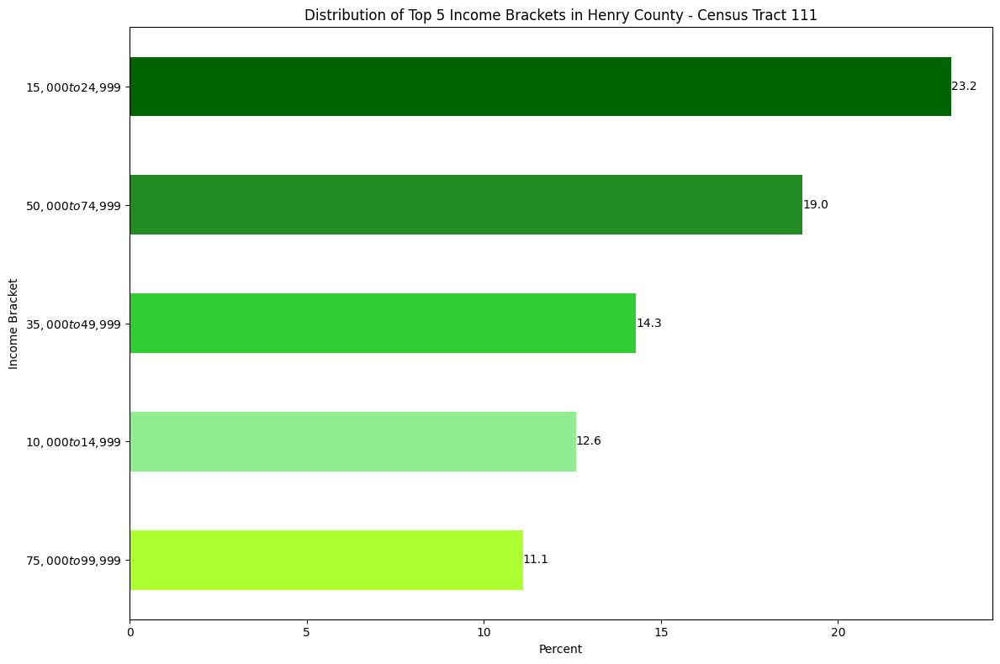

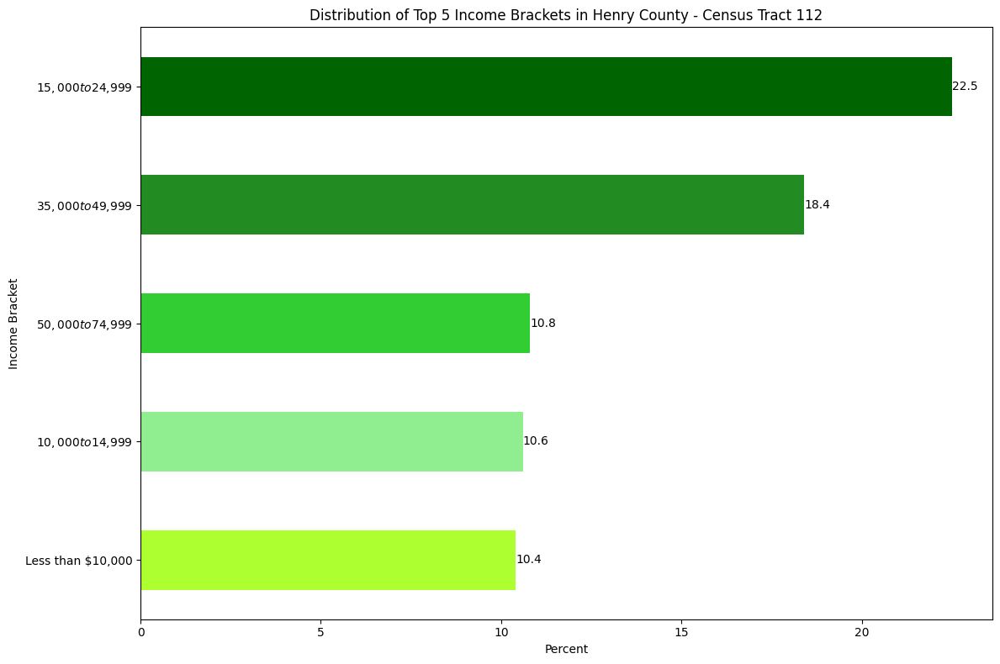

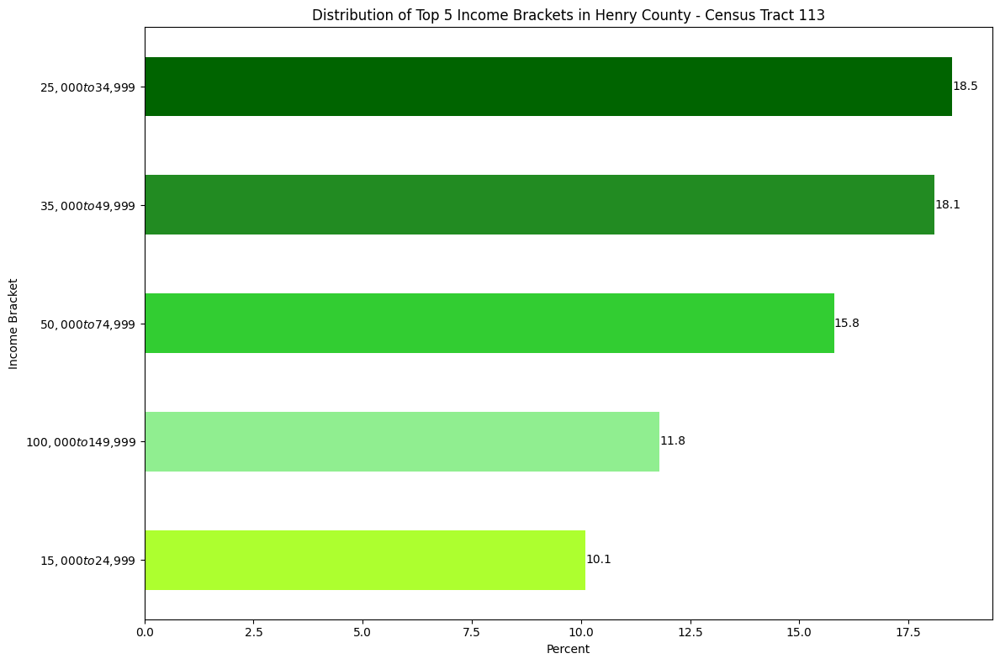

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'

# Define income brackets of interest
income_brackets = [
    'Less than $10,000',
    '$10,000 to $14,999',
    '$15,000 to $24,999',
    '$25,000 to $34,999',
    '$35,000 to $49,999',
    '$50,000 to $74,999',
    '$75,000 to $99,999',
    '$100,000 to $149,999',
    '$150,000 to $199,999',
    '$200,000 or more'
]

# Generate file names dynamically, excluding 'hc_ec_106'
file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]

# Loop through the files
for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Extract tract number from file name
    tract_number = file_name.split('_')[-1].split('.')[0]  # Extracts '101', '102', etc. from the filename

    # Construct the column name based on tract number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for income brackets
    filtered_income_data = data[data['Label (Grouping)'].isin(income_brackets) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_income_data = filtered_income_data.set_index('Label (Grouping)')[percent_column]

    # Select the top 5 income brackets based on their percent value
    top_income_data = grouped_income_data.nlargest(5)

    # Define a gradient of greens for the top 5
    colors = ['#ADFF2F', '#90EE90', '#32CD32', '#228B22', '#006400']
    # Plotting
    plt.figure(figsize=(12, 8))
    ax = top_income_data.sort_values().plot(kind='barh', color=colors)
    plt.xlabel('Percent')
    plt.ylabel('Income Bracket')
    plt.title(f'Distribution of Top 5 Income Brackets in Henry County - Census Tract {tract_number}')

    # Add numbers on top of each bar
    for p in ax.patches:
        ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.1f}', va='center')

    plt.tight_layout()
    plt.show()


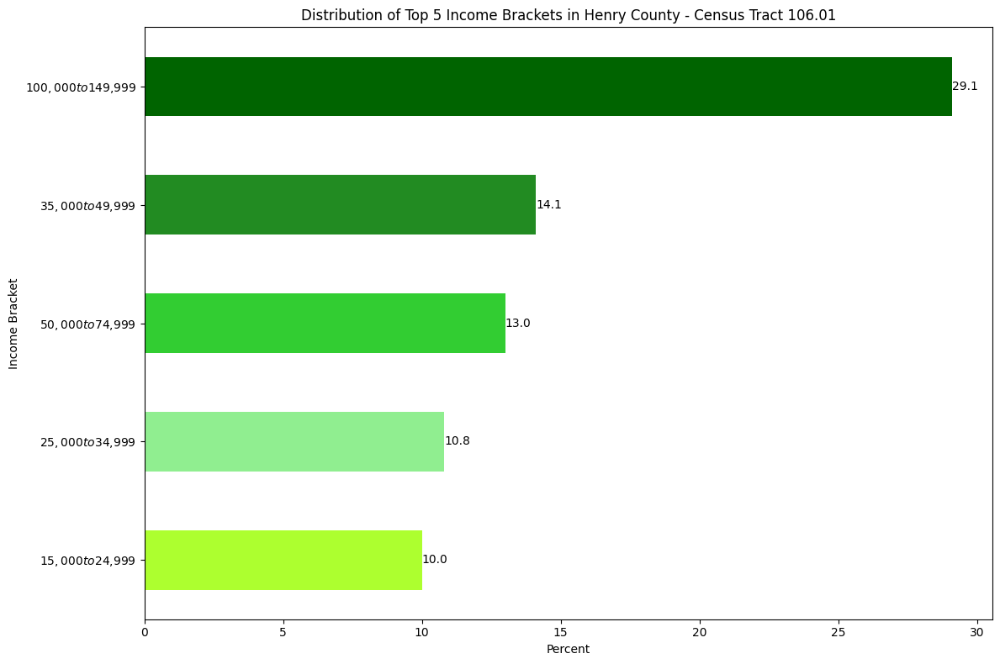

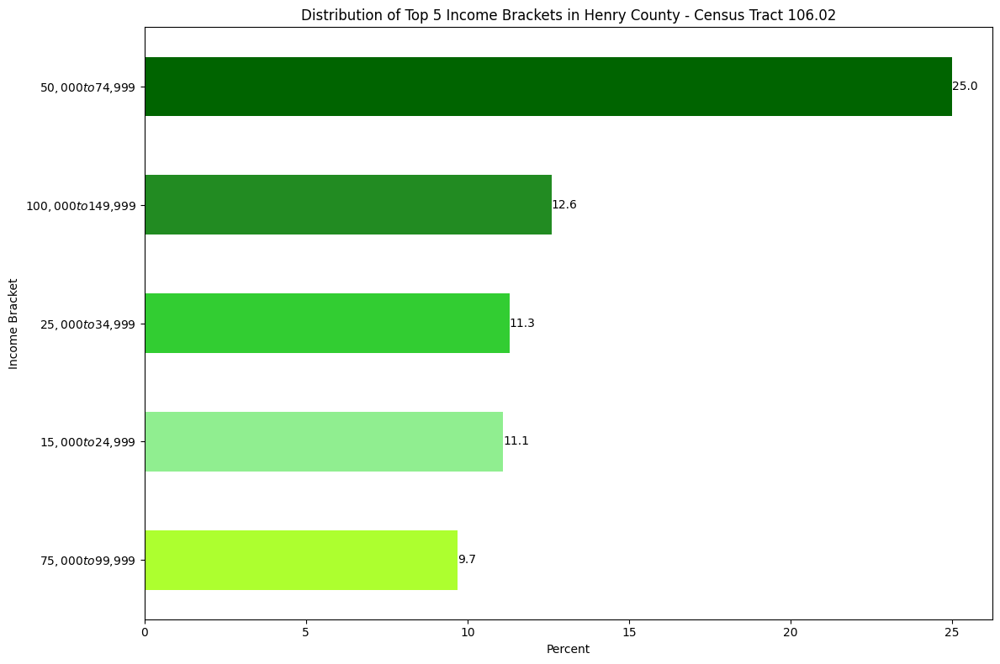

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'

# Define income brackets of interest
income_brackets = [
    'Less than $10,000',
    '$10,000 to $14,999',
    '$15,000 to $24,999',
    '$25,000 to $34,999',
    '$35,000 to $49,999',
    '$50,000 to $74,999',
    '$75,000 to $99,999',
    '$100,000 to $149,999',
    '$150,000 to $199,999',
    '$200,000 or more'
]

# Generate file names dynamically, excluding 'hc_ec_106'
file_names = ['hc_ec_106.01.csv', 'hc_ec_106.02.csv']

# Loop through the files
for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)'
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Extract tract number from file name
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Construct the column name based on tract number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Clean and convert percentage data
    data[percent_column] = (
        data[percent_column]
        .str.replace('%', '').replace('-', pd.NA)
        .apply(pd.to_numeric, errors='coerce')
    )

    # Filter and process data for income brackets
    filtered_income_data = data[data['Label (Grouping)'].isin(income_brackets) & ~data['Label (Grouping)'].duplicated(keep='first')]
    grouped_income_data = filtered_income_data.set_index('Label (Grouping)')[percent_column]

    # Select the top 5 income brackets based on their percent value
    top_income_data = grouped_income_data.nlargest(5)

    # Define a gradient of greens for the top 5
    colors = ['#ADFF2F', '#90EE90', '#32CD32', '#228B22', '#006400']
    # Plotting
    plt.figure(figsize=(12, 8))
    ax = top_income_data.sort_values().plot(kind='barh', color=colors)
    plt.xlabel('Percent')
    plt.ylabel('Income Bracket')
    plt.title(f'Distribution of Top 5 Income Brackets in Henry County - Census Tract {tract_number}')

    # Add numbers on top of each bar
    for p in ax.patches:
        ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.1f}', va='center')

    plt.tight_layout()
    plt.show()


The visual data illustrates the distribution of the top five income brackets in Henry County across various census tracts. In Tract 101, the largest income bracket is $35,000 to $49,999, accounting for 23.9%, followed by $50,000 to $74,999 at 20.7%. In Tract 102, the $50,000 to $74,999 bracket leads at 20.0%, with $25,000 to $34,999 at 12.5%. Tract 103 shows $50,000 to $74,999 as the largest at 26.2%, followed by $25,000 to $34,999 at 17.6%. In Tract 104, the $50,000 to $74,999 bracket is the highest at 17.9%, with $35,000 to $49,999 at 15.3%. Tract 105 features $35,000 to $49,999 as the largest bracket at 27.0%, followed by $15,000 to $24,999 at 14.1%. In Tract 107, $50,000 to $74,999 is the most common bracket at 27.5%, followed by $75,000 to $99,999 at 14.2%. Tract 108 shows $35,000 to $49,999 at 27.6%, followed by $50,000 to $74,999 at 14.2%. Tract 109 has $75,000 to $99,999 as the largest group at 17.6%. In Tract 110, the $15,000 to $24,999 bracket leads at 18.3%. Tract 111 highlights $15,000 to $24,999 at 23.2%. Tract 112 shows a concentration in the $15,000 to $24,999 bracket at 22.5%. Lastly, Tract 113 features $25,000 to $34,999 as the most common bracket at 18.5%, and Tract 106.01 highlights $100,000 to $149,999 at 29.1%. Overall, the data shows varied income distributions across tracts, with a notable prevalence of middle-income brackets ($35,000 to $74,999) in many tracts, while some tracts have higher concentrations in lower ($15,000 to $24,999) or higher income brackets ($75,000 to $149,999). This highlights the economic diversity and significant representation of middle-income households in Henry County.

<a name="3i"></a>
### **Subject Pass Rates for Middle and High Schools**

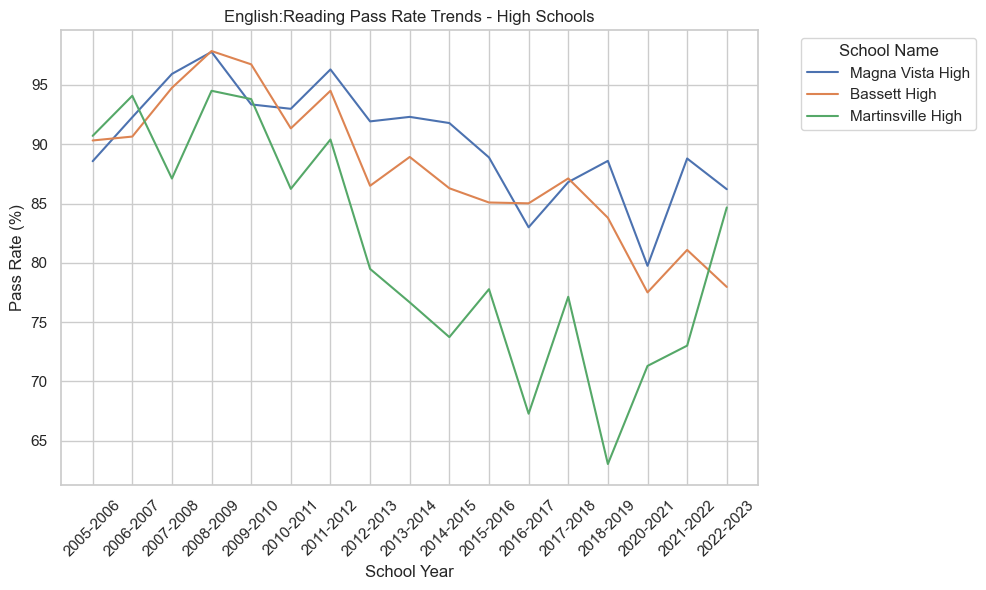

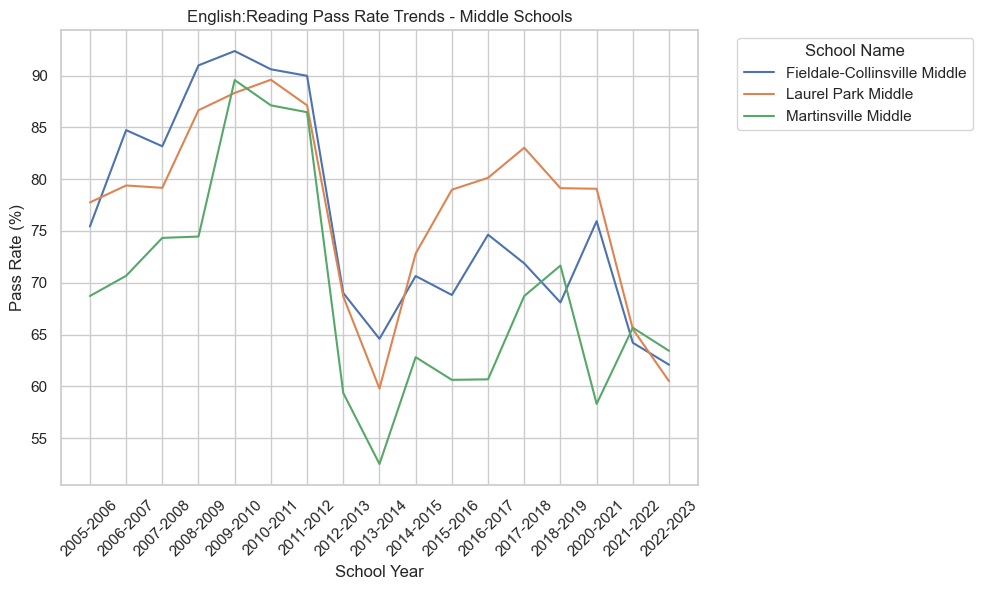

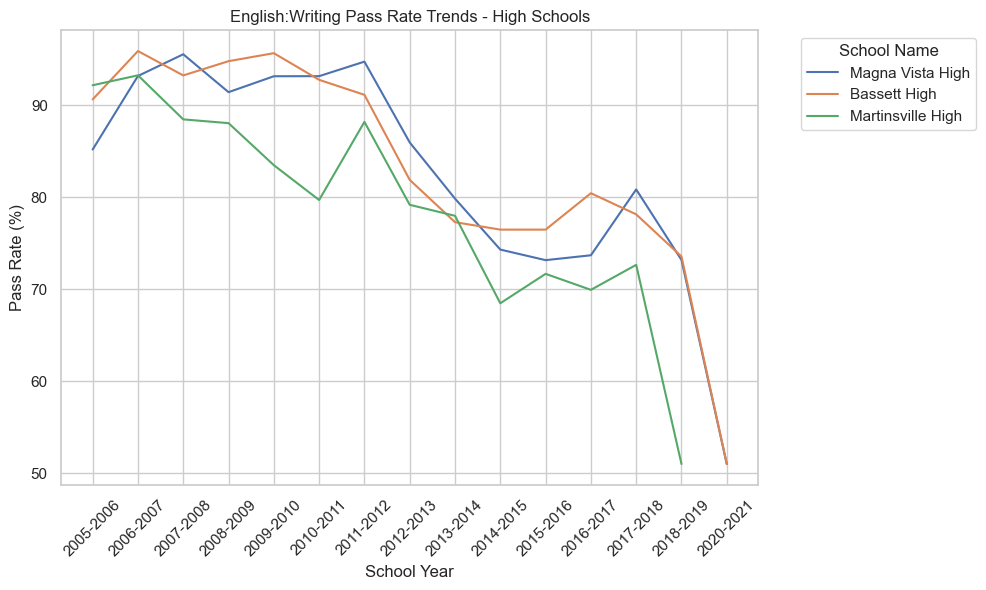

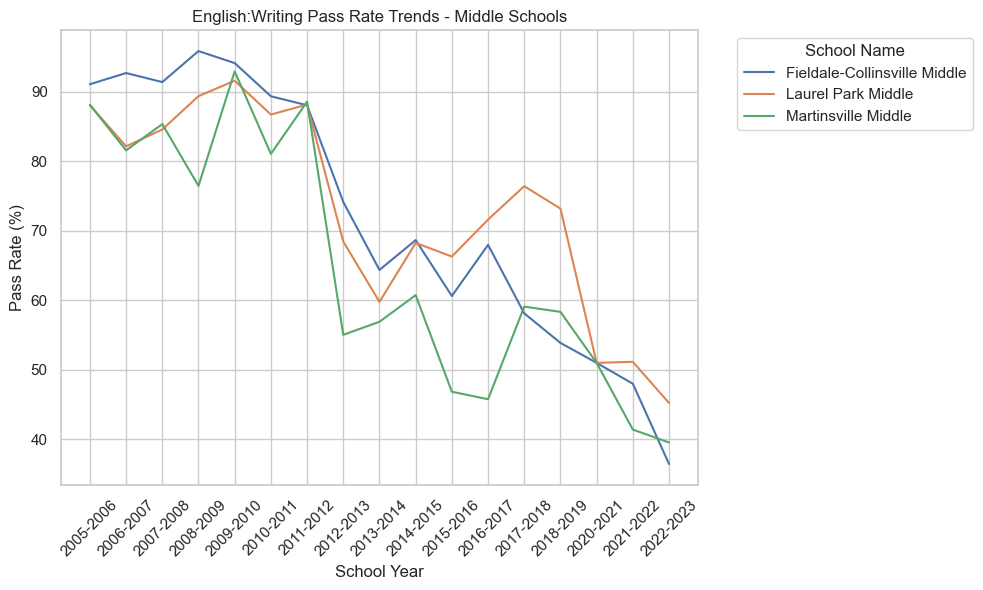

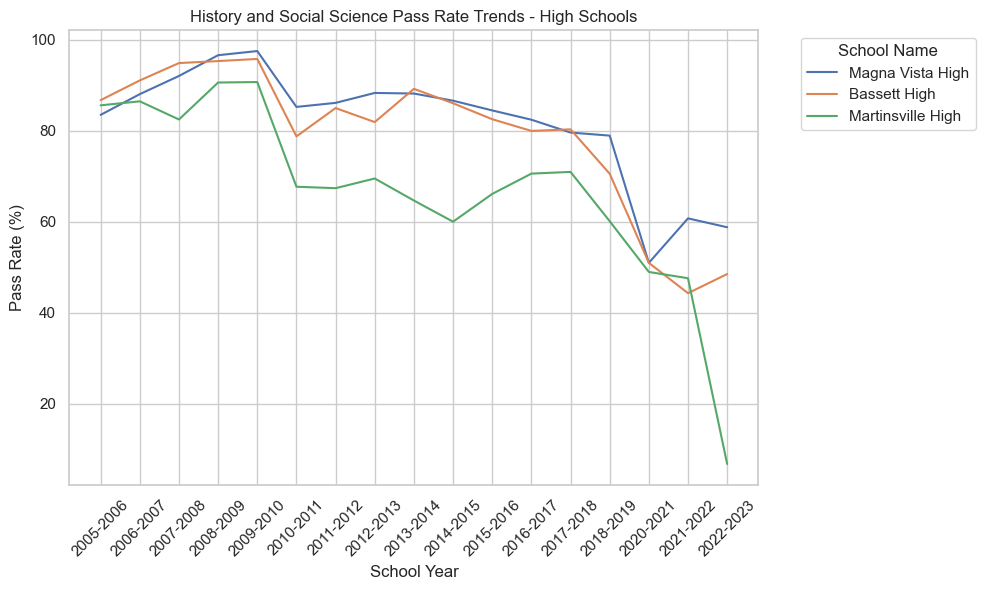

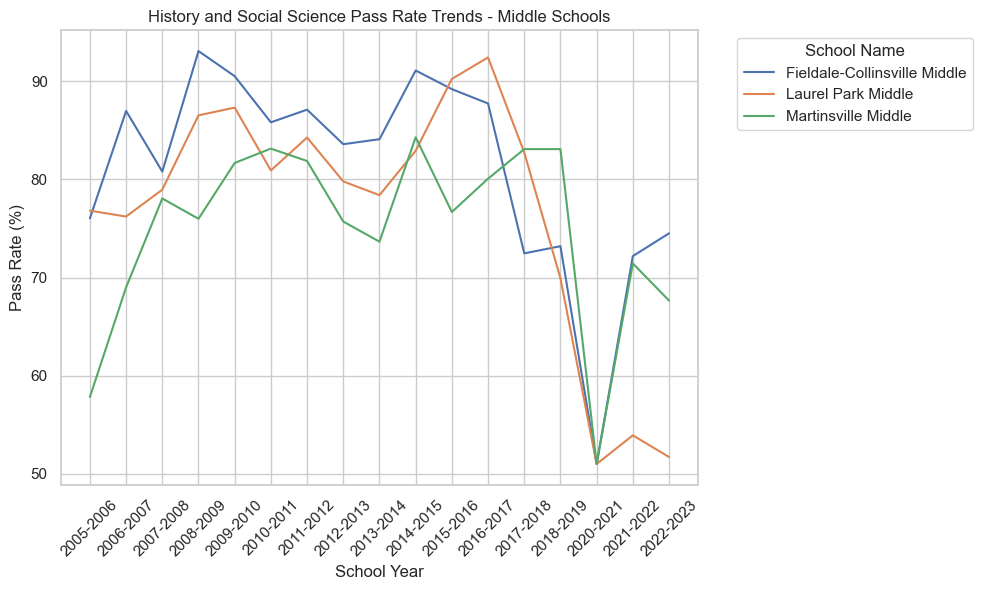

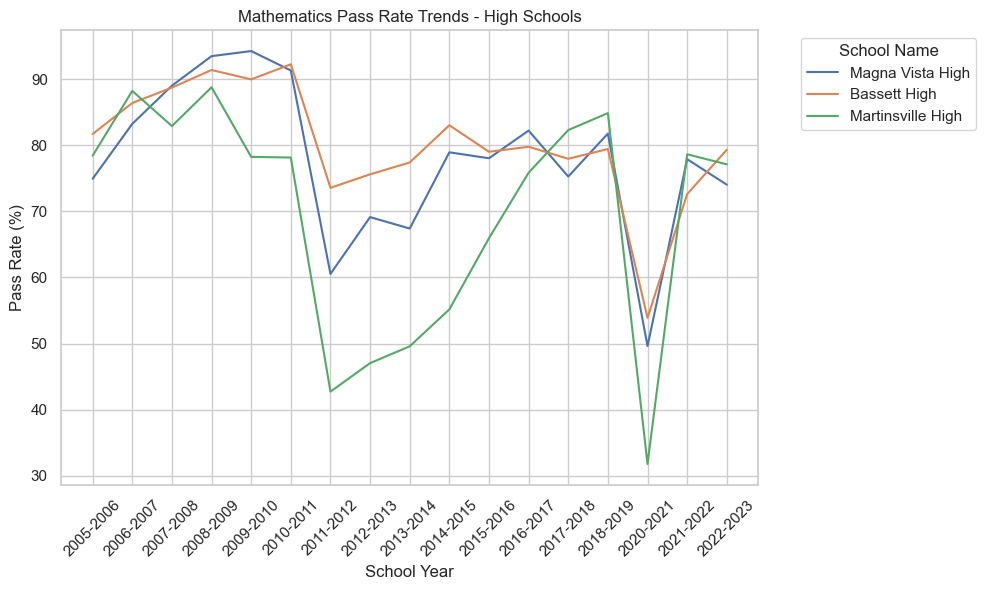

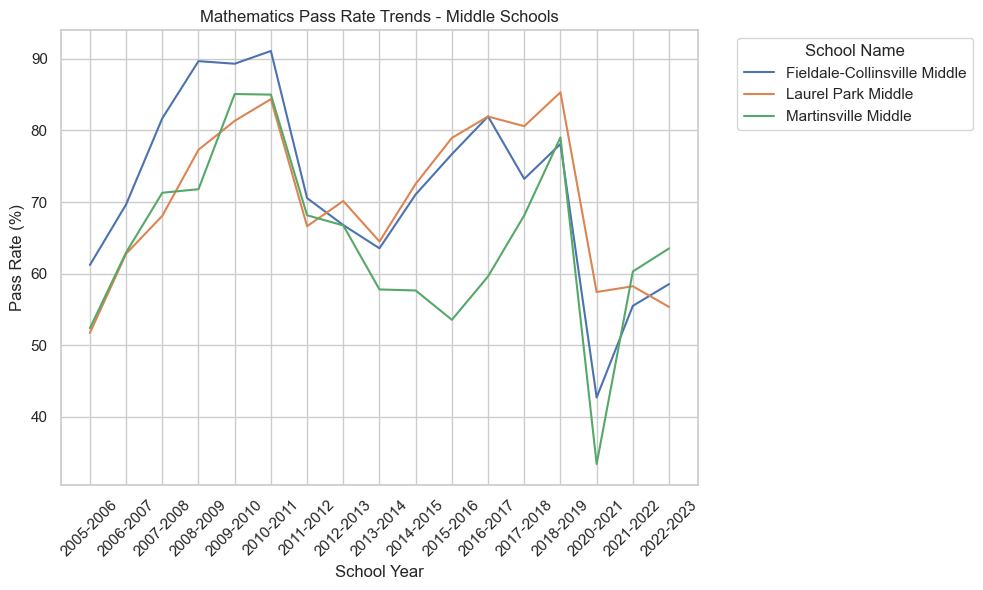

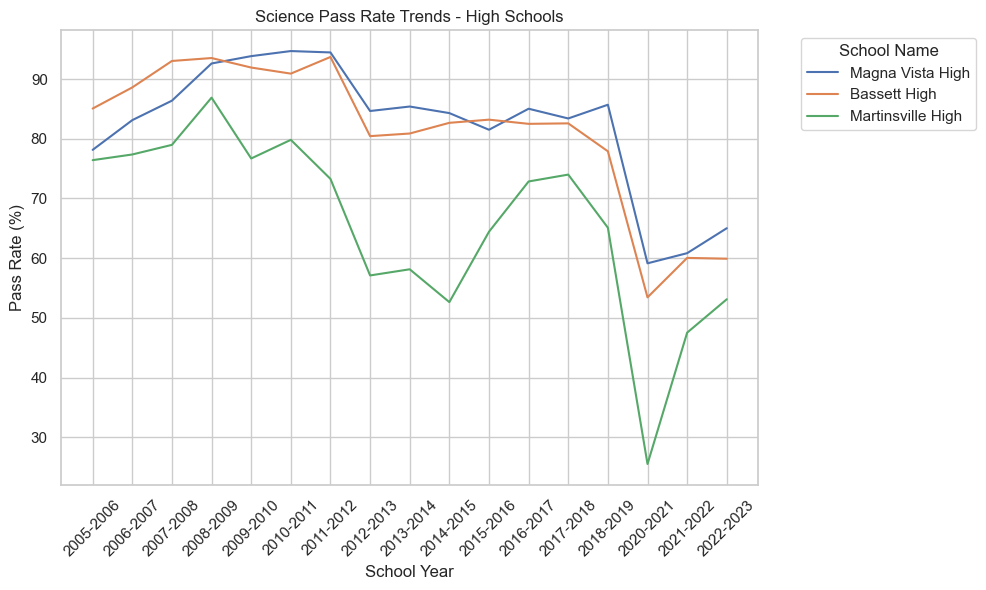

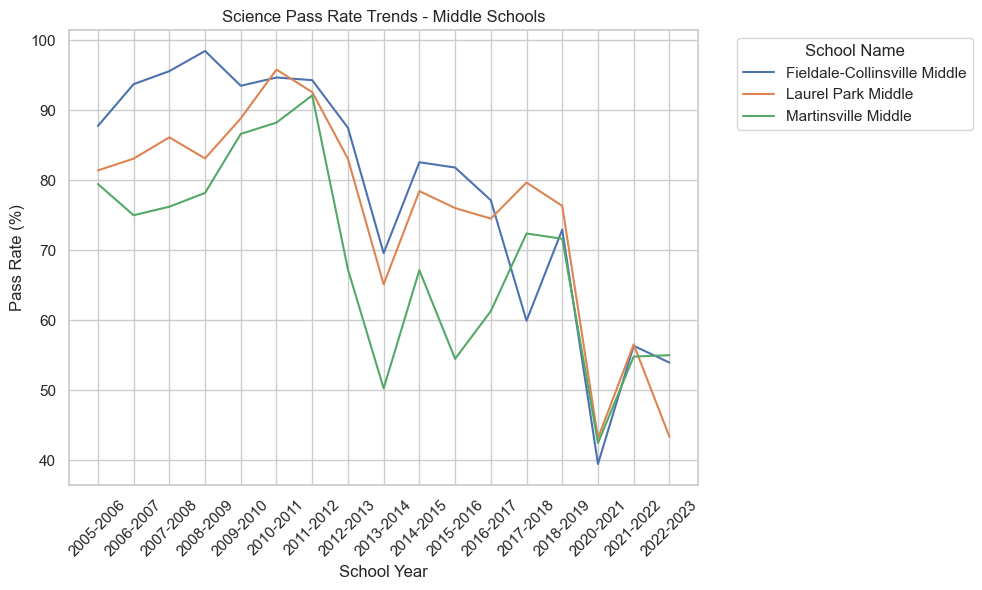

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\assesment'

# Generate file names: handle ranges and specific exclusions/inclusions
file_names = [f'assessment_data_HC_{i}.csv' for i in range(101, 114) if i != 106 and i != 108 and i != 112]
file_names.extend(['assessment_data_HC_106.01.csv', 'assessment_data_HC_106.02.csv'])
file_names.extend(['assessment_data_MC_1.csv', 'assessment_data_MC_2.csv', 'assessment_data_MC_3.csv'])

# Function to clean and prepare the pass rate
def clean_pass_rate(rate):
    if isinstance(rate, str):
        if rate.startswith('>'):
            return float(rate[1:]) + 1
        elif rate.startswith('<'):
            return float(rate[1:]) - 1
    return float(rate)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Reading and processing all files
all_data = []
for file_name in file_names:
    file_path = os.path.join(directory_path, file_name)
    df = pd.read_csv(file_path)
    df['Pass Rate'] = df['Pass Rate'].apply(clean_pass_rate)
    all_data.append(df)

# Combine all data into one DataFrame
data = pd.concat(all_data, ignore_index=True)

# Define school categories based on school name
school_categories = ['High', 'Middle']  # Excluding 'Elementary'

# Custom function to sort school years
def sort_school_year(school_year):
    start_year, end_year = map(int, school_year.split('-'))
    return start_year

# Group by subject and school type, and plot
for subject, group in data.groupby('Subject'):
    for category in school_categories:
        school_group = group[group['School Name'].str.contains(category)].copy()
        if not school_group.empty:
            # Sort by school year
            school_group['School Year'] = pd.Categorical(
                school_group['School Year'],
                categories=sorted(school_group['School Year'].unique(), key=sort_school_year),
                ordered=True
            )
            plt.figure(figsize=(10, 6))
            sns.lineplot(x='School Year', y='Pass Rate', hue='School Name', data=school_group, dashes=False)
            plt.title(f'{subject} Pass Rate Trends - {category} Schools')
            plt.xlabel('School Year')
            plt.ylabel('Pass Rate (%)')
            plt.xticks(rotation=45)
            plt.legend(title='School Name', bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.grid(True)
            plt.show()



The charts illustrate the trends in pass rates across various subjects (English Reading, English Writing, History and Social Science, and Mathematics) for high schools and middle schools in specific districts from 2005 to 2023.

### High School Trends:
#### English Reading:
- **Magna Vista High** and **Bassett High** show fluctuating but generally declining trends over the years.
- **Martinsville High** shows significant variability with a notable drop in recent years.

#### English Writing:
- All schools exhibit a decline starting around 2016, with **Martinsville High** experiencing a steep drop.

#### History and Social Science:
- While **Magna Vista** and **Bassett** maintain higher rates until a sharp fall after 2020, **Martinsville High** shows more pronounced fluctuations and a significant decline after 2020.

#### Mathematics:
- There is a dramatic decline in pass rates at **Martinsville High** around 2017, while **Magna Vista** and **Bassett** show recovery after initial drops.

### Middle School Trends:
#### English Reading:
- **Fieldale-Collinsville Middle** shows a general decline.
- **Laurel Park Middle** and **Martinsville Middle** both show improvements after significant drops.

#### English Writing:
- **Martinsville Middle** demonstrates extreme volatility and a sharp decline towards the latest years.
- **Fieldale-Collinsville** and **Laurel Park** also show declines but with some recovery.

#### History and Social Science:
- Similar to high schools, all middle schools display substantial drops in recent years.

#### Mathematics:
- A noticeable decline in pass rates is seen around 2017 across all schools, with partial recoveries following.

### Observations:
- There is a consistent pattern of decline across most subjects and schools in recent years, especially post-2020, which might indicate impacts from external factors such as changes in educational policies, teaching methodologies, or broader socio-economic conditions.
- The volatility in **Martinsville High** suggests particular challenges that might need targeted interventions to stabilize and improve student performance.
- Recovery patterns in some schools post-decline suggest adaptations or improvements in educational strategies that might be further analyzed and replicated where successful.

These trends provide critical insights into the academic performance dynamics within these districts, suggesting areas for targeted policy intervention and resource allocation to address educational challenges effectively.


<a name="3j"></a>
### **Labor Force in Martinsville**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\2978824405.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


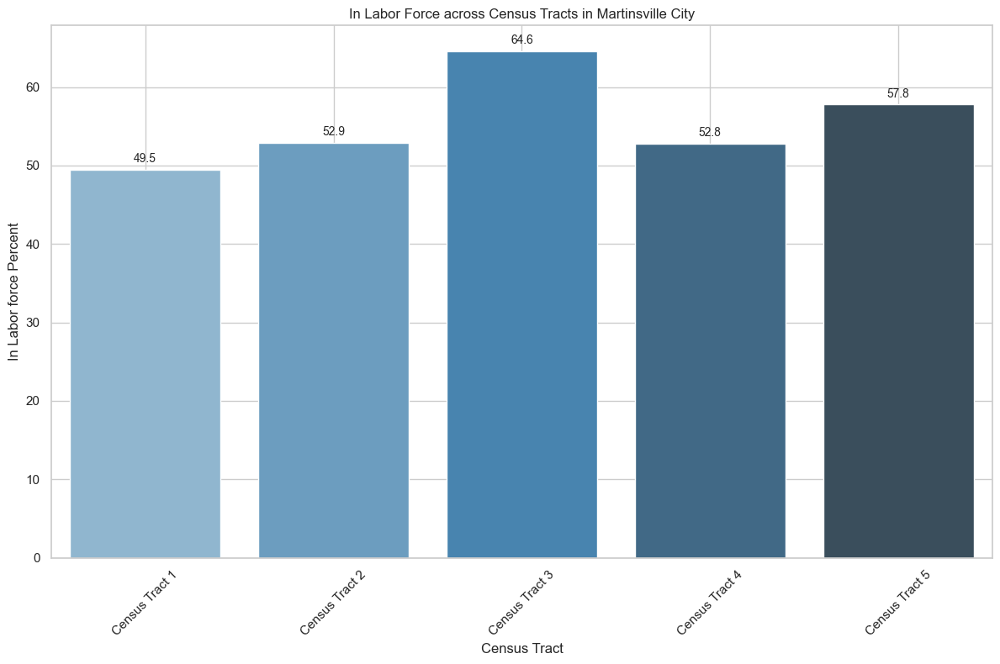

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os


# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'
file_names = [f'economy_{i}.csv' for i in range(1, 6)]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for i, file_name in enumerate(file_names, start=1):
    file_path = os.path.join(directory_path, file_name)
    data = clean_csv_data(file_path)

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'In labor force'].iloc[0]

    # Extract the relevant 'Percent' column name based on the file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'Census Tract {i}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('In Labor Force across Census Tracts in Martinsville City')
plt.xlabel('Census Tract')
plt.ylabel('In Labor force Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph shows the labor force participation rates across different census tracts in Martinsville City, revealing some variation in employment engagement among the population. Census Tract 3 stands out with the highest participation rate at 64.6%, suggesting a more economically active population or better job opportunities in this area. In contrast, Census Tract 1 has the lowest rate at 49.5%, which may indicate higher levels of retirees, students, or other non-working groups. The other tracts (Tract 2, Tract 4, and Tract 5) show moderate participation rates ranging from 52.8% to 57.8%, pointing to an average level of workforce engagement in these areas. This variation across tracts can offer insights into the economic conditions and potential areas for targeted development to boost employment participation.

In [ ]:
# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'
file_names = [f'economy_{i}.csv' for i in range(1, 6)]

# Initialize a list to store data for the table
table_data = []

# Process each file
for i, file_name in enumerate(file_names, start=1):
    file_path = os.path.join(directory_path, file_name)
    data = clean_csv_data(file_path)

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'In labor force'].iloc[0]

    # Extract the relevant 'Estimate' column name based on the file number
    estimate_column = f'Census Tract {i}; Martinsville city; Virginia!!Estimate'

    # Append the data to the table_data list
    table_data.append({
        'Census Tract': f'Census Tract {i}',
        'In labor force Estimate': in_labor_force_row[estimate_column]
    })

# Convert the list to a DataFrame
table_df = pd.DataFrame(table_data)

# Print the table
print("\nTable of Estimates:\n")
print(table_df.to_string(index=False))


Table of Estimates:

  Census Tract In labor force Estimate
Census Tract 1                   1,193
Census Tract 2                     879
Census Tract 3                   1,415
Census Tract 4                     936
Census Tract 5                   1,378


<a name="3k"></a>
### **Labor Force in Henry**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\2676292985.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


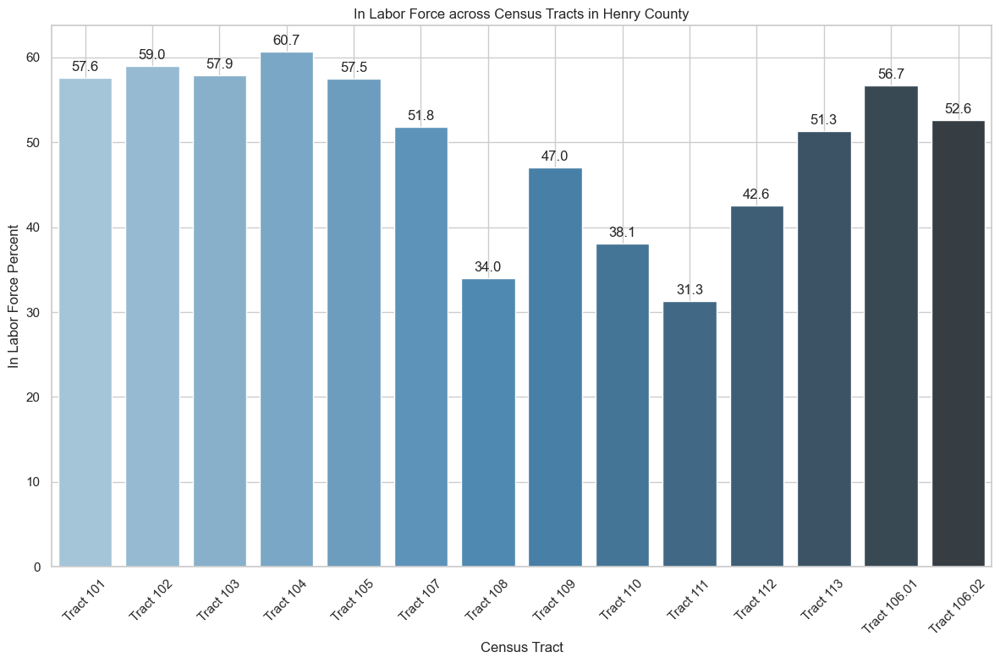

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the function to clean the CSV data
def clean_csv_data(file_path):
    data = pd.read_csv(file_path)
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()
    data.replace('%', '', regex=True, inplace=True)
    percent_columns = [col for col in data.columns if 'Percent' in col]
    data[percent_columns] = data[percent_columns].apply(pd.to_numeric, errors='coerce')
    return data

# Directory paths for the main and extra files
main_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'
extras_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'

# File names for main and extra files
main_file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]
extra_file_names = ['hc_ec_106.01.csv', 'hc_ec_106.02.csv']

# Generate full file paths
file_paths = [os.path.join(main_directory_path, file_name) for file_name in main_file_names]
file_paths += [os.path.join(extras_directory_path, file_name) for file_name in extra_file_names]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for file_path in file_paths:
    data = clean_csv_data(file_path)

    # Extract the tract number from the filename
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Attempt to locate the 'In labor force' data
    try:
        in_labor_force_row = data[data['Label (Grouping)'] == 'In labor force'].iloc[0]
        percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'
        plot_data.append({
            'Census Tract': f'Tract {tract_number}',
            'In labor force Percent': in_labor_force_row[percent_column]
        })
    except (IndexError, KeyError):
        print(f"Data not found or column missing in file: {file_path}")

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Plotting
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Annotate the bars with the percentage values
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('In Labor Force across Census Tracts in Henry County')
plt.xlabel('Census Tract')
plt.ylabel('In Labor Force Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph displays the labor force participation rates across various census tracts in Henry County, indicating notable variations that may reflect demographic and economic differences within the region. Most tracts show a participation rate in the labor force ranging from 57.6% to 60.7%, suggesting a relatively active workforce. However, a significant drop is evident in certain tracts: Tract 108, Tract 109, Tract 110, and Tract 111 exhibit substantially lower rates, descending to as low as 31.3% in Tract 111. This steep decline could be indicative of higher proportions of retirees, students, or individuals with disabilities who are not actively seeking employment. Conversely, Tracts 106-01 and 106-02 show moderate participation rates at 56.7% and 52.6%, respectively. These differences underscore the diverse economic landscapes within Henry County and may necessitate tailored economic development strategies to enhance workforce engagement in lower-participation areas.

<a name="3l"></a>
### **Employed People Across Census Tracts in Martinsville City**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1882835282.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


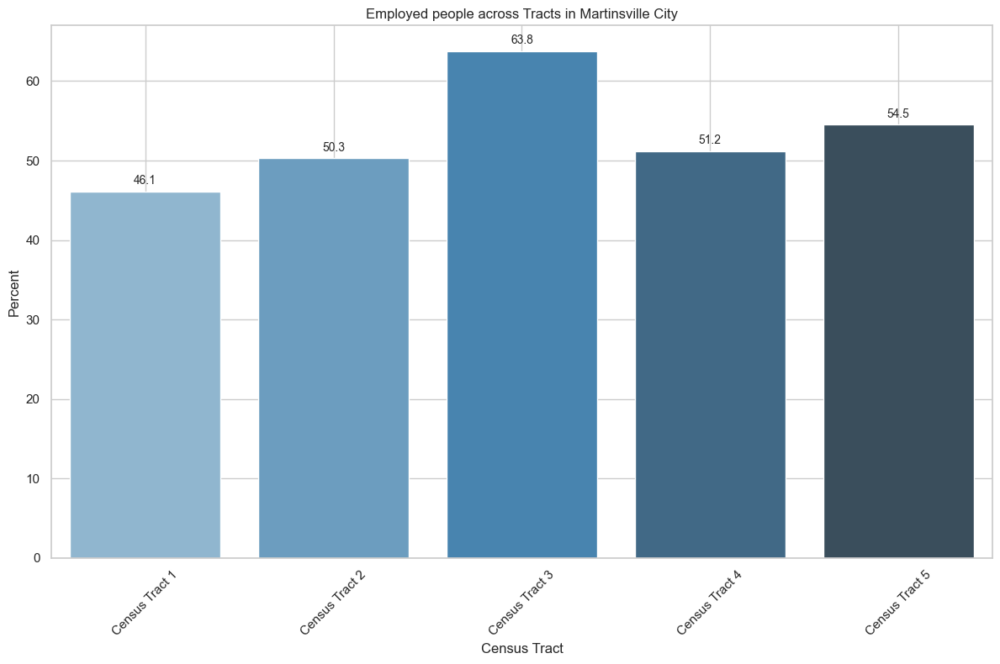

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os


# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'
file_names = [f'economy_{i}.csv' for i in range(1, 6)]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for i, file_name in enumerate(file_names, start=1):
    file_path = os.path.join(directory_path, file_name)
    data = clean_csv_data(file_path)

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'Employed'].iloc[0]

    # Extract the relevant 'Percent' column name based on the file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'Census Tract {i}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Employed people across Tracts in Martinsville City')
plt.xlabel('Census Tract')
plt.ylabel('Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph displaying employment rates across Martinsville City census tracts reveals a range of workforce engagement. Census Tract 3 stands out with the highest employment rate at 63.8%, suggesting a robust job market or a younger, more workforce-engaged population. Conversely, Census Tract 1 shows a lower rate at 46.1%, which may indicate economic challenges, a higher retirement population, or other factors limiting employment. Tracts 2, 4, and 5 exhibit moderate employment rates between 50.3% and 54.5%, reflecting varying levels of economic activity and employment opportunities within these areas. This distribution highlights the economic diversity within Martinsville City and may suggest targeted areas for economic development or workforce training programs.

<a name="3m"></a>
### **Employed People Across Census Tracts in Henry County**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1801830500.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


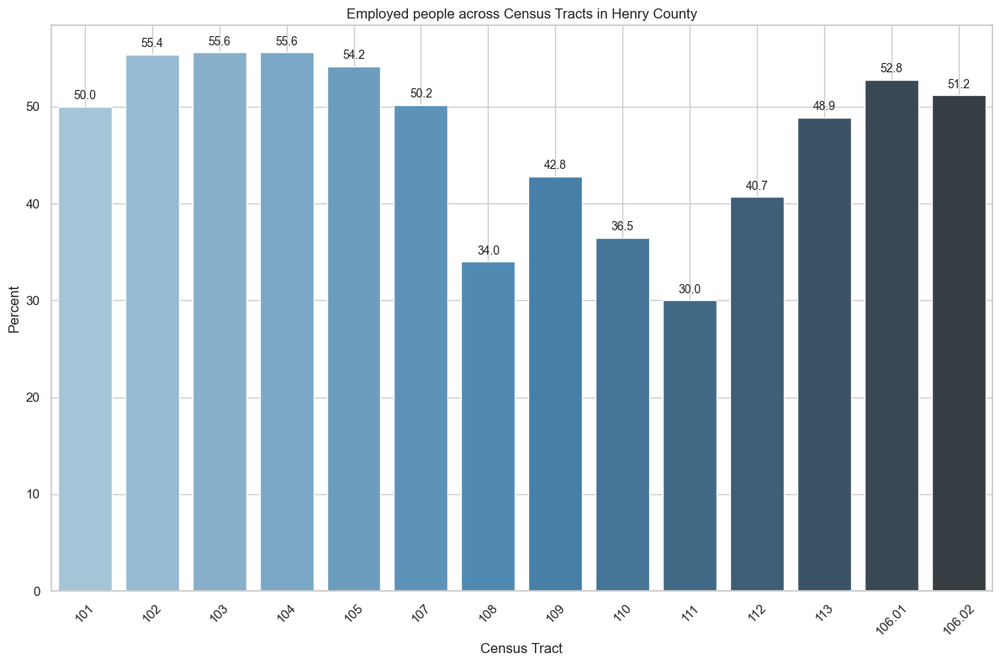

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the function to clean the CSV data
def clean_csv_data(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Remove percentage signs and convert columns to numeric where applicable
    data.replace('%', '', regex=True, inplace=True)
    percent_columns = [col for col in data.columns if 'Percent' in col]
    data[percent_columns] = data[percent_columns].apply(pd.to_numeric, errors='coerce')

    return data

# Directory where the files are stored
# Directory paths for the main and extra files
main_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'
extras_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'

# File names for main and extra files
main_file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]
extra_file_names = ['hc_ec_106.01.csv', 'hc_ec_106.02.csv']

# Generate full file paths
file_paths = [os.path.join(main_directory_path, file_name) for file_name in main_file_names]
file_paths += [os.path.join(extras_directory_path, file_name) for file_name in extra_file_names]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for file_path in file_paths:
    data = clean_csv_data(file_path)

    # Extract the tract number from the filename
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'Employed'].iloc[0]

    # Construct the 'Percent' column name correctly based on the file number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'{tract_number}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Employed people across Census Tracts in Henry County')
plt.xlabel('Census Tract')
plt.ylabel('Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The employment rates across different census tracts in Henry County show varying levels of workforce participation. Tracts 101, 102, and 103 maintain relatively high employment rates, all above 54%, suggesting stable employment conditions in these areas. In stark contrast, Tracts 110 and 111 have markedly lower employment rates at 30.0% and 36.5% respectively, indicating areas with potentially significant economic challenges or higher proportions of non-working populations such as retirees or students. The remaining tracts display employment rates ranging from 34.0% to 52.8%, highlighting a mixed economic landscape across the county. This distribution suggests that while some tracts may benefit from robust job markets or a workforce-engaged population, others may require targeted economic development initiatives to boost employment opportunities and economic participation

<a name="3n"></a>
### **Unemployed People Across Census Tracts in Martinsville City**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1790301401.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


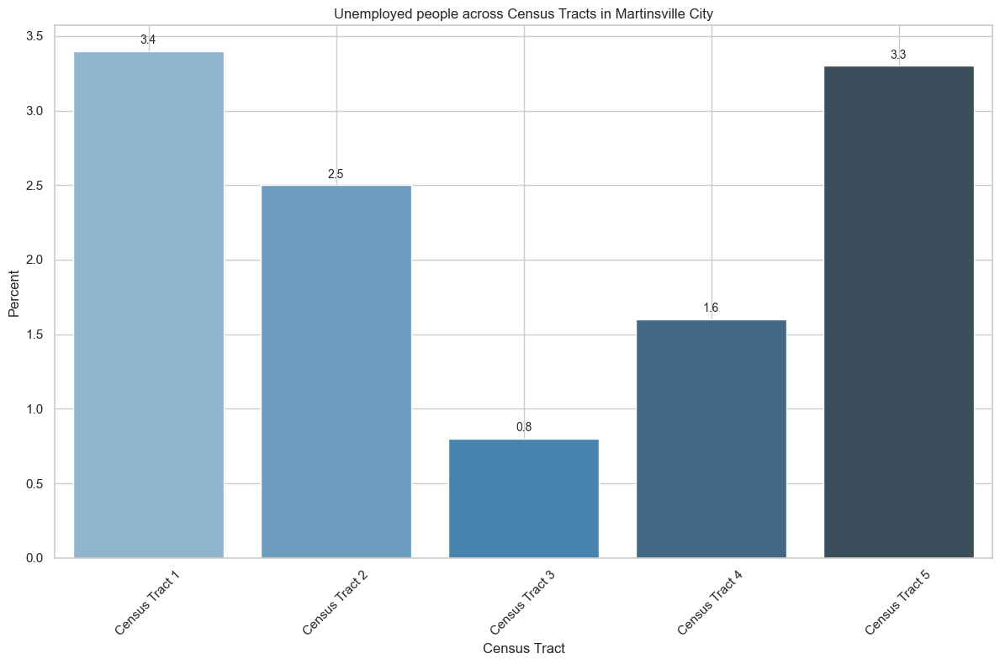

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os


# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'
file_names = [f'economy_{i}.csv' for i in range(1, 6)]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for i, file_name in enumerate(file_names, start=1):
    file_path = os.path.join(directory_path, file_name)
    data = clean_csv_data(file_path)

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'Unemployed'].iloc[0]

    # Extract the relevant 'Percent' column name based on the file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'Census Tract {i}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Unemployed people across Census Tracts in Martinsville City')
plt.xlabel('Census Tract')
plt.ylabel('Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph illustrates the unemployment rates across various census tracts in Martinsville City, highlighting notable differences within the city. Tract 1 and Tract 5 exhibit the highest unemployment rates at 3.4% and 3.3%, respectively, indicating areas where economic challenges may be more pronounced. Tract 3 shows a significantly lower unemployment rate at 0.8%, suggesting better employment conditions in this part of the city. Tract 2 and Tract 4 have moderate unemployment rates of 2.5% and 1.6%, respectively. This variance across tracts could reflect differences in industrial presence, availability of job opportunities, and demographic factors influencing workforce participation.

<a name="3o"></a>
### **Unemployed People Across Census Tracts in Henry County**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\448246579.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


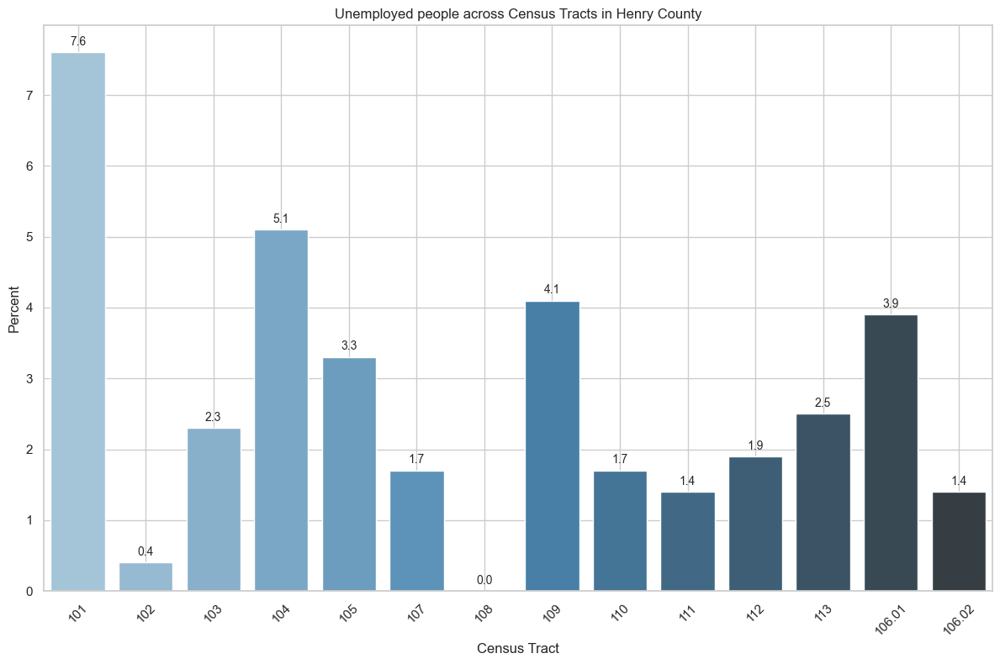

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the function to clean the CSV data
def clean_csv_data(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Remove percentage signs and convert columns to numeric where applicable
    data.replace('%', '', regex=True, inplace=True)
    percent_columns = [col for col in data.columns if 'Percent' in col]
    data[percent_columns] = data[percent_columns].apply(pd.to_numeric, errors='coerce')

    return data

# Directory paths for the main and extra files
main_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'
extras_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'

# File names for main and extra files
main_file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]
extra_file_names = ['hc_ec_106.01.csv', 'hc_ec_106.02.csv']

# Generate full file paths
file_paths = [os.path.join(main_directory_path, file_name) for file_name in main_file_names]
file_paths += [os.path.join(extras_directory_path, file_name) for file_name in extra_file_names]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for file_path in file_paths:
    data = clean_csv_data(file_path)

    # Extract the tract number from the filename
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'Unemployed'].iloc[0]

    # Construct the 'Percent' column name correctly based on the file number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'{tract_number}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Unemployed people across Census Tracts in Henry County')
plt.xlabel('Census Tract')
plt.ylabel('Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph depicts the unemployment rates across various census tracts in Henry County, revealing significant variability in unemployment within the region. The highest unemployment rate is observed in Tract 101 at 7.6%, indicating substantial economic challenges. In contrast, Tract 108 shows an exceptionally low rate at 0%, which might reflect a smaller population size or more robust employment opportunities. Other tracts like 102, 103, and 113 have relatively low unemployment rates ranging from 1.4% to 2.5%, suggesting better employment conditions. Conversely, Tracts 106-01 and 105 also report higher rates at 3.9% and 5.1% respectively, pointing to areas where economic interventions might be necessary to enhance job opportunities and reduce unemployment.

<a name="3p"></a>
### **Not in Labor Force Across Census Tracts in Martinsville City**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\110627089.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


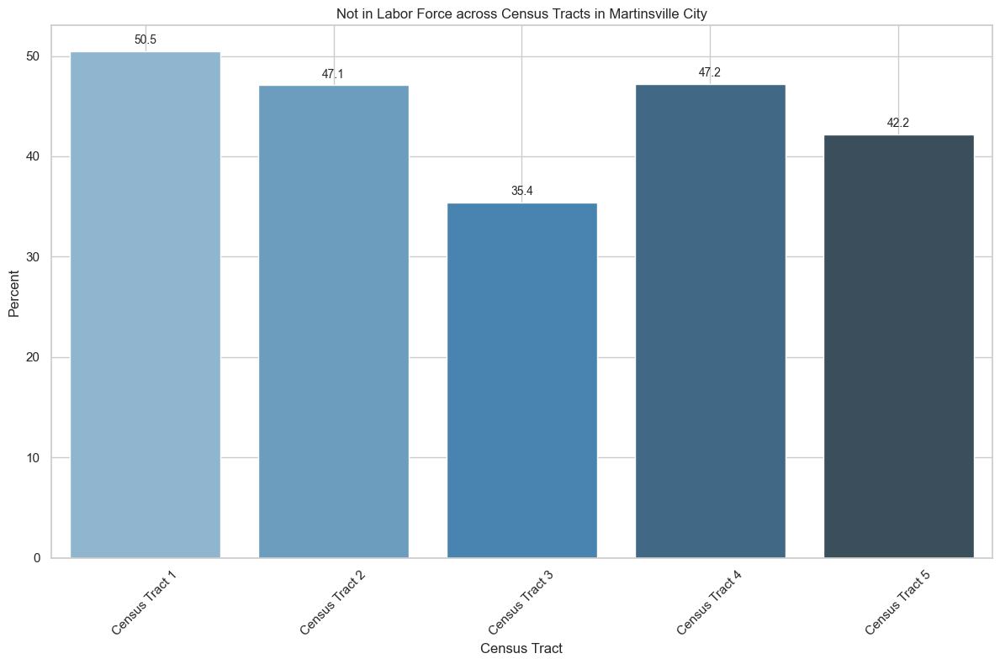

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os


# Directory where the files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\economy'
file_names = [f'economy_{i}.csv' for i in range(1, 6)]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for i, file_name in enumerate(file_names, start=1):
    file_path = os.path.join(directory_path, file_name)
    data = clean_csv_data(file_path)

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'Not in labor force'].iloc[0]

    # Extract the relevant 'Percent' column name based on the file number
    percent_column = f'Census Tract {i}; Martinsville city; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'Census Tract {i}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Not in Labor Force across Census Tracts in Martinsville City')
plt.xlabel('Census Tract')
plt.ylabel('Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph presents the percentage of individuals not in the labor force across different census tracts in Martinsville City. Census Tract 1 shows the highest percentage at 50.5%, indicating that half of the population is not engaged in employment or seeking work, potentially due to factors like retirement, disability, or other personal circumstances. Census Tract 3 has the lowest percentage at 35.4%, suggesting a relatively higher participation in the workforce. The percentages in other tracts range from 42.2% to 47.2%, highlighting moderate variation across the city. These figures could reflect differences in demographic composition, economic conditions, or availability of employment opportunities in each tract.

<a name="3q"></a>
### **Not in Labor Force Across Census Tracts in Henry County**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\3607991898.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')


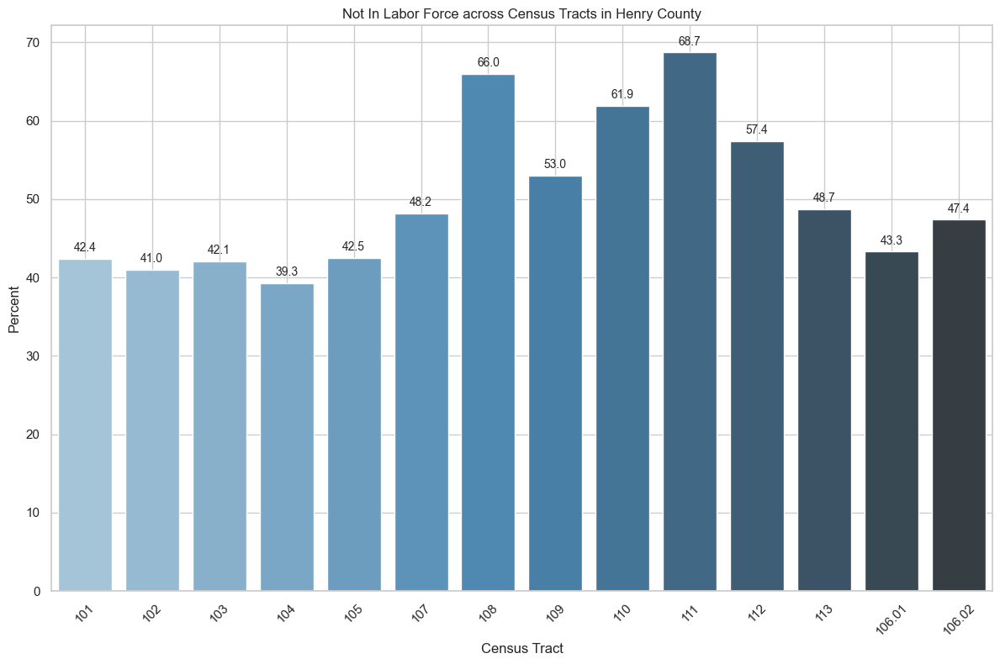

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the function to clean the CSV data
def clean_csv_data(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Clean column names and 'Label (Grouping)' from leading/trailing spaces
    data.columns = data.columns.str.strip()
    data['Label (Grouping)'] = data['Label (Grouping)'].str.strip()

    # Remove percentage signs and convert columns to numeric where applicable
    data.replace('%', '', regex=True, inplace=True)
    percent_columns = [col for col in data.columns if 'Percent' in col]
    data[percent_columns] = data[percent_columns].apply(pd.to_numeric, errors='coerce')

    return data

# Directory paths for the main and extra files
main_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\economy'
extras_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'

# File names for main and extra files
main_file_names = [f'hc_ec_{i}.csv' for i in range(101, 114) if i != 106]
extra_file_names = ['hc_ec_106.01.csv', 'hc_ec_106.02.csv']

# Generate full file paths
file_paths = [os.path.join(main_directory_path, file_name) for file_name in main_file_names]
file_paths += [os.path.join(extras_directory_path, file_name) for file_name in extra_file_names]

# Initialize a list to store data for plotting
plot_data = []

# Process each file
for file_path in file_paths:
    data = clean_csv_data(file_path)

    # Extract the tract number from the filename
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Find the first occurrence of 'In labor force'
    in_labor_force_row = data[data['Label (Grouping)'] == 'Not in labor force'].iloc[0]

    # Construct the 'Percent' column name correctly based on the file number
    percent_column = f'Census Tract {tract_number}; Henry County; Virginia!!Percent'

    # Append the data to the plot_data list
    plot_data.append({
        'Census Tract': f'{tract_number}',
        'In labor force Percent': in_labor_force_row[percent_column]
    })

# Convert the list to a DataFrame
plot_df = pd.DataFrame(plot_data)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Plotting
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Census Tract', y='In labor force Percent', data=plot_df, palette='Blues_d')

# Adding numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Not In Labor Force across Census Tracts in Henry County')
plt.xlabel('Census Tract')
plt.ylabel('Percent')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The graph indicates significant variability in the percentage of people not in the labor force across different census tracts in Henry County. Tracts 111 and 106-01 display the highest percentages, with 68.7% and 66.0% respectively, suggesting a notably high proportion of the population not engaged in employment activities, possibly due to factors like age, disability, or economic conditions. On the other hand, tracts 104, 102, and 103 have the lowest percentages, around 39.3% to 42.1%, indicating a relatively higher engagement in the labor force. These differences may point to demographic or economic disparities across the county, impacting workforce participation.

<a name="3r"></a>
### **Disability by Age Group in Martinsville City**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1230081299.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


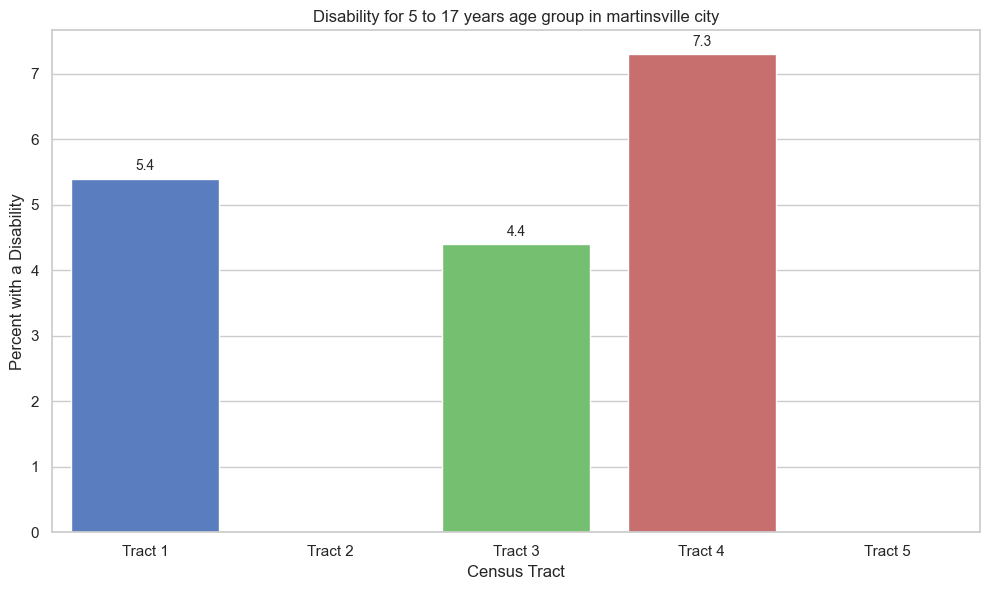

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1230081299.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


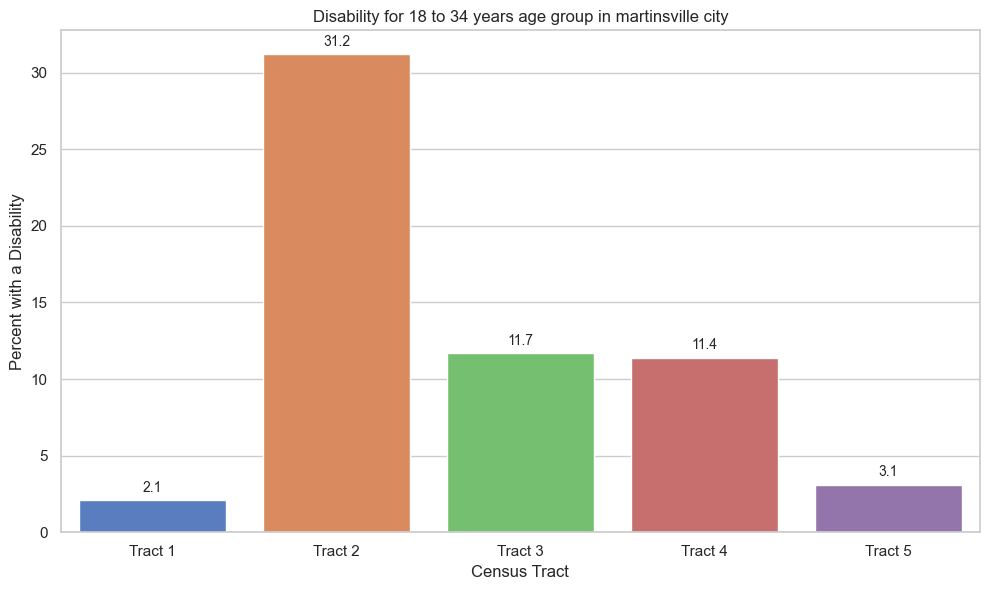

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1230081299.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


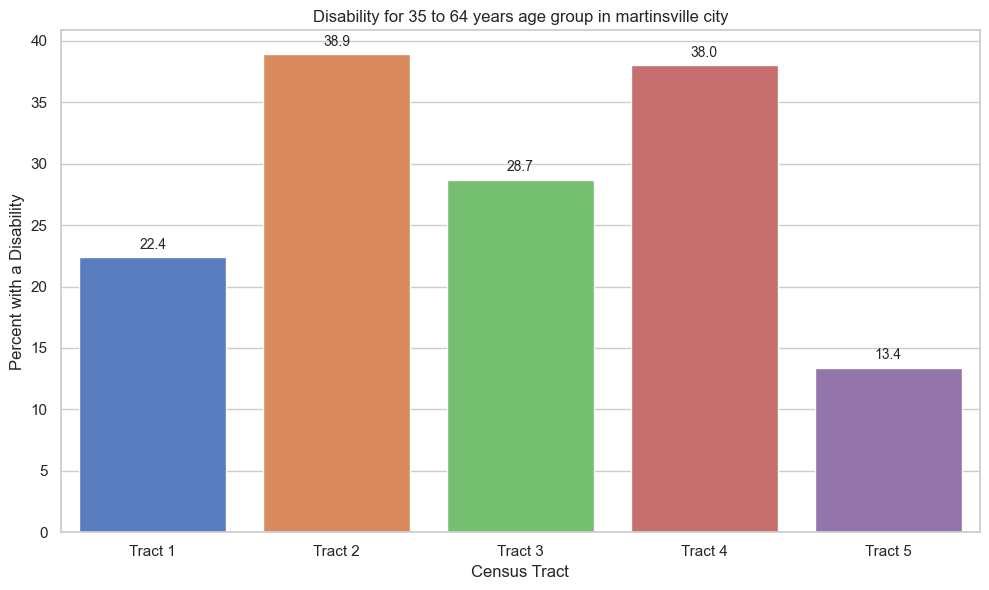

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1230081299.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


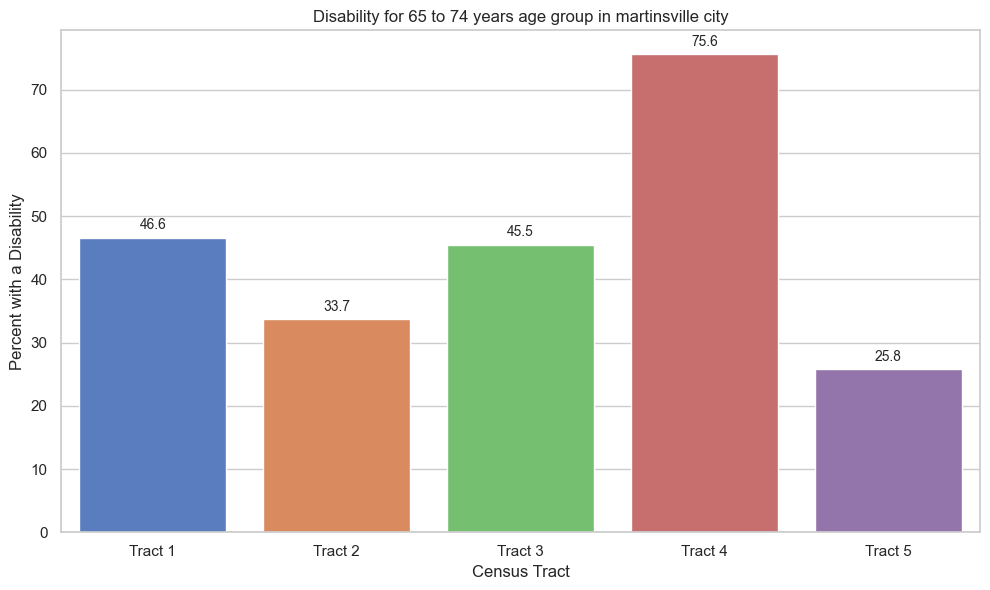

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1230081299.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


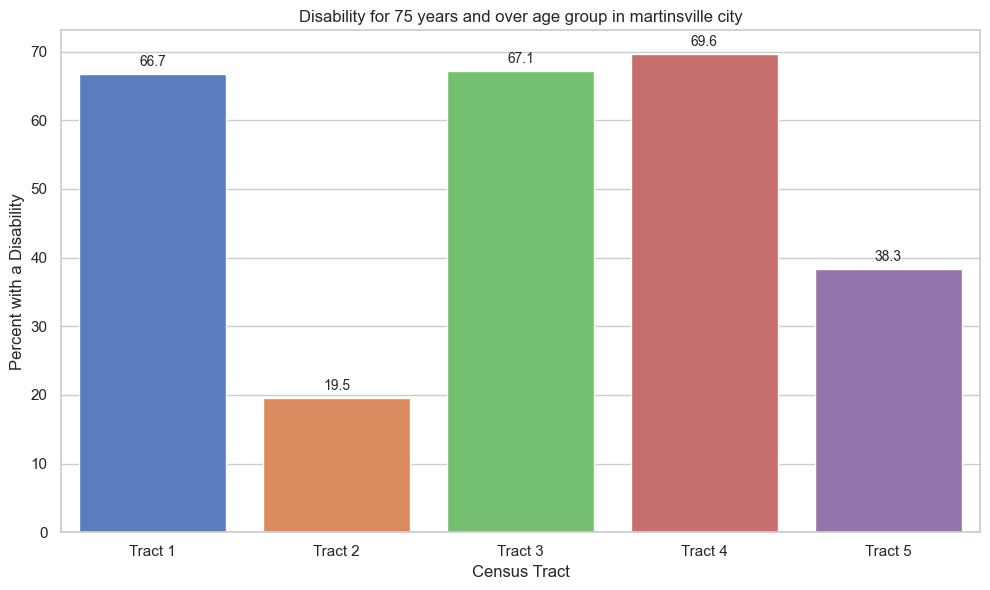

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Directory path where the CSV files are stored
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\martinsville\disability'

# File names
file_names = [f'disability_{i}.csv' for i in range(1, 6)]

# Define age groups
age_groups = [
    '5 to 17 years',
    '18 to 34 years',
    '35 to 64 years',
    '65 to 74 years',
    '75 years and over'
]

# Initialize an empty DataFrame to collect data
combined_data = pd.DataFrame()

# Process each file
for i, file_name in enumerate(file_names, start=1):
    # Load and clean the data
    file_path = f'{directory_path}/{file_name}'
    data = clean_csv_data(file_path)

    # Construct the column name for the disability estimate
    column_name = f'Census Tract {i}; Martinsville city; Virginia!!Percent with a disability!!Estimate'

    # Filter data for the defined age groups
    filtered_data = data[data['Label (Grouping)'].isin(age_groups)]

    # Select relevant columns and rename for consistency
    filtered_data = filtered_data[['Label (Grouping)', column_name]]
    filtered_data.columns = ['Age Group', 'Disability Percent']
    filtered_data['Census Tract'] = f'Tract {i}'

    # Append to the combined DataFrame
    combined_data = pd.concat([combined_data, filtered_data])

# Creating separate plots for each age group
for age_group in age_groups:
    # Filter data for the current age group
    age_group_data = combined_data[combined_data['Age Group'] == age_group]

    # Plotting the data for the current age group
    plt.figure(figsize=(10, 6))
    bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')
    plt.title(f'Disability for {age_group} age group in martinsville city')
    plt.xlabel('Census Tract')
    plt.ylabel('Percent with a Disability')

    # Adding numbers on top of the bars
    for p in bar_plot.patches:
        height = p.get_height()
        if height > 0:  # Only annotate if the height is greater than 0
            bar_plot.annotate(format(height, '.1f'),  # Format the number to one decimal place
                              (p.get_x() + p.get_width() / 2., height),  # Position for the text
                              ha='center', va='center',  # Center alignment
                              xytext=(0, 9),  # Vertical offset
                              textcoords='offset points')

    plt.tight_layout()  # Adjust layout
    plt.show()


The disability prevalence across different age groups in Martinsville City reveals varied levels of disability across five census tracts. For children aged 5 to 17 years, Tract 4 exhibits the highest disability rate at 7.3%, while Tract 2 has the lowest at 4.4%. In the 18 to 34 years age group, Tract 2 shows an exceptionally high disability rate of 31.2%, contrasting sharply with Tract 1's low of 2.1%. Adults aged 35 to 64 in Tract 4 also show a high prevalence of disability at 38%, compared to Tract 5’s much lower rate of 13.4%. Among seniors, those aged 65 to 74 years and 75 years and over in Tract 4 display the highest disability rates at 75.6% and 69.6% respectively, indicating a significant need for disability services in this tract. Conversely, Tract 2 shows considerably lower disability rates in the oldest age group, highlighting significant disparities within the city

<a name="3s"></a>
### **Disability by Age Group in Henry County**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1596767241.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


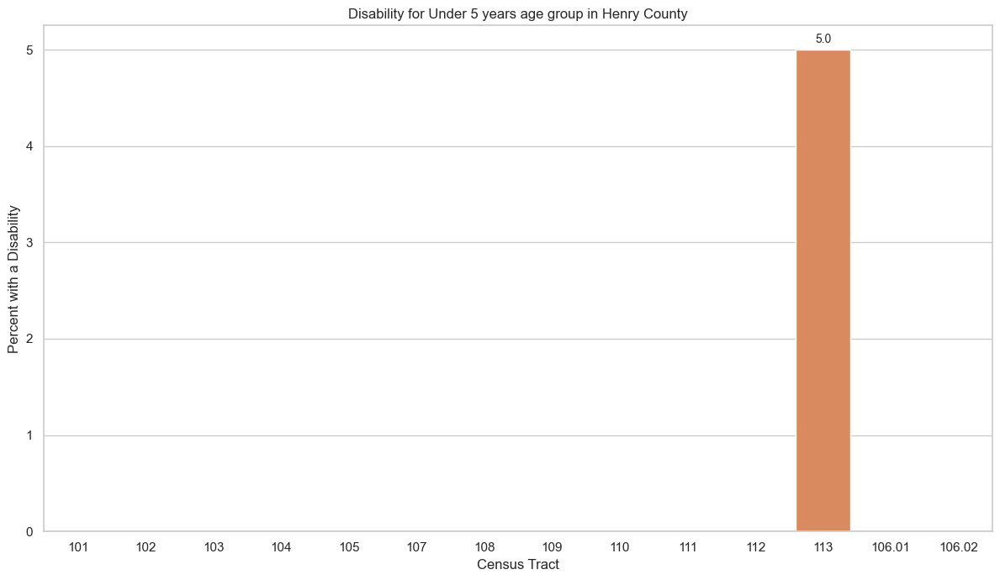

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1596767241.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


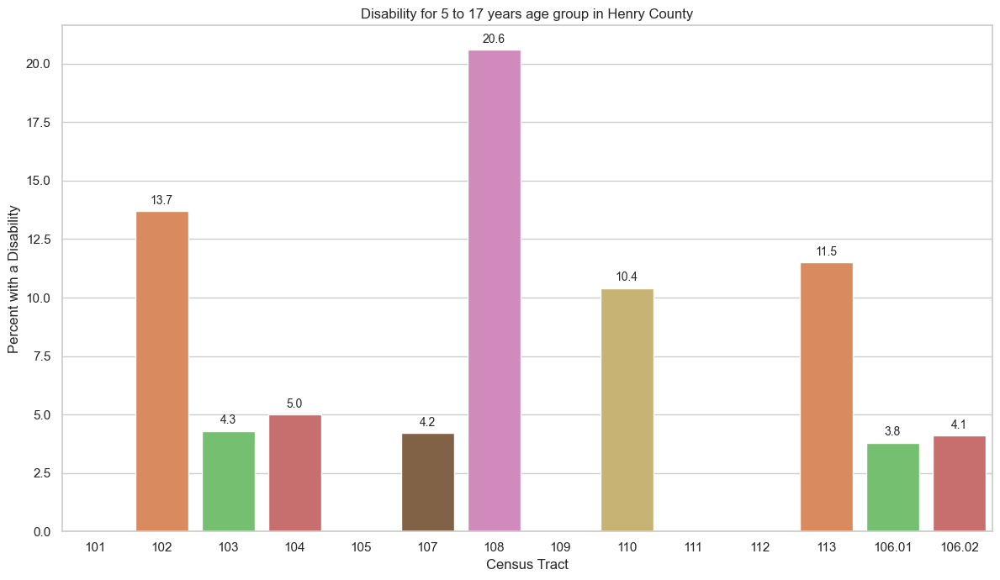

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1596767241.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


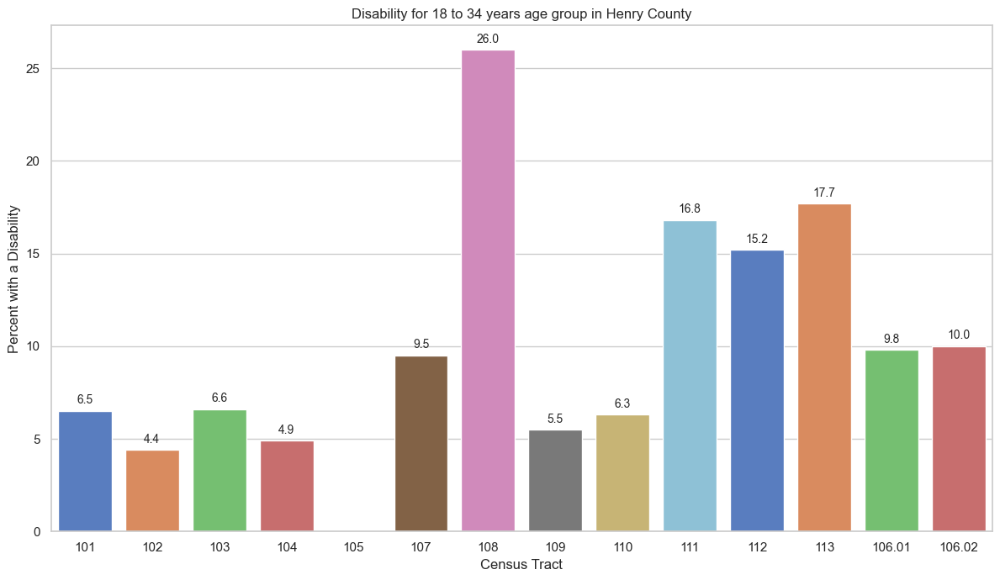

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1596767241.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


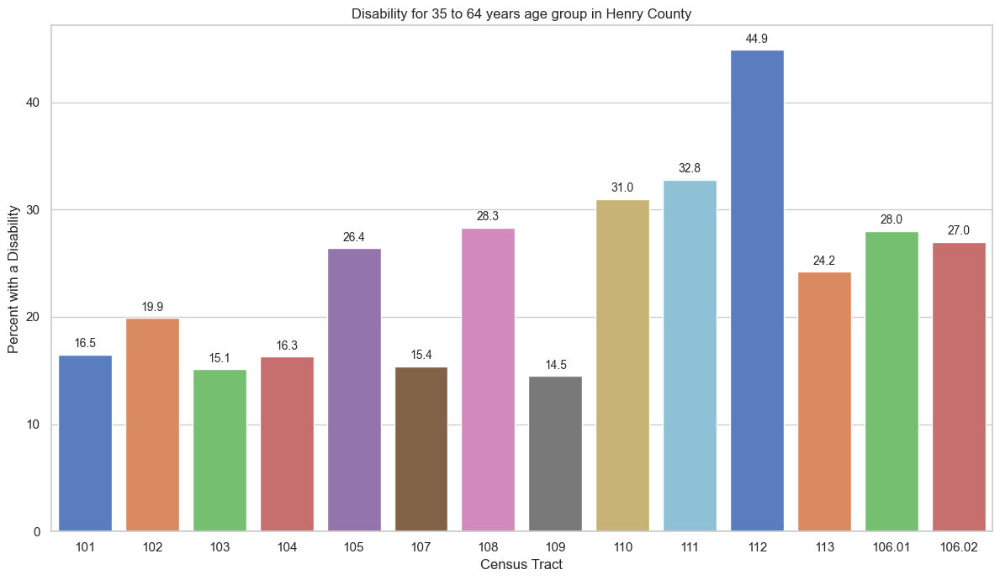

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1596767241.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


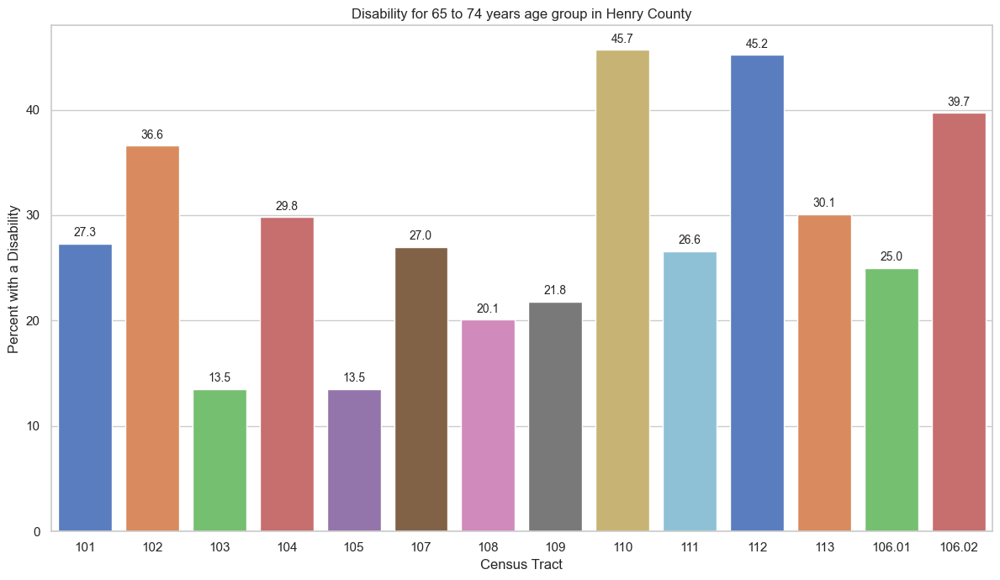

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1596767241.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')


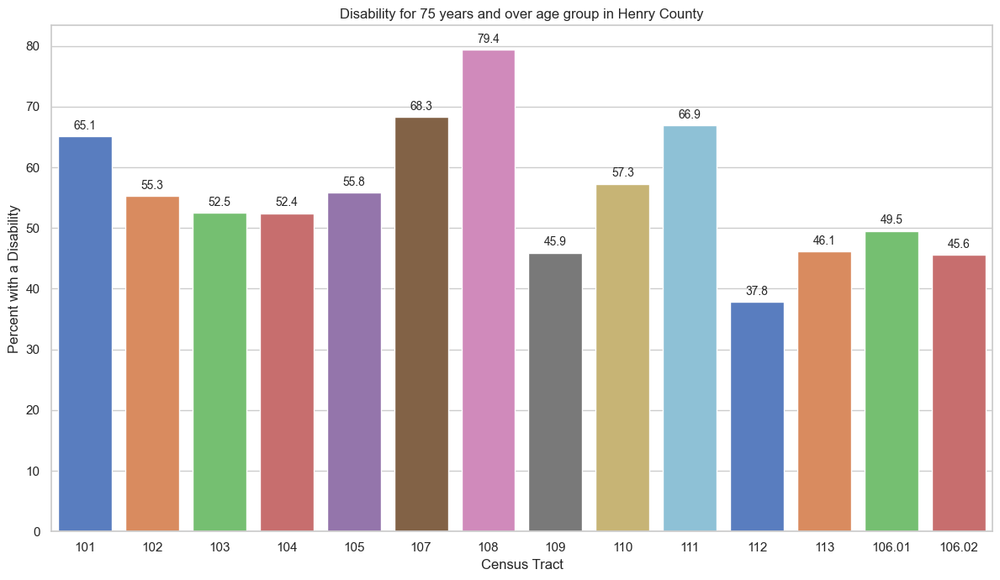

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Directory paths for the main and extra files
main_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\disability'
extras_directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\henry\extras'

# File names for main and extra files
main_file_names = [f'hc_dis_{i}.csv' for i in range(101, 114) if i != 106]
extra_file_names = ['hc_dis_106.01.csv', 'hc_dis_106.02.csv']

# Generate full file paths
file_paths = [os.path.join(main_directory_path, file_name) for file_name in main_file_names]
file_paths += [os.path.join(extras_directory_path, file_name) for file_name in extra_file_names]

# Initialize a list to store data for plotting
plot_data = []

    # Extract the tract number from the filename
tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

# Define age groups
age_groups = [
    'Under 5 years',
    '5 to 17 years',
    '18 to 34 years',
    '35 to 64 years',
    '65 to 74 years',
    '75 years and over'
]

# Initialize an empty DataFrame to collect data
combined_data = pd.DataFrame()

# Process each file
for file_path in file_paths:
    # Load and clean the data
    data = clean_csv_data(file_path)

    # Extract the tract number or name from the file name, ensuring decimals are handled
    tract_number = os.path.basename(file_path).split('_')[-1].replace('.csv', '')

    # Construct the column name for the disability estimate, accounting for possible decimals
    column_name = f'Census Tract {tract_number}; Henry County; Virginia!!Percent with a disability!!Estimate'

    # Verify column exists in data to prevent KeyError
    if column_name not in data.columns:
        print(f"Column {column_name} not found in {file_path}. Available columns: {data.columns}")
        continue

    # Filter data for the defined age groups
    filtered_data = data[data['Label (Grouping)'].isin(age_groups)]

    # Select relevant columns and rename for consistency
    filtered_data = filtered_data[['Label (Grouping)', column_name]]
    filtered_data.columns = ['Age Group', 'Disability Percent']
    filtered_data['Census Tract'] = f'{tract_number}'

    # Append to the combined DataFrame
    combined_data = pd.concat([combined_data, filtered_data], ignore_index=True)

# Creating separate plots for each age group
for age_group in age_groups:
    # Filter data for the current age group
    age_group_data = combined_data[combined_data['Age Group'] == age_group]

    # Plotting the data for the current age group
    plt.figure(figsize=(12, 7))
    bar_plot = sns.barplot(x='Census Tract', y='Disability Percent', data=age_group_data, palette='muted')
    plt.title(f'Disability for {age_group} age group in Henry County')
    plt.xlabel('Census Tract')
    plt.ylabel('Percent with a Disability')

    # Adding numbers on top of the bars
    for p in bar_plot.patches:
        height = p.get_height()
        if height > 0:  # Only annotate if the height is greater than 0
            bar_plot.annotate(format(height, '.1f'),  # Format the number to one decimal place
                              (p.get_x() + p.get_width() / 2., height),  # Position for the text
                              ha='center', va='center',  # Center alignment
                              xytext=(0, 9),
                              textcoords='offset points')

    plt.tight_layout()
    plt.show()

<a name="3t"></a>
### **Comparison of Health Risk Behaviors by Location**

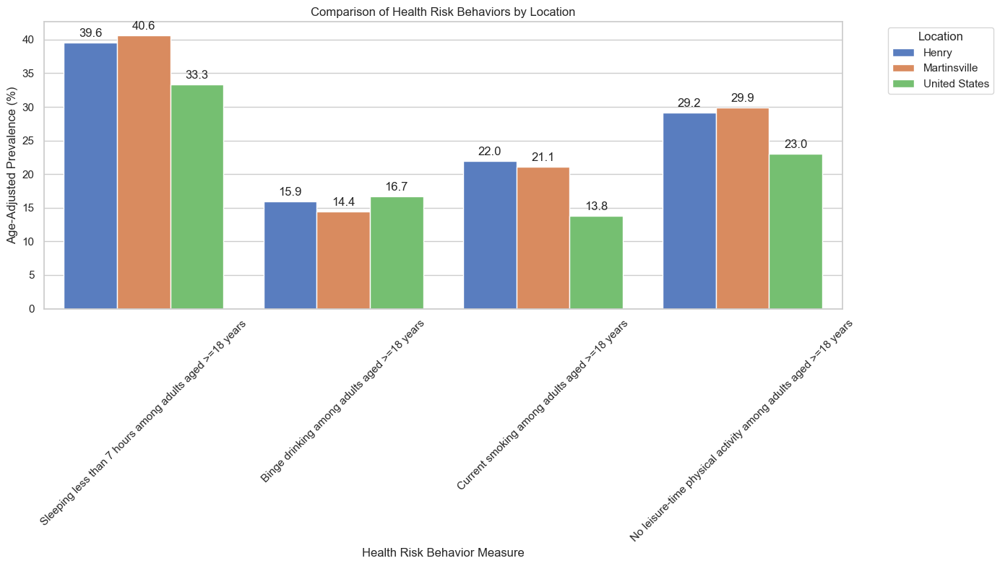

In [ ]:
directory_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\heath_outcome.csv'
data = pd.read_csv(directory_path)


# Filter for Age-adjusted prevalence and Health Risk Behaviors
filtered_data = data[(data['Data Type'] == 'Age-adjusted prevalence') & (data['Category'] == 'Health Risk Behaviors')]

# Make sure the locations include Henry, Martinsville, and United States
locations = ['Henry', 'Martinsville', 'United States']
filtered_data = filtered_data[filtered_data['Location'].isin(locations)]

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(14, 8))
bar_plot = sns.barplot(x='Measure', y='Data Value', hue='Location', data=filtered_data, palette='muted')

# Add titles and labels
plt.title('Comparison of Health Risk Behaviors by Location')
plt.xlabel('Health Risk Behavior Measure')
plt.ylabel('Age-Adjusted Prevalence (%)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Adding numbers on top of the bars
for p in bar_plot.patches:
    height = p.get_height()
    if height > 0:  # Only annotate if the height is greater than 0
        bar_plot.annotate(format(height, '.1f'),  # Format the number to one decimal place
                          (p.get_x() + p.get_width() / 2., height),  # Position for the text
                          ha='center', va='center',  # Center alignment
                          xytext=(0, 9),  # Vertical offset
                          textcoords='offset points')

# Adjust legend
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


The graph illustrates the prevalence of various health risk behaviors among adults aged 18 years and older in Henry County, Martinsville, and across the United States:

- **Sleeping Less Than 7 Hours**:
  - **Henry**: 39.6%
  - **Martinsville**: 40.6%
  - **United States**: 33.3%
  - **Observation**: Both Henry and Martinsville have a higher prevalence of insufficient sleep compared to the national average.

- **Binge Drinking**:
  - **Henry**: 15.9%
  - **Martinsville**: 14.4%
  - **United States**: 16.7%
  - **Observation**: Binge drinking rates in Martinsville are lower than both Henry and the national average.

- **Current Smoking**:
  - **Henry**: 22.0%
  - **Martinsville**: 21.1%
  - **United States**: 13.8%
  - **Observation**: Smoking rates are significantly higher in Henry and Martinsville compared to the national average.

- **No Leisure-Time Physical Activity**:
  - **Henry**: 29.2%
  - **Martinsville**: 29.9%
  - **United States**: 23.0%
  - **Observation**: Lack of physical activity is more prevalent in Henry and Martinsville than across the United States.

### Conclusion
Henry and Martinsville exhibit higher percentages in all measured risk behaviors compared to national figures, indicating a need for targeted health interventions in these areas.


#### **4. Trend Analysis over the years for martinsville city and henry county**

<a name="abuse-and-neglect"></a>
### **Abuse and Neglect**

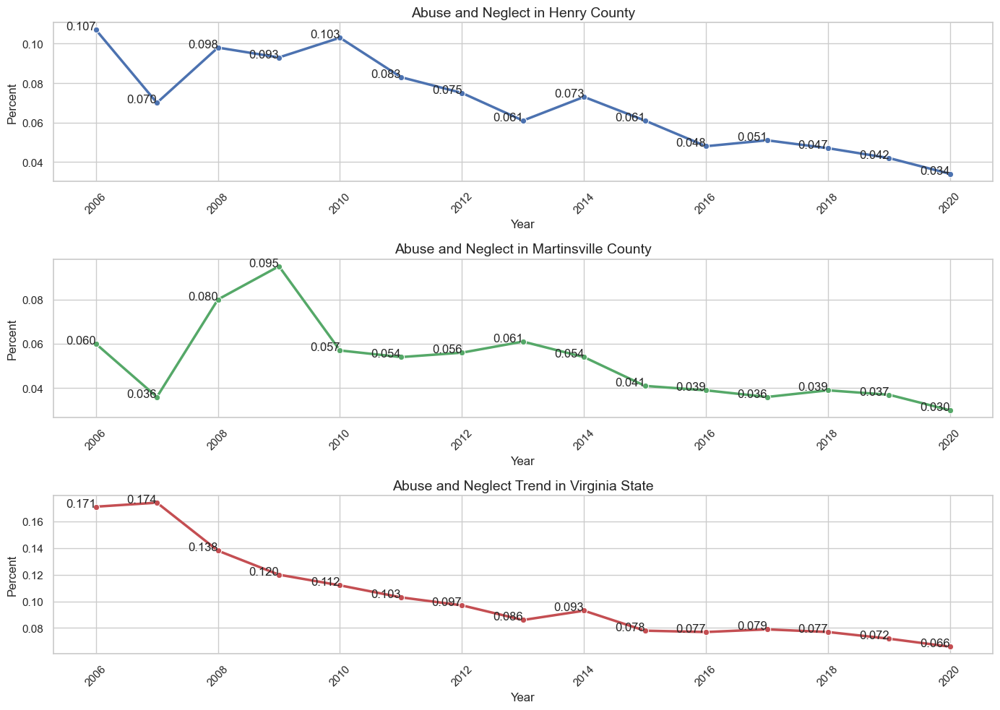

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\abuse_neglect.csv"
data = pd.read_csv(file_path)

# Filter data for plotting
data_county_henry = data[(data['LocationType'] == 'County') & (data['Location'] == 'Henry') & (data['DataFormat'] == 'Percent')]
data_county_martinsville = data[(data['LocationType'] == 'County') & (data['Location'] == 'Martinsville') & (data['DataFormat'] == 'Percent')]
data_state_virginia = data[(data['LocationType'] == 'State') & (data['Location'] == 'Virginia') & (data['DataFormat'] == 'Percent')]

# Plotting
plt.figure(figsize=(14, 10))

# Henry County
plt.subplot(3, 1, 1)
sns.lineplot(data=data_county_henry, x='TimeFrame', y='Data', marker='o', color='b', linewidth=2.5)
plt.title('Abuse and Neglect in Henry County', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percent', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
for i in range(len(data_county_henry)):
    plt.text(data_county_henry['TimeFrame'].iloc[i], data_county_henry['Data'].iloc[i],
             f"{data_county_henry['Data'].iloc[i]:.3f}", horizontalalignment='right')

# Martinsville County
plt.subplot(3, 1, 2)
sns.lineplot(data=data_county_martinsville, x='TimeFrame', y='Data', marker='o', color='g', linewidth=2.5)
plt.title('Abuse and Neglect in Martinsville County', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percent', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
for i in range(len(data_county_martinsville)):
    plt.text(data_county_martinsville['TimeFrame'].iloc[i], data_county_martinsville['Data'].iloc[i],
             f"{data_county_martinsville['Data'].iloc[i]:.3f}", horizontalalignment='right')

# State of Virginia
plt.subplot(3, 1, 3)
sns.lineplot(data=data_state_virginia, x='TimeFrame', y='Data', marker='o', color='r', linewidth=2.5)
plt.title('Abuse and Neglect Trend in Virginia State', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percent', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
for i in range(len(data_state_virginia)):
    plt.text(data_state_virginia['TimeFrame'].iloc[i], data_state_virginia['Data'].iloc[i],
             f"{data_state_virginia['Data'].iloc[i]:.3f}", horizontalalignment='right')

plt.tight_layout()
plt.show()


### Henry County
- **Overall Trend**: Decrease from 10.7% to 8.34%.
- **Notable**: Consistent downward trend throughout the period.

### Martinsville County
- **Overall Trend**: Significant decrease after a peak in 2008.
- **Notable**: Peak at 9.5% in 2008, dropped to 3.0% by 2020.

### Virginia State
- **Overall Trend**: Steady decline from 17.1% to 6.66%.
- **Notable**: Persistent downward trend across the years.

### Conclusion
- All regions show a decreasing trend in abuse and neglect rates from 2006 to 2020, with notable variability in Martinsville County.


<a name="child-care-assistance-participation"></a>
### **Child Care Assistance Participation**

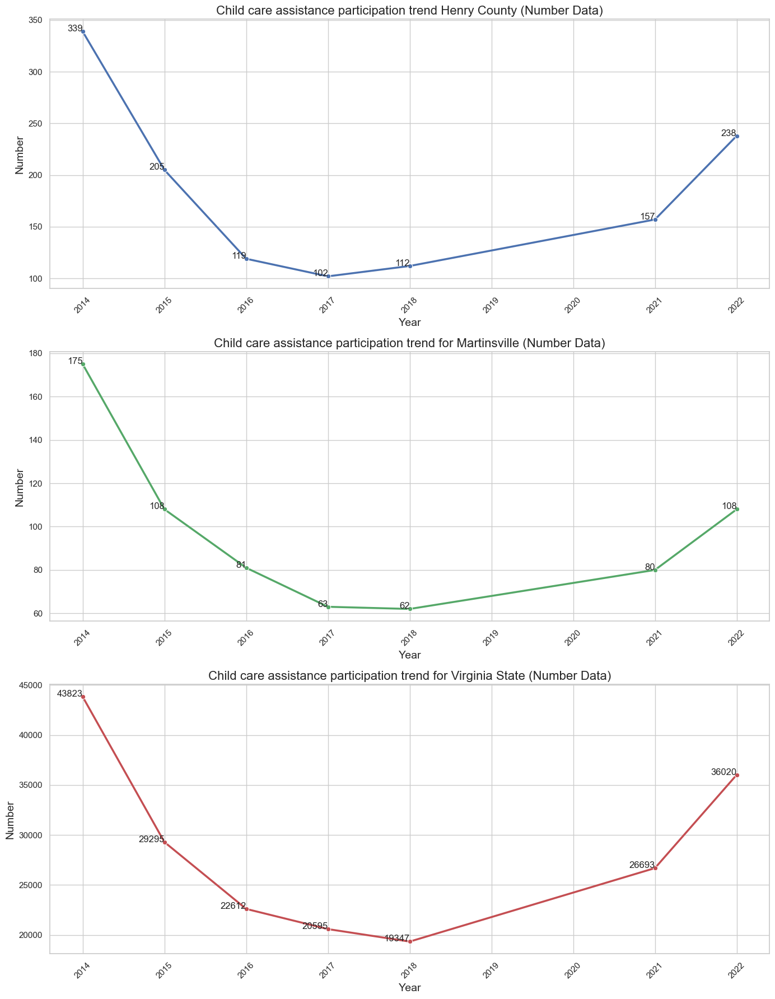

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\child_care_assistance_participation.csv"
data = pd.read_csv(file_path)

# Filter data for plotting
data_henry = data[(data['LocationType'] == 'County') & (data['Location'] == 'Henry') & (data['DataFormat'] == 'Number')]
data_martinsville = data[(data['LocationType'] == 'County') & (data['Location'] == 'Martinsville') & (data['DataFormat'] == 'Number')]
data_virginia = data[(data['LocationType'] == 'State') & (data['Location'] == 'Virginia') & (data['DataFormat'] == 'Number')]

# Set the style for the plots
sns.set(style="whitegrid")

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(14, 18))

# Henry County
sns.lineplot(data=data_henry, x='TimeFrame', y='Data', marker='o', color='b', linewidth=2.5, ax=axs[0])
axs[0].set_title('Child care assistance participation trend Henry County (Number Data)', fontsize=16)
axs[0].set_xlabel('Year', fontsize=14)
axs[0].set_ylabel('Number', fontsize=14)
axs[0].grid(True)
axs[0].tick_params(axis='x', rotation=45)
for i in range(len(data_henry)):
    axs[0].text(data_henry['TimeFrame'].iloc[i], data_henry['Data'].iloc[i],
                f"{data_henry['Data'].iloc[i]}", horizontalalignment='right', fontsize=12)

# Martinsville
sns.lineplot(data=data_martinsville, x='TimeFrame', y='Data', marker='o', color='g', linewidth=2.5, ax=axs[1])
axs[1].set_title('Child care assistance participation trend for Martinsville (Number Data)', fontsize=16)
axs[1].set_xlabel('Year', fontsize=14)
axs[1].set_ylabel('Number', fontsize=14)
axs[1].grid(True)
axs[1].tick_params(axis='x', rotation=45)
for i in range(len(data_martinsville)):
    axs[1].text(data_martinsville['TimeFrame'].iloc[i], data_martinsville['Data'].iloc[i],
                f"{data_martinsville['Data'].iloc[i]}", horizontalalignment='right', fontsize=12)

# State of Virginia
sns.lineplot(data=data_virginia, x='TimeFrame', y='Data', marker='o', color='r', linewidth=2.5, ax=axs[2])
axs[2].set_title('Child care assistance participation trend for Virginia State (Number Data)', fontsize=16)
axs[2].set_xlabel('Year', fontsize=14)
axs[2].set_ylabel('Number', fontsize=14)
axs[2].grid(True)
axs[2].tick_params(axis='x', rotation=45)
for i in range(len(data_virginia)):
    axs[2].text(data_virginia['TimeFrame'].iloc[i], data_virginia['Data'].iloc[i],
                f"{data_virginia['Data'].iloc[i]}", horizontalalignment='right', fontsize=12)

plt.tight_layout()
plt.show()


Henry County
Overall Trend: Initial sharp decline followed by a gradual recovery.
2014 to 2018: Numbers dropped significantly from 339 to 112.
2019 to 2022: Recovery trend, rising from 157 to 238.

Martinsville
Overall Trend: Sharp decline followed by stabilization and gradual increase.
2014 to 2017: Steep drop from 175 to 62.
2018 to 2022: Numbers stabilized and then increased slightly, reaching 108 by 2022.

Virginia State
Overall Trend: Sharp initial drop, then a more gradual decline, followed by a recovery.
2014 to 2018: Numbers fell from 43,282 to 20,945.
2019 to 2022: Gradual increase from 26,393 to 36,202.

Conclusion
All three regions experienced significant declines in child care assistance participation starting in 2014, with varying degrees of recovery starting around 2018 or 2019. The initial drops could be indicative of policy changes or funding cuts, while the recovery suggests subsequent improvements or adjustments in these areas.

<a name="overdose-indicator"></a>
### **Overdose Indicator**

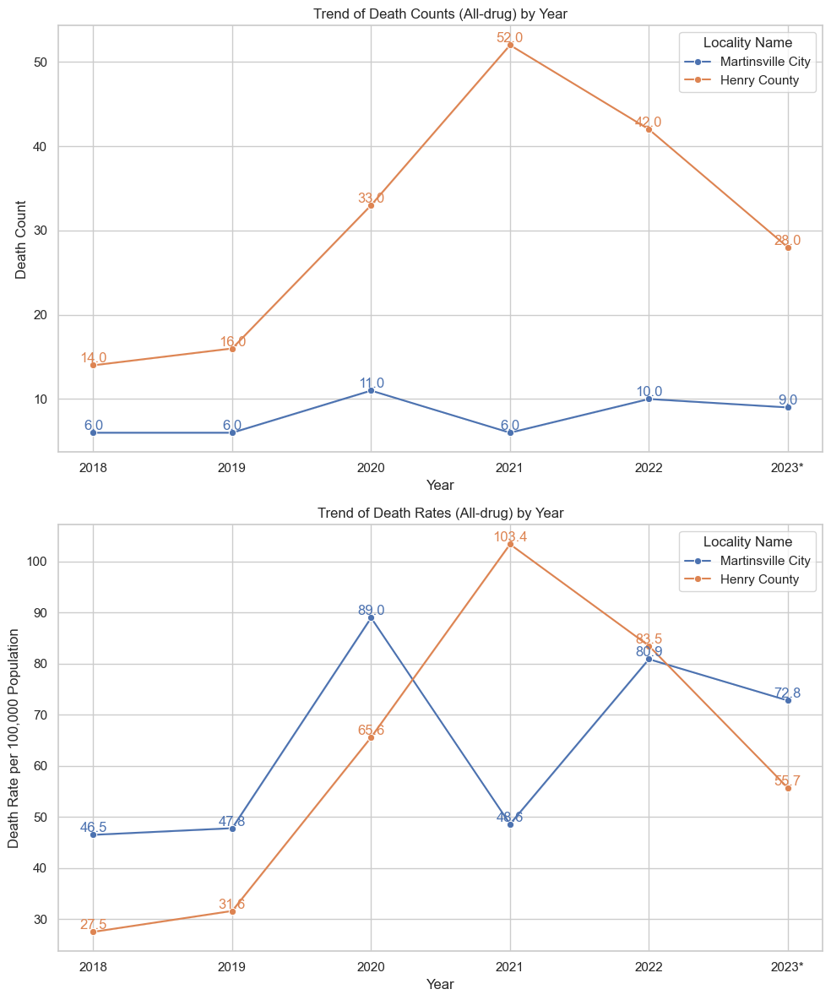

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from a CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\assesment\overdose_indicator.csv'
data = pd.read_csv(file_path)

# Filter data for the specific localities
data_filtered = data[data['Locality Name'].isin(['Martinsville City', 'Henry County'])]

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create a figure to hold the plots
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Function to add labels to the points on the plot
def add_labels(ax):
    lines = ax.get_lines()
    for line in lines:
        for x_data, y_data in zip(line.get_xdata(), line.get_ydata()):
            ax.text(x_data, y_data, f'{y_data:.1f}', color=line.get_color(), verticalalignment='bottom', horizontalalignment='center')

# Plot for Death Count
sns.lineplot(data=data_filtered, x='Death Year', y='Death Count', hue='Locality Name', marker='o', ax=axs[0])
axs[0].set_title('Trend of Death Counts (All-drug) by Year')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Death Count')
add_labels(axs[0])

# Plot for Death Rate
sns.lineplot(data=data_filtered, x='Death Year', y='Death Rate', hue='Locality Name', marker='o', ax=axs[1])
axs[1].set_title('Trend of Death Rates (All-drug) by Year')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Death Rate per 100,000 Population')
add_labels(axs[1])

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


Here are the key findings from the graph:

Death Counts:

Martinsville City shows relatively stable death counts from 2018 to 2023, with a peak in 2020 (11 deaths).
Henry County experienced a significant rise in death counts, peaking in 2021 (52 deaths) and then decreasing in subsequent years.
Death Rates:

Martinsville City had the highest death rate in 2020 (89.0 per 100,000 population) and a notable drop in 2021 (48.6 per 100,000 population).
Henry County's death rate peaked in 2021 (103.4 per 100,000 population) and saw a decline in the following years, reaching 56.7 in 2023.
Overall Trends:

Both localities show a peak in deaths and death rates around 2020-2021, followed by a decline.
Martinsville City shows more stability, while Henry County exhibits significant fluctuations over the years.

<a name="snap-participation-by-children"></a>
### **SNAP Participation by Children**

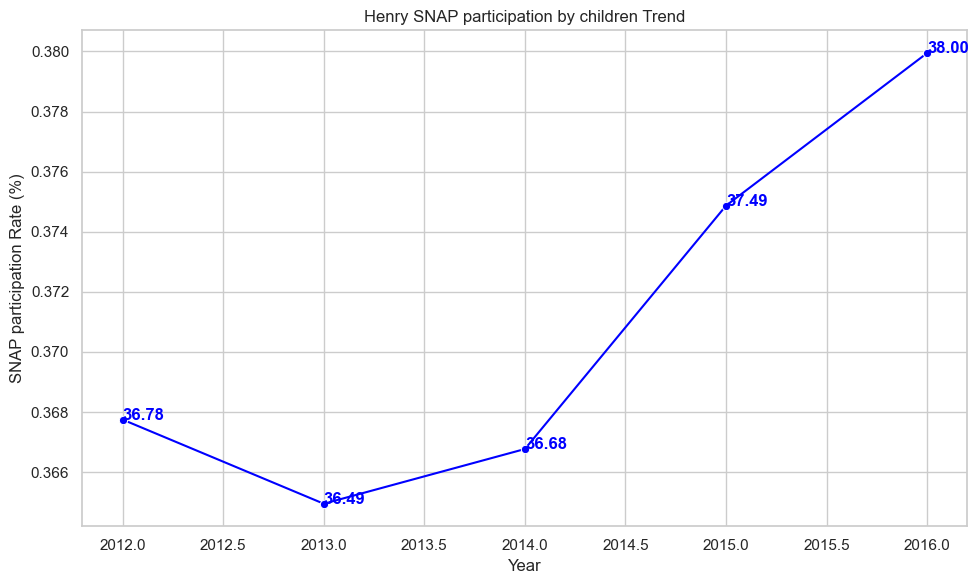

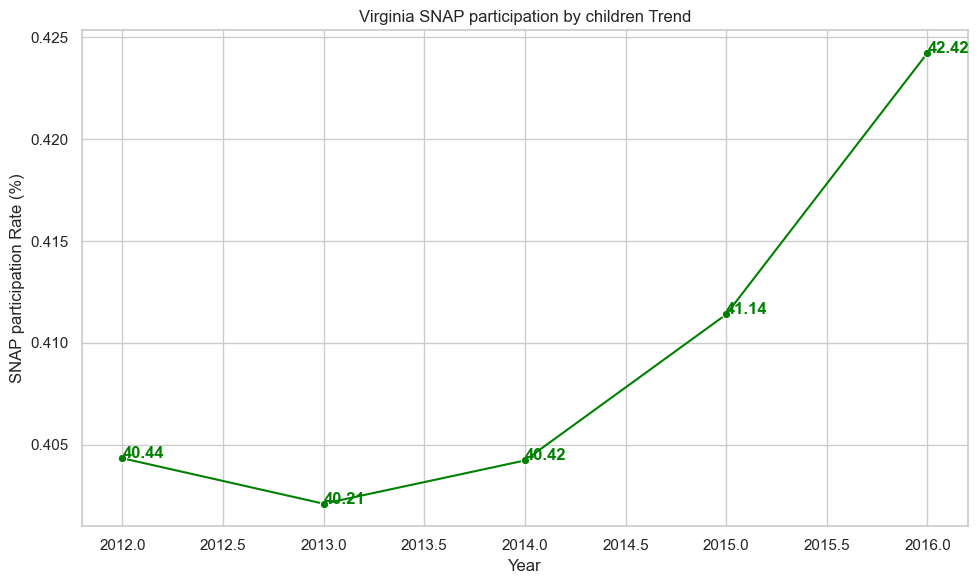

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\SNAP_participation_by_children.csv'

data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Drop rows where 'Data' is NaN (this will remove non-numeric entries)
data.dropna(subset=['Data'], inplace=True)

# Ensure 'TimeFrame' is treated as an integer
data['TimeFrame'] = data['TimeFrame'].astype(int)

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations to plot with colors
locations = {'Henry': 'blue', 'Virginia': 'green'}

# Function to plot trend chart for a specific location
def plot_trend(location, color):
    location_data = percent_data[percent_data['Location'] == location]

    plt.figure(figsize=(10, 6))
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, marker='o', color=color)

    for i in range(location_data.shape[0]):
        plt.text(location_data['TimeFrame'].iloc[i], location_data['Data'].iloc[i], f"{location_data['Data'].iloc[i]*100:.2f}",
                 horizontalalignment='left', size='medium', color=color, weight='semibold')

    plt.title(f'{location} SNAP participation by children Trend')
    plt.xlabel('Year')
    plt.ylabel('SNAP participation Rate (%)')
    plt.grid(True)
    plt.show()

# Plot trend charts for each location
for location, color in locations.items():
    if location in percent_data['Location'].values:
        plot_trend(location, color)
    else:
        print(f"Location '{location}' not found in the data.")


Henry:

There was a noticeable dip in SNAP participation by children around 2013-2014, reaching a low of 36.49%.
Post-2014, the rate steadily increased, peaking at 38.00% in 2016.
This suggests a recovery and increasing reliance on SNAP benefits over the period.

Virginia:

The SNAP participation rate for children in Virginia shows a stable trend around 40.44% in 2012, dipping slightly to around 40.21% mid-way through 2013.
From 2014 onwards, there was a sharp increase, with participation reaching 42.42% by 2016.
This trend indicates a growing dependency on SNAP benefits across the state.
These trends underline a significant reliance on public assistance programs like SNAP, especially in the later years of the study period, reflecting perhaps broader socio-economic challenges.

<a name="teen-birth-rate-per-1000-by-age-group"></a>
### **Teen Birth Rate per 1,000 by Age Group**

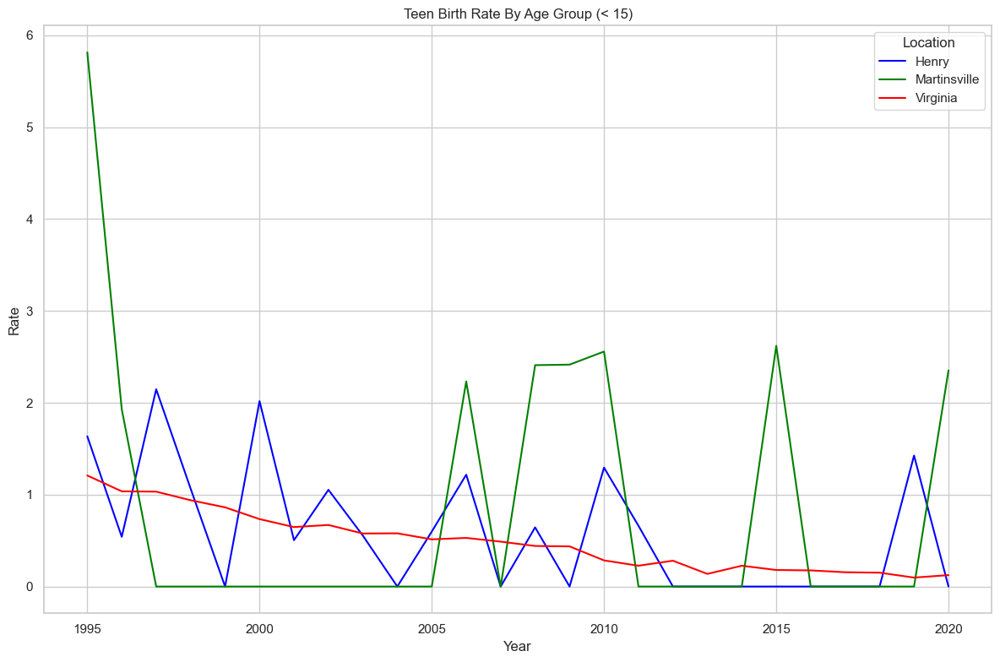

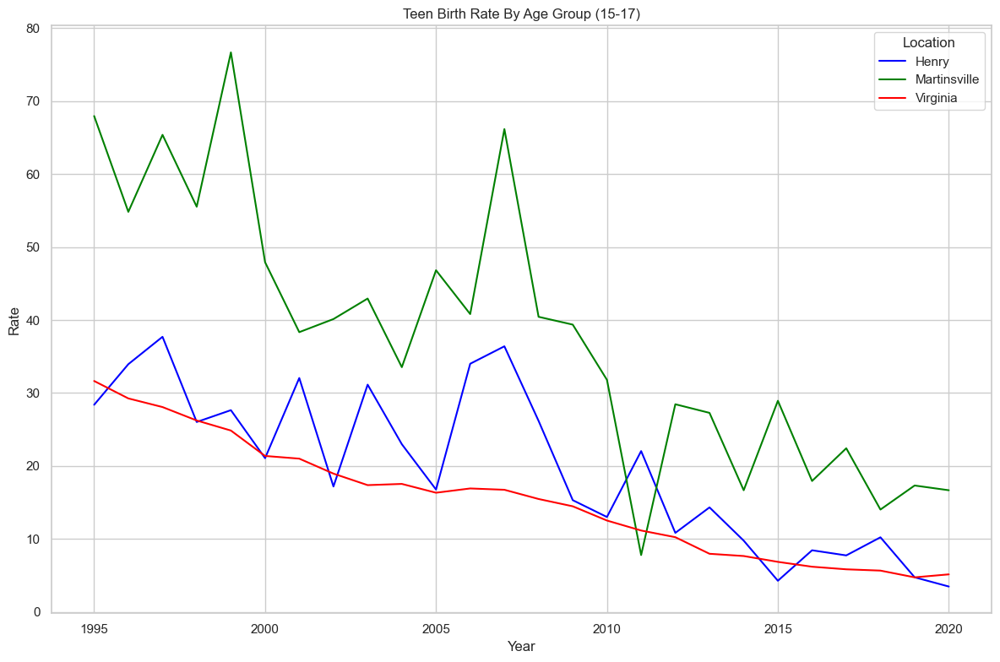

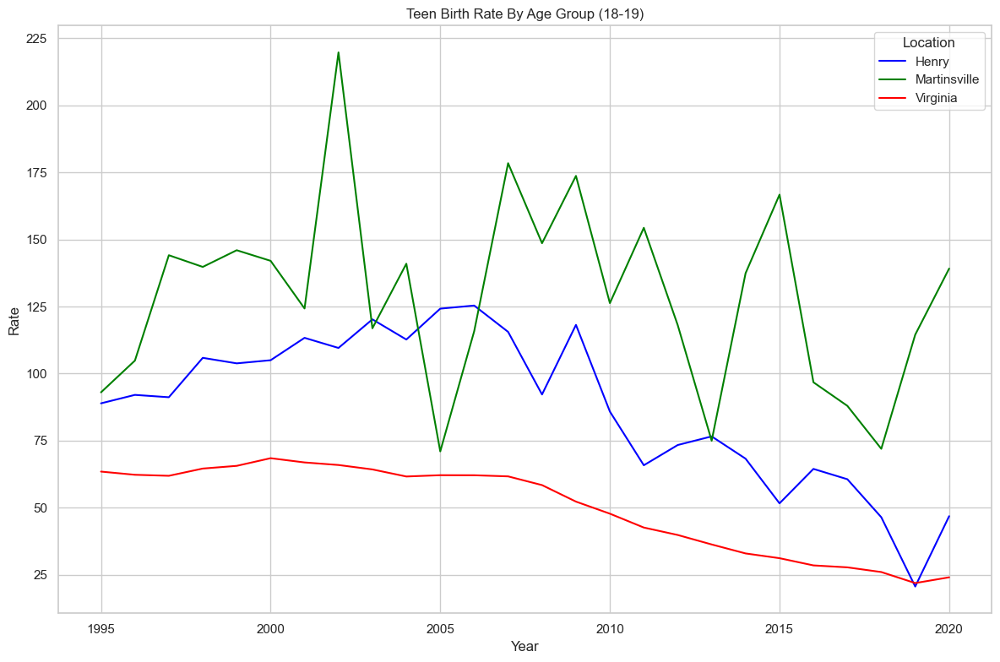

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\teen_birth_rate_per_1000_by_age_group.csv'  # Replace with the actual path to your CSV file
data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# List of locations and age groups
locations = ['Henry', 'Martinsville', 'Virginia']
age_groups = ['< 15', '15-17', '18-19']

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Function to plot trend chart for a specific age group across locations
def plot_trend_for_age_group(age_group):
    plt.figure(figsize=(12, 8))

    for location in locations:
        location_data = data[(data['Location'] == location) & (data['Age group'] == age_group)]
        if not location_data.empty:
            sns.lineplot(x='TimeFrame', y='Data', data=location_data, label=location, color=location_colors[location])

    plt.title(f'Teen Birth Rate By Age Group ({age_group})')
    plt.xlabel('Year')
    plt.ylabel('Rate')
    plt.legend(title='Location')
    plt.grid(True)
    plt.show()

# Plot trend charts for each age group across locations
for age_group in age_groups:
    plot_trend_for_age_group(age_group)


Teen Birth Rate by Age Group (<15, 15-17, 18-19) Analysis:
Under 15 Age Group: Extremely low birth rates, with occasional spikes. Over time, Martinsville has experienced the most volatility, albeit within very low absolute numbers.

15-17 Age Group: Declining trend across all locations with occasional spikes. Virginia shows the most consistent and steep decline, reflecting perhaps more effective youth education and birth control programs.

18-19 Age Group: Significantly higher rates compared to younger groups but on a downward trend across the board. Martinsville and Henry show more fluctuation, while Virginia demonstrates a steady decline, stabilizing at lower rates towards recent years.

These trends suggest a general improvement in teen pregnancy management and prevention across the studied locations, particularly in later teen years. However, localized spikes highlight the need for targeted interventions in specific years or locations to sustain and enhance these positive outcomes.

<a name="total-child-population"></a>
### **Total Child Population**

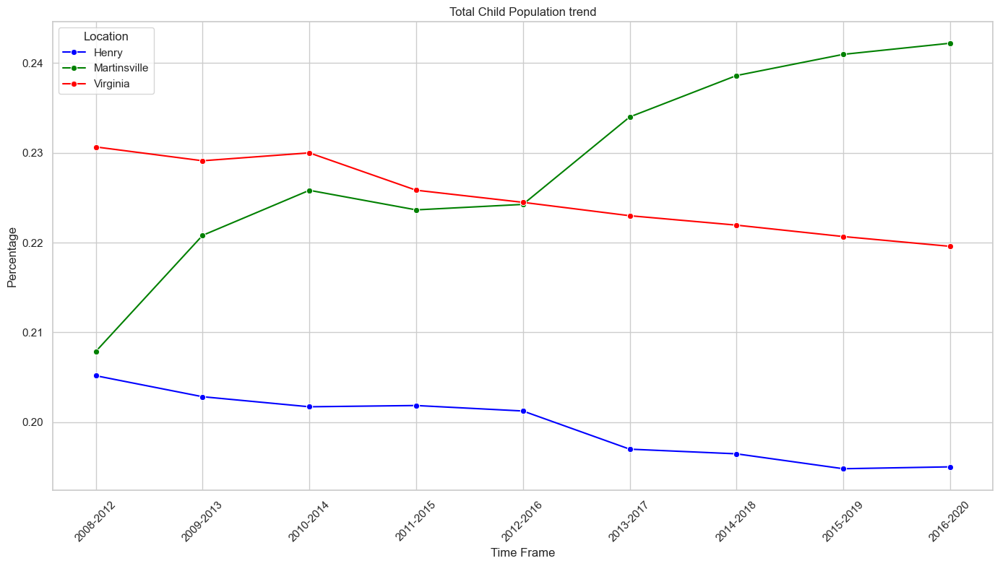

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\total_child_population.csv'
data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations
locations = percent_data['Location'].unique()

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Initialize the plot
plt.figure(figsize=(14, 8))
for location in locations:
    location_data = percent_data[percent_data['Location'] == location]
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, marker='o', color=location_colors.get(location, 'black'), label=location)

plt.title('Total Child Population trend')
plt.xlabel('Time Frame')
plt.ylabel('Percentage')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Location')
plt.grid(True)
plt.tight_layout()
plt.show()


- **Henry:** Exhibited a consistent decline in the child population percentage over the period, starting from around 0.22% in 2008 and decreasing steadily to below 0.20% by 2020.
  
- **Martinsville:** Displayed a significant decrease in the child population percentage, starting slightly higher than Virginia in 2008, crossing below Virginia's trend around 2014, and stabilizing around 0.20% by 2020.

- **Virginia:** Showed an increasing trend in the child population percentage, rising from below 0.23% in 2008 to above 0.24% by 2020.

### Interpretation
- **Henry** and **Martinsville** are experiencing a decline or stabilization in the percentage of their child populations, potentially indicating lower birth rates or migration of families with children out of these areas.
- **Virginia,** on the other hand, shows a growth in the child population percentage, possibly due to higher birth rates or an influx of families moving into the state.

These trends may have significant implications for planning educational resources and community services tailored to the needs of a younger population.


<a name="unemployment"></a>
### **Unemployment**

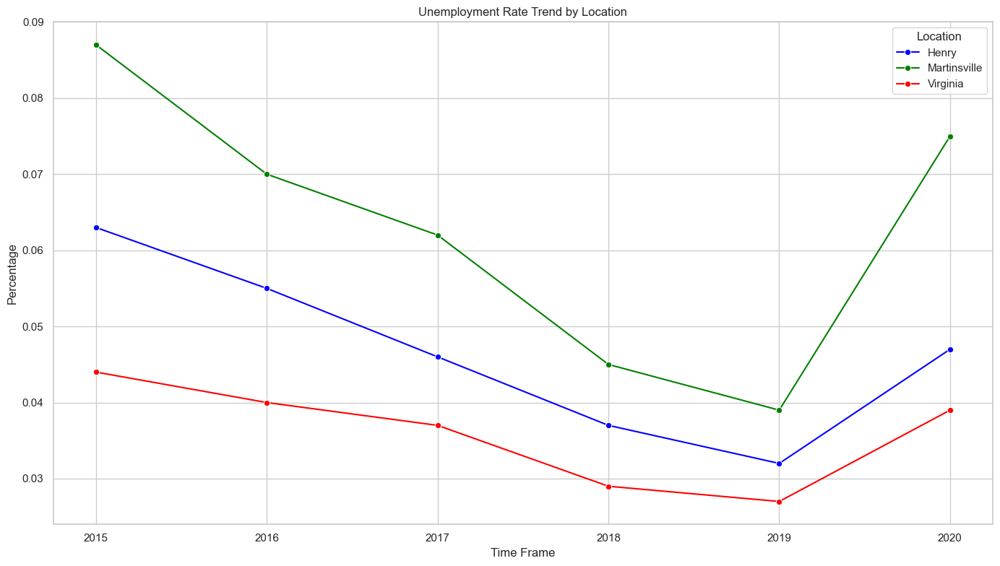

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\unemployment.csv'
data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations
locations = percent_data['Location'].unique()

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Initialize the plot
plt.figure(figsize=(14, 8))

# Plotting function for a specific location
for location in locations:
    location_data = percent_data[percent_data['Location'] == location]
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, marker='o', color=location_colors.get(location, 'black'), label=location)

plt.title('Unemployment Rate Trend by Location')
plt.xlabel('Time Frame')
plt.ylabel('Percentage')
plt.legend(title='Location')
plt.grid(True)
plt.show()


The graph shows unemployment rate trends from 2015 to 2020 in Henry, Martinsville, and Virginia:

General Decline (2015-2018): All locations experienced a steady decline in unemployment rates from 2015 to 2018, indicating economic improvement or successful employment policies during this period.

Sudden Increase (2019-2020): A sharp increase in unemployment rates is observed in 2020, especially in Martinsville and Henry, likely due to economic disruptions such as those caused by the COVID-19 pandemic.

Location Comparison: Throughout the period, Martinsville consistently had higher unemployment rates compared to Henry and Virginia, suggesting greater economic challenges or fewer job opportunities in Martinsville.

This concise trend analysis highlights both the resilience and the challenges faced by these areas in maintaining employment stability over time.

<a name="residents-living-in-poverty"></a>
### **Residents Living in Poverty**

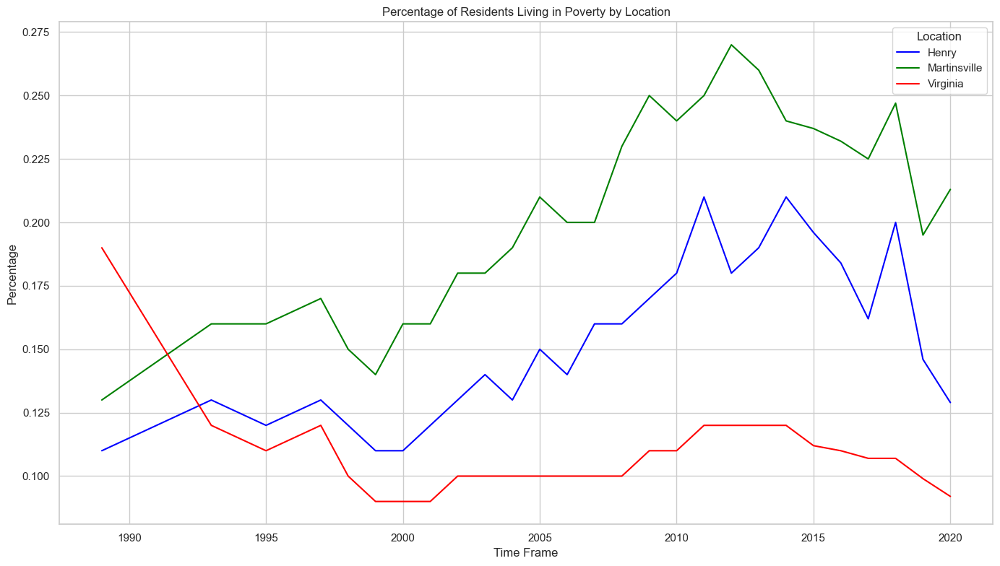

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\residents_living_in_poverty.csv'
data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations
locations = percent_data['Location'].unique()

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Initialize the plot
plt.figure(figsize=(14, 8))

# Plotting function for all locations
for location in locations:
    location_data = percent_data[percent_data['Location'] == location]
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, color=location_colors.get(location, 'black'), label=location)

plt.title('Percentage of Residents Living in Poverty by Location')
plt.xlabel('Time Frame')
plt.ylabel('Percentage')
plt.legend(title='Location')
plt.grid(True)
plt.show()


The graph illustrates the percentage of residents living in poverty by location over time, specifically focusing on Henry, Martinsville, and the state of Virginia as a whole, from 1990 to 2020. Here are the key findings from the graph:

Trends in Virginia:

Virginia shows a consistent and gradual decline in poverty rates over the three decades, starting from nearly 17.5% in 1990 to around 10% in 2020. This trend indicates effective statewide policies and economic growth benefiting a broader population over time.
Trends in Henry:

Henry’s poverty rate has shown significant volatility. Starting from the mid-1990s, the rates decrease, then increase dramatically in the early 2000s, peaking around 2010 before a sharp decline. The overall trend from 1990 to 2020 is a decrease from approximately 15% to just below 12.5%, indicating some progress but with substantial fluctuations suggesting variable economic conditions or effectiveness of local policies.
Trends in Martinsville:

Martinsville exhibits the highest and most volatile poverty rates among the three. Starting just below 20% in 1990, it sees a sharp increase to nearly 27.5% by the mid-2000s. Although there is a significant drop around 2010, it rises again, maintaining higher poverty rates compared to Henry and Virginia. This suggests persistent economic challenges in Martinsville.
Comparative Analysis:

Throughout the period, Martinsville consistently records higher poverty rates than Henry and Virginia, indicating localized economic challenges or insufficient effectiveness of poverty alleviation strategies.
The sharper fluctuations in Martinsville and Henry compared to the state suggest more significant impacts from economic downturns or local policy changes in these areas.
Implications for Policy:

The data underscores the need for targeted economic and social policies in Martinsville and Henry to address persistent and high poverty rates.
Stability in state-level rates suggests that Virginia’s broader policies may be cushioning economic volatility, but localized strategies may need adjustment or enhancement to specifically cater to the unique challenges in Martinsville and Henry.
This analysis provides crucial insights for policymakers, indicating areas for targeted interventions and potential recalibration of economic development and social welfare policies to address localized disparities within the state.

<a name="rate-of-children-entering-foster-care-per-1000-children"></a>
### **Rate of Children Entering Foster Care per 1,000 Children**

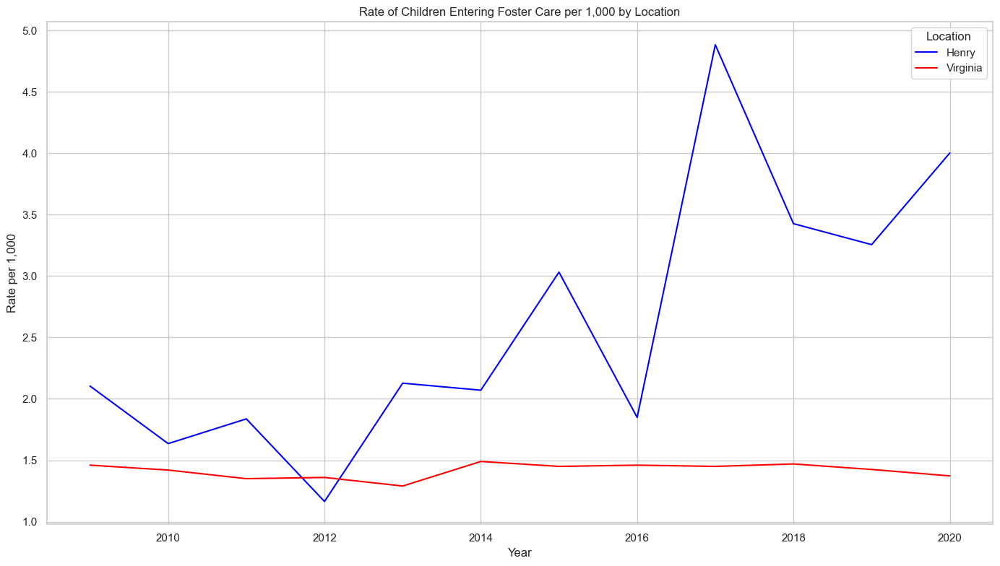

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\rate_of_children_entering_foster_care.csv'
data = pd.read_csv(file_path)

# Remove 'SFY' and spaces from 'TimeFrame' column and convert to integer
data['TimeFrame'] = data['TimeFrame'].str.replace('SFY ', '').astype(int)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for 'Rate per 1,000' only
rate_data = data[data['DataFormat'] == 'Rate per 1,000']

# Filter locations specifically for 'Henry' and 'Virginia'
locations = ['Henry', 'Virginia']  # Explicitly define locations to avoid unwanted data

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Virginia': 'red'
}

# Initialize the plot for combined visualization
plt.figure(figsize=(14, 8))

# Plotting function for all specified locations
for location in locations:
    location_data = rate_data[rate_data['Location'] == location]
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, color=location_colors.get(location, 'black'), label=location)

plt.title('Rate of Children Entering Foster Care per 1,000 by Location')
plt.xlabel('Year')
plt.ylabel('Rate per 1,000')
plt.legend(title='Location')
plt.grid(True)
plt.show()


The graph represents the rate of children entering foster care per 1,000 by location, comparing trends in Henry (blue line) and Virginia (red line) from 2010 to 2020. Here are the key findings:

Consistency in Statewide Rates:

Virginia exhibits a relatively flat and low rate, hovering around 1.5 to 1.75 children per 1,000 throughout the decade. This consistency suggests a stable system or effective interventions at the state level that either prevent the need for foster care or manage cases without recourse to foster placement.
Volatility in Local Rates:

In contrast, Henry shows significant volatility in the rate of children entering foster care. Starting around 2.5 children per 1,000 in 2010, it dips to near state levels by 2012, increases slightly, and then exhibits a sharp peak around 2016 reaching nearly 4.5 per 1,000 before a steep decline and a subsequent rise again by 2020.
Dramatic Peaks:

The peak around 2016 in Henry might indicate a crisis or a change in local policy or economic conditions that temporarily led to an increased need for foster care placements. The following sharp decline could suggest effective crisis resolution or changes in local child welfare practices.
Implications for Policy:

The contrast between state and local trends might suggest that localized factors significantly influence foster care rates in Henry, potentially including economic fluctuations, changes in local child protective services policies, or shifts in community health and social services.
This data is crucial for policymakers and child welfare organizations, as it highlights the need for targeted interventions in specific areas like Henry to stabilize the foster care entry rate and improve child welfare outcomes.

<a name="prenatal-care-beginning-in-the-first-trimester"></a>
### **Prenatal Care Beginning in the First Trimester**

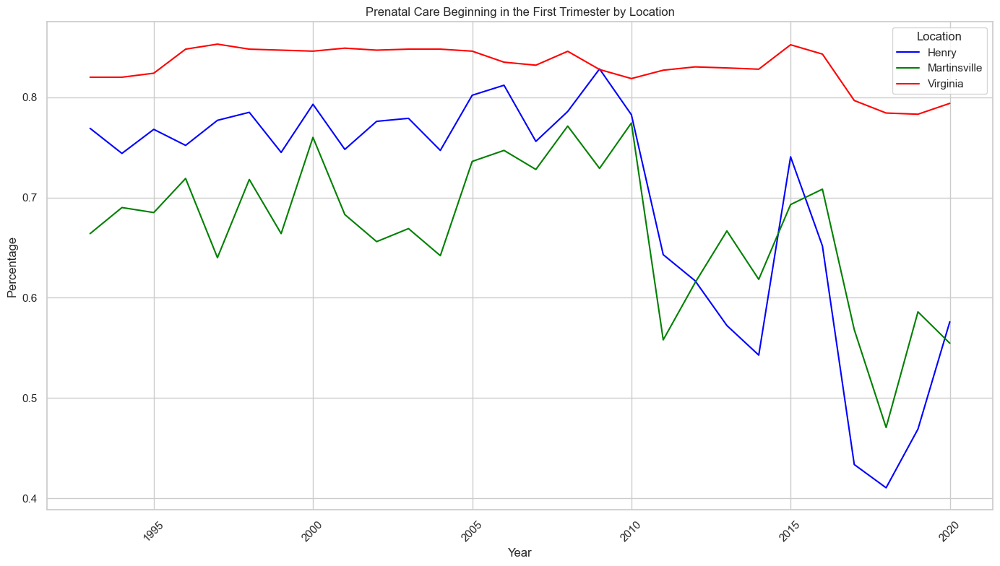

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\prenatal_care_beginning_in_the_first_trimester.csv'
data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations
locations = percent_data['Location'].unique()

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Initialize the plot for combined visualization
plt.figure(figsize=(14, 8))

# Plotting function for all locations
for location in locations:
    location_data = percent_data[percent_data['Location'] == location]
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, color=location_colors.get(location, 'black'), label=location)

plt.title('Prenatal Care Beginning in the First Trimester by Location')
plt.xlabel('Year')
plt.ylabel('Percentage')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Location')
plt.grid(True)
plt.show()


The graph displays the trends in the percentage of women receiving prenatal care in the first trimester across three locations: Henry, Martinsville, and Virginia, over a period from 1995 to around 2020. Here are the key findings from the graph:

General Trends:

Virginia (red line) shows the most stability and the highest percentage of prenatal care initiation in the first trimester, maintaining above 75% throughout the period, except for a slight dip around 2015-2020.
Henry (blue line) and Martinsville (green line) exhibit more fluctuations over the years, with notable peaks and troughs.
Comparative Analysis:

Henry generally trends below the state average but mirrors the state with its fluctuations, though the dips and rises are more pronounced.
Martinsville shows the most variability, with significant drops, especially notable around 2015, where the percentage plummeted to below 60% before recovering.
Significant Observations:

All locations show a sharp decline in the percentage of women receiving prenatal care in the first trimester around 2015, followed by a partial recovery.
The overall highest rates are consistently in Virginia, indicating statewide policies or healthcare access that supports early prenatal care might be more effective or consistent than in the individual smaller regions of Henry and Martinsville.
Implications:

The decline around 2015 across all regions could suggest external factors affecting healthcare access or changes in data collection/reporting methods.
The recovery post-2015 in Martinsville and the lesser extent in Henry might indicate targeted efforts or improvements in healthcare access or community health initiatives.
This data is crucial for understanding healthcare access and prenatal care trends, which are vital for maternal and infant health outcomes. The variability and trends could guide local health departments in assessing the effectiveness of their public health interventions and policies.

<a name="passage-rate-for-third-grade-reading-sol-by-economically-disadvantaged"></a>
### **Passage Rate for Third-Grade Reading Standards of Learning (SOL) by Students Who Are Economically Disadvantaged**

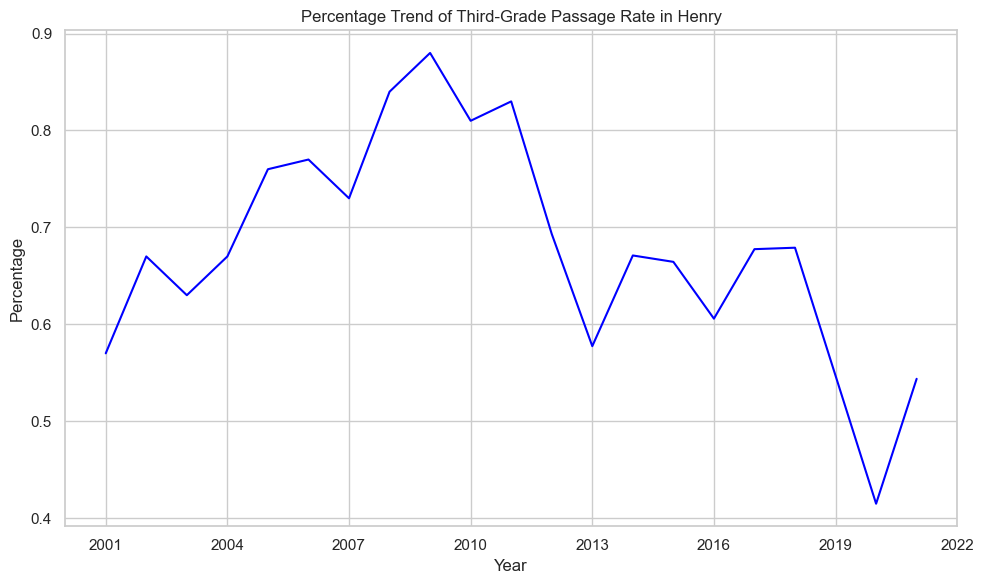

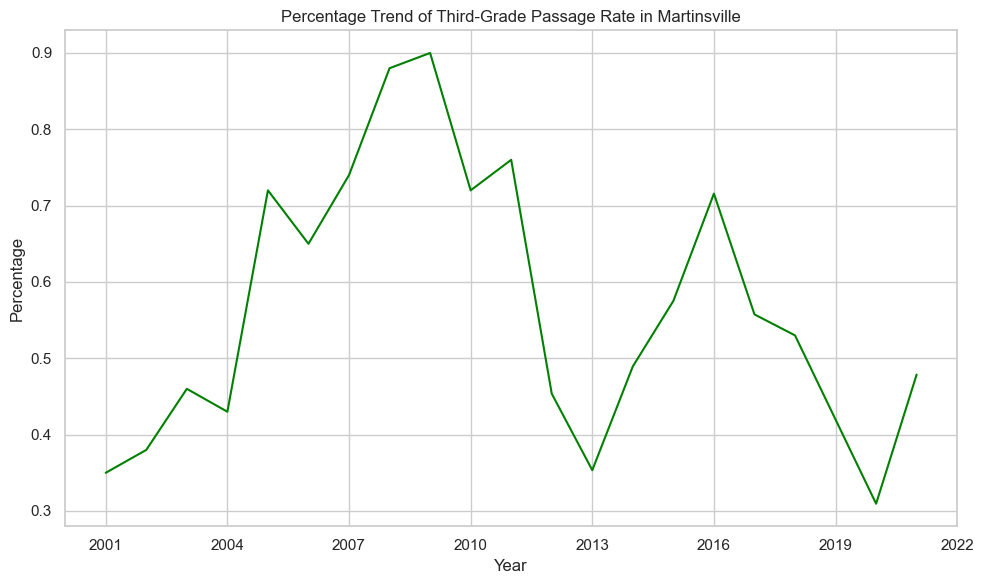

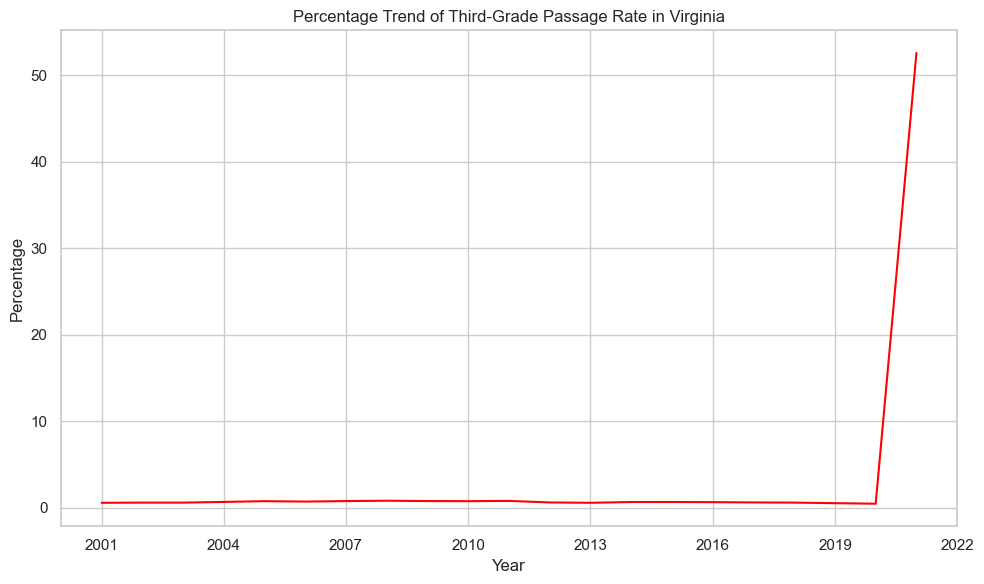

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\passage_rate_for_third-grade.csv'
data = pd.read_csv(file_path)

# Ensure 'TimeFrame' is treated as an integer
data['TimeFrame'] = data['TimeFrame'].astype(int)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations
locations = percent_data['Location'].unique()

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Create separate plots for each location
for location in locations:
    plt.figure(figsize=(10, 6))  # New figure for each location
    location_data = percent_data[percent_data['Location'] == location]

    ax = sns.lineplot(x='TimeFrame', y='Data', data=location_data, color=location_colors.get(location, 'black'))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Ensure x-axis ticks are integer

    plt.title(f'Percentage Trend of Third-Grade Passage Rate in {location}')
    plt.xlabel('Year')
    plt.ylabel('Percentage')
    plt.grid(True)
    plt.show()


General Trend: All three locations show fluctuations over the years with no consistent pattern of increase or decrease throughout the period.

Henry: This location displays a generally high passage rate, with peaks around 2007 and 2010, followed by significant dips, particularly a notable drop around 2016. The trend recovers somewhat after the dip but experiences a sharp decline towards the end of the period.

Martinsville: Initially, the trend in Martinsville shows a sharp increase, reaching its peak around 2007. Following this, there is a steep decline, then the rates fluctuate with sharp peaks and troughs. The passage rate peaks again around 2013 but shows a sharp decline by 2019, followed by a slight recovery in 2022.

Virginia (Statewide): The trend starts at a minimal point, almost zero, and remains flat until a sharp vertical rise in 2022, suggesting a possible data error, anomaly, or a change in reporting or testing standards in the most recent data.

Comparison: The trends in Henry and Martinsville show some similar patterns of peaks and troughs, although Martinsville's fluctuations are more pronounced compared to Henry. The trend for Virginia is distinctly different, particularly due to the abrupt spike in 2022.

The data suggest variability in educational outcomes in reading at the third-grade level, with local trends in Henry and Martinsville not always mirroring the state trend, especially considering the peculiar spike for Virginia in 2022. These observations could reflect changes in educational policies, reporting methods, or other external factors affecting student performance in these areas.

<a name="passage-rate-for-third-grade-reading-sol"></a>
### **Passage Rate for Third-Grade Reading Standards of Learning (SOL)**

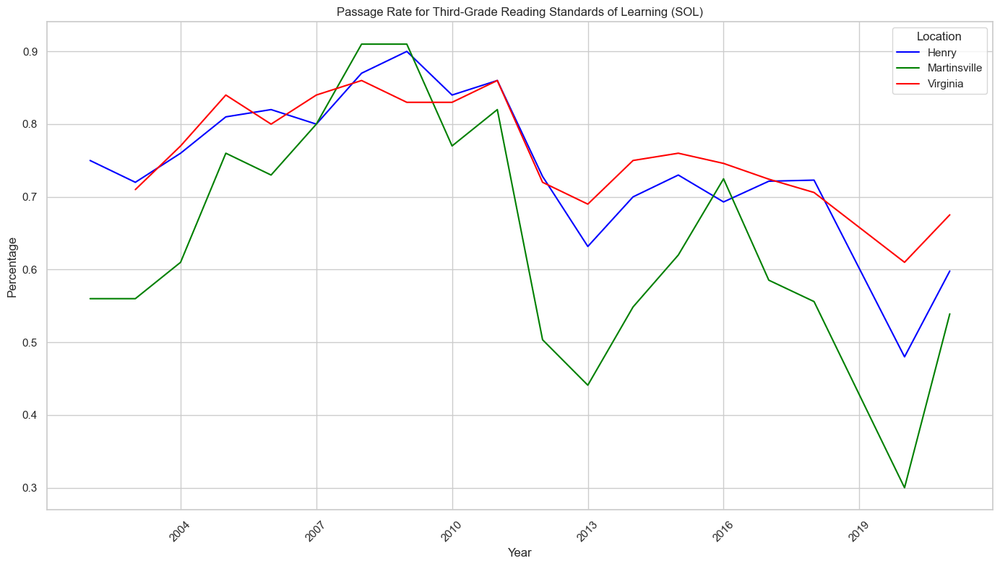

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

# Read data from CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\passage_rate_for_third-grade_stable.csv'
data = pd.read_csv(file_path)

# Convert 'Data' column to numeric, forcing errors to NaN (if any)
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Filter data for Percent only
percent_data = data[data['DataFormat'] == 'Percent']

# List of locations
locations = percent_data['Location'].unique()

# Define color palette for locations
location_colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Initialize the plot for combined visualization
plt.figure(figsize=(14, 8))

# Plotting function for all locations
for location in locations:
    location_data = percent_data[percent_data['Location'] == location]
    sns.lineplot(x='TimeFrame', y='Data', data=location_data, color=location_colors.get(location, 'black'), label=location)

# Set the x-axis to only display integers for year
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.title('Passage Rate for Third-Grade Reading Standards of Learning (SOL)')
plt.xlabel('Year')
plt.ylabel('Percentage')
plt.legend(title='Location')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.grid(True)
plt.show()


This line graph presents the passage rates for third-grade reading Standards of Learning (SOL) across three different locations: Henry, Martinsville, and Virginia as a whole, over a span of several years. Each line represents the passage rates within each respective area, showcasing trends and changes over time.

From the early 2000s, there is a visible improvement in all three locations, with a sharp rise in passage rates, indicating an effective enhancement in reading proficiency or educational interventions during this period. The graph peaks around 2010, whereafter it shows a significant dip around 2013, particularly in Martinsville, suggesting a potential educational challenge or change in standards or testing.

Post-2013, the passage rates exhibit fluctuations, but the general trend in Martinsville shows more pronounced volatility compared to Henry and Virginia overall, which may point to localized issues affecting education. The recent data, leading up to 2019, shows a recovery in passage rates, particularly notable in Martinsville, indicating potential successful interventions or adaptations to the earlier challenges.

This visual data is critical for educational stakeholders to analyze the effectiveness of reading programs and to implement targeted strategies for improvement in regions showing lagging performance.

<a name="martinsville-substance-use"></a>
### **Martinsville Substance Use**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\1991609289.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=top_5, x='Count', y='Drug Abuse Type', palette=colors)


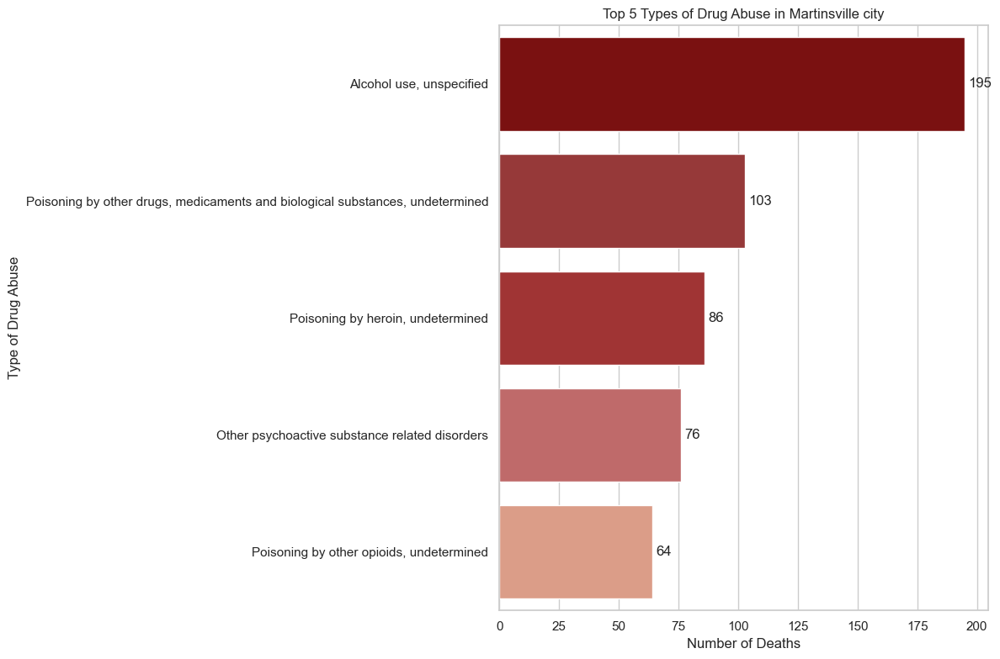

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\assesment\martinsville_substance_use.csv'
data = pd.read_csv(file_path)

# Analysis: Count of each type of drug abuse
drug_abuse_counts = data['Provider Primary Impression'].value_counts().reset_index()
drug_abuse_counts.columns = ['Drug Abuse Type', 'Count']

# Get the top 5 types of drug abuse
top_5 = drug_abuse_counts.nlargest(5, 'Count')

# Define a color gradient: darker red to lighter red
colors = ['#8B0000', '#A52A2A', '#B22222', '#CD5C5C', '#E9967A']  # Dark Red to Lighter Red

# Plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=top_5, x='Count', y='Drug Abuse Type', palette=colors)
plt.title('Top 5 Types of Drug Abuse in Martinsville city')
plt.xlabel('Number of Deaths')
plt.ylabel('Type of Drug Abuse')

# Add the numbers on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)

plt.show()


The bar chart details the leading causes of drug-related deaths in Martinsville city, illustrating a critical public health issue. Unspecified alcohol use is the most prevalent, with 195 deaths, indicating a significant challenge with alcohol abuse in the community. The second most common is poisoning by other drugs, medications, and biological substances, with 103 deaths, pointing to a wide array of substance abuse beyond typical narcotics.

Heroin poisoning follows closely with 86 fatalities, highlighting the opioid crisis's impact. Other psychoactive substance-related disorders account for 76 deaths, suggesting issues with a variety of drug types not specified in the other categories. Lastly, poisoning by other unspecified opioids has led to 64 deaths, reinforcing the continued struggle against opioid abuse. These statistics underscore the urgent need for comprehensive substance abuse prevention and treatment strategies in Martinsville to tackle these high rates of drug-related fatalities.

In [ ]:
from tabulate import tabulate

# Extract top 5 types of drug abuse as identified earlier
top_5_types = top_5['Drug Abuse Type'].tolist()

# Splitting and exploding the 'Medication Given with Response to Medication' column
data['Medications'] = data['Medication Given with Response to Medication'].str.split('|')
data_exploded = data.explode('Medications')

# Filter the exploded data for only the top 5 drug abuse types
filtered_data = data_exploded[data_exploded['Provider Primary Impression'].isin(top_5_types)]

# Get the most common medication for each drug abuse type
common_meds = filtered_data.groupby('Provider Primary Impression')['Medications'].apply(lambda x: x.mode()[0] if not x.mode().empty else 'No medication')
common_meds_df = common_meds.reset_index()
common_meds_df.columns = ['Drug Abuse Type', 'Most Common Medication']

# Display the table using tabulate
print(tabulate(common_meds_df, headers='keys', tablefmt='pretty'))


+---+-------------------------------------------------------------------------------+----------------------------------------------------------------+
|   |                                Drug Abuse Type                                |                     Most Common Medication                     |
+---+-------------------------------------------------------------------------------+----------------------------------------------------------------+
| 0 |                           Alcohol use, unspecified                            | RXNORM or SNOMED code type not specified with Unknown response |
| 1 |                Other psychoactive substance related disorders                 |                naloxone with Improved response                 |
| 2 |                       Poisoning by heroin, undetermined                       |                naloxone with Improved response                 |
| 3 | Poisoning by other drugs, medicaments and biological substances, undetermined |         

<a name="henry-substance-use"></a>
### **Henry Substance Use**

C:\Users\ashwi\AppData\Local\Temp\ipykernel_27636\150229179.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=top_5_hc, x='Count', y='Drug Abuse Type', palette=colors)


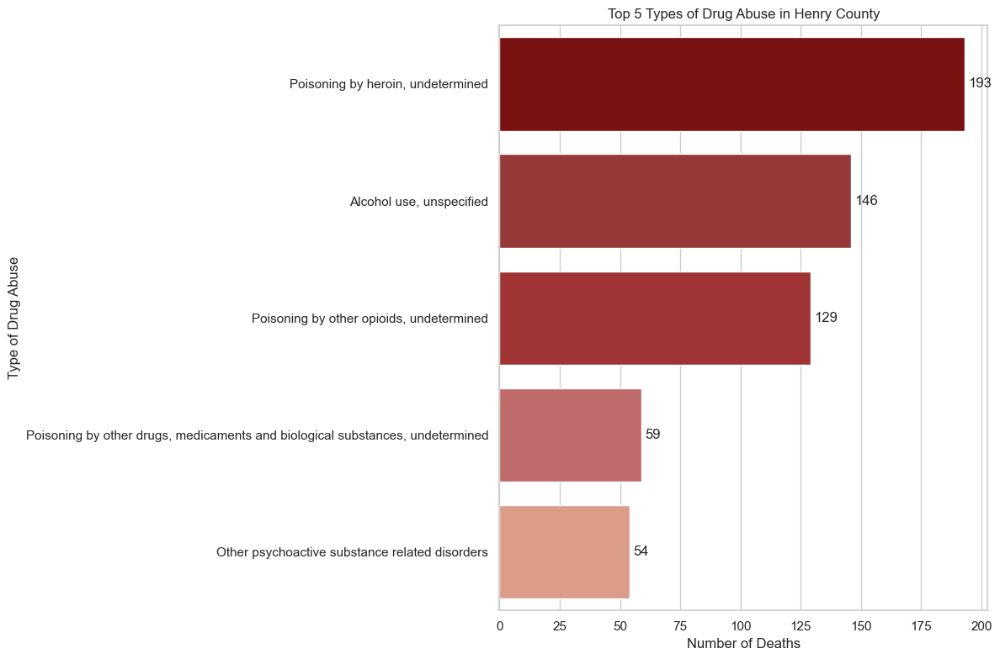

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\hc_substance_use.csv'
data = pd.read_csv(file_path)

# Analysis: Count of each type of drug abuse
drug_abuse_counts = data['Provider Primary Impression'].value_counts().reset_index()
drug_abuse_counts.columns = ['Drug Abuse Type', 'Count']

# Get the top 5 types of drug abuse
top_5_hc = drug_abuse_counts.nlargest(5, 'Count')

# Define a color gradient: darker red to lighter red
colors = ['#8B0000', '#A52A2A', '#B22222', '#CD5C5C', '#E9967A']  # Dark Red to Lighter Red

# Plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=top_5_hc, x='Count', y='Drug Abuse Type', palette=colors)
plt.title('Top 5 Types of Drug Abuse in Henry County')
plt.xlabel('Number of Deaths')
plt.ylabel('Type of Drug Abuse')

# Add the numbers on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)

plt.show()


The bar graph presents the top five types of drug abuse leading to fatalities in Henry County. The most prevalent cause is poisoning by heroin, accounting for 193 deaths, underscoring a significant opioid crisis in the area. Following closely, unspecified alcohol use resulted in 146 deaths, indicating substantial issues with alcohol abuse. Poisoning by other opioids, which is also undetermined, contributed to 129 deaths, reinforcing the opioid-related challenges the community faces.

Additionally, poisoning by other drugs, medications, and biological substances, though unspecified, caused 59 deaths. Lastly, other psychoactive substance-related disorders led to 54 fatalities. These figures highlight a critical need for targeted interventions and enhanced drug prevention strategies in Henry County to address the varied and pervasive nature of substance abuse issues.

In [ ]:
from tabulate import tabulate

# Extract top 5 types of drug abuse as identified earlier
top_5_types_hc = top_5_hc['Drug Abuse Type'].tolist()

# Splitting and exploding the 'Medication Given with Response to Medication' column
data['Medications'] = data['Medication Given with Response to Medication'].str.split('|')
data_exploded = data.explode('Medications')

# Filter the exploded data for only the top 5 drug abuse types
filtered_data = data_exploded[data_exploded['Provider Primary Impression'].isin(top_5_types_hc)]

# Get the most common medication for each drug abuse type
common_meds = filtered_data.groupby('Provider Primary Impression')['Medications'].apply(lambda x: x.mode()[0] if not x.mode().empty else 'No medication')
common_meds_df = common_meds.reset_index()
common_meds_df.columns = ['Drug Abuse Type', 'Most Common Medication']

# Display the table using tabulate
print(tabulate(common_meds_df, headers='keys', tablefmt='pretty'))


+---+-------------------------------------------------------------------------------+----------------------------------------------------------------+
|   |                                Drug Abuse Type                                |                     Most Common Medication                     |
+---+-------------------------------------------------------------------------------+----------------------------------------------------------------+
| 0 |                           Alcohol use, unspecified                            | RXNORM or SNOMED code type not specified with Unknown response |
| 1 |                Other psychoactive substance related disorders                 |                naloxone with Improved response                 |
| 2 |                       Poisoning by heroin, undetermined                       |                naloxone with Improved response                 |
| 3 | Poisoning by other drugs, medicaments and biological substances, undetermined |         

<a name="low-income-children-under-age-19-without-health-insurance"></a>
### **Low Income Children Under Age 19 Without Health Insurance**

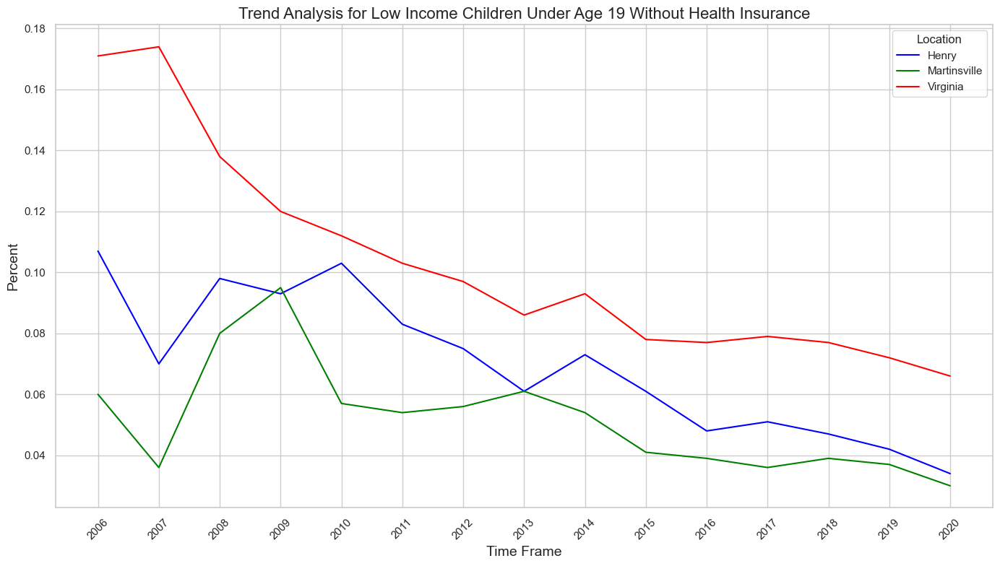

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from a CSV file
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\low_income_children_under_age_19_without_health_insurance.csv"
data = pd.read_csv(file_path)

# Filter data for Percent DataFormat
data_percent = data[data['DataFormat'] == 'Percent'].copy()

# Ensure 'TimeFrame' is of string type
data_percent['TimeFrame'] = data_percent['TimeFrame'].astype(str)

# Plotting
sns.set(style="whitegrid")
plt.figure(figsize=(14, 8))  # Define the figure size

# Define colors for each location
colors = {
    'Henry': 'blue',
    'Martinsville': 'green',
    'Virginia': 'red'
}

# Plotting function for each location on the same graph
for location in ['Henry', 'Martinsville', 'Virginia']:
    sns.lineplot(data=data_percent[data_percent['Location'] == location],
                 x='TimeFrame', y='Data',
                 label=location, color=colors[location])

plt.title('Trend Analysis for Low Income Children Under Age 19 Without Health Insurance', fontsize=16)
plt.xlabel('Time Frame', fontsize=14)
plt.ylabel('Percent', fontsize=14)
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Location')  # Add a legend to identify each line
plt.show()


The line graph delineates the trend of low-income children under the age of 19 without health insurance across Virginia, Henry, and Martinsville from 2006 to 2020. Key insights include:

Virginia shows a steady decline in the percentage of uninsured low-income children, indicating improvements in state-level policies or programs aimed at increasing healthcare access for vulnerable populations.

Martinsville started with the highest rate of uninsured children but exhibits a notable reduction over time, aligning closer to the state's average by 2020. This suggests effective localized interventions or increased utilization of state and federal health resources.

Henry, while starting at lower levels compared to Martinsville, shows fluctuations with a more marked decline post-2013, stabilizing towards the end of the period observed. The fluctuations might be reflective of economic changes impacting insurance coverage rates among low-income families.

Overall, the graph underscores a positive trend towards reducing the number of uninsured low-income children, with local and state efforts contributing to broader improvements in healthcare access. This trend is crucial for ensuring better health outcomes and reducing long-term healthcare costs by addressing needs early in life.

In [ ]:
import pandas as pd

# Load the data from the CSV file
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\low_income_children_under_age_19_without_health_insurance.csv"
data = pd.read_csv(file_path)

# Filter the data to include only the rows where DataFormat is 'Number'
filtered_data = data[data['DataFormat'] == 'Number']

# Pivot the table
pivot_table = filtered_data.pivot(index='TimeFrame', columns='Location', values='Data')

# Convert the data to integers to remove decimal points
pivot_table = pivot_table.map(lambda x: int(x) if not pd.isnull(x) else x)

# Display the table
print(pivot_table)

Location   Henry  Martinsville  Virginia
TimeFrame                               
2006         659           120    108836
2007         429            71    108940
2008         639           150     83896
2009         618           198     76304
2010         736           118     73337
2011         596           111     69276
2012         534           119     65267
2013         422           132     57886
2014         479           117     62032
2015         393            87     50269
2016         299            78     48166
2017         298            74     48328
2018         279            79     46780
2019         234            73     42045
2020         182            58     36360


<a name="low-birthweight-babies"></a>
### **Low Birthweight Babies**

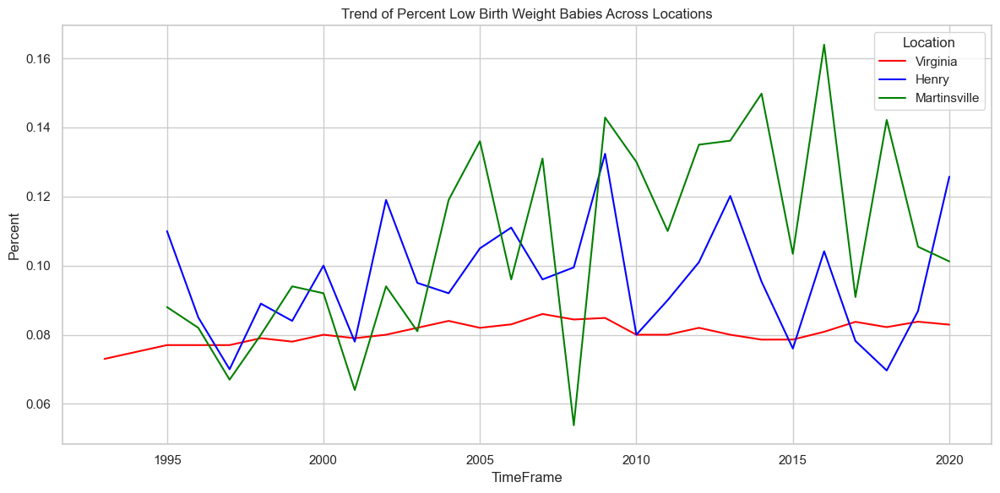

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\low__birthweigh_babies.csv"
data = pd.read_csv(file_path)

# Filter out 'N/A' values
data = data[data['DataFormat'] == 'Percent']

# Convert 'Data' column to numeric, errors='coerce' will turn non-numeric values to NaN
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Drop rows where 'Data' is NaN
data = data.dropna(subset=['Data'])

# Set up the color palette
colors = {'Henry': 'blue', 'Martinsville': 'green', 'Virginia': 'red'}

# Initialize one figure for all plots
plt.figure(figsize=(12, 6))

# Create a plot for each location
for location in data['Location'].unique():
    subset = data[data['Location'] == location]
    sns.lineplot(data=subset, x='TimeFrame', y='Data', label=location, color=colors[location])

# Add titles and labels
plt.title('Trend of Percent Low Birth Weight Babies Across Locations')
plt.xlabel('TimeFrame')
plt.ylabel('Percent')
plt.legend(title='Location')
plt.grid(True)

# Show the plot
plt.show()


The line graph traces the percentage of low birth weight babies in Virginia, Henry, and Martinsville from 1995 to 2020. Notable observations include:

Virginia exhibits the most stable trend, maintaining a relatively low and consistent rate of low birth weight babies, oscillating slightly around 0.08%. This indicates a generally effective statewide health system managing prenatal and maternal health.

Henry displays greater volatility with peaks and troughs more pronounced than Virginia, indicating potential fluctuations in healthcare access or quality over the years. The peaks could suggest periods of reduced healthcare support or increased health risks among pregnant individuals.

Martinsville shows the most variability and highest rates, with percentages rising sharply at times, peaking well above those observed in Henry and the state. This could reflect localized challenges such as economic conditions, access to healthcare, or other socio-economic factors impacting maternal and infant health.

Overall, the data underscores the significance of localized healthcare interventions and the impact of socio-economic conditions on maternal and child health. While state trends provide a baseline, the individual spikes in Martinsville and Henry highlight the need for targeted healthcare policies and programs to address these disparities effectively.

In [ ]:
import pandas as pd

# Load the data from the CSV file
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\low__birthweigh_babies.csv"
data = pd.read_csv(file_path)

# Filter the data to include only the rows where DataFormat is 'Number'
filtered_data = data[data['DataFormat'] == 'Number']

# Pivot the table
pivot_table = filtered_data.pivot(index='TimeFrame', columns='Location', values='Data')

# Convert the data to integers to remove decimal points
pivot_table = pivot_table.map(lambda x: int(x) if not pd.isnull(x) else x)

# Display the table
print(pivot_table)

Location   Henry  Martinsville  Virginia
TimeFrame                               
1997          45            12      7081
1998          51            17      7479
1999          51            21      7416
2000          64            21      7886
2001          48            13      7816
2002          73            17      7904
2003          58            12      8278
2004          55            19      8674
2005          67            19      8594
2006          77            14      8883
2007          60            28      9344
2008          59            12      8996
2009          74            29      8908
2010          42            30      8487
2011          43            28      8204
2012          49            27      8391
2013          59            29      8178
2014          39            31      8078
2015          33            27      8099
2016          50            30      8266
2017          33            16      8341
2018          28            29      8203
2019          35

<a name="k-3-repeated"></a>
### **K-3 Repeated**

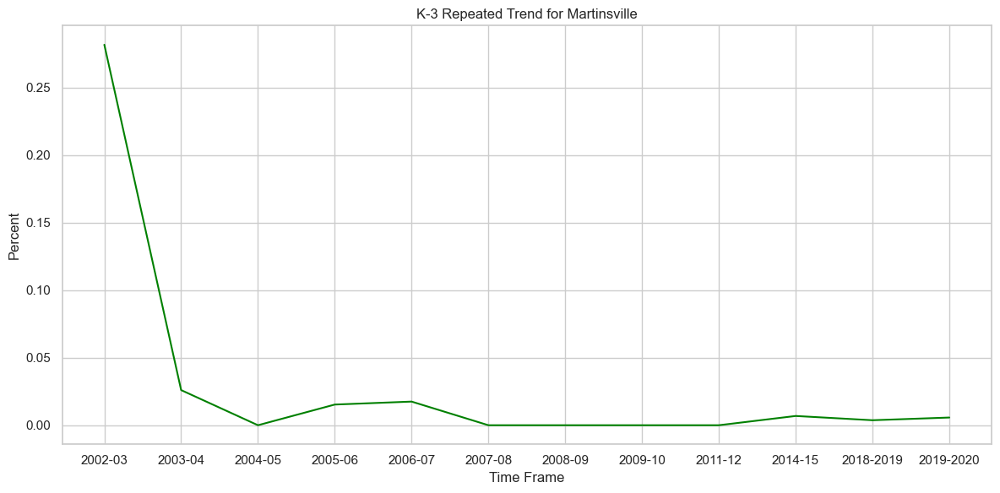

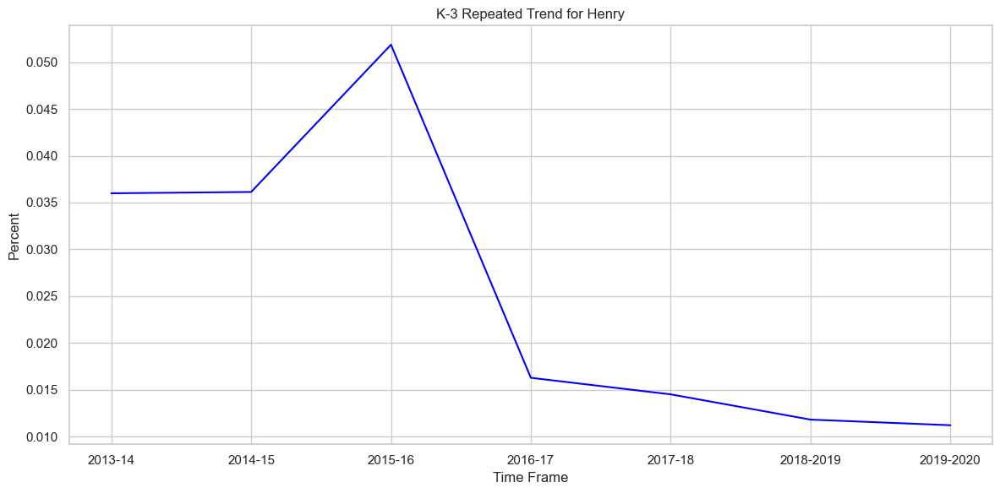

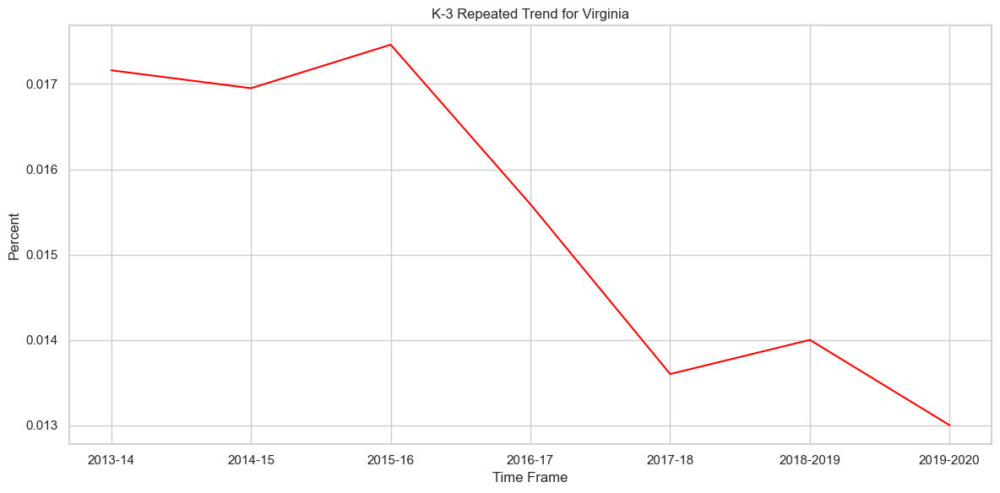

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\K3_repeated.csv"
data = pd.read_csv(file_path)

# Filter out rows where 'Data' is '<10' or 'N/A'
data = data[~data['Data'].str.contains('<10', na=False)]
data = data[data['DataFormat'] == 'Percent']

# Convert 'Data' column to numeric, errors='coerce' will turn non-numeric values to NaN
data['Data'] = pd.to_numeric(data['Data'], errors='coerce')

# Drop rows where 'Data' is NaN
data = data.dropna(subset=['Data'])

# Clean 'TimeFrame' column
data['TimeFrame'] = data['TimeFrame'].str.replace('AY ', '').str.replace(' ', '')

# Set up the color palette
colors = {'Henry': 'blue', 'Martinsville': 'green', 'Virginia': 'red'}

# Create a separate plot for each location
for location in data['Location'].unique():
    plt.figure(figsize=(12, 6))  # New figure for each location
    subset = data[data['Location'] == location]
    sns.lineplot(data=subset, x='TimeFrame', y='Data', color=colors[location])

    # Add titles and labels
    plt.title(f'K-3 Repeated Trend for {location}')
    plt.xlabel('Time Frame')
    plt.ylabel('Percent')
    plt.grid(True)
    plt.show()


Martinsville shows a significant decline in K-3 repetition rates from 2002 to 2003 and maintains a relatively stable and low rate from 2004 onwards, hovering around 0.05% or less. This suggests successful early interventions or educational policies implemented to keep repetition rates low.

Henry has data starting from 2013, showing an initially stable rate which spikes dramatically in 2015-16 to about 0.045%, before decreasing sharply and continuing to trend downwards through 2020. This peak and subsequent decline could indicate temporary challenges or changes in educational approaches that were effectively addressed.

Virginia overall shows a decreasing trend in K-3 repetition rates starting from 2013, with a slight increase around 2017-18 before continuing to decline. The state-wide trend suggests effective ongoing efforts to reduce the necessity for young students to repeat grades.

<a name="infant-mortality-rate"></a>
### **Infant Mortality Rate**

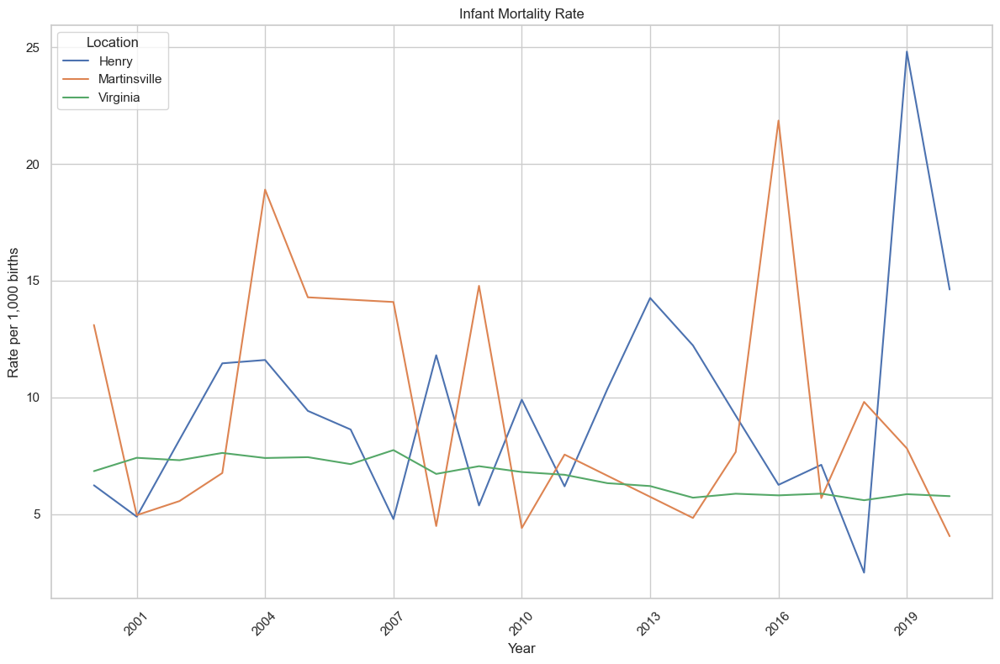

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from a CSV file
file_path = r'C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\infant_mortality_1000.csv'
data = pd.read_csv(file_path)

# Data cleaning function
def clean_data(value):
    try:
        return float(value)
    except ValueError:
        return 0

# Clean the 'Data' column
data['Data'] = data['Data'].apply(clean_data)

# Filter out rows where 'Data' is 0
data = data[data['Data'] != 0]

# Ensure TimeFrame is an integer
data['TimeFrame'] = data['TimeFrame'].astype(int)

# Set aesthetic preferences
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 10, 'figure.autolayout': True})

# Data formats to plot
data_formats = ['Rate per 1,000 births']

# Create a plot for each data format with all locations in one chart
for data_format in data_formats:
    plt.figure(figsize=(12, 8))
    for location in data['Location'].unique():
        # Filter data for the current location and data format
        format_data = data[(data['Location'] == location) & (data['DataFormat'] == data_format)]
        sns.lineplot(x='TimeFrame', y='Data', data=format_data, label=location)

    plt.title(f'Infant Mortality Rate')
    plt.xlabel('Year')
    plt.ylabel(data_format)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))  # Ensure x-axis has integer values only
    plt.legend(title='Location')
    plt.grid(True)
    plt.show()


Henry County shows fluctuating rates with spikes in certain years, notably in the mid-2000s and again in 2016. The rate varies significantly, sometimes aligning closely with state averages but occasionally diverging sharply.

Martinsville City displays more pronounced fluctuations with very high peaks, particularly around 2005 and 2016, where the rates dramatically exceed both the county and the state. The volatility in Martinsville's data suggests localized issues that might be influencing these spikes.

Virginia (state average) maintains a relatively stable and lower rate throughout the period compared to the more localized data of Henry and Martinsville, with fewer and less severe fluctuations.

In [ ]:
import pandas as pd

# Load the data from the CSV file
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\infant_mortality.csv"
data = pd.read_csv(file_path)

# Filter the data to include only the rows where DataFormat is 'Number'
filtered_data = data[data['DataFormat'] == 'Number']

# Pivot the table
pivot_table = filtered_data.pivot(index='TimeFrame', columns='Location', values='Data')

# Display the table
print(pivot_table)




Location   Henry  Martinsville  Virginia
TimeFrame                               
2006       659.0         120.0  108836.0
2007       429.0          71.0  108940.0
2008       639.0         150.0   83896.0
2009       618.0         198.0   76304.0
2010       736.0         118.0   73337.0
2011       596.0         111.0   69276.0
2012       534.0         119.0   65267.0
2013       422.0         132.0   57886.0
2014       479.0         117.0   62032.0
2015       393.0          87.0   50269.0
2016       299.0          78.0   48166.0
2017       298.0          74.0   48328.0
2018       279.0          79.0   46780.0
2019       234.0          73.0   42045.0
2020       182.0          58.0   36360.0


<a name="graduation-rates-mhc"></a>
### **Graduation Rates MHC**

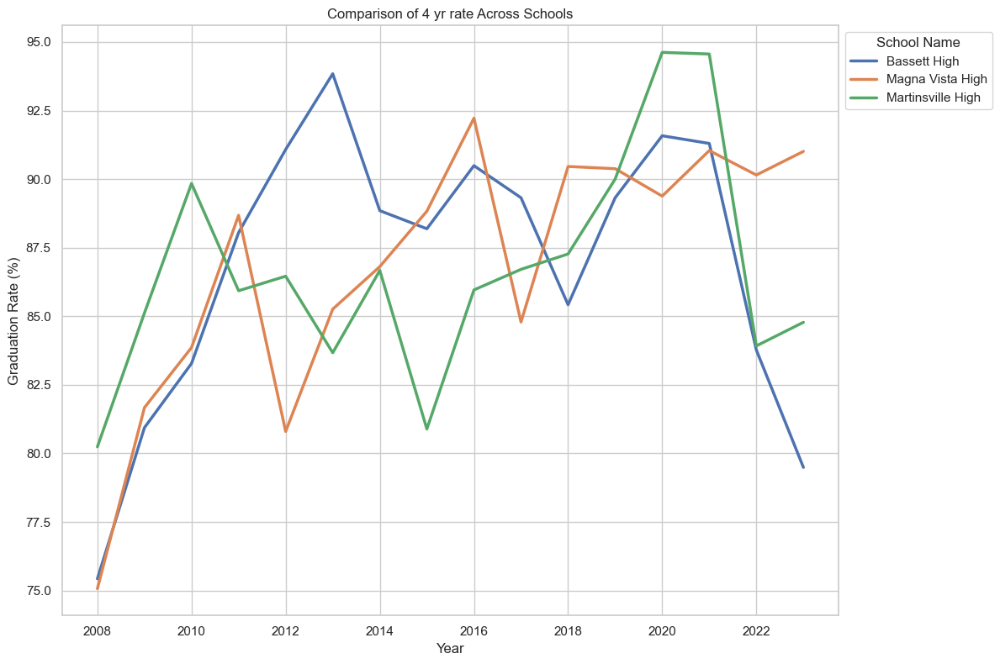

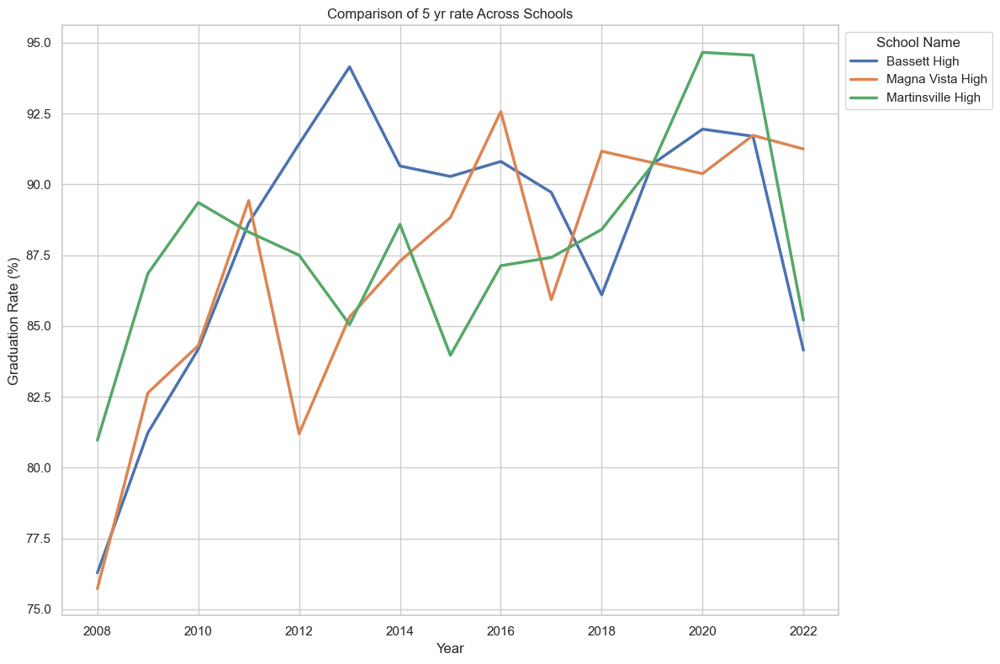

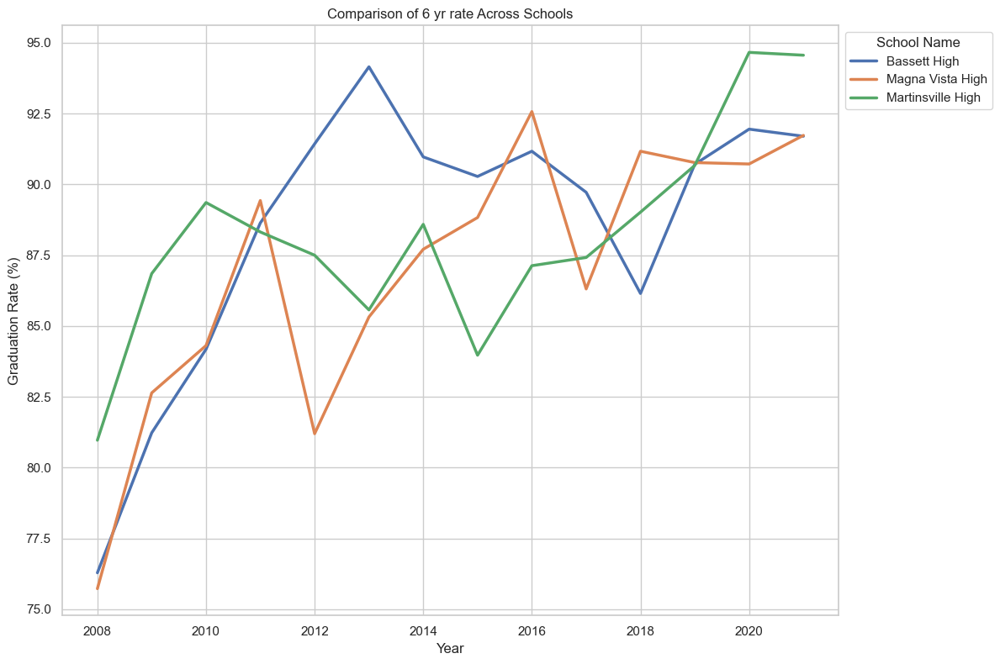

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Load the data from CSV
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\graduation_stats_mhc.csv"
data = pd.read_csv(file_path)

# Ignore specific FutureWarnings from seaborn and pandas interaction
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Clean and format the graduation rate data
data['Graduation Rate'] = data['Graduation Rate'].str.replace('%', '').astype(float)

# Extracting unique rate types and years for plotting
rate_types = ['4 yr rate', '5 yr rate', '6 yr rate']

# Create a plot for each rate type
for rate_type in rate_types:
    plt.figure(figsize=(12, 8))

    # Filter data by Rate Type
    filtered_data = data[data['Rate Type'] == rate_type]

    # Use seaborn to create a line plot for each school's rate type
    sns.lineplot(data=filtered_data, x='Cohort Year', y='Graduation Rate', hue='School Name', dashes=False, linewidth=2.5)

    plt.title(f'Comparison of {rate_type} Across Schools')
    plt.xlabel('Year')
    plt.ylabel('Graduation Rate (%)')
    # Place the legend outside the plot area
    plt.legend(title='School Name', loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid(True)
    plt.show()


Bassett High consistently shows an upward trend in graduation rates across the different time spans, indicating improvements in student retention and completion over the years.

Magna Vista High displays considerable fluctuations in graduation rates but generally maintains a higher graduation rate compared to the initial years. The 6-year rate shows significant improvement towards the later years, suggesting that while immediate graduation rates might be lower, many students complete their education eventually.

Martinsville High exhibits the most variability in graduation rates among the three schools. While there are periods of decline, particularly in the 4-year rate, the extended 5-year and 6-year rates recover, indicating that a significant number of students who do not graduate on time tend to complete their education within an additional year or two.

<a name="drop-out-rate-mhc"></a>
### **Drop Out Rate MHC**

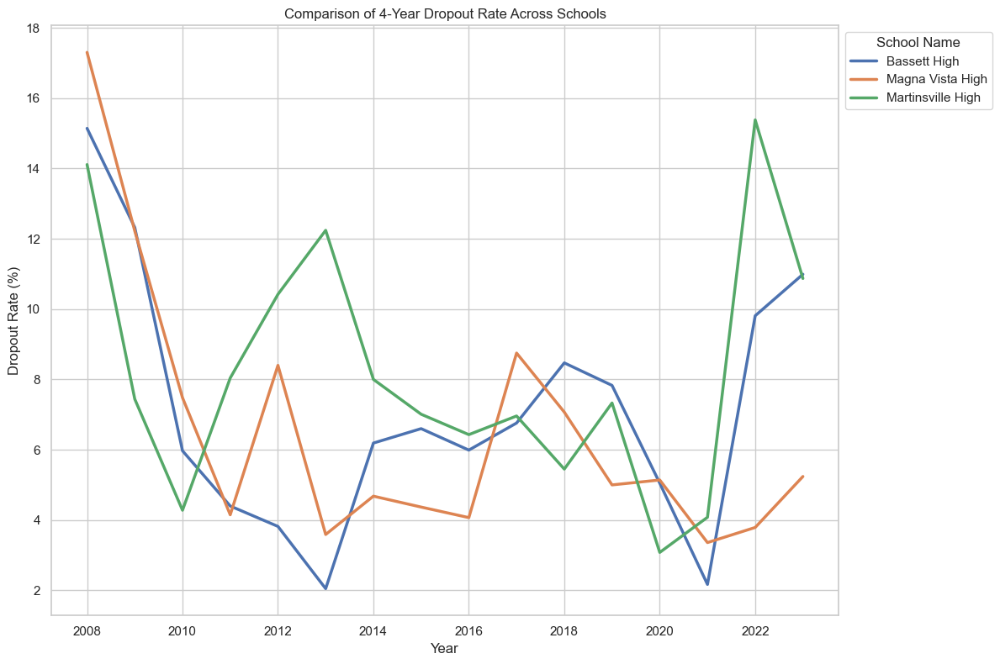

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Load the data from CSV
file_path = r"C:\Users\ashwi\OneDrive\Desktop\HARVEST_FOUNDATION_PROJECT\DATA\county\graduation_stats_mhc.csv"
data = pd.read_csv(file_path)

# Ignore specific FutureWarnings from seaborn and pandas interaction
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Prepare the 'Dropout Rate' column by removing '%' and handling non-convertible strings
data['Dropout Rate'] = (
    data['Dropout Rate'].str.replace('%', '')
    .apply(lambda x: pd.to_numeric(x, errors='coerce'))
)

# Extracting unique years for plotting
years = data['Cohort Year'].unique()

# Filter data by 4-year rate and where Dropout Rate is not NaN
filtered_dropout_data = data[(data['Rate Type'] == '4 yr rate') & data['Dropout Rate'].notna()]

# Plotting Dropout Rate for 4-year rate
plt.figure(figsize=(12, 8))
sns.lineplot(data=filtered_dropout_data, x='Cohort Year', y='Dropout Rate', hue='School Name', dashes=False, linewidth=2.5)
plt.title('Comparison of 4-Year Dropout Rate Across Schools')
plt.xlabel('Year')
plt.ylabel('Dropout Rate (%)')
plt.legend(title='School Name', loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


Bassett High shows a significant reduction in dropout rates from over 16% in 2008 to below 6% by 2022, with notable fluctuations between these years but a general downward trend.

Magna Vista High experiences more volatility in dropout rates, starting at around 12% in 2008, peaking at nearly 14% around 2016, and dramatically decreasing thereafter. However, there's a sharp increase again around 2022.

Martinsville High has the most pronounced fluctuations, with rates initially decreasing until 2010, then a sharp increase, followed by dramatic ups and downs. The rate peaks at around 12% in 2022, indicating a recent worsening of dropout incidents.